# Simulacao leitos - camas limitadas

In [45]:
# Import required modules

import simpy
import random
from random import expovariate, seed
import math
import pandas as pd
import matplotlib.pyplot as plt
import gspread
from oauth2client.service_account import ServiceAccountCredentials
import numpy as np

## leitos

In [46]:
beds_data = pd.read_csv('cnes_leitos.csv', sep = ';')

In [47]:
beds_data.columns

Index(['CNES', 'IBGE', 'leito_sus_cirurgicos', 'leito_sus_clinicos',
       'leito_sus_gineco_obs', 'leito_sus_isolamento', 'leito_sus_outrasespec',
       'leito_sus_pediatricos', 'leito_sus_uci', 'leito_sus_uti'],
      dtype='object')

In [48]:
beds_data.head()

,CNES,IBGE,leito_sus_cirurgicos,leito_sus_clinicos,leito_sus_gineco_obs,leito_sus_isolamento,leito_sus_outrasespec,leito_sus_pediatricos,leito_sus_uci,leito_sus_uti
0,2516500,110001,0,0,0,0,0,0,0,0
1,2679477,110001,6,21,8,2,0,8,0,0
2,2494280,110002,0,0,0,1,0,30,0,0
3,2494299,110002,16,21,27,0,2,1,0,0
4,2515504,110002,0,0,0,0,0,0,0,0


In [49]:
beds_data['total_beds_uci'] = beds_data['leito_sus_uci'] + beds_data['leito_sus_uti']

In [50]:
normal_beds_sum = ['leito_sus_cirurgicos', 'leito_sus_clinicos', 
                   'leito_sus_isolamento', 'leito_sus_outrasespec',
                   'leito_sus_pediatricos']

In [51]:
beds_data['total_beds'] = beds_data[normal_beds_sum].sum(axis=1)

In [52]:
code = 355030
beds_data_filtered = beds_data[beds_data['IBGE'] == code]

In [53]:
beds_simulation = beds_data_filtered[['total_beds', 'total_beds_uci']].sum(axis=0)
beds_simulation


total_beds        12222
total_beds_uci     2421
dtype: int64

In [54]:
beds_simulation[0], int(beds_simulation[0]*(1-0.8))

(12222, 2444)

In [55]:
beds_simulation[1], int(beds_simulation[1]*(1-0.8))

(2421, 484)

In [56]:
def novosLeitos(code):
    
    scope = ["https://spreadsheets.google.com/feeds",'https://www.googleapis.com/auth/spreadsheets',"https://www.googleapis.com/auth/drive.file","https://www.googleapis.com/auth/drive"]

    creds = ServiceAccountCredentials.from_json_keyfile_name("creds.json", scope)
    client = gspread.authorize(creds)

    sheet = client.open("Novos Leitos").sheet1  # Open the spreadhseet
    data = sheet.get_all_records()  # Get a list of all records

    col1 = sheet.col_values(2)[1:]  # Get a specific row
    col2 = sheet.col_values(5)[1:]  # Get a specific column
    col3 = sheet.col_values(9)[1:]  # Get a specific column

    col1 = np.array(col1)
    col2 = np.array(col2)
    col3 = np.array(col3)

    col1 = [int(numeric_string) for numeric_string in col1]
    col2 = [int(numeric_string) for numeric_string in col2]
    col3 = [int(numeric_string) for numeric_string in col3]

    col1 = np.array(col1)

    bool = (col1==code)

    novos_Leitos = np.sum(col2*bool)
    novos_Leitos_ICU = np.sum(col3*bool)

    return novos_Leitos, novos_Leitos_ICU

In [57]:
#new, new_ICU = novosLeitos(code)
#beds_new = beds_simulation[0] + new
#beds_new_ICU = beds_simulation[1] + new_ICU

In [58]:
#beds_new

In [59]:
#beds_new_ICU

## infectados

In [60]:
covid_data = pd.read_csv('seir_output_1.csv')

In [61]:
covid_data.head()

,Unnamed: 0,infectados,hospitalizados
0,0,1.0,1.0
1,1,1.0,1.0
2,2,1.0,1.0
3,3,1.0,1.0
4,4,1.0,1.0


In [62]:
covid_data.shape[0]

200

# SIMULATION

In [63]:
class g:
    """g holds Global variables. No individual instance is required"""
    
    has_covid = 1
    covid_cases = covid_data
    cases_arriving = 1

    
    inter_arrival_time = 1/cases_arriving  # Average time (hours) between arrivals
    los = 8 # Average length of stay in hospital (hours)
    los_uti = 7 # Average length of stay in hospital (hours)
    
    los_covid = 10 # Average length of stay in hospital (hours)
    los_covid_uti = 7
    
    sim_duration = 70#covid_data.shape[0] # Duration of simulation (hours)
    audit_interval = 1  # Interval between audits (hours)
    
    total_beds = 12222
    total_beds_icu = 4241
    occupation_rate = 0.8
    icu_occupation_rate = 0.8
    
    icu_rate = 0.1
    icu_after_bed = 0.115
    
    beds = int(total_beds * occupation_rate)  # beds available
    #beds = int(total_beds)  # beds available
    icu_beds = int(total_beds_icu * (icu_occupation_rate)) # icu beds available
    ##icu_beds = int(total_beds_icu) # icu beds available

In [64]:
class Hospital:
    """
    Hospital class holds:
    1) Dictionary of patients present
    2) List of audit times
    3) List of beds occupied at each audit time
    4) Current total beds occupied
    5) Current total icu beds occupied
    6) Admissions to data

    Methods:

    __init__: Set up hospital instance

    audit: records number of beds occupied

    build_audit_report: builds audit report at end of run (calculate 5th, 50th
    and 95th percentile bed occupancy.

    chart: plot beds occupied over time (at end of run)
    """

    def __init__(self):
        """
        Constructor method for hospital class"
        Initialise object with attributes.
        """

        self.patients = {}  # Dictionary of patients present
        self.patients_in_queue = {}
        self.patients_in_icu_queue = {}
        
        self.patients_in_beds = {}
        self.patients_in_icu_beds = {}
        
        self.audit_time = []  # List of audit times
        self.audit_beds = []  # List of beds occupied at each audit time
        self.audit_icu_beds = []  # List of icu beds occupied at each audit time
        self.audit_queue = []
        self.audit_icu_queue = []
        
        self.audit_admissions = []
        self.audit_releases = []
        self.audit_releases_ICU = []
        self.audit_bedToICU = []
        self.audit_ICUToBed = []
        self.audit_admissions_normal_bed = [] # Also counts patients coming from ICU
        self.audit_admissions_icu = []
        
        self.bed_count = 0  # Current total beds occupied
        self.bed_icu_count = 0
        self.queue_count = 0
        self.queue_icu_count = 0
        self.admissions = 0  # Admissions to data
        
    
        self.releases = 0
        self.releases_ICU = 0
        self.bedToICU = 0
        self.ICUToBed = 0
        self.admissions_normal_bed = 0 # Also counts patients coming from ICU
        self.admissions_icu = 0
        
        return

    def audit(self, time):
        """
        Audit method. When called appends current simulation time to audit_time
        list, and appends current bed count to audit_beds.
        """
        self.audit_time.append(time)
        self.audit_beds.append(self.bed_count)
        self.audit_icu_beds.append(self.bed_icu_count)
        self.audit_queue.append(self.queue_count)
        self.audit_icu_queue.append(self.queue_icu_count)
        
        self.audit_admissions.append(self.admissions)
        self.audit_releases.append(self.releases)
        self.audit_releases_ICU.append(self.releases_ICU)
        self.audit_bedToICU.append(self.bedToICU)
        self.audit_ICUToBed.append(self.ICUToBed)
        self.audit_admissions_normal_bed.append(self.admissions_normal_bed)
        self.audit_admissions_icu.append(self.admissions_icu)
        
        return

    def build_audit_report(self):
        """
        This method is called at end of run. It creates a pandas DataFrame,
        transfers audit times and bed counts to the DataFrame, and 
        calculates/stores 5th, 50th and 95th percentiles.
        """
        self.audit_report = pd.DataFrame()

        self.audit_report['Time'] = self.audit_time

        self.audit_report['Occupied_beds'] = self.audit_beds
        
        self.audit_report['ICU_Occupied_beds'] = self.audit_icu_beds

        self.audit_report['Median_beds'] = \
            self.audit_report['Occupied_beds'].quantile(0.5)
        
        self.audit_report['ICU_Median_beds'] = \
            self.audit_report['ICU_Occupied_beds'].quantile(0.5)

        self.audit_report['Beds_5_percent'] = \
            self.audit_report['Occupied_beds'].quantile(0.05)

        self.audit_report['ICU_Beds_5_percent'] = \
            self.audit_report['ICU_Occupied_beds'].quantile(0.05)
        
        self.audit_report['Beds_95_percent'] = \
            self.audit_report['Occupied_beds'].quantile(0.95)
        
        self.audit_report['ICU_Beds_95_percent'] = \
            self.audit_report['ICU_Occupied_beds'].quantile(0.95)

        # queue
        self.audit_report['Queue'] = self.audit_queue

        self.audit_report['Median_queue'] = \
            self.audit_report['Queue'].quantile(0.5)

        self.audit_report['Queue_5_percent'] = \
            self.audit_report['Queue'].quantile(0.05)

        self.audit_report['Queue_95_percent'] = \
            self.audit_report['Queue'].quantile(0.95)
        
        # icu queue
        self.audit_report['ICU_Queue'] = self.audit_icu_queue

        self.audit_report['ICU_Median_queue'] = \
            self.audit_report['ICU_Queue'].quantile(0.5)

        self.audit_report['ICU_Queue_5_percent'] = \
            self.audit_report['ICU_Queue'].quantile(0.05)

        self.audit_report['ICU_Queue_95_percent'] = \
            self.audit_report['ICU_Queue'].quantile(0.95)
        
        self.audit_report['Admissons'] = self.audit_admissions
        
        self.audit_report['AdmissonsNormalBed'] = self.audit_admissions_normal_bed
        
        self.audit_report['AdmissonsICU'] = self.audit_admissions_icu
        
        self.audit_report['Releases'] = self.audit_releases
        
        self.audit_report['ICU_Releases'] = self.audit_releases_ICU
        
        self.audit_report['bedToICU'] = self.audit_bedToICU
        
        self.audit_report['ICUToBed'] = self.audit_ICUToBed
        
        
        
        return self.audit_report

    def chart(self):
        """
        This method is called at end of run. It plots beds occupancy over the
        model run, with 5%, 50% and 95% percentiles.
        """

        # Plot occupied beds

        plt.plot(self.audit_report['Time'],
                 self.audit_report['Occupied_beds'],
                 color='k',
                 marker='o',
                 linestyle='solid',
                 markevery=1,
                 label='Occupied beds')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['Beds_5_percent'],
                 color='0.5',
                 linestyle='dashdot',
                 markevery=1,
                 label='5th percentile')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['Median_beds'],
                 color='0.5',
                 linestyle='dashed',
                 label='Median')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['Beds_95_percent'],
                 color='0.5',
                 linestyle='dashdot',
                 label='95th percentile')

        plt.xlabel('Day')
        plt.ylabel('Occupied beds')
        plt.title(
            'Occupied beds (individual days with 5th, 50th and 95th ' +
            'percentiles)')
        plt.legend()
        plt.show()
        
        
        # Plot occupied icu beds

        plt.plot(self.audit_report['Time'],
                 self.audit_report['ICU_Occupied_beds'],
                 color='k',
                 marker='o',
                 linestyle='solid',
                 markevery=1,
                 label='Occupied icu beds')
        
        plt.plot(self.audit_report['Time'],
                 self.audit_report['ICU_Beds_5_percent'],
                 color='0.5',
                 linestyle='dashdot',
                 markevery=1,
                 label='5th percentile')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['ICU_Median_beds'],
                 color='0.5',
                 linestyle='dashed',
                 label='Median')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['ICU_Beds_95_percent'],
                 color='0.5',
                 linestyle='dashdot',
                 label='95th percentile')
        
        
        plt.xlabel('Day')
        plt.ylabel('Occupied icu beds')
        plt.title(
            'Occupied icu beds (individual days with 5th, 50th and 95th ' +
            'percentiles)')
        plt.legend()
        plt.show()
        

        # Plot queue for beds

        plt.plot(self.audit_report['Time'],
                 self.audit_report['Queue'],
                 color='k',
                 marker='o',
                 linestyle='solid',
                 markevery=1, label='Occupied beds')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['Queue_5_percent'],
                 color='0.5',
                 linestyle='dashdot',
                 markevery=1,
                 label='5th percentile')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['Median_queue'],
                 color='0.5',
                 linestyle='dashed',
                 label='Median')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['Queue_95_percent'],
                 color='0.5',
                 linestyle='dashdot',
                 label='95th percentile')

        plt.xlabel('Day')
        plt.ylabel('Queue for beds')
        plt.title('Queue for beds (individual days with 5th, 50th and 95th' +
                  ' percentiles)')
        plt.legend()
        plt.show()
        
        # Plot queue for beds

        plt.plot(self.audit_report['Time'],
                 self.audit_report['ICU_Queue'],
                 color='k',
                 marker='o',
                 linestyle='solid',
                 markevery=1, label='Occupied ICU beds')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['ICU_Queue_5_percent'],
                 color='0.5',
                 linestyle='dashdot',
                 markevery=1,
                 label='5th percentile')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['ICU_Median_queue'],
                 color='0.5',
                 linestyle='dashed',
                 label='Median')

        plt.plot(self.audit_report['Time'],
                 self.audit_report['ICU_Queue_95_percent'],
                 color='0.5',
                 linestyle='dashdot',
                 label='95th percentile')
        
        

        plt.xlabel('Day')
        plt.ylabel('Queue for ICU bed')
        plt.title('Queue for ICU bed (individual days with 5th, 50th and 95th' +
                  ' percentiles)')
        plt.legend()
        plt.show()

        return

In [65]:
class Model:
    """
    The main model class.

    The model class contains the model environment. The modelling environment
    is set up, and patient arrival and audit processes initiated. Patient
    arrival triggers a spell for that patient in hospital. Arrivals and audit
    continue for the duration of the model run. The audit is then 
    summarised and bed occupancy (with 5th, 50th and 95th percentiles) plotted.

    Methods are:

    __init__: Set up model instance

    audit_beds: call for bed audit at regular intervals (after initial delay 
    for model warm-up)

    new_admission: trigger new admissions to hospital at regular intervals.
    Call for patient generation with patient id and length of stay, then call
    for patient spell in hospital.

    run: Controls the main model run. Initialises model and patient arrival and
    audit processes. Instigates the run. At end of run calls for an audit
    summary and bed occupancy plot.

    spell_gen: stores patient in hospital patient list and bed queue 
    dictionaries, waits for bed resource to become available, then removes 
    patient from bed queue dictionary and adds patient to hospital bed 
    dictionary and increments beds occupied. Waits for the patient length of
    stay in the hospital and then decrements beds occupied and removes patient
    from hospital patient dictionary and beds occupied dictionary.
    """

    def __init__(self):
        """
        Constructor class for new model.
        """
        self.env = simpy.Environment()

        return

    def audit_beds(self, delay):
        """
        Bed audit process. Begins by applying delay, then calls for audit at
        intervals set in g.audit_interval

        :param delay: delay (days) at start of model run for model warm-up.
        """

        # Delay first audit
        yield self.env.timeout(delay)

        # Continually generate audit requests until end of model run
        while True:
            # Call audit (pass simulation time to hospital.audit)
            self.hospital.audit(self.env.now)
            # Delay until next call
            yield self.env.timeout(g.audit_interval)

        return
    


    def new_admission(self, interarrival_time, los, los_uti):
        """
        New admissions to hospital.

        :param interarrival_time: average time (days) between arrivals
        :param los: average length of stay (days)
        """
        while True:
            # Increment hospital admissions count
            self.hospital.admissions += 1
            
            # Generate new patient object (from Patient class). Give patient id
            # and set length of stay from inverse exponential distribution).
            
            if g.has_covid == 1:
                p = Patient(patient_id=self.hospital.admissions,
                            los=random.expovariate(1 / ((los + g.los_covid)/2) ),
                            los_uti=random.expovariate(1 / ((los_uti + g.los_covid_uti)/2) ))
            else:
                p = Patient(patient_id=self.hospital.admissions,
                            los=random.expovariate(1 / los),
                            los_uti=random.expovariate(1 / los_uti))
            
            #print('Patient %d arriving %7.2f, admissions count %d' %(p.id,self.env.now,self.hospital.admissions))

            # Add patient to hospital patient dictionary
            self.hospital.patients[p.id] = p

            # Generate a patient spell in hospital (by calling spell method).
            # This triggers a patient admission and allows the next arrival to
            # be set before the paitent spell is finished
            self.spell = self.spell_gen(p)
            self.env.process(self.spell)

            # Set and call delay before looping back to new patient admission
            
            if g.has_covid == 1:
                inter_arrival_covid = 1 / g.covid_cases['hospitalizados'][math.floor(self.env.now)]
                next_admission = random.expovariate(1/interarrival_time + 1/inter_arrival_covid) 
                ##next_admission = random.expovariate(1 / ((interarrival_time + inter_arrival_covid)/2) )
            else:
                next_admission = random.expovariate(1 / interarrival_time)
            
            
            #next_admission = random.expovariate(1 / interarrival_time)
                        
            yield self.env.timeout(next_admission)

        return

    def spell_gen(self, p):
        """
        Patient hospital stay generator. Increment bed count, wait for patient
        length of stay to complete, then decrement bed count and remove patient
        from hospital patient dictionary

        :param p: patient object (contains length of stay for patient)
        """
        # The following 'with' defines the required resources and automatically
        # releases resources when no longer required
        
        # screening - bed or icu bed
        is_icu = 1 if random.uniform(0, 1) > (1-g.icu_rate) else 0
        
        # bed
        if is_icu == 0:
            
            self.hospital.admissions_normal_bed += 1
            
            # Increment queue count
            self.hospital.queue_count += 1
            print('Patient %d arriving queue %7.2f, queue count %d' %(p.id,self.env.now,self.hospital.queue_count))
            #print('Occupied Beds %d'%(self.hospital.bed_count))

            # Add patient to dictionary of queuing patients. This is not used
            # further in this model.
            self.hospital.patients_in_queue[p.id] = p

            # Yield resource request. Sim continues after yield when resources
            # are vailable (so there is no delay if resources are immediately
            # available)
            req = self.resources.beds.request(priority = 2)
            yield req

            # Resource now available. Remove from queue count and dictionary of
            # queued objects
            self.hospital.queue_count -= 1
            del self.hospital.patients_in_queue[p.id]
            print('Patient %d leaving queue %7.2f, queue count %d' %(p.id,self.env.now,self.hospital.queue_count))

            # Add to count of patients in beds and to dictionary of patients in
            # beds
            self.hospital.patients_in_beds[p.id] = p
            self.hospital.bed_count += 1
            #print('Patient %d arriving bed %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))

            # Trigger length of stay delay
            yield self.env.timeout(p.los)

            # needs icu
            after_is_icu = 1 if random.uniform(0, 1) > (1-g.icu_after_bed) else 0

            if after_is_icu == 1:

                # Increment queue count
                self.hospital.queue_icu_count += 1
                #print('Patient %d waiting in icu queue %7.2f, queue icu count %d' %(p.id,self.env.now,self.hospital.queue_icu_count))

                # Add patient to dictionary of icu queuing patients. This is not used
                # further in this model.
                self.hospital.patients_in_icu_queue[p.id] = p

                # Yield resource request. Sim continues after yield when resources
                # are vailable (so there is no delay if resources are immediately
                # available)
                icu_req = self.resources_icu.icu_beds.request(priority = 1)
                yield icu_req

                # Resource now available. Remove from queue count and dictionary of
                # queued objects
                self.hospital.bed_count -= 1
                del self.hospital.patients_in_beds[p.id]
                self.resources.beds.release(req)
                #print('Patient %d leaving bed %7.2f, queue bed %d' %(p.id,self.env.now,self.hospital.bed_count))

                # Increment queue count
                self.hospital.queue_icu_count -= 1
                del self.hospital.patients_in_icu_queue[p.id]
                print('Patient %d leaving icu queue %7.2f, queue icu count %d' %(p.id,self.env.now,self.hospital.queue_icu_count))

                # Add to count of patients in icu beds and to dictionary of patients in
                # icu beds
                self.hospital.patients_in_icu_beds[p.id] = p
                self.hospital.bed_icu_count += 1
                #print('Patient %d arriving icu bed %7.2f, icu bed count %d' %(p.id,self.env.now,self.hospital.bed_icu_count))

                self.hospital.bedToICU += 1

                # Trigger length of stay delay
                yield self.env.timeout(p.los_uti)

                # Returns to bed 

                # Increment queue count
                self.hospital.queue_count += 1
                print('Patient %d arriving queue %7.2f, queue count %d' %(p.id,self.env.now,self.hospital.queue_count))
                #print('Occupied Beds %d'%(self.hospital.bed_count))

                # Add patient to dictionary of queuing patients. This is not used
                # further in this model.
                self.hospital.patients_in_queue[p.id] = p

                # Yield resource request. Sim continues after yield when resources
                # are vailable (so there is no delay if resources are immediately
                # available)
                req = self.resources.beds.request(priority = 1)
                yield req

                # Resource now available. Remove from queue count and dictionary of
                # queued objects
                self.hospital.queue_count -= 1
                del self.hospital.patients_in_queue[p.id]
                print('Patient %d leaving queue %7.2f, queue count %d' %(p.id,self.env.now,self.hospital.queue_count))
                self.hospital.bed_icu_count -= 1
                #print('Patient %d leaving icu bed %7.2f, icu bed count %d' %(p.id,self.env.now,self.hospital.bed_icu_count))
                del self.hospital.patients_in_icu_beds[p.id]
                self.resources_icu.icu_beds.release(icu_req)
                self.hospital.releases_ICU += 1

                # Add to count of patients in beds and to dictionary of patients in
                # beds
                self.hospital.patients_in_beds[p.id] = p
                self.hospital.bed_count += 1
                #print('Patient %d arriving bed %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))

                self.hospital.ICUToBed += 1

                # Trigger length of stay delay
                yield self.env.timeout(p.los)

                # Length of stay complete. Remove patient from counts and
                # dictionaries
                self.hospital.bed_count -= 1
                #print('Patient %d leaving bed %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))
                print('Patient %d released %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))
                del self.hospital.patients_in_beds[p.id]
                self.resources.beds.release(req)
                del self.hospital.patients[p.id]
                self.hospital.releases += 1

            else:

                # Length of stay complete. Remove patient from counts and
                # dictionaries
                self.hospital.bed_count -= 1
                #print('Patient %d leaving bed %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))
                print('Patient %d released %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))
                del self.hospital.patients_in_beds[p.id]
                self.resources.beds.release(req)
                del self.hospital.patients[p.id]
                self.hospital.releases += 1
                
        # icu bed
        else:
            
            self.hospital.admissions_icu += 1

            # Increment queue count
            self.hospital.queue_icu_count += 1
            #print('Patient %d arriving icu queue %7.2f, queue icu count %d' %(p.id,self.env.now,self.hospital.queue_icu_count))
            #print('Occupied Beds %d'%(self.hospital.bed_icu_count))

            # Add patient to dictionary of icu queuing patients. This is not used
            # further in this model.
            self.hospital.patients_in_icu_queue[p.id] = p

            # Yield resource request. Sim continues after yield when resources
            # are vailable (so there is no delay if resources are immediately
            # available)
            icu_req = self.resources_icu.icu_beds.request(priority = 2)
            yield icu_req

            # Resource now available. Remove from queue count and dictionary of
            # queued objects
            self.hospital.queue_icu_count -= 1
            del self.hospital.patients_in_icu_queue[p.id]
            print('Patient %d leaving icu queue %7.2f, icu queue count %d' %(p.id,self.env.now,self.hospital.queue_icu_count))

            # Add to count of patients in icu beds and to dictionary of patients in
            # icu beds
            self.hospital.patients_in_icu_beds[p.id] = p
            self.hospital.bed_icu_count += 1
            #print('Patient %d arriving icu bed %7.2f, icu bed count %d' %(p.id,self.env.now,self.hospital.bed_icu_count))

            # Trigger length of stay delay
            yield self.env.timeout(p.los_uti)

            # Goes to bed 

            # Increment queue count
            self.hospital.queue_count += 1
            print('Patient %d arriving queue %7.2f, queue count %d' %(p.id,self.env.now,self.hospital.queue_count))
            #print('Occupied Beds %d'%(self.hospital.bed_count))

            # Add patient to dictionary of queuing patients. This is not used
            # further in this model.
            self.hospital.patients_in_queue[p.id] = p

            # Yield resource request. Sim continues after yield when resources
            # are vailable (so there is no delay if resources are immediately
            # available)
            req = self.resources.beds.request(priority = 1)
            yield req

            # Resource now available. Remove from queue count and dictionary of
            # queued objects
            self.hospital.queue_count -= 1
            del self.hospital.patients_in_queue[p.id]
            print('Patient %d leaving queue %7.2f, queue count %d' %(p.id,self.env.now,self.hospital.queue_count))
            self.hospital.bed_icu_count -= 1
            #print('Patient %d leaving icu bed %7.2f, icu bed count %d' %(p.id,self.env.now,self.hospital.bed_icu_count))
            del self.hospital.patients_in_icu_beds[p.id]
            self.resources_icu.icu_beds.release(icu_req)
            self.hospital.releases_ICU += 1

            # Add to count of patients in beds and to dictionary of patients in
            # beds
            self.hospital.patients_in_beds[p.id] = p
            self.hospital.bed_count += 1
            #print('Patient %d arriving bed %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))

            self.hospital.ICUToBed += 1

            # Trigger length of stay delay
            yield self.env.timeout(p.los)

            # Length of stay complete. Remove patient from counts and
            # dictionaries
            self.hospital.bed_count -= 1
            #print('Patient %d leaving bed %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))
            print('Patient %d released %7.2f, bed count %d' %(p.id,self.env.now,self.hospital.bed_count))
            del self.hospital.patients_in_beds[p.id]
            self.resources.beds.release(req)
            del self.hospital.patients[p.id]
            self.hospital.releases += 1
                
        return
    
    def run(self):
        """
        Controls the main model run. Initialises model and patient arrival and
        audit processes. Instigates the run. At end of run calls for an audit
        summary and bed occupancy plot
        """

        # Set up hospital (calling Hospital class)
        self.hospital = Hospital()

        # Set up resources (beds, icu_beds)
        self.resources = Resources(self.env, g.beds)
        self.resources_icu = Resources_ICU(self.env, g.icu_beds)

        # Set up starting processes: new admissions and bed  audit (with delay)
        self.env.process(self.new_admission(g.inter_arrival_time, g.los, g.los_uti))
        self.env.process(self.audit_beds(delay=1))

        # Start model run
        self.env.run(until=g.sim_duration)

        # At end of run call for bed audit summary and bed occupancy plot
        self.hospital.build_audit_report()
        #self.hospital.chart()

        return

In [66]:
class Patient:
    """
    Patient class. Contains patient id and length of stay (it could contain
    other info about patient, such as priority or clinical group.

    The only method is __init__ for creating a patient (with assignment of
    patient id and length of stay).
    """

    def __init__(self, patient_id, los, los_uti):
        """
        Contructor for new patient.

        :param patient_id: id of patient  (set in self.new_admission)
        :param los: length of stay (days, set in self.new_admission)
        """
        self.id = patient_id
        self.los = los
        self.los_uti = los_uti

        return

In [67]:
class Resources:
    """
    Holds beds resources
    """

    def __init__(self, env, number_of_beds):
        """        Constructor method to initialise beds resource)"""
        self.beds = simpy.PriorityResource(env, capacity=number_of_beds)

        return

In [68]:
class Resources_ICU:
    """
    Holds icu beds resources
    """

    def __init__(self, env, number_of_icu_beds):
        """        Constructor method to initialise icu beds resource)"""
        self.icu_beds = simpy.PriorityResource(env, capacity=number_of_icu_beds)

        return

In [69]:
def main():
    """
    Code entry point after: if __name__ == '__main__'
    Creates model object, and runs model
    """

    model = Model()
    model.run()

    return

In [70]:
## Code entry point. Calls main method.
#if __name__ == '__main__':
#    main()

In [71]:
model = Model()

In [72]:
%%time
seed(98989)
model.run()

Patient 1 arriving queue    0.00, queue count 1
Patient 1 leaving queue    0.00, queue count 0
Patient 2 arriving queue    0.29, queue count 1
Patient 2 leaving queue    0.29, queue count 0
Patient 3 arriving queue    0.35, queue count 1
Patient 3 leaving queue    0.35, queue count 0
Patient 4 arriving queue    0.64, queue count 1
Patient 4 leaving queue    0.64, queue count 0
Patient 5 arriving queue    0.87, queue count 1
Patient 5 leaving queue    0.87, queue count 0
Patient 6 arriving queue    1.02, queue count 1
Patient 6 leaving queue    1.02, queue count 0
Patient 7 leaving icu queue    1.59, icu queue count 0
Patient 8 arriving queue    1.91, queue count 1
Patient 8 leaving queue    1.91, queue count 0
Patient 9 arriving queue    1.94, queue count 1
Patient 9 leaving queue    1.94, queue count 0
Patient 5 released    2.64, bed count 7
Patient 10 arriving queue    3.30, queue count 1
Patient 10 leaving queue    3.30, queue count 0
Patient 10 released    3.63, bed count 7
Patient

Patient 484 leaving queue   26.49, queue count 0
Patient 485 arriving queue   26.50, queue count 1
Patient 485 leaving queue   26.50, queue count 0
Patient 382 released   26.50, bed count 306
Patient 486 arriving queue   26.52, queue count 1
Patient 486 leaving queue   26.52, queue count 0
Patient 88 released   26.52, bed count 306
Patient 487 arriving queue   26.53, queue count 1
Patient 487 leaving queue   26.53, queue count 0
Patient 377 released   26.53, bed count 306
Patient 488 arriving queue   26.56, queue count 1
Patient 488 leaving queue   26.56, queue count 0
Patient 489 leaving icu queue   26.56, icu queue count 0
Patient 274 released   26.56, bed count 306
Patient 370 released   26.57, bed count 305
Patient 380 arriving queue   26.59, queue count 1
Patient 380 leaving queue   26.59, queue count 0
Patient 490 arriving queue   26.59, queue count 1
Patient 490 leaving queue   26.59, queue count 0
Patient 491 arriving queue   26.59, queue count 1
Patient 491 leaving queue   26.

Patient 812 arriving queue   29.62, queue count 1
Patient 812 leaving queue   29.62, queue count 0
Patient 813 arriving queue   29.64, queue count 1
Patient 813 leaving queue   29.64, queue count 0
Patient 814 arriving queue   29.64, queue count 1
Patient 814 leaving queue   29.64, queue count 0
Patient 815 arriving queue   29.64, queue count 1
Patient 815 leaving queue   29.64, queue count 0
Patient 683 released   29.64, bed count 467
Patient 816 leaving icu queue   29.65, icu queue count 0
Patient 817 arriving queue   29.65, queue count 1
Patient 817 leaving queue   29.65, queue count 0
Patient 818 arriving queue   29.66, queue count 1
Patient 818 leaving queue   29.66, queue count 0
Patient 819 arriving queue   29.67, queue count 1
Patient 819 leaving queue   29.67, queue count 0
Patient 820 arriving queue   29.67, queue count 1
Patient 820 leaving queue   29.67, queue count 0
Patient 821 arriving queue   29.67, queue count 1
Patient 821 leaving queue   29.67, queue count 0
Patient 

Patient 1315 arriving queue   33.18, queue count 1
Patient 1315 leaving queue   33.18, queue count 0
Patient 1316 arriving queue   33.18, queue count 1
Patient 1316 leaving queue   33.18, queue count 0
Patient 751 released   33.19, bed count 702
Patient 609 released   33.21, bed count 701
Patient 1317 arriving queue   33.22, queue count 1
Patient 1317 leaving queue   33.22, queue count 0
Patient 1318 arriving queue   33.22, queue count 1
Patient 1318 leaving queue   33.22, queue count 0
Patient 1319 arriving queue   33.22, queue count 1
Patient 1319 leaving queue   33.22, queue count 0
Patient 1320 leaving icu queue   33.22, icu queue count 0
Patient 757 released   33.23, bed count 703
Patient 1321 arriving queue   33.23, queue count 1
Patient 1321 leaving queue   33.23, queue count 0
Patient 1322 arriving queue   33.23, queue count 1
Patient 1322 leaving queue   33.23, queue count 0
Patient 1323 arriving queue   33.24, queue count 1
Patient 1323 leaving queue   33.24, queue count 0
Pa

Patient 1633 arriving queue   34.89, queue count 1
Patient 1633 leaving queue   34.89, queue count 0
Patient 316 released   34.89, bed count 856
Patient 1634 arriving queue   34.90, queue count 1
Patient 1634 leaving queue   34.90, queue count 0
Patient 1635 arriving queue   34.91, queue count 1
Patient 1635 leaving queue   34.91, queue count 0
Patient 1636 arriving queue   34.91, queue count 1
Patient 1636 leaving queue   34.91, queue count 0
Patient 1637 arriving queue   34.91, queue count 1
Patient 1637 leaving queue   34.91, queue count 0
Patient 1638 arriving queue   34.91, queue count 1
Patient 1638 leaving queue   34.91, queue count 0
Patient 1639 leaving icu queue   34.91, icu queue count 0
Patient 1640 arriving queue   34.91, queue count 1
Patient 1640 leaving queue   34.91, queue count 0
Patient 1358 released   34.92, bed count 861
Patient 918 released   34.92, bed count 860
Patient 1641 arriving queue   34.92, queue count 1
Patient 1641 leaving queue   34.92, queue count 0
P

Patient 2136 arriving queue   36.95, queue count 1
Patient 2136 leaving queue   36.95, queue count 0
Patient 2137 arriving queue   36.95, queue count 1
Patient 2137 leaving queue   36.95, queue count 0
Patient 2138 arriving queue   36.96, queue count 1
Patient 2138 leaving queue   36.96, queue count 0
Patient 2139 arriving queue   36.96, queue count 1
Patient 2139 leaving queue   36.96, queue count 0
Patient 2140 arriving queue   36.96, queue count 1
Patient 2140 leaving queue   36.96, queue count 0
Patient 1118 released   36.96, bed count 1115
Patient 884 released   36.96, bed count 1114
Patient 2141 arriving queue   36.96, queue count 1
Patient 2141 leaving queue   36.96, queue count 0
Patient 964 leaving icu queue   36.96, queue icu count 0
Patient 373 arriving queue   36.96, queue count 1
Patient 373 leaving queue   36.96, queue count 0
Patient 1638 released   36.96, bed count 1114
Patient 77 arriving queue   36.96, queue count 1
Patient 77 leaving queue   36.96, queue count 0
Pati

Patient 2482 leaving queue   38.19, queue count 0
Patient 2483 arriving queue   38.19, queue count 1
Patient 2483 leaving queue   38.19, queue count 0
Patient 1176 released   38.19, bed count 1262
Patient 2484 arriving queue   38.19, queue count 1
Patient 2484 leaving queue   38.19, queue count 0
Patient 2485 arriving queue   38.20, queue count 1
Patient 2485 leaving queue   38.20, queue count 0
Patient 252 released   38.20, bed count 1263
Patient 1784 released   38.20, bed count 1262
Patient 2361 released   38.20, bed count 1261
Patient 2486 leaving icu queue   38.20, icu queue count 0
Patient 2139 released   38.20, bed count 1260
Patient 2487 arriving queue   38.21, queue count 1
Patient 2487 leaving queue   38.21, queue count 0
Patient 2488 arriving queue   38.21, queue count 1
Patient 2488 leaving queue   38.21, queue count 0
Patient 2489 arriving queue   38.21, queue count 1
Patient 2489 leaving queue   38.21, queue count 0
Patient 2459 released   38.21, bed count 1262
Patient 249

Patient 2838 arriving queue   39.33, queue count 1
Patient 2838 leaving queue   39.33, queue count 0
Patient 2839 arriving queue   39.33, queue count 1
Patient 2839 leaving queue   39.33, queue count 0
Patient 2840 arriving queue   39.33, queue count 1
Patient 2840 leaving queue   39.33, queue count 0
Patient 2841 arriving queue   39.33, queue count 1
Patient 2841 leaving queue   39.33, queue count 0
Patient 2817 released   39.33, bed count 1455
Patient 2312 arriving queue   39.34, queue count 1
Patient 2312 leaving queue   39.34, queue count 0
Patient 2842 arriving queue   39.34, queue count 1
Patient 2842 leaving queue   39.34, queue count 0
Patient 2843 arriving queue   39.34, queue count 1
Patient 2843 leaving queue   39.34, queue count 0
Patient 157 leaving icu queue   39.35, queue icu count 0
Patient 2318 arriving queue   39.35, queue count 1
Patient 2318 leaving queue   39.35, queue count 0
Patient 1487 arriving queue   39.35, queue count 1
Patient 1487 leaving queue   39.35, qu

Patient 3253 arriving queue   40.59, queue count 1
Patient 3253 leaving queue   40.59, queue count 0
Patient 3254 arriving queue   40.59, queue count 1
Patient 3254 leaving queue   40.59, queue count 0
Patient 3255 leaving icu queue   40.59, icu queue count 0
Patient 3256 arriving queue   40.59, queue count 1
Patient 3256 leaving queue   40.59, queue count 0
Patient 3257 arriving queue   40.59, queue count 1
Patient 3257 leaving queue   40.59, queue count 0
Patient 318 released   40.59, bed count 1652
Patient 3258 arriving queue   40.59, queue count 1
Patient 3258 leaving queue   40.59, queue count 0
Patient 1313 arriving queue   40.60, queue count 1
Patient 1313 leaving queue   40.60, queue count 0
Patient 3259 arriving queue   40.60, queue count 1
Patient 3259 leaving queue   40.60, queue count 0
Patient 3260 arriving queue   40.60, queue count 1
Patient 3260 leaving queue   40.60, queue count 0
Patient 3261 leaving icu queue   40.60, icu queue count 0
Patient 2109 released   40.61, 

Patient 3709 arriving queue   41.69, queue count 1
Patient 3709 leaving queue   41.69, queue count 0
Patient 1938 released   41.69, bed count 1871
Patient 3342 released   41.70, bed count 1870
Patient 3710 arriving queue   41.70, queue count 1
Patient 3710 leaving queue   41.70, queue count 0
Patient 3711 arriving queue   41.70, queue count 1
Patient 3711 leaving queue   41.70, queue count 0
Patient 3712 arriving queue   41.70, queue count 1
Patient 3712 leaving queue   41.70, queue count 0
Patient 3713 arriving queue   41.70, queue count 1
Patient 3713 leaving queue   41.70, queue count 0
Patient 3714 arriving queue   41.70, queue count 1
Patient 3714 leaving queue   41.70, queue count 0
Patient 2270 arriving queue   41.71, queue count 1
Patient 2270 leaving queue   41.71, queue count 0
Patient 3715 arriving queue   41.71, queue count 1
Patient 3715 leaving queue   41.71, queue count 0
Patient 3716 arriving queue   41.71, queue count 1
Patient 3716 leaving queue   41.71, queue count 0

Patient 4117 leaving queue   42.65, queue count 0
Patient 3629 released   42.66, bed count 2079
Patient 4046 released   42.66, bed count 2078
Patient 3521 released   42.66, bed count 2077
Patient 4118 arriving queue   42.66, queue count 1
Patient 4118 leaving queue   42.66, queue count 0
Patient 3825 released   42.66, bed count 2077
Patient 218 released   42.66, bed count 2076
Patient 4119 arriving queue   42.66, queue count 1
Patient 4119 leaving queue   42.66, queue count 0
Patient 2086 released   42.66, bed count 2076
Patient 4120 arriving queue   42.66, queue count 1
Patient 4120 leaving queue   42.66, queue count 0
Patient 4121 arriving queue   42.66, queue count 1
Patient 4121 leaving queue   42.66, queue count 0
Patient 4122 arriving queue   42.67, queue count 1
Patient 4122 leaving queue   42.67, queue count 0
Patient 3257 released   42.67, bed count 2078
Patient 3787 released   42.67, bed count 2077
Patient 3912 released   42.67, bed count 2076
Patient 3686 released   42.68, b

Patient 4503 arriving queue   43.42, queue count 1
Patient 4503 leaving queue   43.42, queue count 0
Patient 4504 leaving icu queue   43.42, icu queue count 0
Patient 4505 arriving queue   43.42, queue count 1
Patient 4505 leaving queue   43.42, queue count 0
Patient 4506 arriving queue   43.42, queue count 1
Patient 4506 leaving queue   43.42, queue count 0
Patient 4507 arriving queue   43.42, queue count 1
Patient 4507 leaving queue   43.42, queue count 0
Patient 4234 released   43.42, bed count 2263
Patient 4130 released   43.43, bed count 2262
Patient 2987 released   43.43, bed count 2261
Patient 4508 arriving queue   43.43, queue count 1
Patient 4508 leaving queue   43.43, queue count 0
Patient 4509 arriving queue   43.43, queue count 1
Patient 4509 leaving queue   43.43, queue count 0
Patient 4510 arriving queue   43.43, queue count 1
Patient 4510 leaving queue   43.43, queue count 0
Patient 3489 arriving queue   43.43, queue count 1
Patient 3489 leaving queue   43.43, queue coun

Patient 4870 leaving queue   44.17, queue count 0
Patient 3242 released   44.17, bed count 2437
Patient 4871 arriving queue   44.17, queue count 1
Patient 4871 leaving queue   44.17, queue count 0
Patient 4872 arriving queue   44.17, queue count 1
Patient 4872 leaving queue   44.17, queue count 0
Patient 3367 released   44.17, bed count 2438
Patient 4873 arriving queue   44.17, queue count 1
Patient 4873 leaving queue   44.17, queue count 0
Patient 1026 released   44.17, bed count 2438
Patient 2972 arriving queue   44.18, queue count 1
Patient 2972 leaving queue   44.18, queue count 0
Patient 4874 arriving queue   44.18, queue count 1
Patient 4874 leaving queue   44.18, queue count 0
Patient 4316 arriving queue   44.18, queue count 1
Patient 4316 leaving queue   44.18, queue count 0
Patient 4875 arriving queue   44.18, queue count 1
Patient 4875 leaving queue   44.18, queue count 0
Patient 4876 arriving queue   44.18, queue count 1
Patient 4876 leaving queue   44.18, queue count 0
Pati

Patient 5138 arriving queue   44.61, queue count 1
Patient 5138 leaving queue   44.61, queue count 0
Patient 2752 arriving queue   44.61, queue count 1
Patient 2752 leaving queue   44.61, queue count 0
Patient 5139 arriving queue   44.61, queue count 1
Patient 5139 leaving queue   44.61, queue count 0
Patient 3274 released   44.61, bed count 2557
Patient 4280 released   44.61, bed count 2556
Patient 5140 arriving queue   44.61, queue count 1
Patient 5140 leaving queue   44.61, queue count 0
Patient 4737 released   44.61, bed count 2556
Patient 4905 released   44.61, bed count 2555
Patient 5141 arriving queue   44.61, queue count 1
Patient 5141 leaving queue   44.61, queue count 0
Patient 5142 arriving queue   44.61, queue count 1
Patient 5142 leaving queue   44.61, queue count 0
Patient 4850 released   44.62, bed count 2556
Patient 5143 arriving queue   44.62, queue count 1
Patient 5143 leaving queue   44.62, queue count 0
Patient 5144 arriving queue   44.62, queue count 1
Patient 5144

Patient 5422 arriving queue   45.03, queue count 1
Patient 5422 leaving queue   45.03, queue count 0
Patient 5423 arriving queue   45.03, queue count 1
Patient 5423 leaving queue   45.03, queue count 0
Patient 5424 arriving queue   45.04, queue count 1
Patient 5424 leaving queue   45.04, queue count 0
Patient 4545 released   45.04, bed count 2702
Patient 5425 leaving icu queue   45.04, icu queue count 0
Patient 5426 arriving queue   45.05, queue count 1
Patient 5426 leaving queue   45.05, queue count 0
Patient 5427 leaving icu queue   45.05, icu queue count 0
Patient 2883 arriving queue   45.05, queue count 1
Patient 2883 leaving queue   45.05, queue count 0
Patient 4326 released   45.05, bed count 2703
Patient 5428 arriving queue   45.05, queue count 1
Patient 5428 leaving queue   45.05, queue count 0
Patient 5429 arriving queue   45.05, queue count 1
Patient 5429 leaving queue   45.05, queue count 0
Patient 4998 released   45.05, bed count 2704
Patient 5430 arriving queue   45.05, qu

Patient 5709 arriving queue   45.50, queue count 1
Patient 5709 leaving queue   45.50, queue count 0
Patient 5710 arriving queue   45.50, queue count 1
Patient 5710 leaving queue   45.50, queue count 0
Patient 5711 leaving icu queue   45.50, icu queue count 0
Patient 5712 arriving queue   45.50, queue count 1
Patient 5712 leaving queue   45.50, queue count 0
Patient 4065 released   45.50, bed count 2823
Patient 5713 arriving queue   45.50, queue count 1
Patient 5713 leaving queue   45.50, queue count 0
Patient 4674 released   45.50, bed count 2823
Patient 5714 arriving queue   45.50, queue count 1
Patient 5714 leaving queue   45.50, queue count 0
Patient 5715 leaving icu queue   45.50, icu queue count 0
Patient 5716 arriving queue   45.50, queue count 1
Patient 5716 leaving queue   45.50, queue count 0
Patient 5717 arriving queue   45.50, queue count 1
Patient 5717 leaving queue   45.50, queue count 0
Patient 2482 released   45.50, bed count 2825
Patient 5718 arriving queue   45.50, qu

Patient 5993 arriving queue   45.97, queue count 1
Patient 5993 leaving queue   45.97, queue count 0
Patient 5994 arriving queue   45.97, queue count 1
Patient 5994 leaving queue   45.97, queue count 0
Patient 5995 arriving queue   45.97, queue count 1
Patient 5995 leaving queue   45.97, queue count 0
Patient 5996 arriving queue   45.97, queue count 1
Patient 5996 leaving queue   45.97, queue count 0
Patient 5997 arriving queue   45.97, queue count 1
Patient 5997 leaving queue   45.97, queue count 0
Patient 5998 arriving queue   45.98, queue count 1
Patient 5998 leaving queue   45.98, queue count 0
Patient 5999 arriving queue   45.98, queue count 1
Patient 5999 leaving queue   45.98, queue count 0
Patient 3552 released   45.98, bed count 2952
Patient 6000 arriving queue   45.98, queue count 1
Patient 6000 leaving queue   45.98, queue count 0
Patient 6001 arriving queue   45.98, queue count 1
Patient 6001 leaving queue   45.98, queue count 0
Patient 5357 released   45.99, bed count 2953

Patient 6275 leaving icu queue   46.39, icu queue count 0
Patient 6276 arriving queue   46.39, queue count 1
Patient 6276 leaving queue   46.39, queue count 0
Patient 6277 arriving queue   46.39, queue count 1
Patient 6277 leaving queue   46.39, queue count 0
Patient 6278 arriving queue   46.40, queue count 1
Patient 6278 leaving queue   46.40, queue count 0
Patient 6279 arriving queue   46.40, queue count 1
Patient 6279 leaving queue   46.40, queue count 0
Patient 2812 released   46.40, bed count 3106
Patient 4219 released   46.40, bed count 3105
Patient 6280 arriving queue   46.40, queue count 1
Patient 6280 leaving queue   46.40, queue count 0
Patient 6281 arriving queue   46.40, queue count 1
Patient 6281 leaving queue   46.40, queue count 0
Patient 6282 arriving queue   46.40, queue count 1
Patient 6282 leaving queue   46.40, queue count 0
Patient 6283 arriving queue   46.40, queue count 1
Patient 6283 leaving queue   46.40, queue count 0
Patient 6284 arriving queue   46.40, queue

Patient 6601 arriving queue   46.79, queue count 1
Patient 6601 leaving queue   46.79, queue count 0
Patient 4619 leaving icu queue   46.79, queue icu count 0
Patient 2621 released   46.79, bed count 3282
Patient 6602 arriving queue   46.79, queue count 1
Patient 6602 leaving queue   46.79, queue count 0
Patient 4505 released   46.79, bed count 3282
Patient 4336 released   46.79, bed count 3281
Patient 6023 released   46.79, bed count 3280
Patient 6603 arriving queue   46.79, queue count 1
Patient 6603 leaving queue   46.79, queue count 0
Patient 6604 arriving queue   46.79, queue count 1
Patient 6604 leaving queue   46.79, queue count 0
Patient 5316 leaving icu queue   46.80, queue icu count 0
Patient 6605 leaving icu queue   46.80, icu queue count 0
Patient 6606 arriving queue   46.80, queue count 1
Patient 6606 leaving queue   46.80, queue count 0
Patient 6607 arriving queue   46.80, queue count 1
Patient 6607 leaving queue   46.80, queue count 0
Patient 3067 released   46.80, bed c

Patient 6950 arriving queue   47.22, queue count 1
Patient 6950 leaving queue   47.22, queue count 0
Patient 3954 released   47.22, bed count 3458
Patient 6951 arriving queue   47.23, queue count 1
Patient 6951 leaving queue   47.23, queue count 0
Patient 6952 arriving queue   47.23, queue count 1
Patient 6952 leaving queue   47.23, queue count 0
Patient 6953 arriving queue   47.23, queue count 1
Patient 6953 leaving queue   47.23, queue count 0
Patient 3988 arriving queue   47.23, queue count 1
Patient 3988 leaving queue   47.23, queue count 0
Patient 6954 arriving queue   47.23, queue count 1
Patient 6954 leaving queue   47.23, queue count 0
Patient 6955 arriving queue   47.23, queue count 1
Patient 6955 leaving queue   47.23, queue count 0
Patient 6956 leaving icu queue   47.23, icu queue count 0
Patient 5423 released   47.23, bed count 3463
Patient 6673 leaving icu queue   47.23, queue icu count 0
Patient 6957 arriving queue   47.23, queue count 1
Patient 6957 leaving queue   47.23

Patient 4596 released   47.67, bed count 3628
Patient 7067 arriving queue   47.67, queue count 1
Patient 7067 leaving queue   47.67, queue count 0
Patient 7289 arriving queue   47.67, queue count 1
Patient 7289 leaving queue   47.67, queue count 0
Patient 7290 arriving queue   47.67, queue count 1
Patient 7290 leaving queue   47.67, queue count 0
Patient 3735 released   47.67, bed count 3630
Patient 7291 leaving icu queue   47.67, icu queue count 0
Patient 7292 arriving queue   47.67, queue count 1
Patient 7292 leaving queue   47.67, queue count 0
Patient 7293 arriving queue   47.67, queue count 1
Patient 7293 leaving queue   47.67, queue count 0
Patient 7294 arriving queue   47.67, queue count 1
Patient 7294 leaving queue   47.67, queue count 0
Patient 7295 arriving queue   47.67, queue count 1
Patient 7295 leaving queue   47.67, queue count 0
Patient 7296 leaving icu queue   47.67, icu queue count 0
Patient 7297 arriving queue   47.67, queue count 1
Patient 7297 leaving queue   47.67

Patient 7640 arriving queue   48.07, queue count 1
Patient 7640 leaving queue   48.07, queue count 0
Patient 7641 arriving queue   48.07, queue count 1
Patient 7641 leaving queue   48.07, queue count 0
Patient 7642 arriving queue   48.08, queue count 1
Patient 7642 leaving queue   48.08, queue count 0
Patient 7643 arriving queue   48.08, queue count 1
Patient 7643 leaving queue   48.08, queue count 0
Patient 7644 leaving icu queue   48.08, icu queue count 0
Patient 7645 arriving queue   48.08, queue count 1
Patient 7645 leaving queue   48.08, queue count 0
Patient 7646 arriving queue   48.08, queue count 1
Patient 7646 leaving queue   48.08, queue count 0
Patient 7647 arriving queue   48.08, queue count 1
Patient 7647 leaving queue   48.08, queue count 0
Patient 7648 leaving icu queue   48.08, icu queue count 0
Patient 7649 arriving queue   48.08, queue count 1
Patient 7649 leaving queue   48.08, queue count 0
Patient 7650 arriving queue   48.08, queue count 1
Patient 7650 leaving queu

Patient 8026 arriving queue   48.52, queue count 1
Patient 8026 leaving queue   48.52, queue count 0
Patient 8027 arriving queue   48.52, queue count 1
Patient 8027 leaving queue   48.52, queue count 0
Patient 5065 released   48.52, bed count 3998
Patient 3424 released   48.52, bed count 3997
Patient 8028 leaving icu queue   48.52, icu queue count 0
Patient 8029 leaving icu queue   48.52, icu queue count 0
Patient 8030 arriving queue   48.52, queue count 1
Patient 8030 leaving queue   48.52, queue count 0
Patient 8031 arriving queue   48.52, queue count 1
Patient 8031 leaving queue   48.52, queue count 0
Patient 4781 released   48.52, bed count 3998
Patient 8032 leaving icu queue   48.53, icu queue count 0
Patient 7978 released   48.53, bed count 3997
Patient 7521 released   48.53, bed count 3996
Patient 8033 arriving queue   48.53, queue count 1
Patient 8033 leaving queue   48.53, queue count 0
Patient 8034 arriving queue   48.53, queue count 1
Patient 8034 leaving queue   48.53, queu

Patient 7629 leaving icu queue   48.88, queue icu count 0
Patient 6807 released   48.88, bed count 4136
Patient 8336 arriving queue   48.88, queue count 1
Patient 8336 leaving queue   48.88, queue count 0
Patient 8337 arriving queue   48.88, queue count 1
Patient 8337 leaving queue   48.88, queue count 0
Patient 8338 arriving queue   48.88, queue count 1
Patient 8338 leaving queue   48.88, queue count 0
Patient 5762 released   48.88, bed count 4138
Patient 8339 arriving queue   48.88, queue count 1
Patient 8339 leaving queue   48.88, queue count 0
Patient 8340 leaving icu queue   48.88, icu queue count 0
Patient 6962 leaving icu queue   48.88, queue icu count 0
Patient 8192 released   48.88, bed count 4137
Patient 2769 released   48.89, bed count 4136
Patient 7251 released   48.89, bed count 4135
Patient 8341 arriving queue   48.89, queue count 1
Patient 8341 leaving queue   48.89, queue count 0
Patient 6034 released   48.89, bed count 4135
Patient 6986 released   48.89, bed count 4134

Patient 2876 leaving icu queue   49.13, queue icu count 0
Patient 8570 arriving queue   49.13, queue count 1
Patient 8570 leaving queue   49.13, queue count 0
Patient 8571 arriving queue   49.13, queue count 1
Patient 8571 leaving queue   49.13, queue count 0
Patient 2156 released   49.13, bed count 4247
Patient 8572 arriving queue   49.13, queue count 1
Patient 8572 leaving queue   49.13, queue count 0
Patient 8573 arriving queue   49.14, queue count 1
Patient 8573 leaving queue   49.14, queue count 0
Patient 3293 released   49.14, bed count 4248
Patient 1634 released   49.14, bed count 4247
Patient 3943 released   49.14, bed count 4246
Patient 3861 released   49.14, bed count 4245
Patient 8574 arriving queue   49.14, queue count 1
Patient 8574 leaving queue   49.14, queue count 0
Patient 8575 arriving queue   49.14, queue count 1
Patient 8575 leaving queue   49.14, queue count 0
Patient 8112 released   49.14, bed count 4246
Patient 8576 arriving queue   49.14, queue count 1
Patient 8

Patient 8845 leaving queue   49.38, queue count 0
Patient 6562 arriving queue   49.38, queue count 1
Patient 6562 leaving queue   49.38, queue count 0
Patient 6559 released   49.38, bed count 4385
Patient 8846 arriving queue   49.38, queue count 1
Patient 8846 leaving queue   49.38, queue count 0
Patient 8847 arriving queue   49.39, queue count 1
Patient 8847 leaving queue   49.39, queue count 0
Patient 8848 arriving queue   49.39, queue count 1
Patient 8848 leaving queue   49.39, queue count 0
Patient 7306 released   49.39, bed count 4387
Patient 2452 released   49.39, bed count 4386
Patient 8849 arriving queue   49.39, queue count 1
Patient 8849 leaving queue   49.39, queue count 0
Patient 8850 arriving queue   49.39, queue count 1
Patient 8850 leaving queue   49.39, queue count 0
Patient 8851 arriving queue   49.39, queue count 1
Patient 8851 leaving queue   49.39, queue count 0
Patient 2483 leaving icu queue   49.39, queue icu count 0
Patient 8852 arriving queue   49.39, queue coun

Patient 9141 arriving queue   49.68, queue count 1
Patient 9141 leaving queue   49.68, queue count 0
Patient 6482 released   49.68, bed count 4542
Patient 8343 leaving icu queue   49.68, queue icu count 0
Patient 9142 arriving queue   49.68, queue count 1
Patient 9142 leaving queue   49.68, queue count 0
Patient 9143 arriving queue   49.68, queue count 1
Patient 9143 leaving queue   49.68, queue count 0
Patient 2989 released   49.68, bed count 4542
Patient 7709 released   49.68, bed count 4541
Patient 9144 arriving queue   49.68, queue count 1
Patient 9144 leaving queue   49.68, queue count 0
Patient 3185 released   49.68, bed count 4541
Patient 8491 released   49.68, bed count 4540
Patient 4638 released   49.68, bed count 4539
Patient 9145 leaving icu queue   49.68, icu queue count 0
Patient 6583 released   49.68, bed count 4538
Patient 9146 arriving queue   49.68, queue count 1
Patient 9146 leaving queue   49.68, queue count 0
Patient 9147 arriving queue   49.68, queue count 1
Patien

Patient 9476 leaving queue   50.02, queue count 0
Patient 9477 arriving queue   50.02, queue count 1
Patient 9477 leaving queue   50.02, queue count 0
Patient 9478 arriving queue   50.02, queue count 1
Patient 9478 leaving queue   50.02, queue count 0
Patient 9479 arriving queue   50.02, queue count 1
Patient 9479 leaving queue   50.02, queue count 0
Patient 9480 arriving queue   50.02, queue count 1
Patient 9480 leaving queue   50.02, queue count 0
Patient 9481 arriving queue   50.02, queue count 1
Patient 9481 leaving queue   50.02, queue count 0
Patient 9482 arriving queue   50.02, queue count 1
Patient 9482 leaving queue   50.02, queue count 0
Patient 9483 arriving queue   50.02, queue count 1
Patient 9483 leaving queue   50.02, queue count 0
Patient 5306 released   50.02, bed count 4700
Patient 9484 arriving queue   50.02, queue count 1
Patient 9484 leaving queue   50.02, queue count 0
Patient 9485 arriving queue   50.02, queue count 1
Patient 9485 leaving queue   50.02, queue cou

Patient 9812 arriving queue   50.29, queue count 1
Patient 9812 leaving queue   50.29, queue count 0
Patient 9813 arriving queue   50.29, queue count 1
Patient 9813 leaving queue   50.29, queue count 0
Patient 9814 arriving queue   50.29, queue count 1
Patient 9814 leaving queue   50.29, queue count 0
Patient 4059 released   50.29, bed count 4897
Patient 3084 released   50.29, bed count 4896
Patient 4785 released   50.30, bed count 4895
Patient 9815 arriving queue   50.30, queue count 1
Patient 9815 leaving queue   50.30, queue count 0
Patient 9816 arriving queue   50.30, queue count 1
Patient 9816 leaving queue   50.30, queue count 0
Patient 7897 released   50.30, bed count 4896
Patient 9817 arriving queue   50.30, queue count 1
Patient 9817 leaving queue   50.30, queue count 0
Patient 9818 leaving icu queue   50.30, icu queue count 0
Patient 9819 arriving queue   50.30, queue count 1
Patient 9819 leaving queue   50.30, queue count 0
Patient 8018 leaving icu queue   50.30, queue icu c

Patient 10176 arriving queue   50.63, queue count 1
Patient 10176 leaving queue   50.63, queue count 0
Patient 6413 released   50.63, bed count 5049
Patient 10177 arriving queue   50.63, queue count 1
Patient 10177 leaving queue   50.63, queue count 0
Patient 10178 arriving queue   50.63, queue count 1
Patient 10178 leaving queue   50.63, queue count 0
Patient 8564 released   50.63, bed count 5050
Patient 8575 released   50.64, bed count 5049
Patient 10179 leaving icu queue   50.64, icu queue count 0
Patient 10180 arriving queue   50.64, queue count 1
Patient 10180 leaving queue   50.64, queue count 0
Patient 10181 arriving queue   50.64, queue count 1
Patient 10181 leaving queue   50.64, queue count 0
Patient 10182 arriving queue   50.64, queue count 1
Patient 10182 leaving queue   50.64, queue count 0
Patient 2149 leaving icu queue   50.64, queue icu count 0
Patient 10183 arriving queue   50.64, queue count 1
Patient 10183 leaving queue   50.64, queue count 0
Patient 10184 arriving q

Patient 10558 leaving icu queue   50.99, icu queue count 0
Patient 7667 released   50.99, bed count 5238
Patient 4305 released   50.99, bed count 5237
Patient 10559 arriving queue   50.99, queue count 1
Patient 10559 leaving queue   50.99, queue count 0
Patient 10560 arriving queue   50.99, queue count 1
Patient 10560 leaving queue   50.99, queue count 0
Patient 9155 released   50.99, bed count 5238
Patient 10561 leaving icu queue   50.99, icu queue count 0
Patient 7224 released   50.99, bed count 5237
Patient 10562 arriving queue   51.00, queue count 1
Patient 10562 leaving queue   51.00, queue count 0
Patient 3930 released   51.00, bed count 5237
Patient 10563 arriving queue   51.00, queue count 1
Patient 10563 leaving queue   51.00, queue count 0
Patient 3823 arriving queue   51.00, queue count 1
Patient 3823 leaving queue   51.00, queue count 0
Patient 10564 arriving queue   51.00, queue count 1
Patient 10564 leaving queue   51.00, queue count 0
Patient 10565 arriving queue   51.00

Patient 7511 arriving queue   51.26, queue count 1
Patient 7511 leaving queue   51.26, queue count 0
Patient 10923 arriving queue   51.26, queue count 1
Patient 10923 leaving queue   51.26, queue count 0
Patient 9931 released   51.26, bed count 5419
Patient 10924 leaving icu queue   51.26, icu queue count 0
Patient 10925 arriving queue   51.26, queue count 1
Patient 10925 leaving queue   51.26, queue count 0
Patient 10893 released   51.26, bed count 5419
Patient 10335 released   51.26, bed count 5418
Patient 10926 arriving queue   51.26, queue count 1
Patient 10926 leaving queue   51.26, queue count 0
Patient 10927 arriving queue   51.27, queue count 1
Patient 10927 leaving queue   51.27, queue count 0
Patient 10928 arriving queue   51.27, queue count 1
Patient 10928 leaving queue   51.27, queue count 0
Patient 10929 arriving queue   51.27, queue count 1
Patient 10929 leaving queue   51.27, queue count 0
Patient 10930 arriving queue   51.27, queue count 1
Patient 10930 leaving queue   

Patient 11242 arriving queue   51.52, queue count 1
Patient 11242 leaving queue   51.52, queue count 0
Patient 11243 arriving queue   51.52, queue count 1
Patient 11243 leaving queue   51.52, queue count 0
Patient 4075 released   51.52, bed count 5579
Patient 11244 arriving queue   51.52, queue count 1
Patient 11244 leaving queue   51.52, queue count 0
Patient 10545 released   51.52, bed count 5579
Patient 11245 arriving queue   51.52, queue count 1
Patient 11245 leaving queue   51.52, queue count 0
Patient 11246 arriving queue   51.52, queue count 1
Patient 11246 leaving queue   51.52, queue count 0
Patient 8549 released   51.52, bed count 5580
Patient 11247 arriving queue   51.52, queue count 1
Patient 11247 leaving queue   51.52, queue count 0
Patient 11248 arriving queue   51.52, queue count 1
Patient 11248 leaving queue   51.52, queue count 0
Patient 10503 released   51.53, bed count 5581
Patient 11249 arriving queue   51.53, queue count 1
Patient 11249 leaving queue   51.53, queu

Patient 11540 arriving queue   51.77, queue count 1
Patient 11540 leaving queue   51.77, queue count 0
Patient 11541 arriving queue   51.77, queue count 1
Patient 11541 leaving queue   51.77, queue count 0
Patient 11542 arriving queue   51.77, queue count 1
Patient 11542 leaving queue   51.77, queue count 0
Patient 4181 released   51.77, bed count 5718
Patient 11543 arriving queue   51.77, queue count 1
Patient 11543 leaving queue   51.77, queue count 0
Patient 11544 arriving queue   51.77, queue count 1
Patient 11544 leaving queue   51.77, queue count 0
Patient 11545 arriving queue   51.78, queue count 1
Patient 11545 leaving queue   51.78, queue count 0
Patient 7371 leaving icu queue   51.78, queue icu count 0
Patient 11546 leaving icu queue   51.78, icu queue count 0
Patient 11547 arriving queue   51.78, queue count 1
Patient 11547 leaving queue   51.78, queue count 0
Patient 11548 arriving queue   51.78, queue count 1
Patient 11548 leaving queue   51.78, queue count 0
Patient 11549

Patient 11873 arriving queue   52.03, queue count 1
Patient 11873 leaving queue   52.03, queue count 0
Patient 11874 arriving queue   52.03, queue count 1
Patient 11874 leaving queue   52.03, queue count 0
Patient 11875 arriving queue   52.03, queue count 1
Patient 11875 leaving queue   52.03, queue count 0
Patient 11876 arriving queue   52.03, queue count 1
Patient 11876 leaving queue   52.03, queue count 0
Patient 7868 released   52.03, bed count 5866
Patient 11877 arriving queue   52.03, queue count 1
Patient 11877 leaving queue   52.03, queue count 0
Patient 11878 arriving queue   52.04, queue count 1
Patient 11878 leaving queue   52.04, queue count 0
Patient 11879 arriving queue   52.04, queue count 1
Patient 11879 leaving queue   52.04, queue count 0
Patient 11880 arriving queue   52.04, queue count 1
Patient 11880 leaving queue   52.04, queue count 0
Patient 4945 released   52.04, bed count 5869
Patient 11881 leaving icu queue   52.04, icu queue count 0
Patient 11882 arriving qu

Patient 3026 released   52.28, bed count 6090
Patient 12279 arriving queue   52.28, queue count 1
Patient 12279 leaving queue   52.28, queue count 0
Patient 6168 released   52.28, bed count 6090
Patient 12280 arriving queue   52.28, queue count 1
Patient 12280 leaving queue   52.28, queue count 0
Patient 11060 released   52.28, bed count 6090
Patient 2918 released   52.28, bed count 6089
Patient 12281 arriving queue   52.28, queue count 1
Patient 12281 leaving queue   52.28, queue count 0
Patient 12282 arriving queue   52.28, queue count 1
Patient 12282 leaving queue   52.28, queue count 0
Patient 2310 arriving queue   52.28, queue count 1
Patient 2310 leaving queue   52.28, queue count 0
Patient 12283 arriving queue   52.28, queue count 1
Patient 12283 leaving queue   52.28, queue count 0
Patient 12284 arriving queue   52.28, queue count 1
Patient 12284 leaving queue   52.28, queue count 0
Patient 12285 arriving queue   52.28, queue count 1
Patient 12285 leaving queue   52.28, queue c

Patient 12130 released   52.60, bed count 6310
Patient 10492 released   52.60, bed count 6309
Patient 9790 leaving icu queue   52.60, queue icu count 0
Patient 11676 released   52.60, bed count 6307
Patient 12726 arriving queue   52.60, queue count 1
Patient 12726 leaving queue   52.60, queue count 0
Patient 5351 released   52.60, bed count 6307
Patient 7835 released   52.60, bed count 6306
Patient 12727 arriving queue   52.60, queue count 1
Patient 12727 leaving queue   52.60, queue count 0
Patient 12728 arriving queue   52.60, queue count 1
Patient 12728 leaving queue   52.60, queue count 0
Patient 4986 released   52.61, bed count 6307
Patient 7325 released   52.61, bed count 6306
Patient 12729 arriving queue   52.61, queue count 1
Patient 12729 leaving queue   52.61, queue count 0
Patient 9774 released   52.61, bed count 6306
Patient 6622 released   52.61, bed count 6305
Patient 12730 arriving queue   52.61, queue count 1
Patient 12730 leaving queue   52.61, queue count 0
Patient 12

Patient 13026 arriving queue   52.82, queue count 1
Patient 13026 leaving queue   52.82, queue count 0
Patient 11646 released   52.82, bed count 6444
Patient 13027 arriving queue   52.82, queue count 1
Patient 13027 leaving queue   52.82, queue count 0
Patient 9298 released   52.82, bed count 6444
Patient 13028 arriving queue   52.82, queue count 1
Patient 13028 leaving queue   52.82, queue count 0
Patient 5573 released   52.82, bed count 6444
Patient 13029 arriving queue   52.82, queue count 1
Patient 13029 leaving queue   52.82, queue count 0
Patient 12826 released   52.82, bed count 6444
Patient 11347 arriving queue   52.82, queue count 1
Patient 11347 leaving queue   52.82, queue count 0
Patient 6751 released   52.82, bed count 6444
Patient 3631 released   52.82, bed count 6443
Patient 6626 released   52.82, bed count 6442
Patient 13030 arriving queue   52.82, queue count 1
Patient 13030 leaving queue   52.82, queue count 0
Patient 7850 arriving queue   52.82, queue count 1
Patient

Patient 13407 leaving icu queue   53.08, icu queue count 0
Patient 9146 released   53.08, bed count 6636
Patient 10617 leaving icu queue   53.08, queue icu count 0
Patient 13408 arriving queue   53.08, queue count 1
Patient 13408 leaving queue   53.08, queue count 0
Patient 13409 arriving queue   53.08, queue count 1
Patient 13409 leaving queue   53.08, queue count 0
Patient 13410 arriving queue   53.08, queue count 1
Patient 13410 leaving queue   53.08, queue count 0
Patient 5316 released   53.08, bed count 6637
Patient 6486 released   53.08, bed count 6636
Patient 13411 arriving queue   53.08, queue count 1
Patient 13411 leaving queue   53.08, queue count 0
Patient 7988 released   53.08, bed count 6636
Patient 13412 leaving icu queue   53.08, icu queue count 0
Patient 13413 arriving queue   53.08, queue count 1
Patient 13413 leaving queue   53.08, queue count 0
Patient 13414 arriving queue   53.08, queue count 1
Patient 13414 leaving queue   53.08, queue count 0
Patient 13415 arrivin

Patient 7276 released   53.33, bed count 6877
Patient 13832 arriving queue   53.33, queue count 1
Patient 13832 leaving queue   53.33, queue count 0
Patient 9505 released   53.33, bed count 6877
Patient 13833 arriving queue   53.33, queue count 1
Patient 13833 leaving queue   53.33, queue count 0
Patient 6123 released   53.33, bed count 6877
Patient 13703 leaving icu queue   53.33, queue icu count 0
Patient 13834 arriving queue   53.33, queue count 1
Patient 13834 leaving queue   53.33, queue count 0
Patient 12660 leaving icu queue   53.33, queue icu count 0
Patient 13835 arriving queue   53.33, queue count 1
Patient 13835 leaving queue   53.33, queue count 0
Patient 12832 released   53.33, bed count 6876
Patient 13836 arriving queue   53.33, queue count 1
Patient 13836 leaving queue   53.33, queue count 0
Patient 13837 arriving queue   53.33, queue count 1
Patient 13837 leaving queue   53.33, queue count 0
Patient 13838 arriving queue   53.33, queue count 1
Patient 13838 leaving queue

Patient 14228 leaving queue   53.58, queue count 0
Patient 14229 arriving queue   53.58, queue count 1
Patient 14229 leaving queue   53.58, queue count 0
Patient 14230 arriving queue   53.58, queue count 1
Patient 14230 leaving queue   53.58, queue count 0
Patient 10227 released   53.58, bed count 7072
Patient 14231 arriving queue   53.58, queue count 1
Patient 14231 leaving queue   53.58, queue count 0
Patient 14232 arriving queue   53.58, queue count 1
Patient 14232 leaving queue   53.58, queue count 0
Patient 14233 arriving queue   53.58, queue count 1
Patient 14233 leaving queue   53.58, queue count 0
Patient 11194 released   53.59, bed count 7074
Patient 14234 arriving queue   53.59, queue count 1
Patient 14234 leaving queue   53.59, queue count 0
Patient 14235 arriving queue   53.59, queue count 1
Patient 14235 leaving queue   53.59, queue count 0
Patient 6219 released   53.59, bed count 7075
Patient 14236 arriving queue   53.59, queue count 1
Patient 14236 leaving queue   53.59,

Patient 14087 released   53.84, bed count 7292
Patient 10589 released   53.84, bed count 7291
Patient 12537 arriving queue   53.84, queue count 1
Patient 12537 leaving queue   53.84, queue count 0
Patient 14669 arriving queue   53.84, queue count 1
Patient 14669 leaving queue   53.84, queue count 0
Patient 14670 arriving queue   53.84, queue count 1
Patient 14670 leaving queue   53.84, queue count 0
Patient 14671 arriving queue   53.84, queue count 1
Patient 14671 leaving queue   53.84, queue count 0
Patient 14672 leaving icu queue   53.84, icu queue count 0
Patient 14673 arriving queue   53.84, queue count 1
Patient 14673 leaving queue   53.84, queue count 0
Patient 14674 arriving queue   53.84, queue count 1
Patient 14674 leaving queue   53.84, queue count 0
Patient 9894 released   53.84, bed count 7296
Patient 14675 arriving queue   53.84, queue count 1
Patient 14675 leaving queue   53.84, queue count 0
Patient 14676 leaving icu queue   53.84, icu queue count 0
Patient 14677 arrivin

Patient 8432 released   54.04, bed count 7463
Patient 15017 arriving queue   54.04, queue count 1
Patient 15017 leaving queue   54.04, queue count 0
Patient 15018 arriving queue   54.04, queue count 1
Patient 15018 leaving queue   54.04, queue count 0
Patient 15019 leaving icu queue   54.04, icu queue count 0
Patient 11690 leaving icu queue   54.04, queue icu count 0
Patient 14795 released   54.04, bed count 7463
Patient 7778 released   54.04, bed count 7462
Patient 15020 arriving queue   54.04, queue count 1
Patient 15020 leaving queue   54.04, queue count 0
Patient 14076 released   54.05, bed count 7462
Patient 4435 released   54.05, bed count 7461
Patient 15021 arriving queue   54.05, queue count 1
Patient 15021 leaving queue   54.05, queue count 0
Patient 5620 leaving icu queue   54.05, queue icu count 0
Patient 2577 released   54.05, bed count 7460
Patient 15022 arriving queue   54.05, queue count 1
Patient 15022 leaving queue   54.05, queue count 0
Patient 15023 arriving queue   

Patient 2382 released   54.27, bed count 7630
Patient 15403 arriving queue   54.27, queue count 1
Patient 15403 leaving queue   54.27, queue count 0
Patient 9057 released   54.27, bed count 7630
Patient 15404 leaving icu queue   54.27, icu queue count 0
Patient 15405 arriving queue   54.27, queue count 1
Patient 15405 leaving queue   54.27, queue count 0
Patient 14325 released   54.27, bed count 7630
Patient 15406 arriving queue   54.27, queue count 1
Patient 15406 leaving queue   54.27, queue count 0
Patient 15407 arriving queue   54.27, queue count 1
Patient 15407 leaving queue   54.27, queue count 0
Patient 15408 arriving queue   54.27, queue count 1
Patient 15408 leaving queue   54.27, queue count 0
Patient 15409 arriving queue   54.27, queue count 1
Patient 15409 leaving queue   54.27, queue count 0
Patient 15359 leaving icu queue   54.27, queue icu count 0
Patient 15410 arriving queue   54.27, queue count 1
Patient 15410 leaving queue   54.27, queue count 0
Patient 15411 arriving

Patient 15794 arriving queue   54.47, queue count 1
Patient 15794 leaving queue   54.47, queue count 0
Patient 15795 arriving queue   54.47, queue count 1
Patient 15795 leaving queue   54.47, queue count 0
Patient 15796 arriving queue   54.47, queue count 1
Patient 15796 leaving queue   54.47, queue count 0
Patient 15797 arriving queue   54.47, queue count 1
Patient 15797 leaving queue   54.47, queue count 0
Patient 15798 arriving queue   54.47, queue count 1
Patient 15798 leaving queue   54.47, queue count 0
Patient 15799 arriving queue   54.48, queue count 1
Patient 15799 leaving queue   54.48, queue count 0
Patient 3618 released   54.48, bed count 7857
Patient 14855 arriving queue   54.48, queue count 1
Patient 14855 leaving queue   54.48, queue count 0
Patient 14839 released   54.48, bed count 7857
Patient 15800 leaving icu queue   54.48, icu queue count 0
Patient 12219 leaving icu queue   54.48, queue icu count 0
Patient 8383 released   54.48, bed count 7855
Patient 7240 leaving i

Patient 16228 arriving queue   54.70, queue count 1
Patient 16228 leaving queue   54.70, queue count 0
Patient 16229 arriving queue   54.70, queue count 1
Patient 16229 leaving queue   54.70, queue count 0
Patient 16230 arriving queue   54.70, queue count 1
Patient 16230 leaving queue   54.70, queue count 0
Patient 13190 released   54.70, bed count 8078
Patient 12640 arriving queue   54.70, queue count 1
Patient 12640 leaving queue   54.70, queue count 0
Patient 16231 arriving queue   54.70, queue count 1
Patient 16231 leaving queue   54.70, queue count 0
Patient 858 released   54.70, bed count 8079
Patient 16232 arriving queue   54.70, queue count 1
Patient 16232 leaving queue   54.70, queue count 0
Patient 16233 arriving queue   54.71, queue count 1
Patient 16233 leaving queue   54.71, queue count 0
Patient 6402 released   54.71, bed count 8080
Patient 16234 arriving queue   54.71, queue count 1
Patient 16234 leaving queue   54.71, queue count 0
Patient 16235 arriving queue   54.71, 

Patient 16586 arriving queue   54.91, queue count 1
Patient 16586 leaving queue   54.91, queue count 0
Patient 16587 arriving queue   54.91, queue count 1
Patient 16587 leaving queue   54.91, queue count 0
Patient 16588 arriving queue   54.91, queue count 1
Patient 16588 leaving queue   54.91, queue count 0
Patient 16589 arriving queue   54.91, queue count 1
Patient 16589 leaving queue   54.91, queue count 0
Patient 13524 released   54.91, bed count 8242
Patient 16590 arriving queue   54.91, queue count 1
Patient 16590 leaving queue   54.91, queue count 0
Patient 16591 arriving queue   54.91, queue count 1
Patient 16591 leaving queue   54.91, queue count 0
Patient 16592 arriving queue   54.91, queue count 1
Patient 16592 leaving queue   54.91, queue count 0
Patient 16593 arriving queue   54.91, queue count 1
Patient 16593 leaving queue   54.91, queue count 0
Patient 14557 released   54.91, bed count 8245
Patient 16594 arriving queue   54.91, queue count 1
Patient 16594 leaving queue   

Patient 16831 arriving queue   55.04, queue count 1
Patient 16831 leaving queue   55.04, queue count 0
Patient 16832 arriving queue   55.04, queue count 1
Patient 16832 leaving queue   55.04, queue count 0
Patient 16833 arriving queue   55.04, queue count 1
Patient 16833 leaving queue   55.04, queue count 0
Patient 16834 arriving queue   55.04, queue count 1
Patient 16834 leaving queue   55.04, queue count 0
Patient 16835 arriving queue   55.04, queue count 1
Patient 16835 leaving queue   55.04, queue count 0
Patient 9404 released   55.04, bed count 8355
Patient 12348 released   55.04, bed count 8354
Patient 16836 leaving icu queue   55.04, icu queue count 0
Patient 13403 released   55.04, bed count 8353
Patient 9975 released   55.04, bed count 8352
Patient 16837 leaving icu queue   55.04, icu queue count 0
Patient 16838 arriving queue   55.04, queue count 1
Patient 16838 leaving queue   55.04, queue count 0
Patient 7425 released   55.04, bed count 8352
Patient 10319 released   55.04, 

Patient 17140 leaving queue   55.21, queue count 0
Patient 1892 released   55.21, bed count 8488
Patient 17141 arriving queue   55.21, queue count 1
Patient 17141 leaving queue   55.21, queue count 0
Patient 17142 leaving icu queue   55.21, icu queue count 0
Patient 17143 arriving queue   55.21, queue count 1
Patient 17143 leaving queue   55.21, queue count 0
Patient 8096 released   55.21, bed count 8489
Patient 2853 leaving icu queue   55.21, queue icu count 0
Patient 17144 arriving queue   55.21, queue count 1
Patient 17144 leaving queue   55.21, queue count 0
Patient 15026 released   55.21, bed count 8488
Patient 17145 arriving queue   55.22, queue count 1
Patient 17145 leaving queue   55.22, queue count 0
Patient 17146 arriving queue   55.22, queue count 1
Patient 17146 leaving queue   55.22, queue count 0
Patient 15262 released   55.22, bed count 8489
Patient 6431 released   55.22, bed count 8488
Patient 17147 arriving queue   55.22, queue count 1
Patient 17147 leaving queue   55.

Patient 17488 arriving queue   55.39, queue count 1
Patient 17488 leaving queue   55.39, queue count 0
Patient 17489 arriving queue   55.39, queue count 1
Patient 17489 leaving queue   55.39, queue count 0
Patient 17490 arriving queue   55.39, queue count 1
Patient 17490 leaving queue   55.39, queue count 0
Patient 17491 leaving icu queue   55.39, icu queue count 0
Patient 17492 arriving queue   55.39, queue count 1
Patient 17492 leaving queue   55.39, queue count 0
Patient 17493 arriving queue   55.39, queue count 1
Patient 17493 leaving queue   55.39, queue count 0
Patient 17310 released   55.39, bed count 8650
Patient 7150 released   55.39, bed count 8649
Patient 15359 arriving queue   55.39, queue count 1
Patient 15359 leaving queue   55.39, queue count 0
Patient 3300 released   55.39, bed count 8649
Patient 17494 arriving queue   55.39, queue count 1
Patient 17494 leaving queue   55.39, queue count 0
Patient 17495 arriving queue   55.39, queue count 1
Patient 17495 leaving queue  

Patient 8317 released   55.57, bed count 8821
Patient 15001 arriving queue   55.57, queue count 1
Patient 15001 leaving queue   55.57, queue count 0
Patient 5862 released   55.57, bed count 8821
Patient 17852 arriving queue   55.57, queue count 1
Patient 17852 leaving queue   55.57, queue count 0
Patient 17853 arriving queue   55.57, queue count 1
Patient 17853 leaving queue   55.57, queue count 0
Patient 17854 arriving queue   55.57, queue count 1
Patient 17854 leaving queue   55.57, queue count 0
Patient 13815 leaving icu queue   55.57, queue icu count 0
Patient 5596 released   55.57, bed count 8822
Patient 10463 released   55.57, bed count 8821
Patient 10018 arriving queue   55.57, queue count 1
Patient 10018 leaving queue   55.57, queue count 0
Patient 7447 released   55.58, bed count 8821
Patient 17855 arriving queue   55.58, queue count 1
Patient 17855 leaving queue   55.58, queue count 0
Patient 17856 arriving queue   55.58, queue count 1
Patient 17856 leaving queue   55.58, que

Patient 18138 leaving queue   55.73, queue count 0
Patient 18139 arriving queue   55.73, queue count 1
Patient 18139 leaving queue   55.73, queue count 0
Patient 9624 released   55.73, bed count 8945
Patient 18140 leaving icu queue   55.73, icu queue count 0
Patient 8043 released   55.73, bed count 8944
Patient 15782 released   55.73, bed count 8943
Patient 18141 leaving icu queue   55.73, icu queue count 0
Patient 18142 arriving queue   55.73, queue count 1
Patient 18142 leaving queue   55.73, queue count 0
Patient 8679 leaving icu queue   55.73, queue icu count 0
Patient 18143 arriving queue   55.73, queue count 1
Patient 18143 leaving queue   55.73, queue count 0
Patient 18144 arriving queue   55.73, queue count 1
Patient 18144 leaving queue   55.73, queue count 0
Patient 2669 released   55.73, bed count 8944
Patient 16070 released   55.73, bed count 8943
Patient 18145 leaving icu queue   55.73, icu queue count 0
Patient 18146 arriving queue   55.73, queue count 1
Patient 18146 leav

Patient 16783 released   55.89, bed count 9084
Patient 18456 arriving queue   55.89, queue count 1
Patient 18456 leaving queue   55.89, queue count 0
Patient 18457 leaving icu queue   55.89, icu queue count 0
Patient 17076 released   55.89, bed count 9084
Patient 13431 released   55.89, bed count 9083
Patient 18458 arriving queue   55.89, queue count 1
Patient 18458 leaving queue   55.89, queue count 0
Patient 17494 leaving icu queue   55.89, queue icu count 0
Patient 2727 released   55.89, bed count 9082
Patient 18459 arriving queue   55.89, queue count 1
Patient 18459 leaving queue   55.89, queue count 0
Patient 3531 released   55.90, bed count 9082
Patient 18460 arriving queue   55.90, queue count 1
Patient 18460 leaving queue   55.90, queue count 0
Patient 16214 released   55.90, bed count 9082
Patient 18461 arriving queue   55.90, queue count 1
Patient 18461 leaving queue   55.90, queue count 0
Patient 18462 arriving queue   55.90, queue count 1
Patient 18462 leaving queue   55.90

Patient 18826 leaving queue   56.07, queue count 0
Patient 18827 arriving queue   56.07, queue count 1
Patient 18827 leaving queue   56.07, queue count 0
Patient 14536 released   56.07, bed count 9263
Patient 18828 arriving queue   56.07, queue count 1
Patient 18828 leaving queue   56.07, queue count 0
Patient 18829 arriving queue   56.07, queue count 1
Patient 18829 leaving queue   56.07, queue count 0
Patient 1599 released   56.07, bed count 9264
Patient 18830 arriving queue   56.07, queue count 1
Patient 18830 leaving queue   56.07, queue count 0
Patient 18831 arriving queue   56.07, queue count 1
Patient 18831 leaving queue   56.07, queue count 0
Patient 18832 arriving queue   56.07, queue count 1
Patient 18832 leaving queue   56.07, queue count 0
Patient 18833 arriving queue   56.07, queue count 1
Patient 18833 leaving queue   56.07, queue count 0
Patient 18834 leaving icu queue   56.07, icu queue count 0
Patient 9888 released   56.07, bed count 9267
Patient 18835 leaving icu queu

Patient 19138 arriving queue   56.19, queue count 1
Patient 19138 leaving queue   56.19, queue count 0
Patient 19139 arriving queue   56.19, queue count 1
Patient 19139 leaving queue   56.19, queue count 0
Patient 19140 arriving queue   56.19, queue count 1
Patient 19140 leaving queue   56.19, queue count 0
Patient 19141 arriving queue   56.19, queue count 1
Patient 19141 leaving queue   56.19, queue count 0
Patient 17601 arriving queue   56.19, queue count 1
Patient 17601 leaving queue   56.19, queue count 0
Patient 13325 arriving queue   56.19, queue count 1
Patient 13325 leaving queue   56.19, queue count 0
Patient 13452 released   56.19, bed count 9439
Patient 19142 arriving queue   56.19, queue count 1
Patient 19142 leaving queue   56.19, queue count 0
Patient 19143 arriving queue   56.19, queue count 1
Patient 19143 leaving queue   56.19, queue count 0
Patient 19144 arriving queue   56.19, queue count 1
Patient 19144 leaving queue   56.19, queue count 0
Patient 4557 released   56

Patient 8590 released   56.32, bed count 9574
Patient 19415 arriving queue   56.32, queue count 1
Patient 19415 leaving queue   56.32, queue count 0
Patient 19416 arriving queue   56.32, queue count 1
Patient 19416 leaving queue   56.32, queue count 0
Patient 19417 arriving queue   56.32, queue count 1
Patient 19417 leaving queue   56.32, queue count 0
Patient 19418 arriving queue   56.32, queue count 1
Patient 19418 leaving queue   56.32, queue count 0
Patient 19419 arriving queue   56.32, queue count 1
Patient 19419 leaving queue   56.32, queue count 0
Patient 19420 arriving queue   56.32, queue count 1
Patient 19420 leaving queue   56.32, queue count 0
Patient 19421 arriving queue   56.32, queue count 1
Patient 19421 leaving queue   56.32, queue count 0
Patient 19422 arriving queue   56.32, queue count 1
Patient 19422 leaving queue   56.32, queue count 0
Patient 15812 arriving queue   56.32, queue count 1
Patient 15812 leaving queue   56.32, queue count 0
Patient 19423 leaving icu q

Patient 16373 arriving queue   56.48, queue count 8
Patient 19812 arriving queue   56.48, queue count 9
Patient 19813 arriving queue   56.48, queue count 10
Patient 4287 released   56.48, bed count 9776
Patient 16373 leaving queue   56.48, queue count 9
Patient 6128 arriving queue   56.48, queue count 10
Patient 11414 released   56.48, bed count 9776
Patient 6128 leaving queue   56.48, queue count 9
Patient 19814 arriving queue   56.48, queue count 10
Patient 19815 arriving queue   56.48, queue count 11
Patient 19816 arriving queue   56.49, queue count 12
Patient 19817 arriving queue   56.49, queue count 13
Patient 18946 released   56.49, bed count 9776
Patient 19805 leaving queue   56.49, queue count 12
Patient 4643 released   56.49, bed count 9776
Patient 19806 leaving queue   56.49, queue count 11
Patient 19818 arriving queue   56.49, queue count 12
Patient 19819 arriving queue   56.49, queue count 13
Patient 19820 arriving queue   56.49, queue count 14
Patient 19821 arriving queue 

Patient 11051 released   56.64, bed count 9776
Patient 3471 leaving queue   56.64, queue count 182
Patient 20164 arriving queue   56.64, queue count 183
Patient 20165 arriving queue   56.64, queue count 184
Patient 16926 arriving queue   56.64, queue count 185
Patient 20166 arriving queue   56.64, queue count 186
Patient 20167 arriving queue   56.64, queue count 187
Patient 13612 released   56.64, bed count 9776
Patient 16926 leaving queue   56.64, queue count 186
Patient 20168 arriving queue   56.64, queue count 187
Patient 20169 arriving queue   56.64, queue count 188
Patient 14874 released   56.64, bed count 9776
Patient 19967 leaving queue   56.64, queue count 187
Patient 20170 arriving queue   56.64, queue count 188
Patient 20171 arriving queue   56.64, queue count 189
Patient 20172 arriving queue   56.64, queue count 190
Patient 20173 arriving queue   56.64, queue count 191
Patient 20174 arriving queue   56.64, queue count 192
Patient 20175 arriving queue   56.64, queue count 193

Patient 20419 arriving queue   56.75, queue count 301
Patient 20420 arriving queue   56.75, queue count 302
Patient 19022 released   56.75, bed count 9776
Patient 20094 leaving queue   56.75, queue count 301
Patient 5246 released   56.75, bed count 9776
Patient 20095 leaving queue   56.75, queue count 300
Patient 20421 arriving queue   56.75, queue count 301
Patient 20422 arriving queue   56.76, queue count 302
Patient 20423 arriving queue   56.76, queue count 303
Patient 20424 arriving queue   56.76, queue count 304
Patient 20425 arriving queue   56.76, queue count 305
Patient 20426 arriving queue   56.76, queue count 306
Patient 20427 arriving queue   56.76, queue count 307
Patient 11656 released   56.76, bed count 9776
Patient 20096 leaving queue   56.76, queue count 306
Patient 20428 arriving queue   56.76, queue count 307
Patient 20429 arriving queue   56.76, queue count 308
Patient 20430 arriving queue   56.76, queue count 309
Patient 20431 arriving queue   56.76, queue count 310

Patient 20701 arriving queue   56.86, queue count 446
Patient 20702 arriving queue   56.86, queue count 447
Patient 11569 arriving queue   56.86, queue count 448
Patient 20703 arriving queue   56.86, queue count 449
Patient 20704 leaving icu queue   56.87, icu queue count 0
Patient 20705 arriving queue   56.87, queue count 450
Patient 14588 arriving queue   56.87, queue count 451
Patient 11124 released   56.87, bed count 9776
Patient 11569 leaving queue   56.87, queue count 450
Patient 20706 leaving icu queue   56.87, icu queue count 0
Patient 20707 arriving queue   56.87, queue count 451
Patient 18293 released   56.87, bed count 9776
Patient 14588 leaving queue   56.87, queue count 450
Patient 20708 arriving queue   56.87, queue count 451
Patient 5917 released   56.87, bed count 9776
Patient 20204 leaving queue   56.87, queue count 450
Patient 20709 arriving queue   56.87, queue count 451
Patient 20710 arriving queue   56.87, queue count 452
Patient 18852 released   56.87, bed count 9

Patient 20244 leaving queue   56.91, queue count 491
Patient 20799 arriving queue   56.91, queue count 492
Patient 14751 released   56.91, bed count 9776
Patient 20245 leaving queue   56.91, queue count 491
Patient 20800 arriving queue   56.91, queue count 492
Patient 20801 arriving queue   56.91, queue count 493
Patient 4620 released   56.91, bed count 9776
Patient 20246 leaving queue   56.91, queue count 492
Patient 20802 arriving queue   56.91, queue count 493
Patient 20803 arriving queue   56.91, queue count 494
Patient 6126 released   56.91, bed count 9776
Patient 20247 leaving queue   56.91, queue count 493
Patient 3878 released   56.91, bed count 9776
Patient 20248 leaving queue   56.91, queue count 492
Patient 8560 released   56.91, bed count 9776
Patient 20249 leaving queue   56.91, queue count 491
Patient 6561 released   56.91, bed count 9776
Patient 20250 leaving queue   56.91, queue count 490
Patient 20804 arriving queue   56.91, queue count 491
Patient 20805 arriving queue

Patient 21001 leaving icu queue   56.99, icu queue count 0
Patient 10125 released   56.99, bed count 9776
Patient 20346 leaving queue   56.99, queue count 581
Patient 14120 released   56.99, bed count 9776
Patient 20347 leaving queue   56.99, queue count 580
Patient 21002 arriving queue   56.99, queue count 581
Patient 21003 arriving queue   56.99, queue count 582
Patient 6660 arriving queue   56.99, queue count 583
Patient 21004 arriving queue   56.99, queue count 584
Patient 21005 arriving queue   56.99, queue count 585
Patient 21006 arriving queue   56.99, queue count 586
Patient 14117 released   56.99, bed count 9776
Patient 6660 leaving queue   56.99, queue count 585
Patient 18601 released   56.99, bed count 9776
Patient 20348 leaving queue   56.99, queue count 584
Patient 17138 released   56.99, bed count 9776
Patient 20349 leaving queue   56.99, queue count 583
Patient 21007 leaving icu queue   56.99, icu queue count 0
Patient 14745 arriving queue   56.99, queue count 584
Patien

Patient 21196 arriving queue   57.05, queue count 693
Patient 21197 arriving queue   57.05, queue count 694
Patient 16848 arriving queue   57.05, queue count 695
Patient 9880 released   57.05, bed count 9776
Patient 16848 leaving queue   57.05, queue count 694
Patient 21198 arriving queue   57.05, queue count 695
Patient 21199 arriving queue   57.05, queue count 696
Patient 21200 arriving queue   57.05, queue count 697
Patient 8321 released   57.05, bed count 9776
Patient 20417 leaving queue   57.05, queue count 696
Patient 21201 arriving queue   57.05, queue count 697
Patient 7907 released   57.05, bed count 9776
Patient 20418 leaving queue   57.05, queue count 696
Patient 18701 released   57.05, bed count 9776
Patient 20419 leaving queue   57.05, queue count 695
Patient 21202 arriving queue   57.05, queue count 696
Patient 21203 arriving queue   57.05, queue count 697
Patient 17247 released   57.05, bed count 9776
Patient 20420 leaving queue   57.05, queue count 696
Patient 21204 arr

Patient 20504 leaving queue   57.12, queue count 766
Patient 21370 arriving queue   57.12, queue count 767
Patient 21371 arriving queue   57.12, queue count 768
Patient 19877 released   57.12, bed count 9776
Patient 20505 leaving queue   57.12, queue count 767
Patient 21372 arriving queue   57.12, queue count 768
Patient 21373 leaving icu queue   57.12, icu queue count 0
Patient 18342 released   57.12, bed count 9776
Patient 20506 leaving queue   57.12, queue count 767
Patient 14885 released   57.12, bed count 9776
Patient 20507 leaving queue   57.12, queue count 766
Patient 21374 arriving queue   57.13, queue count 767
Patient 21375 arriving queue   57.13, queue count 768
Patient 21376 arriving queue   57.13, queue count 769
Patient 3082 arriving queue   57.13, queue count 770
Patient 21377 arriving queue   57.13, queue count 771
Patient 21378 arriving queue   57.13, queue count 772
Patient 21379 arriving queue   57.13, queue count 773
Patient 9921 leaving icu queue   57.13, queue icu

Patient 20608 leaving queue   57.23, queue count 925
Patient 2809 released   57.23, bed count 9776
Patient 20609 leaving queue   57.23, queue count 924
Patient 13137 released   57.23, bed count 9776
Patient 20610 leaving queue   57.23, queue count 923
Patient 16505 arriving queue   57.23, queue count 924
Patient 21642 arriving queue   57.23, queue count 925
Patient 16478 released   57.23, bed count 9776
Patient 16505 leaving queue   57.23, queue count 924
Patient 18370 released   57.23, bed count 9776
Patient 20611 leaving queue   57.23, queue count 923
Patient 21643 leaving icu queue   57.23, icu queue count 0
Patient 5598 released   57.23, bed count 9776
Patient 20613 leaving queue   57.23, queue count 922
Patient 9135 released   57.23, bed count 9776
Patient 20614 leaving queue   57.23, queue count 921
Patient 11353 released   57.23, bed count 9776
Patient 20615 leaving queue   57.23, queue count 920
Patient 10208 released   57.23, bed count 9776
Patient 20616 leaving queue   57.23,

Patient 10971 leaving icu queue   57.30, queue icu count 0
Patient 20661 leaving queue   57.30, queue count 1042
Patient 21825 arriving queue   57.30, queue count 1043
Patient 21826 arriving queue   57.30, queue count 1044
Patient 21827 arriving queue   57.30, queue count 1045
Patient 8774 leaving icu queue   57.30, queue icu count 0
Patient 20662 leaving queue   57.30, queue count 1044
Patient 21828 arriving queue   57.30, queue count 1045
Patient 21829 arriving queue   57.30, queue count 1046
Patient 21830 arriving queue   57.30, queue count 1047
Patient 21831 arriving queue   57.30, queue count 1048
Patient 12162 released   57.30, bed count 9776
Patient 20664 leaving queue   57.30, queue count 1047
Patient 21832 arriving queue   57.30, queue count 1048
Patient 21833 arriving queue   57.30, queue count 1049
Patient 21834 arriving queue   57.30, queue count 1050
Patient 21835 arriving queue   57.30, queue count 1051
Patient 21836 arriving queue   57.30, queue count 1052
Patient 21837 

Patient 21975 arriving queue   57.36, queue count 1118
Patient 21976 arriving queue   57.36, queue count 1119
Patient 19471 leaving icu queue   57.36, queue icu count 0
Patient 20730 leaving queue   57.36, queue count 1118
Patient 21977 arriving queue   57.36, queue count 1119
Patient 21978 arriving queue   57.36, queue count 1120
Patient 21979 arriving queue   57.36, queue count 1121
Patient 21980 arriving queue   57.36, queue count 1122
Patient 21981 arriving queue   57.36, queue count 1123
Patient 21982 arriving queue   57.36, queue count 1124
Patient 5414 released   57.36, bed count 9776
Patient 20731 leaving queue   57.36, queue count 1123
Patient 21983 leaving icu queue   57.36, icu queue count 0
Patient 21984 arriving queue   57.36, queue count 1124
Patient 16168 released   57.36, bed count 9776
Patient 20732 leaving queue   57.36, queue count 1123
Patient 21730 arriving queue   57.36, queue count 1124
Patient 21985 arriving queue   57.36, queue count 1125
Patient 20945 arriving

Patient 20074 released   57.42, bed count 9776
Patient 20796 leaving queue   57.42, queue count 1225
Patient 22150 arriving queue   57.42, queue count 1226
Patient 22151 arriving queue   57.42, queue count 1227
Patient 22152 arriving queue   57.42, queue count 1228
Patient 22153 arriving queue   57.42, queue count 1229
Patient 22154 arriving queue   57.42, queue count 1230
Patient 13714 released   57.42, bed count 9776
Patient 20797 leaving queue   57.42, queue count 1229
Patient 10240 released   57.42, bed count 9776
Patient 20798 leaving queue   57.42, queue count 1228
Patient 22155 arriving queue   57.42, queue count 1229
Patient 22156 arriving queue   57.42, queue count 1230
Patient 21676 arriving queue   57.42, queue count 1231
Patient 11910 released   57.42, bed count 9776
Patient 21676 leaving queue   57.42, queue count 1230
Patient 22157 arriving queue   57.42, queue count 1231
Patient 22158 arriving queue   57.42, queue count 1232
Patient 13514 released   57.42, bed count 9776

Patient 22330 arriving queue   57.49, queue count 1335
Patient 22331 leaving icu queue   57.49, icu queue count 0
Patient 22332 arriving queue   57.49, queue count 1336
Patient 22333 arriving queue   57.49, queue count 1337
Patient 22334 arriving queue   57.49, queue count 1338
Patient 22335 leaving icu queue   57.49, icu queue count 0
Patient 22336 arriving queue   57.49, queue count 1339
Patient 22337 arriving queue   57.49, queue count 1340
Patient 5426 released   57.49, bed count 9776
Patient 20861 leaving queue   57.49, queue count 1339
Patient 22338 leaving icu queue   57.50, icu queue count 0
Patient 22339 arriving queue   57.50, queue count 1340
Patient 22340 leaving icu queue   57.50, icu queue count 0
Patient 22341 arriving queue   57.50, queue count 1341
Patient 22342 arriving queue   57.50, queue count 1342
Patient 22343 arriving queue   57.50, queue count 1343
Patient 22344 leaving icu queue   57.50, icu queue count 0
Patient 22345 arriving queue   57.50, queue count 1344


Patient 22530 arriving queue   57.56, queue count 1453
Patient 22531 arriving queue   57.56, queue count 1454
Patient 22532 arriving queue   57.56, queue count 1455
Patient 19443 released   57.56, bed count 9776
Patient 20927 leaving queue   57.56, queue count 1454
Patient 11596 arriving queue   57.56, queue count 1455
Patient 22533 arriving queue   57.56, queue count 1456
Patient 6124 released   57.56, bed count 9776
Patient 11596 leaving queue   57.56, queue count 1455
Patient 22534 leaving icu queue   57.56, icu queue count 0
Patient 22535 arriving queue   57.56, queue count 1456
Patient 22536 arriving queue   57.56, queue count 1457
Patient 20561 arriving queue   57.56, queue count 1458
Patient 22537 arriving queue   57.56, queue count 1459
Patient 22538 arriving queue   57.57, queue count 1460
Patient 11567 released   57.57, bed count 9776
Patient 20561 leaving queue   57.57, queue count 1459
Patient 22539 arriving queue   57.57, queue count 1460
Patient 10432 released   57.57, be

Patient 20577 released   57.63, bed count 9776
Patient 21006 leaving queue   57.63, queue count 1567
Patient 11228 released   57.63, bed count 9776
Patient 21008 leaving queue   57.63, queue count 1566
Patient 22734 arriving queue   57.63, queue count 1567
Patient 22735 arriving queue   57.63, queue count 1568
Patient 22736 arriving queue   57.63, queue count 1569
Patient 22737 arriving queue   57.63, queue count 1570
Patient 22738 arriving queue   57.63, queue count 1571
Patient 22739 leaving icu queue   57.63, icu queue count 0
Patient 12057 released   57.63, bed count 9776
Patient 21009 leaving queue   57.63, queue count 1570
Patient 22740 arriving queue   57.63, queue count 1571
Patient 22741 arriving queue   57.63, queue count 1572
Patient 22742 arriving queue   57.63, queue count 1573
Patient 22743 arriving queue   57.63, queue count 1574
Patient 11272 released   57.63, bed count 9776
Patient 21010 leaving queue   57.63, queue count 1573
Patient 22744 arriving queue   57.63, queu

Patient 12251 released   57.71, bed count 9776
Patient 19129 leaving queue   57.71, queue count 1684
Patient 22957 arriving queue   57.72, queue count 1685
Patient 7249 released   57.72, bed count 9776
Patient 21097 leaving queue   57.72, queue count 1684
Patient 22958 arriving queue   57.72, queue count 1685
Patient 22959 arriving queue   57.72, queue count 1686
Patient 22960 arriving queue   57.72, queue count 1687
Patient 22961 arriving queue   57.72, queue count 1688
Patient 5732 released   57.72, bed count 9776
Patient 21098 leaving queue   57.72, queue count 1687
Patient 8743 released   57.72, bed count 9776
Patient 21100 leaving queue   57.72, queue count 1686
Patient 14126 released   57.72, bed count 9776
Patient 21101 leaving queue   57.72, queue count 1685
Patient 22962 arriving queue   57.72, queue count 1686
Patient 18588 released   57.72, bed count 9776
Patient 21102 leaving queue   57.72, queue count 1685
Patient 3864 released   57.72, bed count 9776
Patient 21103 leaving

Patient 10435 released   57.80, bed count 9776
Patient 20845 leaving queue   57.80, queue count 1779
Patient 10819 arriving queue   57.80, queue count 1780
Patient 23158 arriving queue   57.80, queue count 1781
Patient 13727 released   57.80, bed count 9776
Patient 16865 leaving queue   57.80, queue count 1780
Patient 7068 released   57.80, bed count 9776
Patient 10819 leaving queue   57.80, queue count 1779
Patient 23159 leaving icu queue   57.80, icu queue count 0
Patient 6183 leaving icu queue   57.80, queue icu count 0
Patient 21198 leaving queue   57.80, queue count 1778
Patient 23160 arriving queue   57.80, queue count 1779
Patient 12870 released   57.80, bed count 9776
Patient 21199 leaving queue   57.80, queue count 1778
Patient 23161 leaving icu queue   57.80, icu queue count 0
Patient 23162 arriving queue   57.80, queue count 1779
Patient 23163 leaving icu queue   57.80, icu queue count 0
Patient 23164 arriving queue   57.80, queue count 1780
Patient 23165 arriving queue   57

Patient 23350 arriving queue   57.87, queue count 1893
Patient 13279 released   57.87, bed count 9776
Patient 21260 leaving queue   57.87, queue count 1892
Patient 23351 arriving queue   57.87, queue count 1893
Patient 16940 released   57.87, bed count 9776
Patient 21261 leaving queue   57.87, queue count 1892
Patient 23352 arriving queue   57.87, queue count 1893
Patient 11266 released   57.87, bed count 9776
Patient 21264 leaving queue   57.87, queue count 1892
Patient 23353 arriving queue   57.87, queue count 1893
Patient 23354 arriving queue   57.87, queue count 1894
Patient 23355 arriving queue   57.87, queue count 1895
Patient 20072 released   57.87, bed count 9776
Patient 21265 leaving queue   57.87, queue count 1894
Patient 20362 released   57.87, bed count 9776
Patient 21266 leaving queue   57.87, queue count 1893
Patient 23356 arriving queue   57.87, queue count 1894
Patient 23357 arriving queue   57.87, queue count 1895
Patient 23358 arriving queue   57.87, queue count 1896


Patient 23539 arriving queue   57.95, queue count 2012
Patient 23540 arriving queue   57.95, queue count 2013
Patient 19721 released   57.95, bed count 9776
Patient 21318 leaving queue   57.95, queue count 2012
Patient 18186 released   57.95, bed count 9776
Patient 21319 leaving queue   57.95, queue count 2011
Patient 23541 arriving queue   57.95, queue count 2012
Patient 23542 arriving queue   57.95, queue count 2013
Patient 23543 arriving queue   57.95, queue count 2014
Patient 23544 arriving queue   57.95, queue count 2015
Patient 23545 arriving queue   57.95, queue count 2016
Patient 10245 released   57.95, bed count 9776
Patient 21320 leaving queue   57.95, queue count 2015
Patient 23546 arriving queue   57.95, queue count 2016
Patient 23547 arriving queue   57.95, queue count 2017
Patient 23548 arriving queue   57.95, queue count 2018
Patient 23549 arriving queue   57.95, queue count 2019
Patient 23550 arriving queue   57.95, queue count 2020
Patient 23551 arriving queue   57.95,

Patient 23757 leaving icu queue   58.03, icu queue count 0
Patient 23758 arriving queue   58.03, queue count 2135
Patient 23759 arriving queue   58.03, queue count 2136
Patient 23760 leaving icu queue   58.03, icu queue count 0
Patient 23761 arriving queue   58.03, queue count 2137
Patient 23762 arriving queue   58.03, queue count 2138
Patient 23763 arriving queue   58.03, queue count 2139
Patient 23764 arriving queue   58.03, queue count 2140
Patient 9250 released   58.03, bed count 9776
Patient 21393 leaving queue   58.03, queue count 2139
Patient 23765 arriving queue   58.03, queue count 2140
Patient 17316 released   58.03, bed count 9776
Patient 21394 leaving queue   58.03, queue count 2139
Patient 9815 released   58.03, bed count 9776
Patient 21395 leaving queue   58.03, queue count 2138
Patient 23766 leaving icu queue   58.03, icu queue count 0
Patient 8479 arriving queue   58.03, queue count 2139
Patient 8798 released   58.03, bed count 9776
Patient 8479 leaving queue   58.03, q

Patient 7908 released   58.09, bed count 9776
Patient 21446 leaving queue   58.09, queue count 2241
Patient 23933 arriving queue   58.09, queue count 2242
Patient 14836 released   58.09, bed count 9776
Patient 21447 leaving queue   58.09, queue count 2241
Patient 23934 arriving queue   58.09, queue count 2242
Patient 23935 arriving queue   58.09, queue count 2243
Patient 2766 released   58.09, bed count 9776
Patient 21448 leaving queue   58.09, queue count 2242
Patient 23936 arriving queue   58.09, queue count 2243
Patient 11971 arriving queue   58.09, queue count 2244
Patient 23937 arriving queue   58.09, queue count 2245
Patient 23938 arriving queue   58.09, queue count 2246
Patient 23939 leaving icu queue   58.09, icu queue count 0
Patient 23940 leaving icu queue   58.09, icu queue count 0
Patient 23941 arriving queue   58.09, queue count 2247
Patient 17512 released   58.09, bed count 9776
Patient 11971 leaving queue   58.09, queue count 2246
Patient 23942 arriving queue   58.09, qu

Patient 24122 arriving queue   58.14, queue count 2356
Patient 11859 arriving queue   58.15, queue count 2357
Patient 24123 arriving queue   58.15, queue count 2358
Patient 14429 released   58.15, bed count 9776
Patient 11859 leaving queue   58.15, queue count 2357
Patient 24124 arriving queue   58.15, queue count 2358
Patient 24125 arriving queue   58.15, queue count 2359
Patient 24126 arriving queue   58.15, queue count 2360
Patient 20172 leaving icu queue   58.15, queue icu count 0
Patient 21511 leaving queue   58.15, queue count 2359
Patient 24127 arriving queue   58.15, queue count 2360
Patient 24128 arriving queue   58.15, queue count 2361
Patient 24129 arriving queue   58.15, queue count 2362
Patient 19363 released   58.15, bed count 9776
Patient 21512 leaving queue   58.15, queue count 2361
Patient 24130 arriving queue   58.15, queue count 2362
Patient 9586 leaving icu queue   58.15, queue icu count 0
Patient 21513 leaving queue   58.15, queue count 2361
Patient 24131 leaving i

Patient 24350 arriving queue   58.22, queue count 2467
Patient 24351 arriving queue   58.22, queue count 2468
Patient 24352 arriving queue   58.22, queue count 2469
Patient 24353 arriving queue   58.22, queue count 2470
Patient 24354 arriving queue   58.22, queue count 2471
Patient 24355 arriving queue   58.22, queue count 2472
Patient 24356 arriving queue   58.22, queue count 2473
Patient 24357 arriving queue   58.22, queue count 2474
Patient 24358 arriving queue   58.22, queue count 2475
Patient 24359 arriving queue   58.22, queue count 2476
Patient 24360 arriving queue   58.22, queue count 2477
Patient 24361 arriving queue   58.22, queue count 2478
Patient 7823 released   58.22, bed count 9776
Patient 21612 leaving queue   58.22, queue count 2477
Patient 20607 released   58.22, bed count 9776
Patient 21613 leaving queue   58.22, queue count 2476
Patient 24362 arriving queue   58.22, queue count 2477
Patient 24363 arriving queue   58.22, queue count 2478
Patient 20221 released   58.2

Patient 24482 arriving queue   58.26, queue count 2554
Patient 24483 arriving queue   58.26, queue count 2555
Patient 8785 released   58.26, bed count 9776
Patient 21646 leaving queue   58.26, queue count 2554
Patient 24484 leaving icu queue   58.26, icu queue count 0
Patient 24485 arriving queue   58.26, queue count 2555
Patient 24486 arriving queue   58.26, queue count 2556
Patient 13384 arriving queue   58.26, queue count 2557
Patient 24487 arriving queue   58.26, queue count 2558
Patient 24488 arriving queue   58.26, queue count 2559
Patient 24489 arriving queue   58.27, queue count 2560
Patient 24490 arriving queue   58.27, queue count 2561
Patient 24491 arriving queue   58.27, queue count 2562
Patient 24492 arriving queue   58.27, queue count 2563
Patient 8887 released   58.27, bed count 9776
Patient 13384 leaving queue   58.27, queue count 2562
Patient 24493 arriving queue   58.27, queue count 2563
Patient 13077 released   58.27, bed count 9776
Patient 21647 leaving queue   58.2

Patient 24618 leaving icu queue   58.31, icu queue count 0
Patient 24619 arriving queue   58.31, queue count 2627
Patient 24620 arriving queue   58.31, queue count 2628
Patient 24621 arriving queue   58.31, queue count 2629
Patient 11743 released   58.31, bed count 9776
Patient 21703 leaving queue   58.31, queue count 2628
Patient 24622 arriving queue   58.31, queue count 2629
Patient 24623 leaving icu queue   58.31, icu queue count 0
Patient 17414 released   58.31, bed count 9776
Patient 21704 leaving queue   58.31, queue count 2628
Patient 6183 arriving queue   58.31, queue count 2629
Patient 24624 arriving queue   58.31, queue count 2630
Patient 24625 arriving queue   58.31, queue count 2631
Patient 24626 arriving queue   58.32, queue count 2632
Patient 24627 arriving queue   58.32, queue count 2633
Patient 24628 arriving queue   58.32, queue count 2634
Patient 24629 arriving queue   58.32, queue count 2635
Patient 24630 arriving queue   58.32, queue count 2636
Patient 24631 arrivin

Patient 21112 leaving queue   58.35, queue count 2715
Patient 24748 arriving queue   58.35, queue count 2716
Patient 24749 arriving queue   58.35, queue count 2717
Patient 24750 arriving queue   58.35, queue count 2718
Patient 24751 arriving queue   58.35, queue count 2719
Patient 24752 arriving queue   58.36, queue count 2720
Patient 24753 arriving queue   58.36, queue count 2721
Patient 24754 arriving queue   58.36, queue count 2722
Patient 24755 arriving queue   58.36, queue count 2723
Patient 7014 arriving queue   58.36, queue count 2724
Patient 24756 arriving queue   58.36, queue count 2725
Patient 24757 arriving queue   58.36, queue count 2726
Patient 24758 arriving queue   58.36, queue count 2727
Patient 24759 arriving queue   58.36, queue count 2728
Patient 24760 arriving queue   58.36, queue count 2729
Patient 5555 arriving queue   58.36, queue count 2730
Patient 24761 leaving icu queue   58.36, icu queue count 0
Patient 24762 arriving queue   58.36, queue count 2731
Patient 2

Patient 19130 released   58.41, bed count 9776
Patient 21772 leaving queue   58.41, queue count 2827
Patient 24908 arriving queue   58.41, queue count 2828
Patient 24909 arriving queue   58.41, queue count 2829
Patient 24910 arriving queue   58.41, queue count 2830
Patient 5583 released   58.41, bed count 9776
Patient 21773 leaving queue   58.41, queue count 2829
Patient 24830 arriving queue   58.41, queue count 2830
Patient 24911 arriving queue   58.41, queue count 2831
Patient 24912 leaving icu queue   58.41, icu queue count 0
Patient 24913 arriving queue   58.41, queue count 2832
Patient 24914 arriving queue   58.41, queue count 2833
Patient 24915 arriving queue   58.41, queue count 2834
Patient 24916 arriving queue   58.41, queue count 2835
Patient 5419 released   58.41, bed count 9776
Patient 24830 leaving queue   58.41, queue count 2834
Patient 24917 arriving queue   58.41, queue count 2835
Patient 19752 leaving icu queue   58.41, queue icu count 0
Patient 21774 leaving queue   5

Patient 25017 arriving queue   58.44, queue count 2896
Patient 25018 arriving queue   58.45, queue count 2897
Patient 25019 arriving queue   58.45, queue count 2898
Patient 25020 arriving queue   58.45, queue count 2899
Patient 25021 arriving queue   58.45, queue count 2900
Patient 25022 arriving queue   58.45, queue count 2901
Patient 25023 arriving queue   58.45, queue count 2902
Patient 25024 arriving queue   58.45, queue count 2903
Patient 25025 leaving icu queue   58.45, icu queue count 0
Patient 25026 arriving queue   58.45, queue count 2904
Patient 25027 arriving queue   58.45, queue count 2905
Patient 25028 arriving queue   58.45, queue count 2906
Patient 10740 released   58.45, bed count 9776
Patient 21803 leaving queue   58.45, queue count 2905
Patient 25029 arriving queue   58.45, queue count 2906
Patient 25030 arriving queue   58.45, queue count 2907
Patient 25031 arriving queue   58.45, queue count 2908
Patient 25032 arriving queue   58.45, queue count 2909
Patient 21778 r

Patient 18318 released   58.49, bed count 9776
Patient 16098 leaving queue   58.49, queue count 2987
Patient 25167 arriving queue   58.49, queue count 2988
Patient 10884 released   58.49, bed count 9776
Patient 21848 leaving queue   58.49, queue count 2987
Patient 25168 arriving queue   58.49, queue count 2988
Patient 25169 arriving queue   58.49, queue count 2989
Patient 25170 arriving queue   58.49, queue count 2990
Patient 25171 arriving queue   58.49, queue count 2991
Patient 15456 released   58.49, bed count 9776
Patient 21849 leaving queue   58.49, queue count 2990
Patient 25172 arriving queue   58.49, queue count 2991
Patient 25173 arriving queue   58.49, queue count 2992
Patient 25174 arriving queue   58.49, queue count 2993
Patient 25175 arriving queue   58.49, queue count 2994
Patient 25176 arriving queue   58.49, queue count 2995
Patient 25177 arriving queue   58.49, queue count 2996
Patient 25178 arriving queue   58.49, queue count 2997
Patient 25179 arriving queue   58.49,

Patient 21603 released   58.55, bed count 9776
Patient 21890 leaving queue   58.55, queue count 3114
Patient 16026 arriving queue   58.55, queue count 3115
Patient 25348 arriving queue   58.55, queue count 3116
Patient 25349 arriving queue   58.55, queue count 3117
Patient 25350 arriving queue   58.55, queue count 3118
Patient 25351 arriving queue   58.55, queue count 3119
Patient 25352 arriving queue   58.55, queue count 3120
Patient 25353 arriving queue   58.55, queue count 3121
Patient 25354 arriving queue   58.55, queue count 3122
Patient 6423 released   58.55, bed count 9776
Patient 16026 leaving queue   58.55, queue count 3121
Patient 25355 arriving queue   58.55, queue count 3122
Patient 25356 arriving queue   58.55, queue count 3123
Patient 20443 released   58.55, bed count 9776
Patient 21891 leaving queue   58.55, queue count 3122
Patient 25357 arriving queue   58.55, queue count 3123
Patient 25358 arriving queue   58.55, queue count 3124
Patient 11472 released   58.55, bed co

Patient 25496 leaving icu queue   58.60, icu queue count 0
Patient 10142 arriving queue   58.61, queue count 3201
Patient 1517 released   58.61, bed count 9776
Patient 10142 leaving queue   58.61, queue count 3200
Patient 21292 released   58.61, bed count 9776
Patient 21936 leaving queue   58.61, queue count 3199
Patient 18962 released   58.61, bed count 9776
Patient 21937 leaving queue   58.61, queue count 3198
Patient 20849 leaving icu queue   58.61, queue icu count 0
Patient 21938 leaving queue   58.61, queue count 3197
Patient 25497 arriving queue   58.61, queue count 3198
Patient 7755 released   58.61, bed count 9776
Patient 21939 leaving queue   58.61, queue count 3197
Patient 25498 arriving queue   58.61, queue count 3198
Patient 25499 arriving queue   58.61, queue count 3199
Patient 10124 released   58.61, bed count 9776
Patient 21940 leaving queue   58.61, queue count 3198
Patient 25500 arriving queue   58.61, queue count 3199
Patient 25501 arriving queue   58.61, queue count 

Patient 25610 arriving queue   58.65, queue count 3276
Patient 25611 arriving queue   58.65, queue count 3277
Patient 25612 arriving queue   58.65, queue count 3278
Patient 25613 arriving queue   58.65, queue count 3279
Patient 25614 arriving queue   58.65, queue count 3280
Patient 7233 released   58.65, bed count 9776
Patient 19824 leaving queue   58.65, queue count 3279
Patient 25615 arriving queue   58.65, queue count 3280
Patient 25616 arriving queue   58.65, queue count 3281
Patient 25617 arriving queue   58.65, queue count 3282
Patient 25618 arriving queue   58.65, queue count 3283
Patient 12015 released   58.65, bed count 9776
Patient 7427 leaving queue   58.65, queue count 3282
Patient 25619 arriving queue   58.65, queue count 3283
Patient 25620 arriving queue   58.65, queue count 3284
Patient 25621 arriving queue   58.65, queue count 3285
Patient 25622 arriving queue   58.65, queue count 3286
Patient 25623 arriving queue   58.65, queue count 3287
Patient 25624 arriving queue  

Patient 25740 arriving queue   58.69, queue count 3355
Patient 25741 arriving queue   58.69, queue count 3356
Patient 25742 arriving queue   58.69, queue count 3357
Patient 22781 arriving queue   58.69, queue count 3358
Patient 25743 arriving queue   58.69, queue count 3359
Patient 25744 arriving queue   58.69, queue count 3360
Patient 25447 arriving queue   58.69, queue count 3361
Patient 25745 arriving queue   58.69, queue count 3362
Patient 25746 arriving queue   58.69, queue count 3363
Patient 10702 released   58.69, bed count 9776
Patient 22781 leaving queue   58.69, queue count 3362
Patient 25747 arriving queue   58.69, queue count 3363
Patient 19473 leaving icu queue   58.69, queue icu count 0
Patient 25447 leaving queue   58.69, queue count 3362
Patient 25748 arriving queue   58.69, queue count 3363
Patient 25749 arriving queue   58.69, queue count 3364
Patient 25750 arriving queue   58.69, queue count 3365
Patient 6761 arriving queue   58.69, queue count 3366
Patient 25751 arr

Patient 25874 leaving icu queue   58.74, icu queue count 0
Patient 25875 arriving queue   58.74, queue count 3442
Patient 14220 arriving queue   58.74, queue count 3443
Patient 20936 released   58.74, bed count 9776
Patient 14220 leaving queue   58.74, queue count 3442
Patient 25876 arriving queue   58.74, queue count 3443
Patient 25877 arriving queue   58.74, queue count 3444
Patient 8037 released   58.74, bed count 9776
Patient 22044 leaving queue   58.74, queue count 3443
Patient 25878 arriving queue   58.74, queue count 3444
Patient 25879 arriving queue   58.74, queue count 3445
Patient 25880 arriving queue   58.74, queue count 3446
Patient 25881 arriving queue   58.74, queue count 3447
Patient 25882 arriving queue   58.74, queue count 3448
Patient 25883 arriving queue   58.74, queue count 3449
Patient 25884 arriving queue   58.74, queue count 3450
Patient 25885 arriving queue   58.74, queue count 3451
Patient 25886 arriving queue   58.74, queue count 3452
Patient 19043 arriving qu

Patient 9259 released   58.78, bed count 9776
Patient 22075 leaving queue   58.78, queue count 3540
Patient 26018 arriving queue   58.78, queue count 3541
Patient 26019 arriving queue   58.78, queue count 3542
Patient 26020 arriving queue   58.78, queue count 3543
Patient 26021 arriving queue   58.78, queue count 3544
Patient 17372 released   58.78, bed count 9776
Patient 22076 leaving queue   58.78, queue count 3543
Patient 17243 arriving queue   58.78, queue count 3544
Patient 19821 released   58.78, bed count 9776
Patient 17243 leaving queue   58.78, queue count 3543
Patient 26022 arriving queue   58.78, queue count 3544
Patient 26023 arriving queue   58.78, queue count 3545
Patient 26024 arriving queue   58.78, queue count 3546
Patient 26025 arriving queue   58.78, queue count 3547
Patient 26026 leaving icu queue   58.78, icu queue count 0
Patient 26027 arriving queue   58.79, queue count 3548
Patient 26028 arriving queue   58.79, queue count 3549
Patient 7512 released   58.79, bed

Patient 26145 arriving queue   58.82, queue count 3631
Patient 21939 released   58.82, bed count 9776
Patient 22106 leaving queue   58.82, queue count 3630
Patient 26146 arriving queue   58.82, queue count 3631
Patient 26147 arriving queue   58.82, queue count 3632
Patient 26148 arriving queue   58.82, queue count 3633
Patient 16620 released   58.82, bed count 9776
Patient 22107 leaving queue   58.82, queue count 3632
Patient 26149 arriving queue   58.82, queue count 3633
Patient 26150 arriving queue   58.82, queue count 3634
Patient 26151 arriving queue   58.82, queue count 3635
Patient 26152 arriving queue   58.82, queue count 3636
Patient 26153 arriving queue   58.82, queue count 3637
Patient 26154 arriving queue   58.82, queue count 3638
Patient 19352 released   58.82, bed count 9776
Patient 22108 leaving queue   58.82, queue count 3637
Patient 7652 released   58.82, bed count 9776
Patient 22109 leaving queue   58.82, queue count 3636
Patient 26155 arriving queue   58.82, queue cou

Patient 26330 arriving queue   58.87, queue count 3760
Patient 14502 released   58.87, bed count 9776
Patient 22146 leaving queue   58.87, queue count 3759
Patient 26331 arriving queue   58.87, queue count 3760
Patient 26332 arriving queue   58.87, queue count 3761
Patient 14908 released   58.87, bed count 9776
Patient 22147 leaving queue   58.87, queue count 3760
Patient 26333 leaving icu queue   58.87, icu queue count 0
Patient 26334 arriving queue   58.87, queue count 3761
Patient 26335 arriving queue   58.88, queue count 3762
Patient 26336 arriving queue   58.88, queue count 3763
Patient 15953 released   58.88, bed count 9776
Patient 22148 leaving queue   58.88, queue count 3762
Patient 26337 arriving queue   58.88, queue count 3763
Patient 26338 arriving queue   58.88, queue count 3764
Patient 26339 arriving queue   58.88, queue count 3765
Patient 26340 arriving queue   58.88, queue count 3766
Patient 21461 arriving queue   58.88, queue count 3767
Patient 26341 arriving queue   58

Patient 26449 arriving queue   58.92, queue count 3825
Patient 26450 arriving queue   58.92, queue count 3826
Patient 26451 arriving queue   58.92, queue count 3827
Patient 26452 arriving queue   58.92, queue count 3828
Patient 19677 arriving queue   58.92, queue count 3829
Patient 26453 arriving queue   58.92, queue count 3830
Patient 21731 released   58.92, bed count 9776
Patient 19677 leaving queue   58.92, queue count 3829
Patient 26454 arriving queue   58.92, queue count 3830
Patient 17108 released   58.92, bed count 9776
Patient 22191 leaving queue   58.92, queue count 3829
Patient 4496 released   58.92, bed count 9776
Patient 22192 leaving queue   58.92, queue count 3828
Patient 26455 arriving queue   58.92, queue count 3829
Patient 26456 arriving queue   58.92, queue count 3830
Patient 26457 arriving queue   58.92, queue count 3831
Patient 26458 arriving queue   58.92, queue count 3832
Patient 14618 leaving icu queue   58.92, queue icu count 0
Patient 22193 leaving queue   58.9

Patient 26585 arriving queue   58.96, queue count 3910
Patient 26586 arriving queue   58.97, queue count 3911
Patient 26587 leaving icu queue   58.97, icu queue count 0
Patient 25492 arriving queue   58.97, queue count 3912
Patient 26588 arriving queue   58.97, queue count 3913
Patient 26589 arriving queue   58.97, queue count 3914
Patient 26590 arriving queue   58.97, queue count 3915
Patient 15929 released   58.97, bed count 9776
Patient 11712 leaving queue   58.97, queue count 3914
Patient 26591 arriving queue   58.97, queue count 3915
Patient 26592 arriving queue   58.97, queue count 3916
Patient 14850 released   58.97, bed count 9776
Patient 25492 leaving queue   58.97, queue count 3915
Patient 836 released   58.97, bed count 9776
Patient 22235 leaving queue   58.97, queue count 3914
Patient 26593 arriving queue   58.97, queue count 3915
Patient 26594 arriving queue   58.97, queue count 3916
Patient 26595 arriving queue   58.97, queue count 3917
Patient 26596 arriving queue   58.9

Patient 15688 released   59.01, bed count 9776
Patient 9899 leaving queue   59.01, queue count 4000
Patient 22057 leaving icu queue   59.01, queue icu count 0
Patient 22285 leaving queue   59.01, queue count 3999
Patient 26738 arriving queue   59.01, queue count 4000
Patient 21478 released   59.01, bed count 9776
Patient 22286 leaving queue   59.01, queue count 3999
Patient 18685 released   59.01, bed count 9776
Patient 22287 leaving queue   59.01, queue count 3998
Patient 16607 arriving queue   59.01, queue count 3999
Patient 17825 released   59.01, bed count 9776
Patient 16607 leaving queue   59.01, queue count 3998
Patient 13831 arriving queue   59.01, queue count 3999
Patient 20906 released   59.01, bed count 9776
Patient 13831 leaving queue   59.01, queue count 3998
Patient 15673 released   59.01, bed count 9776
Patient 22288 leaving queue   59.01, queue count 3997
Patient 26739 arriving queue   59.01, queue count 3998
Patient 26740 arriving queue   59.01, queue count 3999
Patient

Patient 26864 arriving queue   59.05, queue count 4072
Patient 26865 arriving queue   59.05, queue count 4073
Patient 26866 arriving queue   59.05, queue count 4074
Patient 26867 arriving queue   59.05, queue count 4075
Patient 26868 leaving icu queue   59.05, icu queue count 0
Patient 26869 leaving icu queue   59.06, icu queue count 0
Patient 26870 arriving queue   59.06, queue count 4076
Patient 17783 released   59.06, bed count 9776
Patient 25245 leaving queue   59.06, queue count 4075
Patient 26871 arriving queue   59.06, queue count 4076
Patient 26872 arriving queue   59.06, queue count 4077
Patient 18388 arriving queue   59.06, queue count 4078
Patient 26873 arriving queue   59.06, queue count 4079
Patient 23850 arriving queue   59.06, queue count 4080
Patient 21185 released   59.06, bed count 9776
Patient 18388 leaving queue   59.06, queue count 4079
Patient 26874 leaving icu queue   59.06, icu queue count 0
Patient 9770 released   59.06, bed count 9776
Patient 23850 leaving que

Patient 26996 arriving queue   59.09, queue count 4160
Patient 26997 arriving queue   59.09, queue count 4161
Patient 2404 released   59.09, bed count 9776
Patient 22370 leaving queue   59.09, queue count 4160
Patient 26998 arriving queue   59.09, queue count 4161
Patient 19906 arriving queue   59.09, queue count 4162
Patient 26999 arriving queue   59.09, queue count 4163
Patient 20756 released   59.09, bed count 9776
Patient 19906 leaving queue   59.09, queue count 4162
Patient 27000 arriving queue   59.09, queue count 4163
Patient 20671 arriving queue   59.09, queue count 4164
Patient 27001 leaving icu queue   59.09, icu queue count 0
Patient 27002 arriving queue   59.09, queue count 4165
Patient 27003 arriving queue   59.09, queue count 4166
Patient 27004 arriving queue   59.09, queue count 4167
Patient 27005 arriving queue   59.09, queue count 4168
Patient 7606 arriving queue   59.09, queue count 4169
Patient 12037 released   59.09, bed count 9776
Patient 20671 leaving queue   59.0

Patient 27201 arriving queue   59.15, queue count 4296
Patient 27202 arriving queue   59.15, queue count 4297
Patient 27203 arriving queue   59.15, queue count 4298
Patient 27204 arriving queue   59.15, queue count 4299
Patient 27205 arriving queue   59.15, queue count 4300
Patient 27206 arriving queue   59.15, queue count 4301
Patient 27207 arriving queue   59.15, queue count 4302
Patient 27208 arriving queue   59.15, queue count 4303
Patient 10056 arriving queue   59.15, queue count 4304
Patient 27209 arriving queue   59.15, queue count 4305
Patient 14284 released   59.15, bed count 9776
Patient 10056 leaving queue   59.15, queue count 4304
Patient 18101 leaving icu queue   59.15, queue icu count 0
Patient 22420 leaving queue   59.15, queue count 4303
Patient 27210 arriving queue   59.15, queue count 4304
Patient 23640 arriving queue   59.15, queue count 4305
Patient 27211 arriving queue   59.15, queue count 4306
Patient 27212 arriving queue   59.15, queue count 4307
Patient 20455 re

Patient 22093 released   59.21, bed count 9776
Patient 22469 leaving queue   59.21, queue count 4427
Patient 18333 arriving queue   59.21, queue count 4428
Patient 15177 released   59.21, bed count 9776
Patient 18333 leaving queue   59.21, queue count 4427
Patient 18291 released   59.21, bed count 9776
Patient 22470 leaving queue   59.21, queue count 4426
Patient 27398 leaving icu queue   59.21, icu queue count 0
Patient 27399 arriving queue   59.21, queue count 4427
Patient 18621 released   59.21, bed count 9776
Patient 22471 leaving queue   59.21, queue count 4426
Patient 27400 arriving queue   59.21, queue count 4427
Patient 27401 arriving queue   59.21, queue count 4428
Patient 27402 arriving queue   59.21, queue count 4429
Patient 27403 arriving queue   59.21, queue count 4430
Patient 27404 arriving queue   59.21, queue count 4431
Patient 27405 arriving queue   59.21, queue count 4432
Patient 27406 arriving queue   59.21, queue count 4433
Patient 27407 arriving queue   59.21, queu

Patient 27486 arriving queue   59.24, queue count 4475
Patient 27487 arriving queue   59.24, queue count 4476
Patient 27488 arriving queue   59.24, queue count 4477
Patient 27489 arriving queue   59.24, queue count 4478
Patient 27490 arriving queue   59.24, queue count 4479
Patient 27491 arriving queue   59.24, queue count 4480
Patient 20639 released   59.24, bed count 9776
Patient 22505 leaving queue   59.24, queue count 4479
Patient 27492 leaving icu queue   59.24, icu queue count 0
Patient 5412 released   59.24, bed count 9776
Patient 22507 leaving queue   59.24, queue count 4478
Patient 21934 released   59.24, bed count 9776
Patient 22508 leaving queue   59.24, queue count 4477
Patient 9253 arriving queue   59.24, queue count 4478
Patient 21901 released   59.24, bed count 9776
Patient 9253 leaving queue   59.24, queue count 4477
Patient 27493 arriving queue   59.24, queue count 4478
Patient 27494 arriving queue   59.24, queue count 4479
Patient 27495 arriving queue   59.24, queue c

Patient 27589 arriving queue   59.28, queue count 4521
Patient 27590 arriving queue   59.28, queue count 4522
Patient 22671 arriving queue   59.28, queue count 4523
Patient 14447 released   59.28, bed count 9776
Patient 22671 leaving queue   59.28, queue count 4522
Patient 15656 released   59.28, bed count 9776
Patient 22553 leaving queue   59.28, queue count 4521
Patient 27591 arriving queue   59.28, queue count 4522
Patient 27592 arriving queue   59.28, queue count 4523
Patient 10923 released   59.28, bed count 9776
Patient 22554 leaving queue   59.28, queue count 4522
Patient 18054 released   59.28, bed count 9776
Patient 22556 leaving queue   59.28, queue count 4521
Patient 27593 arriving queue   59.28, queue count 4522
Patient 27594 arriving queue   59.28, queue count 4523
Patient 27595 arriving queue   59.28, queue count 4524
Patient 15035 released   59.28, bed count 9776
Patient 22557 leaving queue   59.28, queue count 4523
Patient 27596 arriving queue   59.28, queue count 4524


Patient 27694 arriving queue   59.31, queue count 4599
Patient 27695 arriving queue   59.31, queue count 4600
Patient 27696 arriving queue   59.31, queue count 4601
Patient 27697 arriving queue   59.31, queue count 4602
Patient 17981 leaving icu queue   59.31, queue icu count 0
Patient 22573 leaving queue   59.31, queue count 4601
Patient 27698 arriving queue   59.31, queue count 4602
Patient 27699 arriving queue   59.31, queue count 4603
Patient 27700 arriving queue   59.31, queue count 4604
Patient 27701 arriving queue   59.31, queue count 4605
Patient 27702 leaving icu queue   59.31, icu queue count 0
Patient 27703 arriving queue   59.31, queue count 4606
Patient 27704 arriving queue   59.31, queue count 4607
Patient 27705 arriving queue   59.31, queue count 4608
Patient 27706 leaving icu queue   59.31, icu queue count 0
Patient 27707 arriving queue   59.31, queue count 4609
Patient 27708 leaving icu queue   59.31, icu queue count 0
Patient 13513 arriving queue   59.31, queue count 

Patient 27922 arriving queue   59.37, queue count 4729
Patient 27923 arriving queue   59.37, queue count 4730
Patient 3020 leaving icu queue   59.37, queue icu count 0
Patient 22651 leaving queue   59.37, queue count 4729
Patient 27924 arriving queue   59.37, queue count 4730
Patient 27925 leaving icu queue   59.37, icu queue count 0
Patient 27926 arriving queue   59.37, queue count 4731
Patient 10206 released   59.37, bed count 9776
Patient 22652 leaving queue   59.37, queue count 4730
Patient 12795 released   59.37, bed count 9776
Patient 22653 leaving queue   59.37, queue count 4729
Patient 27927 arriving queue   59.37, queue count 4730
Patient 27928 arriving queue   59.37, queue count 4731
Patient 27929 arriving queue   59.37, queue count 4732
Patient 27930 arriving queue   59.37, queue count 4733
Patient 10731 arriving queue   59.37, queue count 4734
Patient 18766 released   59.37, bed count 9776
Patient 10731 leaving queue   59.37, queue count 4733
Patient 12820 released   59.37,

Patient 28104 arriving queue   59.42, queue count 4842
Patient 28105 arriving queue   59.43, queue count 4843
Patient 28106 arriving queue   59.43, queue count 4844
Patient 14231 released   59.43, bed count 9776
Patient 23585 leaving queue   59.43, queue count 4843
Patient 20754 released   59.43, bed count 9776
Patient 22708 leaving queue   59.43, queue count 4842
Patient 28107 arriving queue   59.43, queue count 4843
Patient 28108 arriving queue   59.43, queue count 4844
Patient 28109 arriving queue   59.43, queue count 4845
Patient 28110 arriving queue   59.43, queue count 4846
Patient 28111 arriving queue   59.43, queue count 4847
Patient 17266 released   59.43, bed count 9776
Patient 22709 leaving queue   59.43, queue count 4846
Patient 28112 arriving queue   59.43, queue count 4847
Patient 28113 arriving queue   59.43, queue count 4848
Patient 24415 arriving queue   59.43, queue count 4849
Patient 28114 arriving queue   59.43, queue count 4850
Patient 28115 arriving queue   59.43,

Patient 28263 arriving queue   59.47, queue count 4935
Patient 28264 arriving queue   59.47, queue count 4936
Patient 16199 released   59.47, bed count 9776
Patient 2576 leaving queue   59.47, queue count 4935
Patient 10897 released   59.47, bed count 9776
Patient 22762 leaving queue   59.47, queue count 4934
Patient 14107 released   59.47, bed count 9776
Patient 22763 leaving queue   59.47, queue count 4933
Patient 18832 released   59.47, bed count 9776
Patient 22764 leaving queue   59.47, queue count 4932
Patient 12164 released   59.47, bed count 9776
Patient 22765 leaving queue   59.47, queue count 4931
Patient 28265 arriving queue   59.47, queue count 4932
Patient 28266 arriving queue   59.47, queue count 4933
Patient 28267 arriving queue   59.47, queue count 4934
Patient 13980 arriving queue   59.47, queue count 4935
Patient 28268 arriving queue   59.47, queue count 4936
Patient 28269 arriving queue   59.47, queue count 4937
Patient 28270 arriving queue   59.47, queue count 4938
P

Patient 28432 leaving icu queue   59.53, icu queue count 0
Patient 28433 arriving queue   59.53, queue count 5041
Patient 28434 arriving queue   59.53, queue count 5042
Patient 28435 arriving queue   59.53, queue count 5043
Patient 28436 arriving queue   59.53, queue count 5044
Patient 28437 arriving queue   59.53, queue count 5045
Patient 28438 arriving queue   59.53, queue count 5046
Patient 28439 arriving queue   59.53, queue count 5047
Patient 28440 arriving queue   59.53, queue count 5048
Patient 28441 arriving queue   59.53, queue count 5049
Patient 28442 arriving queue   59.53, queue count 5050
Patient 28443 arriving queue   59.53, queue count 5051
Patient 28444 arriving queue   59.53, queue count 5052
Patient 28445 leaving icu queue   59.53, icu queue count 0
Patient 28446 arriving queue   59.53, queue count 5053
Patient 6442 released   59.53, bed count 9776
Patient 22820 leaving queue   59.53, queue count 5052
Patient 28447 arriving queue   59.53, queue count 5053
Patient 2844

Patient 2453 released   59.58, bed count 9776
Patient 25829 leaving queue   59.58, queue count 5135
Patient 28579 leaving icu queue   59.58, icu queue count 0
Patient 28580 arriving queue   59.58, queue count 5136
Patient 28581 arriving queue   59.58, queue count 5137
Patient 28582 arriving queue   59.58, queue count 5138
Patient 12332 arriving queue   59.58, queue count 5139
Patient 2679 arriving queue   59.58, queue count 5140
Patient 28583 arriving queue   59.58, queue count 5141
Patient 15773 released   59.58, bed count 9776
Patient 12332 leaving queue   59.58, queue count 5140
Patient 28584 arriving queue   59.58, queue count 5141
Patient 17066 released   59.58, bed count 9776
Patient 2679 leaving queue   59.58, queue count 5140
Patient 28585 leaving icu queue   59.58, icu queue count 0
Patient 28586 arriving queue   59.58, queue count 5141
Patient 14633 released   59.58, bed count 9776
Patient 22864 leaving queue   59.58, queue count 5140
Patient 28587 leaving icu queue   59.58, 

Patient 11213 released   59.65, bed count 9776
Patient 22951 leaving queue   59.65, queue count 5269
Patient 28812 arriving queue   59.65, queue count 5270
Patient 28813 leaving icu queue   59.65, icu queue count 0
Patient 13453 released   59.65, bed count 9776
Patient 22952 leaving queue   59.65, queue count 5269
Patient 28814 arriving queue   59.65, queue count 5270
Patient 28815 arriving queue   59.65, queue count 5271
Patient 19032 released   59.65, bed count 9776
Patient 22953 leaving queue   59.65, queue count 5270
Patient 28816 arriving queue   59.65, queue count 5271
Patient 28817 arriving queue   59.65, queue count 5272
Patient 16899 released   59.65, bed count 9776
Patient 22954 leaving queue   59.65, queue count 5271
Patient 10371 arriving queue   59.65, queue count 5272
Patient 14307 released   59.65, bed count 9776
Patient 10371 leaving queue   59.65, queue count 5271
Patient 28818 arriving queue   59.65, queue count 5272
Patient 28819 arriving queue   59.65, queue count 5

Patient 19530 released   59.74, bed count 9776
Patient 13474 leaving queue   59.74, queue count 5435
Patient 29087 arriving queue   59.74, queue count 5436
Patient 29088 arriving queue   59.74, queue count 5437
Patient 18123 released   59.74, bed count 9776
Patient 26234 leaving queue   59.74, queue count 5436
Patient 29089 arriving queue   59.74, queue count 5437
Patient 29090 arriving queue   59.74, queue count 5438
Patient 29091 arriving queue   59.74, queue count 5439
Patient 29092 arriving queue   59.74, queue count 5440
Patient 13259 released   59.74, bed count 9776
Patient 23037 leaving queue   59.74, queue count 5439
Patient 12279 released   59.74, bed count 9776
Patient 23038 leaving queue   59.74, queue count 5438
Patient 19876 arriving queue   59.74, queue count 5439
Patient 29093 arriving queue   59.74, queue count 5440
Patient 29094 arriving queue   59.74, queue count 5441
Patient 29095 arriving queue   59.74, queue count 5442
Patient 29096 arriving queue   59.74, queue co

Patient 1807 released   59.79, bed count 9776
Patient 23083 leaving queue   59.79, queue count 5549
Patient 7538 released   59.79, bed count 9776
Patient 23084 leaving queue   59.79, queue count 5548
Patient 29258 arriving queue   59.79, queue count 5549
Patient 29259 arriving queue   59.79, queue count 5550
Patient 19008 arriving queue   59.79, queue count 5551
Patient 29260 arriving queue   59.79, queue count 5552
Patient 29261 arriving queue   59.79, queue count 5553
Patient 29262 arriving queue   59.79, queue count 5554
Patient 29263 arriving queue   59.79, queue count 5555
Patient 29264 arriving queue   59.79, queue count 5556
Patient 29265 arriving queue   59.79, queue count 5557
Patient 29266 arriving queue   59.79, queue count 5558
Patient 29267 arriving queue   59.79, queue count 5559
Patient 29268 arriving queue   59.79, queue count 5560
Patient 29269 arriving queue   59.79, queue count 5561
Patient 29270 arriving queue   59.79, queue count 5562
Patient 29271 arriving queue  

Patient 23121 leaving queue   59.82, queue count 5593
Patient 3907 released   59.83, bed count 9776
Patient 23122 leaving queue   59.83, queue count 5592
Patient 29346 arriving queue   59.83, queue count 5593
Patient 29347 arriving queue   59.83, queue count 5594
Patient 29348 arriving queue   59.83, queue count 5595
Patient 29349 arriving queue   59.83, queue count 5596
Patient 29350 arriving queue   59.83, queue count 5597
Patient 29351 arriving queue   59.83, queue count 5598
Patient 29352 arriving queue   59.83, queue count 5599
Patient 29353 arriving queue   59.83, queue count 5600
Patient 29354 leaving icu queue   59.83, icu queue count 0
Patient 20105 released   59.83, bed count 9776
Patient 23123 leaving queue   59.83, queue count 5599
Patient 29355 arriving queue   59.83, queue count 5600
Patient 29356 leaving icu queue   59.83, icu queue count 0
Patient 29357 arriving queue   59.83, queue count 5601
Patient 29358 arriving queue   59.83, queue count 5602
Patient 29359 arriving

Patient 22372 released   59.85, bed count 9776
Patient 23153 leaving queue   59.85, queue count 5647
Patient 15658 arriving queue   59.86, queue count 5648
Patient 29435 arriving queue   59.86, queue count 5649
Patient 29436 arriving queue   59.86, queue count 5650
Patient 29437 arriving queue   59.86, queue count 5651
Patient 29438 arriving queue   59.86, queue count 5652
Patient 29439 arriving queue   59.86, queue count 5653
Patient 13493 leaving icu queue   59.86, queue icu count 0
Patient 15658 leaving queue   59.86, queue count 5652
Patient 29440 arriving queue   59.86, queue count 5653
Patient 29441 leaving icu queue   59.86, icu queue count 0
Patient 29442 arriving queue   59.86, queue count 5654
Patient 9842 arriving queue   59.86, queue count 5655
Patient 29443 arriving queue   59.86, queue count 5656
Patient 29444 arriving queue   59.86, queue count 5657
Patient 29445 arriving queue   59.86, queue count 5658
Patient 29446 arriving queue   59.86, queue count 5659
Patient 29447

Patient 10768 released   59.90, bed count 9776
Patient 23202 leaving queue   59.90, queue count 5735
Patient 29582 arriving queue   59.90, queue count 5736
Patient 29583 arriving queue   59.90, queue count 5737
Patient 9334 released   59.90, bed count 9776
Patient 23203 leaving queue   59.90, queue count 5736
Patient 29584 arriving queue   59.90, queue count 5737
Patient 29585 arriving queue   59.90, queue count 5738
Patient 22260 released   59.90, bed count 9776
Patient 23204 leaving queue   59.90, queue count 5737
Patient 29586 arriving queue   59.90, queue count 5738
Patient 29587 leaving icu queue   59.90, icu queue count 0
Patient 29588 arriving queue   59.90, queue count 5739
Patient 14372 released   59.90, bed count 9776
Patient 23205 leaving queue   59.90, queue count 5738
Patient 16318 released   59.90, bed count 9776
Patient 23206 leaving queue   59.90, queue count 5737
Patient 29589 arriving queue   59.90, queue count 5738
Patient 6959 released   59.90, bed count 9776
Patien

Patient 21221 arriving queue   59.92, queue count 5784
Patient 29663 arriving queue   59.92, queue count 5785
Patient 29664 arriving queue   59.92, queue count 5786
Patient 29665 arriving queue   59.92, queue count 5787
Patient 29666 arriving queue   59.92, queue count 5788
Patient 20560 released   59.92, bed count 9776
Patient 19328 leaving queue   59.92, queue count 5787
Patient 29667 arriving queue   59.92, queue count 5788
Patient 29668 arriving queue   59.92, queue count 5789
Patient 29669 arriving queue   59.92, queue count 5790
Patient 29670 arriving queue   59.93, queue count 5791
Patient 29671 arriving queue   59.93, queue count 5792
Patient 29672 arriving queue   59.93, queue count 5793
Patient 22745 released   59.93, bed count 9776
Patient 21221 leaving queue   59.93, queue count 5792
Patient 29673 arriving queue   59.93, queue count 5793
Patient 29674 arriving queue   59.93, queue count 5794
Patient 29675 arriving queue   59.93, queue count 5795
Patient 29676 leaving icu qu

Patient 29785 arriving queue   59.95, queue count 5881
Patient 7471 arriving queue   59.95, queue count 5882
Patient 29786 arriving queue   59.95, queue count 5883
Patient 21249 released   59.95, bed count 9776
Patient 2996 leaving queue   59.95, queue count 5882
Patient 29787 arriving queue   59.95, queue count 5883
Patient 29788 arriving queue   59.95, queue count 5884
Patient 17830 arriving queue   59.96, queue count 5885
Patient 10641 arriving queue   59.96, queue count 5886
Patient 29789 arriving queue   59.96, queue count 5887
Patient 29790 arriving queue   59.96, queue count 5888
Patient 29791 arriving queue   59.96, queue count 5889
Patient 14239 arriving queue   59.96, queue count 5890
Patient 14334 released   59.96, bed count 9776
Patient 27448 leaving queue   59.96, queue count 5889
Patient 29792 arriving queue   59.96, queue count 5890
Patient 6484 arriving queue   59.96, queue count 5891
Patient 29018 arriving queue   59.96, queue count 5892
Patient 29793 arriving queue   

Patient 29964 arriving queue   60.01, queue count 6011
Patient 29965 arriving queue   60.01, queue count 6012
Patient 29966 arriving queue   60.01, queue count 6013
Patient 29967 arriving queue   60.01, queue count 6014
Patient 29968 arriving queue   60.01, queue count 6015
Patient 29969 arriving queue   60.01, queue count 6016
Patient 21349 released   60.01, bed count 9776
Patient 23283 leaving queue   60.01, queue count 6015
Patient 29970 arriving queue   60.01, queue count 6016
Patient 1811 released   60.01, bed count 9776
Patient 23285 leaving queue   60.01, queue count 6015
Patient 6852 released   60.01, bed count 9776
Patient 23286 leaving queue   60.01, queue count 6014
Patient 29971 arriving queue   60.01, queue count 6015
Patient 29972 arriving queue   60.01, queue count 6016
Patient 29973 arriving queue   60.01, queue count 6017
Patient 29974 arriving queue   60.01, queue count 6018
Patient 19558 leaving icu queue   60.01, queue icu count 0
Patient 23287 leaving queue   60.01

Patient 30152 arriving queue   60.06, queue count 6139
Patient 16842 released   60.06, bed count 9776
Patient 23337 leaving queue   60.06, queue count 6138
Patient 30153 arriving queue   60.06, queue count 6139
Patient 15640 released   60.06, bed count 9776
Patient 23338 leaving queue   60.06, queue count 6138
Patient 30154 arriving queue   60.06, queue count 6139
Patient 30155 arriving queue   60.06, queue count 6140
Patient 30156 leaving icu queue   60.06, icu queue count 0
Patient 30157 leaving icu queue   60.06, icu queue count 0
Patient 13845 leaving icu queue   60.06, queue icu count 0
Patient 23339 leaving queue   60.06, queue count 6139
Patient 30158 arriving queue   60.06, queue count 6140
Patient 8648 arriving queue   60.06, queue count 6141
Patient 30159 leaving icu queue   60.06, icu queue count 0
Patient 30160 arriving queue   60.06, queue count 6142
Patient 30161 arriving queue   60.06, queue count 6143
Patient 30162 arriving queue   60.06, queue count 6144
Patient 21862 

Patient 30297 arriving queue   60.10, queue count 6242
Patient 30298 arriving queue   60.10, queue count 6243
Patient 18872 released   60.10, bed count 9776
Patient 15448 leaving queue   60.10, queue count 6242
Patient 30299 arriving queue   60.10, queue count 6243
Patient 30300 arriving queue   60.10, queue count 6244
Patient 17798 released   60.10, bed count 9776
Patient 23364 leaving queue   60.10, queue count 6243
Patient 9592 leaving icu queue   60.10, queue icu count 0
Patient 23365 leaving queue   60.10, queue count 6242
Patient 30301 arriving queue   60.10, queue count 6243
Patient 30302 arriving queue   60.10, queue count 6244
Patient 30303 arriving queue   60.10, queue count 6245
Patient 30304 arriving queue   60.10, queue count 6246
Patient 11196 released   60.10, bed count 9776
Patient 23366 leaving queue   60.10, queue count 6245
Patient 30305 arriving queue   60.10, queue count 6246
Patient 30306 arriving queue   60.10, queue count 6247
Patient 30307 arriving queue   60.1

Patient 17450 released   60.13, bed count 9776
Patient 10288 leaving queue   60.13, queue count 6307
Patient 30399 arriving queue   60.13, queue count 6308
Patient 20705 released   60.13, bed count 9776
Patient 23394 leaving queue   60.13, queue count 6307
Patient 30400 arriving queue   60.13, queue count 6308
Patient 30401 arriving queue   60.13, queue count 6309
Patient 30402 leaving icu queue   60.13, icu queue count 0
Patient 30403 arriving queue   60.13, queue count 6310
Patient 30404 arriving queue   60.13, queue count 6311
Patient 17975 released   60.14, bed count 9776
Patient 23395 leaving queue   60.14, queue count 6310
Patient 30405 arriving queue   60.14, queue count 6311
Patient 17688 released   60.14, bed count 9776
Patient 23396 leaving queue   60.14, queue count 6310
Patient 12818 leaving icu queue   60.14, queue icu count 0
Patient 23397 leaving queue   60.14, queue count 6309
Patient 30406 arriving queue   60.14, queue count 6310
Patient 30407 arriving queue   60.14, q

Patient 11164 released   60.18, bed count 9776
Patient 27890 leaving queue   60.18, queue count 6421
Patient 28213 arriving queue   60.18, queue count 6422
Patient 30564 arriving queue   60.18, queue count 6423
Patient 30565 arriving queue   60.18, queue count 6424
Patient 8657 released   60.18, bed count 9776
Patient 12671 leaving queue   60.18, queue count 6423
Patient 30566 leaving icu queue   60.18, icu queue count 0
Patient 27008 released   60.18, bed count 9776
Patient 28213 leaving queue   60.18, queue count 6422
Patient 30567 arriving queue   60.18, queue count 6423
Patient 30568 arriving queue   60.18, queue count 6424
Patient 30569 arriving queue   60.18, queue count 6425
Patient 18745 arriving queue   60.18, queue count 6426
Patient 30570 arriving queue   60.18, queue count 6427
Patient 30571 arriving queue   60.18, queue count 6428
Patient 30572 leaving icu queue   60.18, icu queue count 0
Patient 30573 arriving queue   60.18, queue count 6429
Patient 19121 released   60.18

Patient 30708 arriving queue   60.22, queue count 6512
Patient 30709 arriving queue   60.22, queue count 6513
Patient 16145 released   60.22, bed count 9776
Patient 23476 leaving queue   60.22, queue count 6512
Patient 10734 arriving queue   60.22, queue count 6513
Patient 23303 released   60.22, bed count 9776
Patient 10734 leaving queue   60.22, queue count 6512
Patient 30710 arriving queue   60.22, queue count 6513
Patient 30711 arriving queue   60.22, queue count 6514
Patient 15224 released   60.23, bed count 9776
Patient 23477 leaving queue   60.23, queue count 6513
Patient 30712 arriving queue   60.23, queue count 6514
Patient 30713 arriving queue   60.23, queue count 6515
Patient 30714 arriving queue   60.23, queue count 6516
Patient 28300 arriving queue   60.23, queue count 6517
Patient 30715 arriving queue   60.23, queue count 6518
Patient 30716 arriving queue   60.23, queue count 6519
Patient 30717 arriving queue   60.23, queue count 6520
Patient 30718 arriving queue   60.23,

Patient 5076 released   60.26, bed count 9776
Patient 23513 leaving queue   60.26, queue count 6584
Patient 22751 leaving icu queue   60.26, queue icu count 0
Patient 23514 leaving queue   60.26, queue count 6583
Patient 30826 arriving queue   60.26, queue count 6584
Patient 18300 released   60.26, bed count 9776
Patient 23515 leaving queue   60.26, queue count 6583
Patient 30827 arriving queue   60.26, queue count 6584
Patient 7700 released   60.26, bed count 9776
Patient 23516 leaving queue   60.26, queue count 6583
Patient 22959 released   60.26, bed count 9776
Patient 23517 leaving queue   60.26, queue count 6582
Patient 26195 arriving queue   60.26, queue count 6583
Patient 30828 arriving queue   60.26, queue count 6584
Patient 30829 arriving queue   60.26, queue count 6585
Patient 8661 released   60.26, bed count 9776
Patient 26195 leaving queue   60.26, queue count 6584
Patient 30830 arriving queue   60.26, queue count 6585
Patient 9083 released   60.26, bed count 9776
Patient 2

Patient 31007 arriving queue   60.31, queue count 6704
Patient 11847 arriving queue   60.31, queue count 6705
Patient 31008 arriving queue   60.31, queue count 6706
Patient 31009 arriving queue   60.31, queue count 6707
Patient 23196 released   60.31, bed count 9776
Patient 11847 leaving queue   60.31, queue count 6706
Patient 21154 released   60.31, bed count 9776
Patient 23556 leaving queue   60.31, queue count 6705
Patient 31010 arriving queue   60.31, queue count 6706
Patient 31011 leaving icu queue   60.31, icu queue count 0
Patient 31012 arriving queue   60.31, queue count 6707
Patient 19731 released   60.31, bed count 9776
Patient 23557 leaving queue   60.31, queue count 6706
Patient 31013 arriving queue   60.31, queue count 6707
Patient 31014 arriving queue   60.31, queue count 6708
Patient 31015 arriving queue   60.31, queue count 6709
Patient 14377 released   60.31, bed count 9776
Patient 23559 leaving queue   60.31, queue count 6708
Patient 23517 released   60.31, bed count 

Patient 31167 arriving queue   60.35, queue count 6818
Patient 31168 arriving queue   60.35, queue count 6819
Patient 31169 arriving queue   60.35, queue count 6820
Patient 31170 arriving queue   60.35, queue count 6821
Patient 16061 released   60.35, bed count 9776
Patient 23595 leaving queue   60.35, queue count 6820
Patient 31171 arriving queue   60.35, queue count 6821
Patient 24567 arriving queue   60.35, queue count 6822
Patient 31172 leaving icu queue   60.35, icu queue count 0
Patient 31173 arriving queue   60.35, queue count 6823
Patient 31174 arriving queue   60.35, queue count 6824
Patient 31175 leaving icu queue   60.35, icu queue count 0
Patient 31176 arriving queue   60.35, queue count 6825
Patient 31177 arriving queue   60.35, queue count 6826
Patient 31178 arriving queue   60.35, queue count 6827
Patient 20543 released   60.35, bed count 9776
Patient 24567 leaving queue   60.35, queue count 6826
Patient 20512 released   60.35, bed count 9776
Patient 23596 leaving queue 

Patient 31354 leaving icu queue   60.40, icu queue count 0
Patient 31355 arriving queue   60.40, queue count 6949
Patient 31356 arriving queue   60.40, queue count 6950
Patient 31357 arriving queue   60.40, queue count 6951
Patient 31358 arriving queue   60.40, queue count 6952
Patient 31359 arriving queue   60.40, queue count 6953
Patient 31360 arriving queue   60.40, queue count 6954
Patient 31361 arriving queue   60.40, queue count 6955
Patient 31362 arriving queue   60.40, queue count 6956
Patient 31363 arriving queue   60.40, queue count 6957
Patient 31364 arriving queue   60.40, queue count 6958
Patient 31365 arriving queue   60.40, queue count 6959
Patient 31366 arriving queue   60.40, queue count 6960
Patient 31367 arriving queue   60.40, queue count 6961
Patient 20542 arriving queue   60.40, queue count 6962
Patient 31368 arriving queue   60.40, queue count 6963
Patient 31369 arriving queue   60.40, queue count 6964
Patient 31370 arriving queue   60.40, queue count 6965
Patien

Patient 31500 leaving icu queue   60.44, icu queue count 0
Patient 31501 arriving queue   60.44, queue count 7051
Patient 31502 leaving icu queue   60.44, icu queue count 0
Patient 31503 arriving queue   60.44, queue count 7052
Patient 31504 arriving queue   60.44, queue count 7053
Patient 18978 released   60.44, bed count 9776
Patient 3816 leaving queue   60.44, queue count 7052
Patient 31505 arriving queue   60.44, queue count 7053
Patient 31506 leaving icu queue   60.44, icu queue count 0
Patient 31507 arriving queue   60.44, queue count 7054
Patient 31508 arriving queue   60.44, queue count 7055
Patient 31509 arriving queue   60.44, queue count 7056
Patient 21913 released   60.44, bed count 9776
Patient 23674 leaving queue   60.44, queue count 7055
Patient 31510 arriving queue   60.44, queue count 7056
Patient 31511 arriving queue   60.44, queue count 7057
Patient 31512 leaving icu queue   60.44, icu queue count 0
Patient 31513 arriving queue   60.44, queue count 7058
Patient 31514

Patient 31705 arriving queue   60.49, queue count 7190
Patient 31706 arriving queue   60.49, queue count 7191
Patient 31707 arriving queue   60.49, queue count 7192
Patient 31708 arriving queue   60.49, queue count 7193
Patient 31709 arriving queue   60.49, queue count 7194
Patient 31710 arriving queue   60.49, queue count 7195
Patient 23652 released   60.49, bed count 9776
Patient 23721 leaving queue   60.49, queue count 7194
Patient 31711 arriving queue   60.49, queue count 7195
Patient 31712 arriving queue   60.49, queue count 7196
Patient 31713 arriving queue   60.49, queue count 7197
Patient 31714 leaving icu queue   60.49, icu queue count 0
Patient 31715 arriving queue   60.49, queue count 7198
Patient 31716 arriving queue   60.49, queue count 7199
Patient 20555 released   60.49, bed count 9776
Patient 23722 leaving queue   60.49, queue count 7198
Patient 31717 arriving queue   60.49, queue count 7199
Patient 15591 released   60.49, bed count 9776
Patient 23723 leaving queue   60

Patient 31815 arriving queue   60.52, queue count 7274
Patient 31816 arriving queue   60.52, queue count 7275
Patient 31817 arriving queue   60.52, queue count 7276
Patient 31818 arriving queue   60.52, queue count 7277
Patient 31819 arriving queue   60.52, queue count 7278
Patient 28988 arriving queue   60.52, queue count 7279
Patient 10605 released   60.52, bed count 9776
Patient 28988 leaving queue   60.52, queue count 7278
Patient 18944 released   60.52, bed count 9776
Patient 23739 leaving queue   60.52, queue count 7277
Patient 21354 arriving queue   60.52, queue count 7278
Patient 31820 arriving queue   60.52, queue count 7279
Patient 31821 arriving queue   60.52, queue count 7280
Patient 31822 arriving queue   60.52, queue count 7281
Patient 31823 arriving queue   60.52, queue count 7282
Patient 31824 arriving queue   60.52, queue count 7283
Patient 31825 arriving queue   60.52, queue count 7284
Patient 15514 released   60.52, bed count 9776
Patient 21354 leaving queue   60.52,

Patient 18887 released   60.55, bed count 9776
Patient 23767 leaving queue   60.55, queue count 7356
Patient 18812 released   60.55, bed count 9776
Patient 23768 leaving queue   60.55, queue count 7355
Patient 31933 arriving queue   60.55, queue count 7356
Patient 31934 leaving icu queue   60.55, icu queue count 0
Patient 13035 arriving queue   60.55, queue count 7357
Patient 23620 released   60.55, bed count 9776
Patient 13035 leaving queue   60.55, queue count 7356
Patient 31935 arriving queue   60.55, queue count 7357
Patient 21323 released   60.55, bed count 9776
Patient 23769 leaving queue   60.55, queue count 7356
Patient 31936 arriving queue   60.55, queue count 7357
Patient 31937 arriving queue   60.55, queue count 7358
Patient 31938 arriving queue   60.55, queue count 7359
Patient 31939 arriving queue   60.55, queue count 7360
Patient 31940 arriving queue   60.55, queue count 7361
Patient 31941 arriving queue   60.55, queue count 7362
Patient 31942 arriving queue   60.55, queu

Patient 32099 arriving queue   60.60, queue count 7461
Patient 32100 arriving queue   60.60, queue count 7462
Patient 32101 arriving queue   60.60, queue count 7463
Patient 1932 released   60.60, bed count 9776
Patient 23812 leaving queue   60.60, queue count 7462
Patient 17195 released   60.60, bed count 9776
Patient 23813 leaving queue   60.60, queue count 7461
Patient 22488 released   60.60, bed count 9776
Patient 23814 leaving queue   60.60, queue count 7460
Patient 32102 arriving queue   60.60, queue count 7461
Patient 9694 released   60.60, bed count 9776
Patient 23815 leaving queue   60.60, queue count 7460
Patient 32103 arriving queue   60.60, queue count 7461
Patient 17956 released   60.60, bed count 9776
Patient 23816 leaving queue   60.60, queue count 7460
Patient 12906 released   60.60, bed count 9776
Patient 23817 leaving queue   60.60, queue count 7459
Patient 32104 arriving queue   60.60, queue count 7460
Patient 23104 released   60.60, bed count 9776
Patient 23819 leavi

Patient 32257 arriving queue   60.64, queue count 7548
Patient 32258 arriving queue   60.64, queue count 7549
Patient 22789 released   60.64, bed count 9776
Patient 23877 leaving queue   60.64, queue count 7548
Patient 32259 arriving queue   60.64, queue count 7549
Patient 32260 arriving queue   60.64, queue count 7550
Patient 32261 arriving queue   60.64, queue count 7551
Patient 32262 arriving queue   60.64, queue count 7552
Patient 23693 released   60.64, bed count 9776
Patient 23878 leaving queue   60.64, queue count 7551
Patient 32263 leaving icu queue   60.64, icu queue count 0
Patient 32264 arriving queue   60.64, queue count 7552
Patient 32265 arriving queue   60.64, queue count 7553
Patient 32266 arriving queue   60.64, queue count 7554
Patient 32267 arriving queue   60.64, queue count 7555
Patient 32268 arriving queue   60.64, queue count 7556
Patient 32269 arriving queue   60.64, queue count 7557
Patient 16785 released   60.64, bed count 9776
Patient 23879 leaving queue   60

Patient 32372 arriving queue   60.67, queue count 7627
Patient 6394 released   60.67, bed count 9776
Patient 23904 leaving queue   60.67, queue count 7626
Patient 32373 arriving queue   60.67, queue count 7627
Patient 32374 arriving queue   60.67, queue count 7628
Patient 32375 arriving queue   60.67, queue count 7629
Patient 32376 arriving queue   60.67, queue count 7630
Patient 15695 released   60.67, bed count 9776
Patient 23905 leaving queue   60.67, queue count 7629
Patient 18618 arriving queue   60.67, queue count 7630
Patient 32377 leaving icu queue   60.67, icu queue count 0
Patient 32378 arriving queue   60.67, queue count 7631
Patient 32379 arriving queue   60.67, queue count 7632
Patient 32380 arriving queue   60.67, queue count 7633
Patient 32381 arriving queue   60.67, queue count 7634
Patient 5048 released   60.67, bed count 9776
Patient 18618 leaving queue   60.67, queue count 7633
Patient 32382 leaving icu queue   60.67, icu queue count 0
Patient 32383 arriving queue   

Patient 32492 arriving queue   60.70, queue count 7703
Patient 32493 leaving icu queue   60.70, icu queue count 0
Patient 32494 arriving queue   60.70, queue count 7704
Patient 32495 arriving queue   60.71, queue count 7705
Patient 32496 arriving queue   60.71, queue count 7706
Patient 32497 arriving queue   60.71, queue count 7707
Patient 32498 arriving queue   60.71, queue count 7708
Patient 16931 released   60.71, bed count 9776
Patient 23937 leaving queue   60.71, queue count 7707
Patient 32499 arriving queue   60.71, queue count 7708
Patient 32500 arriving queue   60.71, queue count 7709
Patient 32501 arriving queue   60.71, queue count 7710
Patient 32502 leaving icu queue   60.71, icu queue count 0
Patient 32503 arriving queue   60.71, queue count 7711
Patient 32504 arriving queue   60.71, queue count 7712
Patient 16294 leaving icu queue   60.71, queue icu count 0
Patient 23938 leaving queue   60.71, queue count 7711
Patient 32505 arriving queue   60.71, queue count 7712
Patient 

Patient 32643 arriving queue   60.75, queue count 7807
Patient 3983 released   60.75, bed count 9776
Patient 23970 leaving queue   60.75, queue count 7806
Patient 8962 arriving queue   60.75, queue count 7807
Patient 2185 released   60.75, bed count 9776
Patient 8962 leaving queue   60.75, queue count 7806
Patient 32644 arriving queue   60.75, queue count 7807
Patient 8103 released   60.75, bed count 9776
Patient 23971 leaving queue   60.75, queue count 7806
Patient 17854 released   60.75, bed count 9776
Patient 23972 leaving queue   60.75, queue count 7805
Patient 32645 arriving queue   60.75, queue count 7806
Patient 32646 arriving queue   60.75, queue count 7807
Patient 32647 arriving queue   60.75, queue count 7808
Patient 32648 arriving queue   60.75, queue count 7809
Patient 32649 arriving queue   60.75, queue count 7810
Patient 32650 arriving queue   60.75, queue count 7811
Patient 32651 arriving queue   60.75, queue count 7812
Patient 17148 released   60.75, bed count 9776
Pati

Patient 32773 arriving queue   60.78, queue count 7897
Patient 32774 arriving queue   60.78, queue count 7898
Patient 32775 arriving queue   60.78, queue count 7899
Patient 32776 arriving queue   60.78, queue count 7900
Patient 32777 arriving queue   60.78, queue count 7901
Patient 32778 arriving queue   60.78, queue count 7902
Patient 32779 arriving queue   60.78, queue count 7903
Patient 21833 released   60.78, bed count 9776
Patient 24000 leaving queue   60.78, queue count 7902
Patient 17164 released   60.78, bed count 9776
Patient 24001 leaving queue   60.78, queue count 7901
Patient 6390 released   60.78, bed count 9776
Patient 24002 leaving queue   60.78, queue count 7900
Patient 12354 released   60.78, bed count 9776
Patient 24003 leaving queue   60.78, queue count 7899
Patient 18488 leaving icu queue   60.78, queue icu count 0
Patient 24004 leaving queue   60.78, queue count 7898
Patient 32780 arriving queue   60.78, queue count 7899
Patient 32781 arriving queue   60.78, queue 

Patient 32879 arriving queue   60.80, queue count 7970
Patient 32880 arriving queue   60.80, queue count 7971
Patient 32881 arriving queue   60.80, queue count 7972
Patient 32882 arriving queue   60.80, queue count 7973
Patient 32883 arriving queue   60.80, queue count 7974
Patient 15011 released   60.80, bed count 9776
Patient 32672 leaving queue   60.80, queue count 7973
Patient 32884 arriving queue   60.80, queue count 7974
Patient 32885 arriving queue   60.80, queue count 7975
Patient 32886 arriving queue   60.80, queue count 7976
Patient 21402 released   60.81, bed count 9776
Patient 24026 leaving queue   60.81, queue count 7975
Patient 32887 arriving queue   60.81, queue count 7976
Patient 21132 arriving queue   60.81, queue count 7977
Patient 6184 released   60.81, bed count 9776
Patient 21132 leaving queue   60.81, queue count 7976
Patient 32888 arriving queue   60.81, queue count 7977
Patient 32889 arriving queue   60.81, queue count 7978
Patient 32890 leaving icu queue   60.8

Patient 33002 arriving queue   60.84, queue count 8057
Patient 12450 released   60.84, bed count 9776
Patient 29587 leaving queue   60.84, queue count 8056
Patient 33003 arriving queue   60.84, queue count 8057
Patient 33004 arriving queue   60.84, queue count 8058
Patient 33005 arriving queue   60.84, queue count 8059
Patient 17207 released   60.84, bed count 9776
Patient 24048 leaving queue   60.84, queue count 8058
Patient 33006 arriving queue   60.84, queue count 8059
Patient 33007 arriving queue   60.84, queue count 8060
Patient 33008 arriving queue   60.84, queue count 8061
Patient 5905 released   60.84, bed count 9776
Patient 24050 leaving queue   60.84, queue count 8060
Patient 8468 released   60.84, bed count 9776
Patient 24051 leaving queue   60.84, queue count 8059
Patient 33009 arriving queue   60.84, queue count 8060
Patient 33010 arriving queue   60.84, queue count 8061
Patient 33011 arriving queue   60.84, queue count 8062
Patient 33012 arriving queue   60.84, queue coun

Patient 33140 arriving queue   60.87, queue count 8157
Patient 33141 arriving queue   60.87, queue count 8158
Patient 33142 arriving queue   60.87, queue count 8159
Patient 33143 arriving queue   60.87, queue count 8160
Patient 33144 arriving queue   60.87, queue count 8161
Patient 33145 arriving queue   60.87, queue count 8162
Patient 33146 arriving queue   60.87, queue count 8163
Patient 33147 arriving queue   60.87, queue count 8164
Patient 33148 arriving queue   60.87, queue count 8165
Patient 8647 released   60.87, bed count 9776
Patient 32996 leaving queue   60.87, queue count 8164
Patient 33149 arriving queue   60.87, queue count 8165
Patient 713 released   60.87, bed count 9776
Patient 30939 leaving queue   60.87, queue count 8164
Patient 33150 arriving queue   60.88, queue count 8165
Patient 33151 leaving icu queue   60.88, icu queue count 0
Patient 33152 arriving queue   60.88, queue count 8166
Patient 33153 leaving icu queue   60.88, icu queue count 0
Patient 33154 arriving 

Patient 33248 arriving queue   60.90, queue count 8229
Patient 20377 leaving icu queue   60.90, queue icu count 0
Patient 24098 leaving queue   60.90, queue count 8228
Patient 33249 arriving queue   60.90, queue count 8229
Patient 33250 arriving queue   60.90, queue count 8230
Patient 14003 arriving queue   60.90, queue count 8231
Patient 33251 arriving queue   60.90, queue count 8232
Patient 33252 arriving queue   60.90, queue count 8233
Patient 33253 arriving queue   60.90, queue count 8234
Patient 8394 released   60.90, bed count 9776
Patient 14003 leaving queue   60.90, queue count 8233
Patient 33254 arriving queue   60.90, queue count 8234
Patient 33255 arriving queue   60.90, queue count 8235
Patient 23361 released   60.90, bed count 9776
Patient 24099 leaving queue   60.90, queue count 8234
Patient 33256 arriving queue   60.90, queue count 8235
Patient 33257 leaving icu queue   60.90, icu queue count 0
Patient 33258 arriving queue   60.90, queue count 8236
Patient 33259 arriving

Patient 33341 arriving queue   60.93, queue count 8292
Patient 33342 arriving queue   60.93, queue count 8293
Patient 33343 arriving queue   60.93, queue count 8294
Patient 33344 arriving queue   60.93, queue count 8295
Patient 17871 released   60.93, bed count 9776
Patient 24125 leaving queue   60.93, queue count 8294
Patient 33345 arriving queue   60.93, queue count 8295
Patient 33346 arriving queue   60.93, queue count 8296
Patient 33347 arriving queue   60.93, queue count 8297
Patient 23462 released   60.93, bed count 9776
Patient 24126 leaving queue   60.93, queue count 8296
Patient 33348 arriving queue   60.93, queue count 8297
Patient 33349 arriving queue   60.93, queue count 8298
Patient 33350 arriving queue   60.93, queue count 8299
Patient 33351 arriving queue   60.93, queue count 8300
Patient 33352 arriving queue   60.93, queue count 8301
Patient 20638 released   60.93, bed count 9776
Patient 24127 leaving queue   60.93, queue count 8300
Patient 33353 leaving icu queue   60.

Patient 33433 arriving queue   60.95, queue count 8357
Patient 33434 arriving queue   60.95, queue count 8358
Patient 33435 arriving queue   60.95, queue count 8359
Patient 33436 arriving queue   60.95, queue count 8360
Patient 33437 arriving queue   60.95, queue count 8361
Patient 33438 arriving queue   60.95, queue count 8362
Patient 12281 released   60.95, bed count 9776
Patient 24147 leaving queue   60.95, queue count 8361
Patient 33439 arriving queue   60.95, queue count 8362
Patient 24063 released   60.95, bed count 9776
Patient 24148 leaving queue   60.95, queue count 8361
Patient 33440 arriving queue   60.95, queue count 8362
Patient 33441 arriving queue   60.95, queue count 8363
Patient 18855 released   60.95, bed count 9776
Patient 24149 leaving queue   60.95, queue count 8362
Patient 33442 leaving icu queue   60.95, icu queue count 0
Patient 33443 arriving queue   60.95, queue count 8363
Patient 33444 arriving queue   60.95, queue count 8364
Patient 33445 arriving queue   60

Patient 33527 arriving queue   60.97, queue count 8409
Patient 6853 released   60.97, bed count 9776
Patient 24181 leaving queue   60.97, queue count 8408
Patient 33528 arriving queue   60.97, queue count 8409
Patient 12384 released   60.97, bed count 9776
Patient 24182 leaving queue   60.97, queue count 8408
Patient 20046 released   60.97, bed count 9776
Patient 24184 leaving queue   60.97, queue count 8407
Patient 33529 arriving queue   60.98, queue count 8408
Patient 33530 arriving queue   60.98, queue count 8409
Patient 33531 arriving queue   60.98, queue count 8410
Patient 33532 arriving queue   60.98, queue count 8411
Patient 4691 released   60.98, bed count 9776
Patient 24185 leaving queue   60.98, queue count 8410
Patient 33533 arriving queue   60.98, queue count 8411
Patient 33534 arriving queue   60.98, queue count 8412
Patient 33535 arriving queue   60.98, queue count 8413
Patient 22583 released   60.98, bed count 9776
Patient 24186 leaving queue   60.98, queue count 8412
Pa

Patient 33627 arriving queue   61.00, queue count 8481
Patient 33628 arriving queue   61.00, queue count 8482
Patient 33629 arriving queue   61.00, queue count 8483
Patient 33630 arriving queue   61.00, queue count 8484
Patient 33631 arriving queue   61.00, queue count 8485
Patient 23536 released   61.00, bed count 9776
Patient 24204 leaving queue   61.00, queue count 8484
Patient 17489 released   61.00, bed count 9776
Patient 24205 leaving queue   61.00, queue count 8483
Patient 33632 arriving queue   61.00, queue count 8484
Patient 13237 arriving queue   61.00, queue count 8485
Patient 3999 arriving queue   61.00, queue count 8486
Patient 22670 released   61.00, bed count 9776
Patient 13237 leaving queue   61.00, queue count 8485
Patient 33633 arriving queue   61.00, queue count 8486
Patient 33634 arriving queue   61.00, queue count 8487
Patient 21240 released   61.00, bed count 9776
Patient 3999 leaving queue   61.00, queue count 8486
Patient 3549 released   61.00, bed count 9776
Pa

Patient 33727 arriving queue   61.02, queue count 8557
Patient 33728 leaving icu queue   61.02, icu queue count 0
Patient 33729 arriving queue   61.02, queue count 8558
Patient 33730 arriving queue   61.02, queue count 8559
Patient 33731 arriving queue   61.02, queue count 8560
Patient 33732 leaving icu queue   61.02, icu queue count 0
Patient 33733 arriving queue   61.02, queue count 8561
Patient 17000 released   61.02, bed count 9776
Patient 24221 leaving queue   61.02, queue count 8560
Patient 25291 arriving queue   61.02, queue count 8561
Patient 33734 arriving queue   61.02, queue count 8562
Patient 33735 arriving queue   61.02, queue count 8563
Patient 33736 arriving queue   61.02, queue count 8564
Patient 33737 arriving queue   61.02, queue count 8565
Patient 18518 released   61.02, bed count 9776
Patient 25291 leaving queue   61.02, queue count 8564
Patient 33738 arriving queue   61.02, queue count 8565
Patient 33739 arriving queue   61.02, queue count 8566
Patient 33740 arrivi

Patient 33817 arriving queue   61.05, queue count 8622
Patient 16852 released   61.05, bed count 9776
Patient 12628 leaving queue   61.05, queue count 8621
Patient 33818 arriving queue   61.05, queue count 8622
Patient 33819 arriving queue   61.05, queue count 8623
Patient 29123 arriving queue   61.05, queue count 8624
Patient 33820 arriving queue   61.05, queue count 8625
Patient 33821 arriving queue   61.05, queue count 8626
Patient 9034 released   61.05, bed count 9776
Patient 29123 leaving queue   61.05, queue count 8625
Patient 33822 arriving queue   61.05, queue count 8626
Patient 3036 released   61.05, bed count 9776
Patient 24242 leaving queue   61.05, queue count 8625
Patient 33823 arriving queue   61.05, queue count 8626
Patient 33824 arriving queue   61.05, queue count 8627
Patient 33825 arriving queue   61.05, queue count 8628
Patient 33826 arriving queue   61.05, queue count 8629
Patient 33827 arriving queue   61.05, queue count 8630
Patient 33828 arriving queue   61.05, q

Patient 33916 arriving queue   61.07, queue count 8691
Patient 33917 leaving icu queue   61.07, icu queue count 0
Patient 11191 released   61.07, bed count 9776
Patient 24268 leaving queue   61.07, queue count 8690
Patient 33918 arriving queue   61.07, queue count 8691
Patient 28393 released   61.07, bed count 9776
Patient 24269 leaving queue   61.07, queue count 8690
Patient 17330 released   61.07, bed count 9776
Patient 24270 leaving queue   61.07, queue count 8689
Patient 33919 arriving queue   61.07, queue count 8690
Patient 33920 arriving queue   61.07, queue count 8691
Patient 33921 leaving icu queue   61.07, icu queue count 0
Patient 33922 arriving queue   61.07, queue count 8692
Patient 23801 released   61.07, bed count 9776
Patient 24271 leaving queue   61.07, queue count 8691
Patient 33923 arriving queue   61.07, queue count 8692
Patient 17931 released   61.07, bed count 9776
Patient 24272 leaving queue   61.07, queue count 8691
Patient 20387 released   61.07, bed count 9776


Patient 34040 arriving queue   61.10, queue count 8778
Patient 34041 arriving queue   61.10, queue count 8779
Patient 20937 released   61.10, bed count 9776
Patient 24299 leaving queue   61.10, queue count 8778
Patient 34042 arriving queue   61.10, queue count 8779
Patient 34043 arriving queue   61.10, queue count 8780
Patient 34044 arriving queue   61.10, queue count 8781
Patient 34045 leaving icu queue   61.10, icu queue count 0
Patient 34046 arriving queue   61.10, queue count 8782
Patient 30838 arriving queue   61.10, queue count 8783
Patient 26933 arriving queue   61.10, queue count 8784
Patient 34047 leaving icu queue   61.10, icu queue count 0
Patient 34048 arriving queue   61.10, queue count 8785
Patient 34049 arriving queue   61.10, queue count 8786
Patient 34050 leaving icu queue   61.11, icu queue count 0
Patient 34051 arriving queue   61.11, queue count 8787
Patient 34052 arriving queue   61.11, queue count 8788
Patient 34053 arriving queue   61.11, queue count 8789
Patient

Patient 34156 arriving queue   61.13, queue count 8859
Patient 22421 arriving queue   61.13, queue count 8860
Patient 23179 released   61.13, bed count 9776
Patient 22421 leaving queue   61.13, queue count 8859
Patient 34157 arriving queue   61.13, queue count 8860
Patient 34158 arriving queue   61.13, queue count 8861
Patient 13157 released   61.13, bed count 9776
Patient 24322 leaving queue   61.13, queue count 8860
Patient 34159 arriving queue   61.13, queue count 8861
Patient 34160 arriving queue   61.13, queue count 8862
Patient 34161 arriving queue   61.13, queue count 8863
Patient 34162 arriving queue   61.13, queue count 8864
Patient 34163 arriving queue   61.13, queue count 8865
Patient 34164 arriving queue   61.13, queue count 8866
Patient 14741 released   61.13, bed count 9776
Patient 24323 leaving queue   61.13, queue count 8865
Patient 34165 arriving queue   61.13, queue count 8866
Patient 15471 released   61.13, bed count 9776
Patient 24324 leaving queue   61.13, queue co

Patient 34266 arriving queue   61.16, queue count 8934
Patient 6292 released   61.16, bed count 9776
Patient 24349 leaving queue   61.16, queue count 8933
Patient 34267 arriving queue   61.16, queue count 8934
Patient 34268 arriving queue   61.16, queue count 8935
Patient 18809 released   61.16, bed count 9776
Patient 24350 leaving queue   61.16, queue count 8934
Patient 34269 leaving icu queue   61.16, icu queue count 0
Patient 34270 arriving queue   61.16, queue count 8935
Patient 23076 released   61.16, bed count 9776
Patient 24351 leaving queue   61.16, queue count 8934
Patient 34271 arriving queue   61.16, queue count 8935
Patient 34272 arriving queue   61.16, queue count 8936
Patient 13273 arriving queue   61.16, queue count 8937
Patient 34273 arriving queue   61.16, queue count 8938
Patient 34274 leaving icu queue   61.16, icu queue count 0
Patient 34275 arriving queue   61.16, queue count 8939
Patient 34276 arriving queue   61.16, queue count 8940
Patient 34277 arriving queue  

Patient 34379 arriving queue   61.18, queue count 9015
Patient 34380 arriving queue   61.18, queue count 9016
Patient 34381 arriving queue   61.18, queue count 9017
Patient 34382 arriving queue   61.18, queue count 9018
Patient 15480 released   61.18, bed count 9776
Patient 30740 leaving queue   61.18, queue count 9017
Patient 27576 arriving queue   61.18, queue count 9018
Patient 24048 released   61.18, bed count 9776
Patient 20209 leaving queue   61.18, queue count 9017
Patient 12963 released   61.18, bed count 9776
Patient 27576 leaving queue   61.18, queue count 9016
Patient 34383 arriving queue   61.18, queue count 9017
Patient 34384 arriving queue   61.18, queue count 9018
Patient 34385 leaving icu queue   61.18, icu queue count 0
Patient 34386 arriving queue   61.18, queue count 9019
Patient 34387 arriving queue   61.18, queue count 9020
Patient 34388 arriving queue   61.18, queue count 9021
Patient 23456 released   61.18, bed count 9776
Patient 24375 leaving queue   61.18, queu

Patient 34480 leaving icu queue   61.20, icu queue count 0
Patient 34481 arriving queue   61.20, queue count 9081
Patient 34482 arriving queue   61.20, queue count 9082
Patient 34483 arriving queue   61.20, queue count 9083
Patient 34484 arriving queue   61.20, queue count 9084
Patient 34485 arriving queue   61.21, queue count 9085
Patient 34486 arriving queue   61.21, queue count 9086
Patient 34487 arriving queue   61.21, queue count 9087
Patient 6095 released   61.21, bed count 9776
Patient 24402 leaving queue   61.21, queue count 9086
Patient 33917 arriving queue   61.21, queue count 9087
Patient 34488 arriving queue   61.21, queue count 9088
Patient 34489 arriving queue   61.21, queue count 9089
Patient 34490 arriving queue   61.21, queue count 9090
Patient 34491 arriving queue   61.21, queue count 9091
Patient 34492 leaving icu queue   61.21, icu queue count 0
Patient 22755 released   61.21, bed count 9776
Patient 33917 leaving queue   61.21, queue count 9090
Patient 7115 released

Patient 27554 arriving queue   61.23, queue count 9142
Patient 34569 arriving queue   61.23, queue count 9143
Patient 23500 released   61.23, bed count 9776
Patient 23011 leaving queue   61.23, queue count 9142
Patient 34570 arriving queue   61.23, queue count 9143
Patient 34571 arriving queue   61.23, queue count 9144
Patient 34572 arriving queue   61.23, queue count 9145
Patient 34573 arriving queue   61.23, queue count 9146
Patient 34574 arriving queue   61.23, queue count 9147
Patient 34575 arriving queue   61.23, queue count 9148
Patient 34576 arriving queue   61.23, queue count 9149
Patient 34577 arriving queue   61.23, queue count 9150
Patient 34578 arriving queue   61.23, queue count 9151
Patient 34579 arriving queue   61.23, queue count 9152
Patient 34580 arriving queue   61.23, queue count 9153
Patient 21274 released   61.23, bed count 9776
Patient 27554 leaving queue   61.23, queue count 9152
Patient 24362 released   61.23, bed count 9776
Patient 24434 leaving queue   61.23,

Patient 34664 arriving queue   61.25, queue count 9209
Patient 34665 arriving queue   61.25, queue count 9210
Patient 11895 released   61.25, bed count 9776
Patient 14009 leaving queue   61.25, queue count 9209
Patient 34666 arriving queue   61.25, queue count 9210
Patient 17062 released   61.25, bed count 9776
Patient 24455 leaving queue   61.25, queue count 9209
Patient 34667 arriving queue   61.25, queue count 9210
Patient 34668 arriving queue   61.25, queue count 9211
Patient 34669 arriving queue   61.25, queue count 9212
Patient 34670 arriving queue   61.25, queue count 9213
Patient 34671 leaving icu queue   61.25, icu queue count 0
Patient 34672 arriving queue   61.25, queue count 9214
Patient 34673 arriving queue   61.25, queue count 9215
Patient 34674 arriving queue   61.26, queue count 9216
Patient 34675 arriving queue   61.26, queue count 9217
Patient 34676 arriving queue   61.26, queue count 9218
Patient 34677 arriving queue   61.26, queue count 9219
Patient 34678 arriving q

Patient 34773 arriving queue   61.28, queue count 9286
Patient 34774 arriving queue   61.28, queue count 9287
Patient 34775 arriving queue   61.28, queue count 9288
Patient 34776 arriving queue   61.28, queue count 9289
Patient 34777 arriving queue   61.28, queue count 9290
Patient 34778 arriving queue   61.28, queue count 9291
Patient 34779 arriving queue   61.28, queue count 9292
Patient 19562 released   61.28, bed count 9776
Patient 24881 leaving queue   61.28, queue count 9291
Patient 34780 arriving queue   61.28, queue count 9292
Patient 25048 arriving queue   61.28, queue count 9293
Patient 34781 arriving queue   61.28, queue count 9294
Patient 34782 leaving icu queue   61.28, icu queue count 0
Patient 4124 arriving queue   61.28, queue count 9295
Patient 7379 released   61.28, bed count 9776
Patient 25048 leaving queue   61.28, queue count 9294
Patient 34783 arriving queue   61.28, queue count 9295
Patient 34784 arriving queue   61.28, queue count 9296
Patient 34785 arriving que

Patient 20258 released   61.31, bed count 9776
Patient 24512 leaving queue   61.31, queue count 9378
Patient 34909 arriving queue   61.31, queue count 9379
Patient 34910 arriving queue   61.31, queue count 9380
Patient 34911 arriving queue   61.31, queue count 9381
Patient 19943 arriving queue   61.31, queue count 9382
Patient 34912 leaving icu queue   61.31, icu queue count 0
Patient 10511 released   61.31, bed count 9776
Patient 19943 leaving queue   61.31, queue count 9381
Patient 34913 arriving queue   61.31, queue count 9382
Patient 34914 arriving queue   61.31, queue count 9383
Patient 34915 arriving queue   61.31, queue count 9384
Patient 34916 arriving queue   61.31, queue count 9385
Patient 23416 released   61.31, bed count 9776
Patient 24513 leaving queue   61.31, queue count 9384
Patient 19734 released   61.31, bed count 9776
Patient 24514 leaving queue   61.31, queue count 9383
Patient 34917 arriving queue   61.31, queue count 9384
Patient 21993 released   61.31, bed count 

Patient 35015 arriving queue   61.34, queue count 9451
Patient 12931 released   61.34, bed count 9776
Patient 24542 leaving queue   61.34, queue count 9450
Patient 35016 arriving queue   61.34, queue count 9451
Patient 7361 released   61.34, bed count 9776
Patient 24544 leaving queue   61.34, queue count 9450
Patient 35017 arriving queue   61.34, queue count 9451
Patient 35018 arriving queue   61.34, queue count 9452
Patient 35019 arriving queue   61.34, queue count 9453
Patient 35020 arriving queue   61.34, queue count 9454
Patient 3311 arriving queue   61.34, queue count 9455
Patient 35021 arriving queue   61.34, queue count 9456
Patient 35022 arriving queue   61.34, queue count 9457
Patient 35023 arriving queue   61.34, queue count 9458
Patient 35024 arriving queue   61.34, queue count 9459
Patient 35025 arriving queue   61.34, queue count 9460
Patient 35026 arriving queue   61.34, queue count 9461
Patient 35027 arriving queue   61.34, queue count 9462
Patient 9628 released   61.34,

Patient 35110 arriving queue   61.36, queue count 9521
Patient 35111 arriving queue   61.36, queue count 9522
Patient 20538 released   61.36, bed count 9776
Patient 24561 leaving queue   61.36, queue count 9521
Patient 31864 arriving queue   61.36, queue count 9522
Patient 35112 arriving queue   61.36, queue count 9523
Patient 35113 arriving queue   61.36, queue count 9524
Patient 9915 arriving queue   61.36, queue count 9525
Patient 35114 arriving queue   61.36, queue count 9526
Patient 35115 arriving queue   61.36, queue count 9527
Patient 14959 released   61.36, bed count 9776
Patient 31864 leaving queue   61.36, queue count 9526
Patient 35116 arriving queue   61.37, queue count 9527
Patient 35117 arriving queue   61.37, queue count 9528
Patient 18038 leaving icu queue   61.37, queue icu count 0
Patient 9915 leaving queue   61.37, queue count 9527
Patient 15593 released   61.37, bed count 9776
Patient 24562 leaving queue   61.37, queue count 9526
Patient 32004 arriving queue   61.37

Patient 7639 released   61.40, bed count 9776
Patient 24583 leaving queue   61.40, queue count 9615
Patient 35237 arriving queue   61.40, queue count 9616
Patient 35238 arriving queue   61.40, queue count 9617
Patient 35239 arriving queue   61.40, queue count 9618
Patient 24255 released   61.40, bed count 9776
Patient 24584 leaving queue   61.40, queue count 9617
Patient 14556 leaving icu queue   61.40, queue icu count 0
Patient 24585 leaving queue   61.40, queue count 9616
Patient 35240 arriving queue   61.40, queue count 9617
Patient 21578 released   61.40, bed count 9776
Patient 24586 leaving queue   61.40, queue count 9616
Patient 24136 released   61.40, bed count 9776
Patient 24587 leaving queue   61.40, queue count 9615
Patient 35241 arriving queue   61.40, queue count 9616
Patient 22272 released   61.40, bed count 9776
Patient 24589 leaving queue   61.40, queue count 9615
Patient 24576 released   61.40, bed count 9776
Patient 24590 leaving queue   61.40, queue count 9614
Patient

Patient 35331 arriving queue   61.42, queue count 9672
Patient 35332 arriving queue   61.42, queue count 9673
Patient 35333 arriving queue   61.43, queue count 9674
Patient 35334 arriving queue   61.43, queue count 9675
Patient 35335 arriving queue   61.43, queue count 9676
Patient 35336 arriving queue   61.43, queue count 9677
Patient 35337 arriving queue   61.43, queue count 9678
Patient 35338 arriving queue   61.43, queue count 9679
Patient 35339 arriving queue   61.43, queue count 9680
Patient 3027 arriving queue   61.43, queue count 9681
Patient 35340 arriving queue   61.43, queue count 9682
Patient 35341 arriving queue   61.43, queue count 9683
Patient 35342 arriving queue   61.43, queue count 9684
Patient 35343 arriving queue   61.43, queue count 9685
Patient 35344 leaving icu queue   61.43, icu queue count 0
Patient 35345 arriving queue   61.43, queue count 9686
Patient 35346 arriving queue   61.43, queue count 9687
Patient 35347 arriving queue   61.43, queue count 9688
Patient

Patient 35459 arriving queue   61.45, queue count 9772
Patient 35460 arriving queue   61.45, queue count 9773
Patient 35461 arriving queue   61.45, queue count 9774
Patient 29303 arriving queue   61.45, queue count 9775
Patient 35462 arriving queue   61.45, queue count 9776
Patient 35463 arriving queue   61.45, queue count 9777
Patient 35464 leaving icu queue   61.45, icu queue count 0
Patient 35465 arriving queue   61.45, queue count 9778
Patient 35466 arriving queue   61.45, queue count 9779
Patient 35467 arriving queue   61.45, queue count 9780
Patient 35468 arriving queue   61.45, queue count 9781
Patient 35469 arriving queue   61.45, queue count 9782
Patient 35470 arriving queue   61.45, queue count 9783
Patient 35471 leaving icu queue   61.45, icu queue count 0
Patient 35472 arriving queue   61.45, queue count 9784
Patient 35473 leaving icu queue   61.45, icu queue count 0
Patient 35474 arriving queue   61.45, queue count 9785
Patient 35475 arriving queue   61.45, queue count 978

Patient 35551 arriving queue   61.47, queue count 9824
Patient 35552 arriving queue   61.47, queue count 9825
Patient 35553 arriving queue   61.47, queue count 9826
Patient 30746 released   61.47, bed count 9776
Patient 24670 leaving queue   61.47, queue count 9825
Patient 35554 arriving queue   61.47, queue count 9826
Patient 35555 arriving queue   61.47, queue count 9827
Patient 18677 released   61.47, bed count 9776
Patient 24671 leaving queue   61.47, queue count 9826
Patient 35556 arriving queue   61.47, queue count 9827
Patient 35557 arriving queue   61.47, queue count 9828
Patient 35558 arriving queue   61.47, queue count 9829
Patient 35559 arriving queue   61.47, queue count 9830
Patient 35560 arriving queue   61.48, queue count 9831
Patient 35561 leaving icu queue   61.48, icu queue count 0
Patient 35562 arriving queue   61.48, queue count 9832
Patient 35563 arriving queue   61.48, queue count 9833
Patient 35564 leaving icu queue   61.48, icu queue count 0
Patient 14322 releas

Patient 16582 released   61.51, bed count 9776
Patient 24688 leaving queue   61.51, queue count 9916
Patient 13787 leaving icu queue   61.51, queue icu count 0
Patient 24689 leaving queue   61.51, queue count 9915
Patient 35676 arriving queue   61.51, queue count 9916
Patient 35677 arriving queue   61.51, queue count 9917
Patient 35678 arriving queue   61.51, queue count 9918
Patient 35679 arriving queue   61.51, queue count 9919
Patient 14055 leaving icu queue   61.51, queue icu count 0
Patient 24690 leaving queue   61.51, queue count 9918
Patient 35680 arriving queue   61.51, queue count 9919
Patient 35681 arriving queue   61.51, queue count 9920
Patient 10818 released   61.51, bed count 9776
Patient 24691 leaving queue   61.51, queue count 9919
Patient 14554 leaving icu queue   61.51, queue icu count 0
Patient 24692 leaving queue   61.51, queue count 9918
Patient 35682 arriving queue   61.51, queue count 9919
Patient 35683 arriving queue   61.51, queue count 9920
Patient 35684 arriv

Patient 35789 arriving queue   61.53, queue count 10002
Patient 35790 arriving queue   61.53, queue count 10003
Patient 35791 arriving queue   61.53, queue count 10004
Patient 35792 arriving queue   61.53, queue count 10005
Patient 21309 released   61.53, bed count 9776
Patient 24712 leaving queue   61.53, queue count 10004
Patient 30273 arriving queue   61.53, queue count 10005
Patient 21052 released   61.53, bed count 9776
Patient 30273 leaving queue   61.53, queue count 10004
Patient 35793 leaving icu queue   61.53, icu queue count 0
Patient 35794 arriving queue   61.53, queue count 10005
Patient 35274 arriving queue   61.53, queue count 10006
Patient 35795 arriving queue   61.53, queue count 10007
Patient 35796 arriving queue   61.53, queue count 10008
Patient 35797 arriving queue   61.53, queue count 10009
Patient 15135 released   61.53, bed count 9776
Patient 35274 leaving queue   61.53, queue count 10008
Patient 35798 arriving queue   61.53, queue count 10009
Patient 35799 arriv

Patient 11287 released   61.55, bed count 9776
Patient 24730 leaving queue   61.55, queue count 10063
Patient 6364 released   61.55, bed count 9776
Patient 24732 leaving queue   61.55, queue count 10062
Patient 35878 leaving icu queue   61.55, icu queue count 0
Patient 35879 arriving queue   61.55, queue count 10063
Patient 35880 arriving queue   61.55, queue count 10064
Patient 35881 arriving queue   61.55, queue count 10065
Patient 35882 arriving queue   61.55, queue count 10066
Patient 35883 arriving queue   61.55, queue count 10067
Patient 35884 arriving queue   61.55, queue count 10068
Patient 35885 arriving queue   61.55, queue count 10069
Patient 22045 released   61.55, bed count 9776
Patient 24733 leaving queue   61.55, queue count 10068
Patient 35886 arriving queue   61.55, queue count 10069
Patient 35887 leaving icu queue   61.55, icu queue count 0
Patient 35888 arriving queue   61.55, queue count 10070
Patient 35889 arriving queue   61.55, queue count 10071
Patient 35890 arr

Patient 35992 arriving queue   61.58, queue count 10158
Patient 21756 released   61.58, bed count 9776
Patient 30622 leaving queue   61.58, queue count 10157
Patient 35993 arriving queue   61.58, queue count 10158
Patient 35994 arriving queue   61.58, queue count 10159
Patient 35995 leaving icu queue   61.58, icu queue count 0
Patient 35996 arriving queue   61.58, queue count 10160
Patient 35997 arriving queue   61.58, queue count 10161
Patient 35998 arriving queue   61.58, queue count 10162
Patient 35999 arriving queue   61.58, queue count 10163
Patient 36000 arriving queue   61.58, queue count 10164
Patient 20276 released   61.58, bed count 9776
Patient 22859 leaving queue   61.58, queue count 10163
Patient 36001 arriving queue   61.58, queue count 10164
Patient 36002 arriving queue   61.58, queue count 10165
Patient 16384 released   61.58, bed count 9776
Patient 24744 leaving queue   61.58, queue count 10164
Patient 36003 arriving queue   61.58, queue count 10165
Patient 11508 leavi

Patient 36089 arriving queue   61.61, queue count 10214
Patient 36090 leaving icu queue   61.61, icu queue count 0
Patient 36091 leaving icu queue   61.61, icu queue count 0
Patient 36092 arriving queue   61.61, queue count 10215
Patient 24410 released   61.61, bed count 9776
Patient 24769 leaving queue   61.61, queue count 10214
Patient 36093 arriving queue   61.61, queue count 10215
Patient 36094 leaving icu queue   61.61, icu queue count 0
Patient 36095 arriving queue   61.61, queue count 10216
Patient 36096 arriving queue   61.61, queue count 10217
Patient 36097 arriving queue   61.61, queue count 10218
Patient 36098 arriving queue   61.61, queue count 10219
Patient 22982 released   61.61, bed count 9776
Patient 24770 leaving queue   61.61, queue count 10218
Patient 23496 released   61.61, bed count 9776
Patient 24771 leaving queue   61.61, queue count 10217
Patient 36099 arriving queue   61.61, queue count 10218
Patient 36100 arriving queue   61.61, queue count 10219
Patient 36101

Patient 36193 arriving queue   61.63, queue count 10278
Patient 36194 arriving queue   61.63, queue count 10279
Patient 36195 arriving queue   61.63, queue count 10280
Patient 21923 leaving icu queue   61.63, queue icu count 0
Patient 24795 leaving queue   61.63, queue count 10279
Patient 13587 released   61.63, bed count 9776
Patient 24797 leaving queue   61.63, queue count 10278
Patient 36196 arriving queue   61.63, queue count 10279
Patient 34142 arriving queue   61.63, queue count 10280
Patient 8821 released   61.63, bed count 9776
Patient 34142 leaving queue   61.63, queue count 10279
Patient 36197 arriving queue   61.63, queue count 10280
Patient 36198 arriving queue   61.63, queue count 10281
Patient 36199 arriving queue   61.63, queue count 10282
Patient 36200 arriving queue   61.63, queue count 10283
Patient 36201 arriving queue   61.63, queue count 10284
Patient 36202 arriving queue   61.63, queue count 10285
Patient 36203 leaving icu queue   61.63, icu queue count 0
Patient 

Patient 13689 arriving queue   61.65, queue count 10368
Patient 36318 arriving queue   61.65, queue count 10369
Patient 36319 arriving queue   61.66, queue count 10370
Patient 10241 arriving queue   61.66, queue count 10371
Patient 36320 arriving queue   61.66, queue count 10372
Patient 36321 arriving queue   61.66, queue count 10373
Patient 36322 arriving queue   61.66, queue count 10374
Patient 6217 arriving queue   61.66, queue count 10375
Patient 8806 released   61.66, bed count 9776
Patient 13689 leaving queue   61.66, queue count 10374
Patient 36323 arriving queue   61.66, queue count 10375
Patient 36324 arriving queue   61.66, queue count 10376
Patient 36325 arriving queue   61.66, queue count 10377
Patient 36326 arriving queue   61.66, queue count 10378
Patient 28888 arriving queue   61.66, queue count 10379
Patient 36327 arriving queue   61.66, queue count 10380
Patient 36328 arriving queue   61.66, queue count 10381
Patient 11307 released   61.66, bed count 9776
Patient 10241

Patient 36435 arriving queue   61.68, queue count 10454
Patient 18363 released   61.68, bed count 9776
Patient 24840 leaving queue   61.68, queue count 10453
Patient 35771 arriving queue   61.68, queue count 10454
Patient 36436 arriving queue   61.68, queue count 10455
Patient 36437 arriving queue   61.68, queue count 10456
Patient 18017 released   61.68, bed count 9776
Patient 35771 leaving queue   61.68, queue count 10455
Patient 13083 released   61.68, bed count 9776
Patient 24841 leaving queue   61.68, queue count 10454
Patient 36438 arriving queue   61.68, queue count 10455
Patient 36439 arriving queue   61.68, queue count 10456
Patient 36440 arriving queue   61.68, queue count 10457
Patient 36441 arriving queue   61.68, queue count 10458
Patient 36442 arriving queue   61.68, queue count 10459
Patient 13059 released   61.69, bed count 9776
Patient 24843 leaving queue   61.69, queue count 10458
Patient 14397 released   61.69, bed count 9776
Patient 24844 leaving queue   61.69, queu

Patient 36551 arriving queue   61.71, queue count 10538
Patient 36552 arriving queue   61.71, queue count 10539
Patient 9223 released   61.71, bed count 9776
Patient 24867 leaving queue   61.71, queue count 10538
Patient 36553 arriving queue   61.71, queue count 10539
Patient 36554 arriving queue   61.71, queue count 10540
Patient 36555 arriving queue   61.71, queue count 10541
Patient 36556 leaving icu queue   61.71, icu queue count 0
Patient 36557 arriving queue   61.71, queue count 10542
Patient 36558 arriving queue   61.71, queue count 10543
Patient 36559 arriving queue   61.71, queue count 10544
Patient 36560 arriving queue   61.71, queue count 10545
Patient 36561 arriving queue   61.71, queue count 10546
Patient 36562 arriving queue   61.71, queue count 10547
Patient 22696 leaving icu queue   61.71, queue icu count 0
Patient 24868 leaving queue   61.71, queue count 10546
Patient 24465 released   61.71, bed count 9776
Patient 24869 leaving queue   61.71, queue count 10545
Patient 

Patient 36669 arriving queue   61.74, queue count 10620
Patient 36670 arriving queue   61.74, queue count 10621
Patient 36671 arriving queue   61.74, queue count 10622
Patient 36672 arriving queue   61.74, queue count 10623
Patient 36673 arriving queue   61.74, queue count 10624
Patient 36674 arriving queue   61.74, queue count 10625
Patient 36675 arriving queue   61.74, queue count 10626
Patient 36676 arriving queue   61.74, queue count 10627
Patient 22809 released   61.74, bed count 9776
Patient 24894 leaving queue   61.74, queue count 10626
Patient 14889 released   61.74, bed count 9776
Patient 24895 leaving queue   61.74, queue count 10625
Patient 24270 released   61.74, bed count 9776
Patient 24896 leaving queue   61.74, queue count 10624
Patient 36677 arriving queue   61.74, queue count 10625
Patient 35131 arriving queue   61.74, queue count 10626
Patient 36678 arriving queue   61.74, queue count 10627
Patient 36679 arriving queue   61.74, queue count 10628
Patient 21834 released

Patient 21390 released   61.77, bed count 9776
Patient 24911 leaving queue   61.77, queue count 10705
Patient 18154 released   61.77, bed count 9776
Patient 24913 leaving queue   61.77, queue count 10704
Patient 36782 arriving queue   61.77, queue count 10705
Patient 36783 arriving queue   61.77, queue count 10706
Patient 36784 arriving queue   61.77, queue count 10707
Patient 28803 arriving queue   61.77, queue count 10708
Patient 1495 released   61.77, bed count 9776
Patient 28803 leaving queue   61.77, queue count 10707
Patient 36785 arriving queue   61.77, queue count 10708
Patient 36786 arriving queue   61.77, queue count 10709
Patient 36787 arriving queue   61.77, queue count 10710
Patient 36788 arriving queue   61.77, queue count 10711
Patient 36789 arriving queue   61.77, queue count 10712
Patient 36790 leaving icu queue   61.77, icu queue count 0
Patient 36791 arriving queue   61.77, queue count 10713
Patient 36792 arriving queue   61.77, queue count 10714
Patient 36793 arrivi

Patient 21893 leaving icu queue   61.80, queue icu count 0
Patient 24925 leaving queue   61.80, queue count 10796
Patient 36897 arriving queue   61.80, queue count 10797
Patient 36898 arriving queue   61.80, queue count 10798
Patient 36899 arriving queue   61.80, queue count 10799
Patient 36900 arriving queue   61.80, queue count 10800
Patient 23067 released   61.80, bed count 9776
Patient 24926 leaving queue   61.80, queue count 10799
Patient 36901 arriving queue   61.80, queue count 10800
Patient 36902 arriving queue   61.80, queue count 10801
Patient 36903 leaving icu queue   61.80, icu queue count 0
Patient 13907 released   61.80, bed count 9776
Patient 24927 leaving queue   61.80, queue count 10800
Patient 36904 arriving queue   61.80, queue count 10801
Patient 36905 leaving icu queue   61.80, icu queue count 0
Patient 36906 arriving queue   61.80, queue count 10802
Patient 36907 arriving queue   61.80, queue count 10803
Patient 8440 released   61.80, bed count 9776
Patient 24928 

Patient 37005 arriving queue   61.83, queue count 10871
Patient 37006 leaving icu queue   61.83, icu queue count 0
Patient 23449 released   61.83, bed count 9776
Patient 24954 leaving queue   61.83, queue count 10870
Patient 11521 arriving queue   61.83, queue count 10871
Patient 37007 arriving queue   61.83, queue count 10872
Patient 37008 arriving queue   61.83, queue count 10873
Patient 37009 arriving queue   61.83, queue count 10874
Patient 37010 arriving queue   61.83, queue count 10875
Patient 28256 released   61.83, bed count 9776
Patient 11521 leaving queue   61.83, queue count 10874
Patient 31446 arriving queue   61.83, queue count 10875
Patient 37011 arriving queue   61.83, queue count 10876
Patient 10103 released   61.83, bed count 9776
Patient 31446 leaving queue   61.83, queue count 10875
Patient 22545 released   61.83, bed count 9776
Patient 24955 leaving queue   61.83, queue count 10874
Patient 15340 leaving icu queue   61.83, queue icu count 0
Patient 24956 leaving queu

Patient 37088 arriving queue   61.85, queue count 10923
Patient 37089 arriving queue   61.85, queue count 10924
Patient 37090 arriving queue   61.85, queue count 10925
Patient 16403 released   61.85, bed count 9776
Patient 24982 leaving queue   61.85, queue count 10924
Patient 37091 arriving queue   61.85, queue count 10925
Patient 37092 arriving queue   61.85, queue count 10926
Patient 37093 arriving queue   61.85, queue count 10927
Patient 37094 arriving queue   61.85, queue count 10928
Patient 37095 arriving queue   61.85, queue count 10929
Patient 37096 arriving queue   61.85, queue count 10930
Patient 37097 arriving queue   61.85, queue count 10931
Patient 37098 arriving queue   61.85, queue count 10932
Patient 37099 leaving icu queue   61.85, icu queue count 0
Patient 37100 arriving queue   61.85, queue count 10933
Patient 37101 arriving queue   61.85, queue count 10934
Patient 37102 arriving queue   61.85, queue count 10935
Patient 37103 arriving queue   61.85, queue count 10936

Patient 13822 leaving icu queue   61.87, queue icu count 0
Patient 25009 leaving queue   61.87, queue count 10994
Patient 37194 leaving icu queue   61.87, icu queue count 0
Patient 37195 arriving queue   61.87, queue count 10995
Patient 18338 released   61.87, bed count 9776
Patient 25011 leaving queue   61.87, queue count 10994
Patient 37196 arriving queue   61.87, queue count 10995
Patient 37197 arriving queue   61.87, queue count 10996
Patient 37198 arriving queue   61.88, queue count 10997
Patient 37199 arriving queue   61.88, queue count 10998
Patient 37200 arriving queue   61.88, queue count 10999
Patient 37201 leaving icu queue   61.88, icu queue count 0
Patient 37202 arriving queue   61.88, queue count 11000
Patient 37203 arriving queue   61.88, queue count 11001
Patient 18201 released   61.88, bed count 9776
Patient 25012 leaving queue   61.88, queue count 11000
Patient 37204 leaving icu queue   61.88, icu queue count 0
Patient 37205 leaving icu queue   61.88, icu queue count 

Patient 29702 released   61.90, bed count 9776
Patient 25038 leaving queue   61.90, queue count 11043
Patient 37281 arriving queue   61.90, queue count 11044
Patient 37282 arriving queue   61.90, queue count 11045
Patient 37283 arriving queue   61.90, queue count 11046
Patient 37284 arriving queue   61.90, queue count 11047
Patient 37285 arriving queue   61.90, queue count 11048
Patient 2311 released   61.90, bed count 9776
Patient 25040 leaving queue   61.90, queue count 11047
Patient 21705 leaving icu queue   61.90, queue icu count 0
Patient 25041 leaving queue   61.90, queue count 11046
Patient 37286 arriving queue   61.90, queue count 11047
Patient 13897 released   61.90, bed count 9776
Patient 25042 leaving queue   61.90, queue count 11046
Patient 37287 arriving queue   61.90, queue count 11047
Patient 21782 leaving icu queue   61.90, queue icu count 0
Patient 25043 leaving queue   61.90, queue count 11046
Patient 37288 arriving queue   61.90, queue count 11047
Patient 37289 leavi

Patient 37391 arriving queue   61.93, queue count 11127
Patient 37392 leaving icu queue   61.93, icu queue count 0
Patient 37393 arriving queue   61.93, queue count 11128
Patient 37394 leaving icu queue   61.93, icu queue count 0
Patient 37395 arriving queue   61.93, queue count 11129
Patient 37396 arriving queue   61.93, queue count 11130
Patient 37397 arriving queue   61.93, queue count 11131
Patient 37398 arriving queue   61.93, queue count 11132
Patient 37399 arriving queue   61.93, queue count 11133
Patient 23241 released   61.93, bed count 9776
Patient 31912 leaving queue   61.93, queue count 11132
Patient 37400 arriving queue   61.93, queue count 11133
Patient 26688 arriving queue   61.93, queue count 11134
Patient 37401 arriving queue   61.93, queue count 11135
Patient 37402 arriving queue   61.93, queue count 11136
Patient 37403 arriving queue   61.93, queue count 11137
Patient 37404 leaving icu queue   61.93, icu queue count 0
Patient 20083 released   61.93, bed count 9776
Pa

Patient 37481 arriving queue   61.95, queue count 11183
Patient 37482 arriving queue   61.95, queue count 11184
Patient 37483 arriving queue   61.95, queue count 11185
Patient 37484 arriving queue   61.95, queue count 11186
Patient 17791 arriving queue   61.95, queue count 11187
Patient 9756 released   61.95, bed count 9776
Patient 17791 leaving queue   61.95, queue count 11186
Patient 19173 released   61.95, bed count 9776
Patient 25071 leaving queue   61.95, queue count 11185
Patient 37485 arriving queue   61.95, queue count 11186
Patient 37486 arriving queue   61.95, queue count 11187
Patient 37487 arriving queue   61.95, queue count 11188
Patient 37488 arriving queue   61.95, queue count 11189
Patient 37489 arriving queue   61.95, queue count 11190
Patient 37490 arriving queue   61.95, queue count 11191
Patient 20419 released   61.95, bed count 9776
Patient 25072 leaving queue   61.95, queue count 11190
Patient 37491 arriving queue   61.95, queue count 11191
Patient 37492 arriving 

Patient 37594 leaving icu queue   61.98, icu queue count 0
Patient 14184 arriving queue   61.98, queue count 11267
Patient 37595 arriving queue   61.98, queue count 11268
Patient 37596 leaving icu queue   61.98, icu queue count 0
Patient 37597 arriving queue   61.98, queue count 11269
Patient 8238 released   61.98, bed count 9776
Patient 14184 leaving queue   61.98, queue count 11268
Patient 37598 arriving queue   61.98, queue count 11269
Patient 15323 released   61.98, bed count 9776
Patient 25092 leaving queue   61.98, queue count 11268
Patient 37599 arriving queue   61.98, queue count 11269
Patient 37600 arriving queue   61.98, queue count 11270
Patient 37601 arriving queue   61.98, queue count 11271
Patient 37602 arriving queue   61.98, queue count 11272
Patient 1531 arriving queue   61.98, queue count 11273
Patient 37603 arriving queue   61.98, queue count 11274
Patient 6112 released   61.98, bed count 9776
Patient 1531 leaving queue   61.98, queue count 11273
Patient 37604 arrivi

Patient 37708 arriving queue   62.00, queue count 11349
Patient 37709 arriving queue   62.00, queue count 11350
Patient 37710 arriving queue   62.00, queue count 11351
Patient 24380 released   62.00, bed count 9776
Patient 26381 leaving queue   62.00, queue count 11350
Patient 37711 arriving queue   62.00, queue count 11351
Patient 37712 arriving queue   62.00, queue count 11352
Patient 37713 arriving queue   62.00, queue count 11353
Patient 37714 arriving queue   62.00, queue count 11354
Patient 37715 leaving icu queue   62.00, icu queue count 0
Patient 37716 arriving queue   62.00, queue count 11355
Patient 37717 arriving queue   62.00, queue count 11356
Patient 37718 arriving queue   62.00, queue count 11357
Patient 37719 arriving queue   62.00, queue count 11358
Patient 37720 leaving icu queue   62.00, icu queue count 0
Patient 37721 arriving queue   62.00, queue count 11359
Patient 37722 arriving queue   62.00, queue count 11360
Patient 37723 arriving queue   62.00, queue count 11

Patient 37825 leaving icu queue   62.03, icu queue count 0
Patient 37826 arriving queue   62.03, queue count 11438
Patient 37827 arriving queue   62.03, queue count 11439
Patient 37828 arriving queue   62.03, queue count 11440
Patient 37829 arriving queue   62.03, queue count 11441
Patient 37830 arriving queue   62.03, queue count 11442
Patient 37831 arriving queue   62.03, queue count 11443
Patient 37832 arriving queue   62.03, queue count 11444
Patient 37833 arriving queue   62.03, queue count 11445
Patient 5610 released   62.03, bed count 9776
Patient 25131 leaving queue   62.03, queue count 11444
Patient 37834 arriving queue   62.03, queue count 11445
Patient 37835 arriving queue   62.03, queue count 11446
Patient 37836 arriving queue   62.03, queue count 11447
Patient 11639 released   62.03, bed count 9776
Patient 25132 leaving queue   62.03, queue count 11446
Patient 37837 arriving queue   62.03, queue count 11447
Patient 17580 arriving queue   62.03, queue count 11448
Patient 37

Patient 37922 arriving queue   62.05, queue count 11508
Patient 37923 arriving queue   62.05, queue count 11509
Patient 37924 arriving queue   62.05, queue count 11510
Patient 37925 arriving queue   62.05, queue count 11511
Patient 37926 arriving queue   62.05, queue count 11512
Patient 37927 arriving queue   62.05, queue count 11513
Patient 37928 arriving queue   62.05, queue count 11514
Patient 37929 arriving queue   62.05, queue count 11515
Patient 37930 arriving queue   62.05, queue count 11516
Patient 37931 arriving queue   62.05, queue count 11517
Patient 37932 arriving queue   62.05, queue count 11518
Patient 37933 arriving queue   62.05, queue count 11519
Patient 37934 arriving queue   62.05, queue count 11520
Patient 37935 arriving queue   62.05, queue count 11521
Patient 37936 arriving queue   62.05, queue count 11522
Patient 37937 arriving queue   62.05, queue count 11523
Patient 37938 leaving icu queue   62.05, icu queue count 0
Patient 37939 arriving queue   62.05, queue c

Patient 38037 arriving queue   62.07, queue count 11603
Patient 38038 arriving queue   62.07, queue count 11604
Patient 38039 arriving queue   62.07, queue count 11605
Patient 38040 arriving queue   62.07, queue count 11606
Patient 38041 leaving icu queue   62.07, icu queue count 0
Patient 36721 arriving queue   62.07, queue count 11607
Patient 38042 arriving queue   62.07, queue count 11608
Patient 38043 arriving queue   62.07, queue count 11609
Patient 38044 arriving queue   62.07, queue count 11610
Patient 38045 arriving queue   62.07, queue count 11611
Patient 38046 arriving queue   62.07, queue count 11612
Patient 38047 arriving queue   62.07, queue count 11613
Patient 38048 arriving queue   62.07, queue count 11614
Patient 38049 arriving queue   62.07, queue count 11615
Patient 38050 arriving queue   62.07, queue count 11616
Patient 38051 arriving queue   62.07, queue count 11617
Patient 38052 arriving queue   62.07, queue count 11618
Patient 18072 arriving queue   62.07, queue c

Patient 38140 arriving queue   62.09, queue count 11684
Patient 38141 arriving queue   62.09, queue count 11685
Patient 38142 arriving queue   62.09, queue count 11686
Patient 38143 arriving queue   62.09, queue count 11687
Patient 38144 arriving queue   62.09, queue count 11688
Patient 38145 arriving queue   62.09, queue count 11689
Patient 1643 released   62.09, bed count 9776
Patient 36090 leaving queue   62.09, queue count 11688
Patient 38146 arriving queue   62.09, queue count 11689
Patient 38147 arriving queue   62.10, queue count 11690
Patient 38148 arriving queue   62.10, queue count 11691
Patient 38149 arriving queue   62.10, queue count 11692
Patient 38150 arriving queue   62.10, queue count 11693
Patient 38151 arriving queue   62.10, queue count 11694
Patient 38152 arriving queue   62.10, queue count 11695
Patient 38153 arriving queue   62.10, queue count 11696
Patient 38154 arriving queue   62.10, queue count 11697
Patient 38155 arriving queue   62.10, queue count 11698
Pat

Patient 38246 arriving queue   62.12, queue count 11766
Patient 38247 arriving queue   62.12, queue count 11767
Patient 38248 arriving queue   62.12, queue count 11768
Patient 38249 arriving queue   62.12, queue count 11769
Patient 38250 arriving queue   62.12, queue count 11770
Patient 38251 arriving queue   62.12, queue count 11771
Patient 38252 arriving queue   62.12, queue count 11772
Patient 15548 released   62.12, bed count 9776
Patient 25194 leaving queue   62.12, queue count 11771
Patient 38253 arriving queue   62.12, queue count 11772
Patient 38254 arriving queue   62.12, queue count 11773
Patient 38255 arriving queue   62.12, queue count 11774
Patient 38256 arriving queue   62.12, queue count 11775
Patient 38257 arriving queue   62.12, queue count 11776
Patient 38258 arriving queue   62.12, queue count 11777
Patient 38259 arriving queue   62.12, queue count 11778
Patient 38260 arriving queue   62.12, queue count 11779
Patient 38261 arriving queue   62.12, queue count 11780
Pa

Patient 38352 arriving queue   62.14, queue count 11849
Patient 38353 leaving icu queue   62.14, icu queue count 0
Patient 38354 arriving queue   62.14, queue count 11850
Patient 38355 arriving queue   62.14, queue count 11851
Patient 16163 released   62.14, bed count 9776
Patient 25922 leaving queue   62.14, queue count 11850
Patient 16644 released   62.14, bed count 9776
Patient 25208 leaving queue   62.14, queue count 11849
Patient 17656 arriving queue   62.14, queue count 11850
Patient 38356 arriving queue   62.14, queue count 11851
Patient 38357 arriving queue   62.14, queue count 11852
Patient 38358 arriving queue   62.14, queue count 11853
Patient 38359 arriving queue   62.14, queue count 11854
Patient 38360 arriving queue   62.14, queue count 11855
Patient 38361 leaving icu queue   62.14, icu queue count 0
Patient 38362 arriving queue   62.14, queue count 11856
Patient 2387 released   62.14, bed count 9776
Patient 17656 leaving queue   62.14, queue count 11855
Patient 38363 arr

Patient 38458 arriving queue   62.16, queue count 11916
Patient 22183 released   62.16, bed count 9776
Patient 25237 leaving queue   62.16, queue count 11915
Patient 38459 arriving queue   62.16, queue count 11916
Patient 38460 arriving queue   62.16, queue count 11917
Patient 38461 arriving queue   62.16, queue count 11918
Patient 38462 arriving queue   62.16, queue count 11919
Patient 38463 arriving queue   62.16, queue count 11920
Patient 38464 arriving queue   62.16, queue count 11921
Patient 38465 leaving icu queue   62.16, icu queue count 0
Patient 38466 arriving queue   62.16, queue count 11922
Patient 20551 released   62.16, bed count 9776
Patient 25238 leaving queue   62.16, queue count 11921
Patient 38467 arriving queue   62.16, queue count 11922
Patient 4763 released   62.16, bed count 9776
Patient 25239 leaving queue   62.16, queue count 11921
Patient 20852 released   62.16, bed count 9776
Patient 25240 leaving queue   62.16, queue count 11920
Patient 38468 arriving queue  

Patient 38571 arriving queue   62.18, queue count 11989
Patient 38572 arriving queue   62.18, queue count 11990
Patient 38573 arriving queue   62.18, queue count 11991
Patient 38574 arriving queue   62.18, queue count 11992
Patient 32896 arriving queue   62.18, queue count 11993
Patient 38575 arriving queue   62.19, queue count 11994
Patient 38576 arriving queue   62.19, queue count 11995
Patient 38577 leaving icu queue   62.19, icu queue count 0
Patient 38578 arriving queue   62.19, queue count 11996
Patient 38579 arriving queue   62.19, queue count 11997
Patient 38580 arriving queue   62.19, queue count 11998
Patient 3097 released   62.19, bed count 9776
Patient 32896 leaving queue   62.19, queue count 11997
Patient 38581 arriving queue   62.19, queue count 11998
Patient 38582 arriving queue   62.19, queue count 11999
Patient 38583 arriving queue   62.19, queue count 12000
Patient 38584 leaving icu queue   62.19, icu queue count 0
Patient 38585 arriving queue   62.19, queue count 120

Patient 38680 arriving queue   62.21, queue count 12064
Patient 16267 released   62.21, bed count 9776
Patient 37439 leaving queue   62.21, queue count 12063
Patient 38681 arriving queue   62.21, queue count 12064
Patient 38682 leaving icu queue   62.21, icu queue count 0
Patient 8918 released   62.21, bed count 9776
Patient 25295 leaving queue   62.21, queue count 12063
Patient 38683 arriving queue   62.21, queue count 12064
Patient 38684 arriving queue   62.21, queue count 12065
Patient 38685 arriving queue   62.21, queue count 12066
Patient 38686 arriving queue   62.21, queue count 12067
Patient 38687 arriving queue   62.21, queue count 12068
Patient 24356 released   62.21, bed count 9776
Patient 25296 leaving queue   62.21, queue count 12067
Patient 38688 arriving queue   62.21, queue count 12068
Patient 38689 arriving queue   62.21, queue count 12069
Patient 38690 arriving queue   62.21, queue count 12070
Patient 38691 leaving icu queue   62.21, icu queue count 0
Patient 38692 arr

Patient 38793 arriving queue   62.23, queue count 12140
Patient 15465 leaving icu queue   62.23, queue icu count 0
Patient 25321 leaving queue   62.23, queue count 12139
Patient 28894 arriving queue   62.23, queue count 12140
Patient 38794 arriving queue   62.24, queue count 12141
Patient 14876 released   62.24, bed count 9776
Patient 28894 leaving queue   62.24, queue count 12140
Patient 38795 arriving queue   62.24, queue count 12141
Patient 38796 arriving queue   62.24, queue count 12142
Patient 38797 arriving queue   62.24, queue count 12143
Patient 38798 arriving queue   62.24, queue count 12144
Patient 38799 arriving queue   62.24, queue count 12145
Patient 19325 released   62.24, bed count 9776
Patient 25322 leaving queue   62.24, queue count 12144
Patient 38800 arriving queue   62.24, queue count 12145
Patient 38801 arriving queue   62.24, queue count 12146
Patient 38802 arriving queue   62.24, queue count 12147
Patient 23228 leaving icu queue   62.24, queue icu count 0
Patient

Patient 25272 released   62.26, bed count 9776
Patient 25337 leaving queue   62.26, queue count 12213
Patient 38896 arriving queue   62.26, queue count 12214
Patient 15000 released   62.26, bed count 9776
Patient 25338 leaving queue   62.26, queue count 12213
Patient 13851 released   62.26, bed count 9776
Patient 25339 leaving queue   62.26, queue count 12212
Patient 38897 arriving queue   62.26, queue count 12213
Patient 22198 released   62.26, bed count 9776
Patient 25340 leaving queue   62.26, queue count 12212
Patient 20620 released   62.26, bed count 9776
Patient 25341 leaving queue   62.26, queue count 12211
Patient 25697 arriving queue   62.26, queue count 12212
Patient 38898 arriving queue   62.26, queue count 12213
Patient 38899 arriving queue   62.26, queue count 12214
Patient 38900 arriving queue   62.26, queue count 12215
Patient 38901 arriving queue   62.26, queue count 12216
Patient 38902 arriving queue   62.26, queue count 12217
Patient 38903 arriving queue   62.26, queu

Patient 39003 arriving queue   62.28, queue count 12297
Patient 39004 arriving queue   62.28, queue count 12298
Patient 23631 released   62.28, bed count 9776
Patient 23030 leaving queue   62.28, queue count 12297
Patient 39005 leaving icu queue   62.28, icu queue count 0
Patient 39006 arriving queue   62.28, queue count 12298
Patient 39007 arriving queue   62.28, queue count 12299
Patient 15580 released   62.28, bed count 9776
Patient 25354 leaving queue   62.28, queue count 12298
Patient 39008 arriving queue   62.28, queue count 12299
Patient 39009 arriving queue   62.28, queue count 12300
Patient 12255 released   62.28, bed count 9776
Patient 25355 leaving queue   62.28, queue count 12299
Patient 11816 leaving icu queue   62.28, queue icu count 0
Patient 25356 leaving queue   62.28, queue count 12298
Patient 39010 leaving icu queue   62.28, icu queue count 0
Patient 39011 arriving queue   62.28, queue count 12299
Patient 39012 arriving queue   62.28, queue count 12300
Patient 39013 

Patient 39134 arriving queue   62.31, queue count 12407
Patient 39135 arriving queue   62.31, queue count 12408
Patient 39136 arriving queue   62.31, queue count 12409
Patient 39137 leaving icu queue   62.31, icu queue count 0
Patient 39138 arriving queue   62.31, queue count 12410
Patient 39139 arriving queue   62.31, queue count 12411
Patient 39140 leaving icu queue   62.31, icu queue count 0
Patient 39141 arriving queue   62.31, queue count 12412
Patient 39142 arriving queue   62.31, queue count 12413
Patient 19752 released   62.31, bed count 9776
Patient 17664 leaving queue   62.31, queue count 12412
Patient 39143 arriving queue   62.31, queue count 12413
Patient 39144 arriving queue   62.31, queue count 12414
Patient 19804 released   62.31, bed count 9776
Patient 18545 leaving queue   62.31, queue count 12413
Patient 39145 arriving queue   62.31, queue count 12414
Patient 39146 arriving queue   62.31, queue count 12415
Patient 39147 arriving queue   62.31, queue count 12416
Patien

Patient 39270 arriving queue   62.33, queue count 12518
Patient 15771 released   62.33, bed count 9776
Patient 25371 leaving queue   62.33, queue count 12517
Patient 39271 arriving queue   62.33, queue count 12518
Patient 39272 arriving queue   62.33, queue count 12519
Patient 24064 released   62.33, bed count 9776
Patient 25372 leaving queue   62.33, queue count 12518
Patient 39273 arriving queue   62.33, queue count 12519
Patient 9498 released   62.33, bed count 9776
Patient 25373 leaving queue   62.33, queue count 12518
Patient 39274 arriving queue   62.33, queue count 12519
Patient 39275 arriving queue   62.33, queue count 12520
Patient 39276 arriving queue   62.33, queue count 12521
Patient 39277 arriving queue   62.33, queue count 12522
Patient 24922 released   62.33, bed count 9776
Patient 25374 leaving queue   62.33, queue count 12521
Patient 20338 arriving queue   62.33, queue count 12522
Patient 39278 arriving queue   62.33, queue count 12523
Patient 39279 arriving queue   62

Patient 39372 arriving queue   62.36, queue count 12592
Patient 39373 arriving queue   62.36, queue count 12593
Patient 39374 arriving queue   62.36, queue count 12594
Patient 39375 arriving queue   62.36, queue count 12595
Patient 16646 released   62.36, bed count 9776
Patient 8557 leaving queue   62.36, queue count 12594
Patient 39376 arriving queue   62.36, queue count 12595
Patient 39377 arriving queue   62.36, queue count 12596
Patient 20531 released   62.36, bed count 9776
Patient 10113 leaving queue   62.36, queue count 12595
Patient 39378 arriving queue   62.36, queue count 12596
Patient 39379 arriving queue   62.36, queue count 12597
Patient 39380 arriving queue   62.36, queue count 12598
Patient 39381 arriving queue   62.36, queue count 12599
Patient 39382 arriving queue   62.36, queue count 12600
Patient 39383 arriving queue   62.36, queue count 12601
Patient 8923 released   62.36, bed count 9776
Patient 21589 leaving queue   62.36, queue count 12600
Patient 39384 arriving q

Patient 39474 arriving queue   62.38, queue count 12661
Patient 39475 arriving queue   62.38, queue count 12662
Patient 39476 arriving queue   62.38, queue count 12663
Patient 24477 released   62.38, bed count 9776
Patient 25418 leaving queue   62.38, queue count 12662
Patient 4839 released   62.38, bed count 9776
Patient 25419 leaving queue   62.38, queue count 12661
Patient 39477 arriving queue   62.38, queue count 12662
Patient 39478 arriving queue   62.38, queue count 12663
Patient 39479 arriving queue   62.38, queue count 12664
Patient 39480 arriving queue   62.38, queue count 12665
Patient 39481 arriving queue   62.38, queue count 12666
Patient 39482 arriving queue   62.38, queue count 12667
Patient 39483 arriving queue   62.38, queue count 12668
Patient 39484 arriving queue   62.38, queue count 12669
Patient 4659 released   62.38, bed count 9776
Patient 25420 leaving queue   62.38, queue count 12668
Patient 11178 released   62.38, bed count 9776
Patient 25421 leaving queue   62.

Patient 11301 released   62.40, bed count 9776
Patient 31463 leaving queue   62.40, queue count 12731
Patient 39579 arriving queue   62.40, queue count 12732
Patient 39580 arriving queue   62.40, queue count 12733
Patient 19392 released   62.40, bed count 9776
Patient 25445 leaving queue   62.40, queue count 12732
Patient 39581 arriving queue   62.40, queue count 12733
Patient 39582 arriving queue   62.40, queue count 12734
Patient 18332 released   62.40, bed count 9776
Patient 25446 leaving queue   62.40, queue count 12733
Patient 39583 arriving queue   62.40, queue count 12734
Patient 39584 leaving icu queue   62.40, icu queue count 0
Patient 39585 arriving queue   62.40, queue count 12735
Patient 39586 arriving queue   62.40, queue count 12736
Patient 39587 arriving queue   62.40, queue count 12737
Patient 39588 arriving queue   62.40, queue count 12738
Patient 39589 arriving queue   62.40, queue count 12739
Patient 15327 released   62.41, bed count 9776
Patient 25448 leaving queue 

Patient 14490 released   62.43, bed count 9776
Patient 25470 leaving queue   62.43, queue count 12794
Patient 39680 arriving queue   62.43, queue count 12795
Patient 12059 leaving icu queue   62.43, queue icu count 0
Patient 25471 leaving queue   62.43, queue count 12794
Patient 39681 arriving queue   62.43, queue count 12795
Patient 39682 arriving queue   62.43, queue count 12796
Patient 21619 released   62.43, bed count 9776
Patient 25472 leaving queue   62.43, queue count 12795
Patient 17621 released   62.43, bed count 9776
Patient 25473 leaving queue   62.43, queue count 12794
Patient 3704 released   62.43, bed count 9776
Patient 25474 leaving queue   62.43, queue count 12793
Patient 39683 arriving queue   62.43, queue count 12794
Patient 39684 arriving queue   62.43, queue count 12795
Patient 39685 arriving queue   62.43, queue count 12796
Patient 39686 arriving queue   62.43, queue count 12797
Patient 39687 arriving queue   62.43, queue count 12798
Patient 39688 arriving queue   

Patient 39785 leaving icu queue   62.45, icu queue count 0
Patient 39786 arriving queue   62.45, queue count 12872
Patient 39787 arriving queue   62.45, queue count 12873
Patient 39788 arriving queue   62.45, queue count 12874
Patient 39789 arriving queue   62.45, queue count 12875
Patient 39790 arriving queue   62.45, queue count 12876
Patient 39791 arriving queue   62.45, queue count 12877
Patient 39792 arriving queue   62.45, queue count 12878
Patient 13387 released   62.45, bed count 9776
Patient 25488 leaving queue   62.45, queue count 12877
Patient 39793 arriving queue   62.45, queue count 12878
Patient 9112 released   62.45, bed count 9776
Patient 25489 leaving queue   62.45, queue count 12877
Patient 39794 arriving queue   62.45, queue count 12878
Patient 17812 released   62.45, bed count 9776
Patient 25490 leaving queue   62.45, queue count 12877
Patient 39795 arriving queue   62.45, queue count 12878
Patient 20525 released   62.45, bed count 9776
Patient 25491 leaving queue  

Patient 4124 released   62.47, bed count 9776
Patient 12111 leaving queue   62.47, queue count 12949
Patient 39892 arriving queue   62.47, queue count 12950
Patient 39893 arriving queue   62.47, queue count 12951
Patient 39894 arriving queue   62.47, queue count 12952
Patient 39895 arriving queue   62.47, queue count 12953
Patient 39896 arriving queue   62.47, queue count 12954
Patient 4972 released   62.47, bed count 9776
Patient 25509 leaving queue   62.47, queue count 12953
Patient 22649 released   62.47, bed count 9776
Patient 25510 leaving queue   62.47, queue count 12952
Patient 39897 arriving queue   62.47, queue count 12953
Patient 20433 released   62.47, bed count 9776
Patient 25512 leaving queue   62.47, queue count 12952
Patient 39898 arriving queue   62.47, queue count 12953
Patient 18490 arriving queue   62.47, queue count 12954
Patient 39899 arriving queue   62.47, queue count 12955
Patient 39900 arriving queue   62.47, queue count 12956
Patient 39901 arriving queue   62.

Patient 40018 arriving queue   62.50, queue count 13040
Patient 13976 released   62.50, bed count 9776
Patient 25535 leaving queue   62.50, queue count 13039
Patient 22965 arriving queue   62.50, queue count 13040
Patient 23684 leaving icu queue   62.50, queue icu count 0
Patient 22965 leaving queue   62.50, queue count 13039
Patient 40019 leaving icu queue   62.50, icu queue count 0
Patient 14361 released   62.50, bed count 9776
Patient 25536 leaving queue   62.50, queue count 13038
Patient 40020 arriving queue   62.50, queue count 13039
Patient 40021 arriving queue   62.50, queue count 13040
Patient 40022 arriving queue   62.50, queue count 13041
Patient 40023 arriving queue   62.50, queue count 13042
Patient 40024 arriving queue   62.50, queue count 13043
Patient 40025 arriving queue   62.50, queue count 13044
Patient 40026 arriving queue   62.50, queue count 13045
Patient 24534 released   62.50, bed count 9776
Patient 25537 leaving queue   62.50, queue count 13044
Patient 25368 rel

Patient 40117 arriving queue   62.53, queue count 13111
Patient 40118 leaving icu queue   62.53, icu queue count 0
Patient 40119 arriving queue   62.53, queue count 13112
Patient 40120 arriving queue   62.53, queue count 13113
Patient 8408 released   62.53, bed count 9776
Patient 18909 leaving queue   62.53, queue count 13112
Patient 24647 released   62.53, bed count 9776
Patient 25558 leaving queue   62.53, queue count 13111
Patient 14544 released   62.53, bed count 9776
Patient 25559 leaving queue   62.53, queue count 13110
Patient 40121 arriving queue   62.53, queue count 13111
Patient 40122 arriving queue   62.53, queue count 13112
Patient 40123 arriving queue   62.53, queue count 13113
Patient 23802 released   62.53, bed count 9776
Patient 25560 leaving queue   62.53, queue count 13112
Patient 40124 arriving queue   62.53, queue count 13113
Patient 24288 released   62.53, bed count 9776
Patient 25561 leaving queue   62.53, queue count 13112
Patient 40125 arriving queue   62.53, qu

Patient 40215 arriving queue   62.55, queue count 13179
Patient 19710 released   62.55, bed count 9776
Patient 25579 leaving queue   62.55, queue count 13178
Patient 40216 arriving queue   62.55, queue count 13179
Patient 40217 leaving icu queue   62.55, icu queue count 0
Patient 18716 released   62.55, bed count 9776
Patient 25580 leaving queue   62.55, queue count 13178
Patient 40218 arriving queue   62.55, queue count 13179
Patient 40219 leaving icu queue   62.55, icu queue count 0
Patient 16194 released   62.55, bed count 9776
Patient 25581 leaving queue   62.55, queue count 13178
Patient 40220 arriving queue   62.55, queue count 13179
Patient 40221 arriving queue   62.55, queue count 13180
Patient 40222 arriving queue   62.55, queue count 13181
Patient 40223 arriving queue   62.55, queue count 13182
Patient 19568 released   62.55, bed count 9776
Patient 25582 leaving queue   62.55, queue count 13181
Patient 11380 released   62.55, bed count 9776
Patient 25583 leaving queue   62.55

Patient 40316 arriving queue   62.57, queue count 13237
Patient 40317 arriving queue   62.57, queue count 13238
Patient 40318 arriving queue   62.57, queue count 13239
Patient 40319 arriving queue   62.57, queue count 13240
Patient 13850 released   62.57, bed count 9776
Patient 25614 leaving queue   62.57, queue count 13239
Patient 15969 released   62.57, bed count 9776
Patient 25615 leaving queue   62.57, queue count 13238
Patient 40320 arriving queue   62.57, queue count 13239
Patient 23524 released   62.57, bed count 9776
Patient 25616 leaving queue   62.57, queue count 13238
Patient 40321 arriving queue   62.57, queue count 13239
Patient 40322 arriving queue   62.57, queue count 13240
Patient 40323 arriving queue   62.57, queue count 13241
Patient 40324 arriving queue   62.57, queue count 13242
Patient 40325 arriving queue   62.57, queue count 13243
Patient 40326 arriving queue   62.57, queue count 13244
Patient 40327 arriving queue   62.57, queue count 13245
Patient 40328 arriving

Patient 40431 arriving queue   62.60, queue count 13332
Patient 40432 arriving queue   62.60, queue count 13333
Patient 40433 arriving queue   62.60, queue count 13334
Patient 16511 arriving queue   62.60, queue count 13335
Patient 40434 arriving queue   62.60, queue count 13336
Patient 40435 arriving queue   62.60, queue count 13337
Patient 40436 arriving queue   62.60, queue count 13338
Patient 40437 arriving queue   62.60, queue count 13339
Patient 40438 arriving queue   62.60, queue count 13340
Patient 40439 arriving queue   62.60, queue count 13341
Patient 40440 arriving queue   62.60, queue count 13342
Patient 24638 released   62.60, bed count 9776
Patient 30132 leaving queue   62.60, queue count 13341
Patient 6819 released   62.60, bed count 9776
Patient 16511 leaving queue   62.60, queue count 13340
Patient 40441 arriving queue   62.60, queue count 13341
Patient 12131 released   62.60, bed count 9776
Patient 25627 leaving queue   62.60, queue count 13340
Patient 40442 arriving 

Patient 40531 arriving queue   62.62, queue count 13403
Patient 40532 arriving queue   62.62, queue count 13404
Patient 14744 arriving queue   62.62, queue count 13405
Patient 40533 arriving queue   62.62, queue count 13406
Patient 40534 arriving queue   62.62, queue count 13407
Patient 40535 arriving queue   62.62, queue count 13408
Patient 15830 released   62.62, bed count 9776
Patient 14744 leaving queue   62.62, queue count 13407
Patient 40536 arriving queue   62.62, queue count 13408
Patient 40537 arriving queue   62.62, queue count 13409
Patient 13515 released   62.62, bed count 9776
Patient 25647 leaving queue   62.62, queue count 13408
Patient 40538 arriving queue   62.62, queue count 13409
Patient 20717 released   62.62, bed count 9776
Patient 25649 leaving queue   62.62, queue count 13408
Patient 40539 arriving queue   62.62, queue count 13409
Patient 40540 arriving queue   62.62, queue count 13410
Patient 40541 arriving queue   62.62, queue count 13411
Patient 40542 arriving

Patient 40626 leaving icu queue   62.64, icu queue count 0
Patient 40627 arriving queue   62.64, queue count 13471
Patient 40628 leaving icu queue   62.64, icu queue count 0
Patient 40629 arriving queue   62.64, queue count 13472
Patient 40630 arriving queue   62.64, queue count 13473
Patient 40631 arriving queue   62.64, queue count 13474
Patient 40632 arriving queue   62.64, queue count 13475
Patient 40633 arriving queue   62.64, queue count 13476
Patient 40634 arriving queue   62.64, queue count 13477
Patient 40635 arriving queue   62.64, queue count 13478
Patient 40636 leaving icu queue   62.64, icu queue count 0
Patient 14192 released   62.64, bed count 9776
Patient 19742 leaving queue   62.64, queue count 13477
Patient 40637 arriving queue   62.64, queue count 13478
Patient 40638 arriving queue   62.64, queue count 13479
Patient 40639 arriving queue   62.64, queue count 13480
Patient 40640 leaving icu queue   62.64, icu queue count 0
Patient 40641 arriving queue   62.64, queue co

Patient 40750 arriving queue   62.67, queue count 13574
Patient 40751 leaving icu queue   62.67, icu queue count 0
Patient 15294 released   62.67, bed count 9776
Patient 25680 leaving queue   62.67, queue count 13573
Patient 40752 arriving queue   62.67, queue count 13574
Patient 40753 arriving queue   62.67, queue count 13575
Patient 40754 arriving queue   62.67, queue count 13576
Patient 23773 released   62.67, bed count 9776
Patient 25681 leaving queue   62.67, queue count 13575
Patient 40755 arriving queue   62.67, queue count 13576
Patient 25610 released   62.67, bed count 9776
Patient 25682 leaving queue   62.67, queue count 13575
Patient 40756 arriving queue   62.67, queue count 13576
Patient 40757 arriving queue   62.67, queue count 13577
Patient 40758 arriving queue   62.67, queue count 13578
Patient 40759 arriving queue   62.67, queue count 13579
Patient 40760 arriving queue   62.67, queue count 13580
Patient 9455 released   62.67, bed count 9776
Patient 25683 leaving queue  

Patient 40869 arriving queue   62.69, queue count 13671
Patient 40870 arriving queue   62.69, queue count 13672
Patient 40871 arriving queue   62.69, queue count 13673
Patient 40872 arriving queue   62.69, queue count 13674
Patient 40873 arriving queue   62.69, queue count 13675
Patient 19689 released   62.69, bed count 9776
Patient 25692 leaving queue   62.69, queue count 13674
Patient 40874 arriving queue   62.69, queue count 13675
Patient 40875 arriving queue   62.70, queue count 13676
Patient 40876 arriving queue   62.70, queue count 13677
Patient 40877 arriving queue   62.70, queue count 13678
Patient 9466 released   62.70, bed count 9776
Patient 25693 leaving queue   62.70, queue count 13677
Patient 40878 arriving queue   62.70, queue count 13678
Patient 17447 released   62.70, bed count 9776
Patient 25694 leaving queue   62.70, queue count 13677
Patient 20653 arriving queue   62.70, queue count 13678
Patient 39985 arriving queue   62.70, queue count 13679
Patient 14206 arriving 

Patient 40990 arriving queue   62.72, queue count 13771
Patient 40991 arriving queue   62.72, queue count 13772
Patient 40992 arriving queue   62.72, queue count 13773
Patient 40993 arriving queue   62.72, queue count 13774
Patient 40994 arriving queue   62.72, queue count 13775
Patient 40995 arriving queue   62.72, queue count 13776
Patient 40996 arriving queue   62.72, queue count 13777
Patient 40997 arriving queue   62.72, queue count 13778
Patient 40998 arriving queue   62.72, queue count 13779
Patient 40999 arriving queue   62.72, queue count 13780
Patient 41000 arriving queue   62.72, queue count 13781
Patient 41001 arriving queue   62.72, queue count 13782
Patient 10090 released   62.72, bed count 9776
Patient 25707 leaving queue   62.72, queue count 13781
Patient 2149 arriving queue   62.72, queue count 13782
Patient 41002 arriving queue   62.72, queue count 13783
Patient 41003 arriving queue   62.72, queue count 13784
Patient 41004 arriving queue   62.72, queue count 13785
Pat

Patient 41087 arriving queue   62.73, queue count 13848
Patient 41088 arriving queue   62.73, queue count 13849
Patient 41089 arriving queue   62.73, queue count 13850
Patient 41090 arriving queue   62.73, queue count 13851
Patient 41091 arriving queue   62.74, queue count 13852
Patient 20305 released   62.74, bed count 9776
Patient 25721 leaving queue   62.74, queue count 13851
Patient 41092 arriving queue   62.74, queue count 13852
Patient 41093 arriving queue   62.74, queue count 13853
Patient 41094 arriving queue   62.74, queue count 13854
Patient 41095 arriving queue   62.74, queue count 13855
Patient 41096 arriving queue   62.74, queue count 13856
Patient 41097 arriving queue   62.74, queue count 13857
Patient 31619 arriving queue   62.74, queue count 13858
Patient 41098 leaving icu queue   62.74, icu queue count 0
Patient 41099 arriving queue   62.74, queue count 13859
Patient 41100 arriving queue   62.74, queue count 13860
Patient 41101 leaving icu queue   62.74, icu queue coun

Patient 41213 arriving queue   62.76, queue count 13942
Patient 41214 arriving queue   62.76, queue count 13943
Patient 41215 arriving queue   62.76, queue count 13944
Patient 41216 arriving queue   62.76, queue count 13945
Patient 41217 arriving queue   62.76, queue count 13946
Patient 41218 arriving queue   62.76, queue count 13947
Patient 41219 arriving queue   62.76, queue count 13948
Patient 41220 arriving queue   62.76, queue count 13949
Patient 21937 released   62.76, bed count 9776
Patient 25743 leaving queue   62.76, queue count 13948
Patient 12508 released   62.76, bed count 9776
Patient 25744 leaving queue   62.76, queue count 13947
Patient 11350 released   62.76, bed count 9776
Patient 25745 leaving queue   62.76, queue count 13946
Patient 41221 arriving queue   62.76, queue count 13947
Patient 41222 arriving queue   62.76, queue count 13948
Patient 41223 leaving icu queue   62.76, icu queue count 0
Patient 41224 arriving queue   62.76, queue count 13949
Patient 41225 arriv

Patient 41322 arriving queue   62.78, queue count 14019
Patient 41323 leaving icu queue   62.78, icu queue count 0
Patient 41324 arriving queue   62.78, queue count 14020
Patient 41325 arriving queue   62.78, queue count 14021
Patient 41326 arriving queue   62.78, queue count 14022
Patient 41327 arriving queue   62.78, queue count 14023
Patient 41328 arriving queue   62.78, queue count 14024
Patient 41329 arriving queue   62.78, queue count 14025
Patient 41330 arriving queue   62.78, queue count 14026
Patient 41331 arriving queue   62.78, queue count 14027
Patient 41332 arriving queue   62.78, queue count 14028
Patient 41333 arriving queue   62.78, queue count 14029
Patient 41334 arriving queue   62.78, queue count 14030
Patient 41335 arriving queue   62.78, queue count 14031
Patient 41336 arriving queue   62.78, queue count 14032
Patient 41337 arriving queue   62.78, queue count 14033
Patient 41338 arriving queue   62.78, queue count 14034
Patient 41339 arriving queue   62.78, queue c

Patient 41440 arriving queue   62.81, queue count 14114
Patient 17752 released   62.81, bed count 9776
Patient 17451 leaving queue   62.81, queue count 14113
Patient 3755 released   62.81, bed count 9776
Patient 18245 leaving queue   62.81, queue count 14112
Patient 41441 arriving queue   62.81, queue count 14113
Patient 41442 arriving queue   62.81, queue count 14114
Patient 41443 arriving queue   62.81, queue count 14115
Patient 41444 arriving queue   62.81, queue count 14116
Patient 41445 leaving icu queue   62.81, icu queue count 0
Patient 41446 arriving queue   62.81, queue count 14117
Patient 41447 arriving queue   62.81, queue count 14118
Patient 41448 arriving queue   62.81, queue count 14119
Patient 41449 arriving queue   62.81, queue count 14120
Patient 41450 arriving queue   62.81, queue count 14121
Patient 41451 arriving queue   62.81, queue count 14122
Patient 41452 arriving queue   62.81, queue count 14123
Patient 41453 arriving queue   62.81, queue count 14124
Patient 41

Patient 20484 released   62.83, bed count 9776
Patient 38975 leaving queue   62.83, queue count 14184
Patient 41540 arriving queue   62.83, queue count 14185
Patient 41541 leaving icu queue   62.83, icu queue count 0
Patient 25122 released   62.83, bed count 9776
Patient 25810 leaving queue   62.83, queue count 14184
Patient 41542 arriving queue   62.83, queue count 14185
Patient 41543 arriving queue   62.83, queue count 14186
Patient 20886 released   62.83, bed count 9776
Patient 25811 leaving queue   62.83, queue count 14185
Patient 41544 leaving icu queue   62.83, icu queue count 0
Patient 41545 arriving queue   62.83, queue count 14186
Patient 41546 arriving queue   62.83, queue count 14187
Patient 41547 arriving queue   62.83, queue count 14188
Patient 41548 arriving queue   62.83, queue count 14189
Patient 41549 arriving queue   62.83, queue count 14190
Patient 41550 arriving queue   62.83, queue count 14191
Patient 41551 arriving queue   62.83, queue count 14192
Patient 41552 ar

Patient 41646 arriving queue   62.85, queue count 14266
Patient 41647 leaving icu queue   62.85, icu queue count 0
Patient 41648 arriving queue   62.85, queue count 14267
Patient 41649 arriving queue   62.85, queue count 14268
Patient 41650 arriving queue   62.85, queue count 14269
Patient 41651 arriving queue   62.85, queue count 14270
Patient 41652 arriving queue   62.85, queue count 14271
Patient 41653 arriving queue   62.85, queue count 14272
Patient 41654 arriving queue   62.85, queue count 14273
Patient 41655 leaving icu queue   62.85, icu queue count 0
Patient 41656 arriving queue   62.85, queue count 14274
Patient 16763 released   62.85, bed count 9776
Patient 25831 leaving queue   62.85, queue count 14273
Patient 20272 released   62.85, bed count 9776
Patient 25832 leaving queue   62.85, queue count 14272
Patient 41657 arriving queue   62.85, queue count 14273
Patient 41658 arriving queue   62.85, queue count 14274
Patient 41659 arriving queue   62.85, queue count 14275
Patien

Patient 41768 leaving icu queue   62.87, icu queue count 0
Patient 41769 leaving icu queue   62.87, icu queue count 0
Patient 41770 arriving queue   62.87, queue count 14360
Patient 41771 arriving queue   62.87, queue count 14361
Patient 14432 released   62.87, bed count 9776
Patient 25848 leaving queue   62.87, queue count 14360
Patient 41772 leaving icu queue   62.87, icu queue count 0
Patient 41773 arriving queue   62.87, queue count 14361
Patient 41774 arriving queue   62.87, queue count 14362
Patient 14198 leaving icu queue   62.87, queue icu count 0
Patient 25849 leaving queue   62.87, queue count 14361
Patient 41775 arriving queue   62.87, queue count 14362
Patient 41776 arriving queue   62.87, queue count 14363
Patient 41777 arriving queue   62.87, queue count 14364
Patient 41778 arriving queue   62.87, queue count 14365
Patient 41779 arriving queue   62.87, queue count 14366
Patient 41780 arriving queue   62.87, queue count 14367
Patient 25862 arriving queue   62.87, queue cou

Patient 24923 arriving queue   62.89, queue count 14453
Patient 41894 arriving queue   62.89, queue count 14454
Patient 11168 leaving icu queue   62.89, queue icu count 0
Patient 24923 leaving queue   62.89, queue count 14453
Patient 41895 arriving queue   62.89, queue count 14454
Patient 41896 arriving queue   62.89, queue count 14455
Patient 41897 arriving queue   62.89, queue count 14456
Patient 41898 arriving queue   62.89, queue count 14457
Patient 41899 arriving queue   62.89, queue count 14458
Patient 41900 arriving queue   62.89, queue count 14459
Patient 41901 arriving queue   62.89, queue count 14460
Patient 41902 arriving queue   62.89, queue count 14461
Patient 41903 arriving queue   62.89, queue count 14462
Patient 5594 released   62.89, bed count 9776
Patient 25864 leaving queue   62.89, queue count 14461
Patient 25568 released   62.89, bed count 9776
Patient 25865 leaving queue   62.89, queue count 14460
Patient 8642 released   62.89, bed count 9776
Patient 25866 leaving

Patient 42002 arriving queue   62.91, queue count 14529
Patient 42003 arriving queue   62.91, queue count 14530
Patient 42004 arriving queue   62.91, queue count 14531
Patient 42005 arriving queue   62.91, queue count 14532
Patient 42006 arriving queue   62.92, queue count 14533
Patient 42007 arriving queue   62.92, queue count 14534
Patient 42008 arriving queue   62.92, queue count 14535
Patient 42009 arriving queue   62.92, queue count 14536
Patient 42010 arriving queue   62.92, queue count 14537
Patient 42011 arriving queue   62.92, queue count 14538
Patient 42012 arriving queue   62.92, queue count 14539
Patient 42013 arriving queue   62.92, queue count 14540
Patient 42014 arriving queue   62.92, queue count 14541
Patient 42015 arriving queue   62.92, queue count 14542
Patient 22975 released   62.92, bed count 9776
Patient 25885 leaving queue   62.92, queue count 14541
Patient 42016 leaving icu queue   62.92, icu queue count 0
Patient 42017 arriving queue   62.92, queue count 14542

Patient 12432 arriving queue   62.94, queue count 14595
Patient 42099 leaving icu queue   62.94, icu queue count 0
Patient 42100 arriving queue   62.94, queue count 14596
Patient 19033 released   62.94, bed count 9776
Patient 12432 leaving queue   62.94, queue count 14595
Patient 9333 arriving queue   62.94, queue count 14596
Patient 8215 arriving queue   62.94, queue count 14597
Patient 42101 arriving queue   62.94, queue count 14598
Patient 42102 arriving queue   62.94, queue count 14599
Patient 42103 arriving queue   62.94, queue count 14600
Patient 42104 arriving queue   62.94, queue count 14601
Patient 25489 released   62.94, bed count 9776
Patient 9333 leaving queue   62.94, queue count 14600
Patient 19335 arriving queue   62.94, queue count 14601
Patient 42105 leaving icu queue   62.94, icu queue count 0
Patient 24180 released   62.94, bed count 9776
Patient 8215 leaving queue   62.94, queue count 14600
Patient 42106 arriving queue   62.94, queue count 14601
Patient 42107 arrivi

Patient 42211 arriving queue   62.96, queue count 14688
Patient 42212 arriving queue   62.96, queue count 14689
Patient 42213 arriving queue   62.96, queue count 14690
Patient 42214 arriving queue   62.96, queue count 14691
Patient 42215 arriving queue   62.96, queue count 14692
Patient 42216 arriving queue   62.96, queue count 14693
Patient 42217 arriving queue   62.96, queue count 14694
Patient 8509 leaving icu queue   62.96, queue icu count 0
Patient 24579 leaving queue   62.96, queue count 14693
Patient 24404 released   62.96, bed count 9776
Patient 40827 leaving queue   62.96, queue count 14692
Patient 39385 arriving queue   62.96, queue count 14693
Patient 42218 arriving queue   62.96, queue count 14694
Patient 42219 arriving queue   62.97, queue count 14695
Patient 42220 arriving queue   62.97, queue count 14696
Patient 42221 arriving queue   62.97, queue count 14697
Patient 42222 arriving queue   62.97, queue count 14698
Patient 34336 arriving queue   62.97, queue count 14699
P

Patient 42328 leaving icu queue   62.99, icu queue count 0
Patient 42329 arriving queue   62.99, queue count 14770
Patient 42330 arriving queue   62.99, queue count 14771
Patient 42331 arriving queue   62.99, queue count 14772
Patient 42332 arriving queue   62.99, queue count 14773
Patient 42333 arriving queue   62.99, queue count 14774
Patient 42334 arriving queue   62.99, queue count 14775
Patient 42335 arriving queue   62.99, queue count 14776
Patient 42336 arriving queue   62.99, queue count 14777
Patient 42337 leaving icu queue   62.99, icu queue count 0
Patient 6332 released   62.99, bed count 9776
Patient 25944 leaving queue   62.99, queue count 14776
Patient 42338 arriving queue   62.99, queue count 14777
Patient 10285 released   62.99, bed count 9776
Patient 25946 leaving queue   62.99, queue count 14776
Patient 42339 arriving queue   62.99, queue count 14777
Patient 20664 released   62.99, bed count 9776
Patient 25947 leaving queue   62.99, queue count 14776
Patient 42340 lea

Patient 42427 arriving queue   63.01, queue count 14833
Patient 42428 arriving queue   63.01, queue count 14834
Patient 42429 arriving queue   63.01, queue count 14835
Patient 42430 arriving queue   63.01, queue count 14836
Patient 25893 leaving icu queue   63.01, queue icu count 0
Patient 25970 leaving queue   63.01, queue count 14835
Patient 42431 arriving queue   63.01, queue count 14836
Patient 42432 arriving queue   63.01, queue count 14837
Patient 42433 arriving queue   63.01, queue count 14838
Patient 42434 arriving queue   63.01, queue count 14839
Patient 42435 leaving icu queue   63.01, icu queue count 0
Patient 42436 arriving queue   63.01, queue count 14840
Patient 8277 released   63.01, bed count 9776
Patient 25971 leaving queue   63.01, queue count 14839
Patient 42437 leaving icu queue   63.01, icu queue count 0
Patient 10551 released   63.01, bed count 9776
Patient 25972 leaving queue   63.01, queue count 14838
Patient 42438 arriving queue   63.01, queue count 14839
Patie

Patient 42548 arriving queue   63.03, queue count 14936
Patient 25055 released   63.03, bed count 9776
Patient 21705 leaving queue   63.03, queue count 14935
Patient 42549 arriving queue   63.03, queue count 14936
Patient 42550 arriving queue   63.03, queue count 14937
Patient 23271 released   63.03, bed count 9776
Patient 25979 leaving queue   63.03, queue count 14936
Patient 42551 arriving queue   63.03, queue count 14937
Patient 42552 arriving queue   63.03, queue count 14938
Patient 42553 arriving queue   63.03, queue count 14939
Patient 42554 arriving queue   63.03, queue count 14940
Patient 17480 arriving queue   63.03, queue count 14941
Patient 42555 arriving queue   63.03, queue count 14942
Patient 42556 arriving queue   63.03, queue count 14943
Patient 42557 arriving queue   63.03, queue count 14944
Patient 40118 arriving queue   63.03, queue count 14945
Patient 25428 released   63.03, bed count 9776
Patient 17480 leaving queue   63.03, queue count 14944
Patient 42558 arriving

Patient 42660 arriving queue   63.06, queue count 15026
Patient 42661 leaving icu queue   63.06, icu queue count 0
Patient 42662 arriving queue   63.06, queue count 15027
Patient 21233 released   63.06, bed count 9776
Patient 25994 leaving queue   63.06, queue count 15026
Patient 42663 arriving queue   63.06, queue count 15027
Patient 42664 arriving queue   63.06, queue count 15028
Patient 19137 released   63.06, bed count 9776
Patient 25995 leaving queue   63.06, queue count 15027
Patient 14976 released   63.06, bed count 9776
Patient 25996 leaving queue   63.06, queue count 15026
Patient 42665 leaving icu queue   63.06, icu queue count 0
Patient 19982 leaving icu queue   63.06, queue icu count 0
Patient 25997 leaving queue   63.06, queue count 15025
Patient 42666 arriving queue   63.06, queue count 15026
Patient 42667 arriving queue   63.06, queue count 15027
Patient 15068 arriving queue   63.06, queue count 15028
Patient 42668 arriving queue   63.06, queue count 15029
Patient 42669 

Patient 42766 arriving queue   63.08, queue count 15104
Patient 42767 arriving queue   63.08, queue count 15105
Patient 42768 arriving queue   63.08, queue count 15106
Patient 42769 arriving queue   63.08, queue count 15107
Patient 17145 released   63.08, bed count 9776
Patient 31036 leaving queue   63.08, queue count 15106
Patient 8186 released   63.08, bed count 9776
Patient 26012 leaving queue   63.08, queue count 15105
Patient 28803 released   63.08, bed count 9776
Patient 26013 leaving queue   63.08, queue count 15104
Patient 42172 arriving queue   63.08, queue count 15105
Patient 42770 arriving queue   63.08, queue count 15106
Patient 42771 arriving queue   63.08, queue count 15107
Patient 42772 arriving queue   63.08, queue count 15108
Patient 42773 leaving icu queue   63.08, icu queue count 0
Patient 24218 released   63.08, bed count 9776
Patient 42172 leaving queue   63.08, queue count 15107
Patient 42774 leaving icu queue   63.08, icu queue count 0
Patient 20187 released   63

Patient 42856 arriving queue   63.10, queue count 15169
Patient 42857 arriving queue   63.10, queue count 15170
Patient 42858 arriving queue   63.10, queue count 15171
Patient 42859 arriving queue   63.10, queue count 15172
Patient 9517 released   63.10, bed count 9776
Patient 28526 leaving queue   63.10, queue count 15171
Patient 42860 leaving icu queue   63.10, icu queue count 0
Patient 42861 arriving queue   63.10, queue count 15172
Patient 42862 arriving queue   63.10, queue count 15173
Patient 42863 arriving queue   63.10, queue count 15174
Patient 42864 leaving icu queue   63.10, icu queue count 0
Patient 42865 arriving queue   63.10, queue count 15175
Patient 40812 arriving queue   63.10, queue count 15176
Patient 42866 arriving queue   63.10, queue count 15177
Patient 42867 arriving queue   63.10, queue count 15178
Patient 42868 arriving queue   63.10, queue count 15179
Patient 42869 arriving queue   63.10, queue count 15180
Patient 8822 released   63.10, bed count 9776
Patient

Patient 42980 arriving queue   63.12, queue count 15265
Patient 25425 arriving queue   63.12, queue count 15266
Patient 42981 arriving queue   63.12, queue count 15267
Patient 42982 arriving queue   63.12, queue count 15268
Patient 42983 arriving queue   63.12, queue count 15269
Patient 42984 arriving queue   63.12, queue count 15270
Patient 10677 released   63.12, bed count 9776
Patient 25425 leaving queue   63.12, queue count 15269
Patient 42985 arriving queue   63.12, queue count 15270
Patient 42986 arriving queue   63.12, queue count 15271
Patient 13619 released   63.12, bed count 9776
Patient 26042 leaving queue   63.12, queue count 15270
Patient 42987 arriving queue   63.12, queue count 15271
Patient 42988 leaving icu queue   63.12, icu queue count 0
Patient 42989 arriving queue   63.12, queue count 15272
Patient 42990 arriving queue   63.12, queue count 15273
Patient 42991 arriving queue   63.12, queue count 15274
Patient 42992 arriving queue   63.12, queue count 15275
Patient 4

Patient 43092 arriving queue   63.14, queue count 15349
Patient 43093 arriving queue   63.14, queue count 15350
Patient 43094 arriving queue   63.14, queue count 15351
Patient 43095 arriving queue   63.14, queue count 15352
Patient 43096 arriving queue   63.14, queue count 15353
Patient 40071 released   63.14, bed count 9776
Patient 26066 leaving queue   63.14, queue count 15352
Patient 24630 released   63.15, bed count 9776
Patient 26067 leaving queue   63.15, queue count 15351
Patient 43097 leaving icu queue   63.15, icu queue count 0
Patient 43098 arriving queue   63.15, queue count 15352
Patient 32973 released   63.15, bed count 9776
Patient 26068 leaving queue   63.15, queue count 15351
Patient 43099 arriving queue   63.15, queue count 15352
Patient 43100 arriving queue   63.15, queue count 15353
Patient 43101 arriving queue   63.15, queue count 15354
Patient 7742 released   63.15, bed count 9776
Patient 26069 leaving queue   63.15, queue count 15353
Patient 17120 arriving queue  

Patient 43191 arriving queue   63.16, queue count 15410
Patient 43192 arriving queue   63.16, queue count 15411
Patient 43193 arriving queue   63.16, queue count 15412
Patient 43194 arriving queue   63.16, queue count 15413
Patient 43195 leaving icu queue   63.16, icu queue count 0
Patient 43196 arriving queue   63.16, queue count 15414
Patient 43197 arriving queue   63.16, queue count 15415
Patient 18674 leaving icu queue   63.16, queue icu count 0
Patient 26093 leaving queue   63.16, queue count 15414
Patient 43198 arriving queue   63.16, queue count 15415
Patient 43199 arriving queue   63.16, queue count 15416
Patient 43200 arriving queue   63.16, queue count 15417
Patient 43201 arriving queue   63.16, queue count 15418
Patient 43202 arriving queue   63.17, queue count 15419
Patient 43203 arriving queue   63.17, queue count 15420
Patient 12740 arriving queue   63.17, queue count 15421
Patient 23647 released   63.17, bed count 9776
Patient 12740 leaving queue   63.17, queue count 154

Patient 20026 arriving queue   63.19, queue count 15476
Patient 43292 leaving icu queue   63.19, icu queue count 0
Patient 43293 arriving queue   63.19, queue count 15477
Patient 43294 arriving queue   63.19, queue count 15478
Patient 43295 arriving queue   63.19, queue count 15479
Patient 43296 arriving queue   63.19, queue count 15480
Patient 43297 arriving queue   63.19, queue count 15481
Patient 43298 arriving queue   63.19, queue count 15482
Patient 43299 arriving queue   63.19, queue count 15483
Patient 43300 arriving queue   63.19, queue count 15484
Patient 43301 arriving queue   63.19, queue count 15485
Patient 43302 leaving icu queue   63.19, icu queue count 0
Patient 43303 arriving queue   63.19, queue count 15486
Patient 43304 arriving queue   63.19, queue count 15487
Patient 43305 arriving queue   63.19, queue count 15488
Patient 43306 leaving icu queue   63.19, icu queue count 0
Patient 43307 arriving queue   63.19, queue count 15489
Patient 43308 arriving queue   63.19, q

Patient 43408 arriving queue   63.21, queue count 15563
Patient 43409 arriving queue   63.21, queue count 15564
Patient 43410 arriving queue   63.21, queue count 15565
Patient 43411 arriving queue   63.21, queue count 15566
Patient 43412 arriving queue   63.21, queue count 15567
Patient 24938 arriving queue   63.21, queue count 15568
Patient 43413 arriving queue   63.21, queue count 15569
Patient 43414 arriving queue   63.21, queue count 15570
Patient 43415 leaving icu queue   63.21, icu queue count 0
Patient 21104 released   63.21, bed count 9776
Patient 20667 leaving queue   63.21, queue count 15569
Patient 43416 arriving queue   63.21, queue count 15570
Patient 43417 arriving queue   63.21, queue count 15571
Patient 43418 arriving queue   63.21, queue count 15572
Patient 43419 arriving queue   63.21, queue count 15573
Patient 14098 arriving queue   63.21, queue count 15574
Patient 43420 arriving queue   63.21, queue count 15575
Patient 43421 arriving queue   63.21, queue count 15576

Patient 43528 leaving icu queue   63.23, icu queue count 0
Patient 5239 released   63.23, bed count 9776
Patient 34782 leaving queue   63.23, queue count 15676
Patient 43529 arriving queue   63.23, queue count 15677
Patient 43530 arriving queue   63.23, queue count 15678
Patient 43531 arriving queue   63.23, queue count 15679
Patient 43532 arriving queue   63.23, queue count 15680
Patient 43533 arriving queue   63.23, queue count 15681
Patient 43534 arriving queue   63.23, queue count 15682
Patient 43535 arriving queue   63.23, queue count 15683
Patient 24402 leaving icu queue   63.23, queue icu count 0
Patient 16102 leaving queue   63.23, queue count 15682
Patient 43536 arriving queue   63.23, queue count 15683
Patient 43537 arriving queue   63.23, queue count 15684
Patient 43538 arriving queue   63.23, queue count 15685
Patient 43539 arriving queue   63.23, queue count 15686
Patient 43540 arriving queue   63.23, queue count 15687
Patient 43541 arriving queue   63.23, queue count 1568

Patient 43648 arriving queue   63.26, queue count 15764
Patient 43649 arriving queue   63.26, queue count 15765
Patient 43650 arriving queue   63.26, queue count 15766
Patient 43651 arriving queue   63.26, queue count 15767
Patient 43652 arriving queue   63.26, queue count 15768
Patient 43653 arriving queue   63.26, queue count 15769
Patient 18877 released   63.26, bed count 9776
Patient 11595 leaving queue   63.26, queue count 15768
Patient 25359 released   63.26, bed count 9776
Patient 26145 leaving queue   63.26, queue count 15767
Patient 43654 leaving icu queue   63.26, icu queue count 0
Patient 43655 arriving queue   63.26, queue count 15768
Patient 43656 arriving queue   63.26, queue count 15769
Patient 24142 released   63.26, bed count 9776
Patient 26146 leaving queue   63.26, queue count 15768
Patient 43657 arriving queue   63.26, queue count 15769
Patient 27669 released   63.26, bed count 9776
Patient 26147 leaving queue   63.26, queue count 15768
Patient 43658 arriving queue 

Patient 43768 arriving queue   63.28, queue count 15858
Patient 22237 arriving queue   63.28, queue count 15859
Patient 10582 released   63.28, bed count 9776
Patient 22237 leaving queue   63.28, queue count 15858
Patient 22546 released   63.28, bed count 9776
Patient 26161 leaving queue   63.28, queue count 15857
Patient 43769 arriving queue   63.28, queue count 15858
Patient 43770 arriving queue   63.28, queue count 15859
Patient 25620 released   63.28, bed count 9776
Patient 26162 leaving queue   63.28, queue count 15858
Patient 43771 arriving queue   63.28, queue count 15859
Patient 43772 arriving queue   63.28, queue count 15860
Patient 43773 arriving queue   63.28, queue count 15861
Patient 23324 released   63.28, bed count 9776
Patient 26163 leaving queue   63.28, queue count 15860
Patient 43774 arriving queue   63.28, queue count 15861
Patient 43775 arriving queue   63.28, queue count 15862
Patient 43776 arriving queue   63.28, queue count 15863
Patient 43777 arriving queue   6

Patient 43898 arriving queue   63.31, queue count 15965
Patient 43899 arriving queue   63.31, queue count 15966
Patient 41842 arriving queue   63.31, queue count 15967
Patient 43900 arriving queue   63.31, queue count 15968
Patient 43901 arriving queue   63.31, queue count 15969
Patient 43902 arriving queue   63.31, queue count 15970
Patient 43903 leaving icu queue   63.31, icu queue count 0
Patient 43904 arriving queue   63.31, queue count 15971
Patient 43905 arriving queue   63.31, queue count 15972
Patient 43906 arriving queue   63.31, queue count 15973
Patient 43907 arriving queue   63.31, queue count 15974
Patient 24493 released   63.31, bed count 9776
Patient 41842 leaving queue   63.31, queue count 15973
Patient 43908 arriving queue   63.31, queue count 15974
Patient 43909 arriving queue   63.31, queue count 15975
Patient 43910 arriving queue   63.31, queue count 15976
Patient 43911 arriving queue   63.31, queue count 15977
Patient 43912 arriving queue   63.31, queue count 15978

Patient 44004 arriving queue   63.33, queue count 16039
Patient 44005 arriving queue   63.33, queue count 16040
Patient 44006 arriving queue   63.33, queue count 16041
Patient 43281 arriving queue   63.33, queue count 16042
Patient 9477 released   63.33, bed count 9776
Patient 10450 leaving queue   63.33, queue count 16041
Patient 44007 arriving queue   63.33, queue count 16042
Patient 44008 leaving icu queue   63.33, icu queue count 0
Patient 44009 arriving queue   63.33, queue count 16043
Patient 44010 arriving queue   63.33, queue count 16044
Patient 44011 arriving queue   63.33, queue count 16045
Patient 24204 released   63.33, bed count 9776
Patient 43281 leaving queue   63.33, queue count 16044
Patient 44012 arriving queue   63.33, queue count 16045
Patient 44013 arriving queue   63.33, queue count 16046
Patient 44014 arriving queue   63.33, queue count 16047
Patient 44015 arriving queue   63.33, queue count 16048
Patient 44016 arriving queue   63.33, queue count 16049
Patient 21

Patient 44114 arriving queue   63.35, queue count 16122
Patient 44115 arriving queue   63.35, queue count 16123
Patient 26129 leaving icu queue   63.35, queue icu count 0
Patient 10850 leaving queue   63.35, queue count 16122
Patient 44116 arriving queue   63.35, queue count 16123
Patient 44117 arriving queue   63.35, queue count 16124
Patient 44118 arriving queue   63.35, queue count 16125
Patient 44119 arriving queue   63.35, queue count 16126
Patient 44120 arriving queue   63.35, queue count 16127
Patient 25981 released   63.35, bed count 9776
Patient 26206 leaving queue   63.35, queue count 16126
Patient 12523 released   63.35, bed count 9776
Patient 26207 leaving queue   63.35, queue count 16125
Patient 44121 arriving queue   63.35, queue count 16126
Patient 44122 arriving queue   63.35, queue count 16127
Patient 44123 arriving queue   63.35, queue count 16128
Patient 44124 arriving queue   63.35, queue count 16129
Patient 16829 released   63.35, bed count 9776
Patient 26211 leavi

Patient 44235 arriving queue   63.37, queue count 16206
Patient 44236 arriving queue   63.37, queue count 16207
Patient 44237 arriving queue   63.37, queue count 16208
Patient 20938 leaving icu queue   63.37, queue icu count 0
Patient 26231 leaving queue   63.37, queue count 16207
Patient 44238 arriving queue   63.37, queue count 16208
Patient 44239 arriving queue   63.37, queue count 16209
Patient 44240 arriving queue   63.37, queue count 16210
Patient 44241 arriving queue   63.37, queue count 16211
Patient 44242 arriving queue   63.37, queue count 16212
Patient 44243 leaving icu queue   63.37, icu queue count 0
Patient 44244 arriving queue   63.37, queue count 16213
Patient 16423 released   63.37, bed count 9776
Patient 26232 leaving queue   63.37, queue count 16212
Patient 44245 arriving queue   63.37, queue count 16213
Patient 44246 arriving queue   63.37, queue count 16214
Patient 44247 arriving queue   63.37, queue count 16215
Patient 32668 arriving queue   63.37, queue count 162

Patient 44364 arriving queue   63.39, queue count 16310
Patient 44365 arriving queue   63.39, queue count 16311
Patient 44366 arriving queue   63.39, queue count 16312
Patient 44367 arriving queue   63.39, queue count 16313
Patient 44368 arriving queue   63.39, queue count 16314
Patient 44369 arriving queue   63.39, queue count 16315
Patient 44370 arriving queue   63.39, queue count 16316
Patient 44371 arriving queue   63.39, queue count 16317
Patient 44372 arriving queue   63.39, queue count 16318
Patient 44373 arriving queue   63.39, queue count 16319
Patient 44374 arriving queue   63.39, queue count 16320
Patient 44375 arriving queue   63.39, queue count 16321
Patient 44376 arriving queue   63.39, queue count 16322
Patient 23746 arriving queue   63.39, queue count 16323
Patient 44377 leaving icu queue   63.39, icu queue count 0
Patient 44378 arriving queue   63.39, queue count 16324
Patient 39694 arriving queue   63.39, queue count 16325
Patient 44379 arriving queue   63.39, queue c

Patient 7867 released   63.41, bed count 9776
Patient 26259 leaving queue   63.41, queue count 16392
Patient 18105 released   63.41, bed count 9776
Patient 26260 leaving queue   63.41, queue count 16391
Patient 44469 arriving queue   63.41, queue count 16392
Patient 44470 leaving icu queue   63.41, icu queue count 0
Patient 26048 released   63.41, bed count 9776
Patient 26261 leaving queue   63.41, queue count 16391
Patient 44471 arriving queue   63.41, queue count 16392
Patient 44472 arriving queue   63.41, queue count 16393
Patient 44473 arriving queue   63.41, queue count 16394
Patient 44474 arriving queue   63.41, queue count 16395
Patient 22704 arriving queue   63.41, queue count 16396
Patient 44475 arriving queue   63.41, queue count 16397
Patient 44476 leaving icu queue   63.41, icu queue count 0
Patient 44477 arriving queue   63.41, queue count 16398
Patient 44478 arriving queue   63.41, queue count 16399
Patient 44479 arriving queue   63.41, queue count 16400
Patient 40267 arr

Patient 38862 arriving queue   63.43, queue count 16462
Patient 44562 arriving queue   63.43, queue count 16463
Patient 44563 arriving queue   63.43, queue count 16464
Patient 10623 arriving queue   63.43, queue count 16465
Patient 44564 arriving queue   63.43, queue count 16466
Patient 44565 arriving queue   63.43, queue count 16467
Patient 44566 arriving queue   63.43, queue count 16468
Patient 21297 leaving icu queue   63.43, queue icu count 0
Patient 38862 leaving queue   63.43, queue count 16467
Patient 44567 arriving queue   63.43, queue count 16468
Patient 44568 arriving queue   63.43, queue count 16469
Patient 19863 released   63.43, bed count 9776
Patient 10623 leaving queue   63.43, queue count 16468
Patient 6862 released   63.43, bed count 9776
Patient 26278 leaving queue   63.43, queue count 16467
Patient 25111 released   63.43, bed count 9776
Patient 26279 leaving queue   63.43, queue count 16466
Patient 44569 arriving queue   63.43, queue count 16467
Patient 44570 arrivin

Patient 44666 arriving queue   63.45, queue count 16544
Patient 44667 arriving queue   63.45, queue count 16545
Patient 18036 released   63.45, bed count 9776
Patient 33016 leaving queue   63.45, queue count 16544
Patient 15087 released   63.45, bed count 9776
Patient 21281 leaving queue   63.45, queue count 16543
Patient 44668 leaving icu queue   63.45, icu queue count 0
Patient 44669 arriving queue   63.45, queue count 16544
Patient 44670 arriving queue   63.45, queue count 16545
Patient 38041 arriving queue   63.45, queue count 16546
Patient 44671 arriving queue   63.45, queue count 16547
Patient 44672 leaving icu queue   63.45, icu queue count 0
Patient 44673 arriving queue   63.45, queue count 16548
Patient 15554 arriving queue   63.45, queue count 16549
Patient 22338 arriving queue   63.45, queue count 16550
Patient 44674 arriving queue   63.45, queue count 16551
Patient 44675 leaving icu queue   63.45, icu queue count 0
Patient 32978 arriving queue   63.45, queue count 16552
Pat

Patient 44748 arriving queue   63.47, queue count 16590
Patient 44749 arriving queue   63.47, queue count 16591
Patient 44750 arriving queue   63.47, queue count 16592
Patient 32194 arriving queue   63.47, queue count 16593
Patient 26050 released   63.47, bed count 9776
Patient 17551 leaving queue   63.47, queue count 16592
Patient 13437 released   63.47, bed count 9776
Patient 32194 leaving queue   63.47, queue count 16591
Patient 44751 leaving icu queue   63.47, icu queue count 0
Patient 44752 arriving queue   63.47, queue count 16592
Patient 44753 arriving queue   63.47, queue count 16593
Patient 18093 released   63.47, bed count 9776
Patient 26315 leaving queue   63.47, queue count 16592
Patient 44754 arriving queue   63.47, queue count 16593
Patient 44755 arriving queue   63.47, queue count 16594
Patient 44756 leaving icu queue   63.47, icu queue count 0
Patient 44757 arriving queue   63.47, queue count 16595
Patient 44758 arriving queue   63.47, queue count 16596
Patient 44759 ar

Patient 44856 arriving queue   63.49, queue count 16672
Patient 44857 arriving queue   63.49, queue count 16673
Patient 44858 arriving queue   63.49, queue count 16674
Patient 44859 arriving queue   63.49, queue count 16675
Patient 44860 leaving icu queue   63.49, icu queue count 0
Patient 44861 arriving queue   63.49, queue count 16676
Patient 44862 arriving queue   63.49, queue count 16677
Patient 44863 arriving queue   63.49, queue count 16678
Patient 35771 released   63.49, bed count 9776
Patient 26332 leaving queue   63.49, queue count 16677
Patient 44864 leaving icu queue   63.49, icu queue count 0
Patient 44865 arriving queue   63.49, queue count 16678
Patient 44866 arriving queue   63.49, queue count 16679
Patient 44867 arriving queue   63.49, queue count 16680
Patient 44868 arriving queue   63.49, queue count 16681
Patient 44869 arriving queue   63.49, queue count 16682
Patient 44870 arriving queue   63.49, queue count 16683
Patient 44871 arriving queue   63.49, queue count 16

Patient 44966 arriving queue   63.51, queue count 16760
Patient 8581 arriving queue   63.51, queue count 16761
Patient 44967 arriving queue   63.51, queue count 16762
Patient 44968 arriving queue   63.51, queue count 16763
Patient 44969 leaving icu queue   63.51, icu queue count 0
Patient 44970 arriving queue   63.51, queue count 16764
Patient 44971 arriving queue   63.51, queue count 16765
Patient 44972 arriving queue   63.51, queue count 16766
Patient 44973 arriving queue   63.51, queue count 16767
Patient 44974 arriving queue   63.51, queue count 16768
Patient 44975 arriving queue   63.51, queue count 16769
Patient 44976 arriving queue   63.51, queue count 16770
Patient 44977 arriving queue   63.51, queue count 16771
Patient 44978 arriving queue   63.51, queue count 16772
Patient 17276 leaving icu queue   63.51, queue icu count 0
Patient 8581 leaving queue   63.51, queue count 16771
Patient 44979 leaving icu queue   63.51, icu queue count 0
Patient 44980 arriving queue   63.51, queu

Patient 45085 arriving queue   63.53, queue count 16854
Patient 45086 arriving queue   63.53, queue count 16855
Patient 14247 arriving queue   63.53, queue count 16856
Patient 22856 released   63.53, bed count 9776
Patient 37353 leaving queue   63.53, queue count 16855
Patient 45087 arriving queue   63.53, queue count 16856
Patient 45088 arriving queue   63.53, queue count 16857
Patient 45089 arriving queue   63.53, queue count 16858
Patient 24913 arriving queue   63.53, queue count 16859
Patient 45090 arriving queue   63.53, queue count 16860
Patient 45091 arriving queue   63.53, queue count 16861
Patient 45092 arriving queue   63.54, queue count 16862
Patient 43828 arriving queue   63.54, queue count 16863
Patient 45093 arriving queue   63.54, queue count 16864
Patient 45094 arriving queue   63.54, queue count 16865
Patient 45095 arriving queue   63.54, queue count 16866
Patient 45096 arriving queue   63.54, queue count 16867
Patient 45097 arriving queue   63.54, queue count 16868
Pa

Patient 45194 arriving queue   63.56, queue count 16946
Patient 21058 released   63.56, bed count 9776
Patient 7889 leaving queue   63.56, queue count 16945
Patient 25432 leaving icu queue   63.56, queue icu count 0
Patient 26370 leaving queue   63.56, queue count 16944
Patient 45195 arriving queue   63.56, queue count 16945
Patient 45196 arriving queue   63.56, queue count 16946
Patient 45197 arriving queue   63.56, queue count 16947
Patient 45198 arriving queue   63.56, queue count 16948
Patient 45199 arriving queue   63.56, queue count 16949
Patient 45200 arriving queue   63.56, queue count 16950
Patient 45201 arriving queue   63.56, queue count 16951
Patient 45202 arriving queue   63.56, queue count 16952
Patient 45203 arriving queue   63.56, queue count 16953
Patient 45204 arriving queue   63.56, queue count 16954
Patient 45205 arriving queue   63.56, queue count 16955
Patient 45206 arriving queue   63.56, queue count 16956
Patient 45207 arriving queue   63.56, queue count 16957
P

Patient 25264 released   63.58, bed count 9776
Patient 26389 leaving queue   63.58, queue count 17035
Patient 45310 arriving queue   63.58, queue count 17036
Patient 45311 arriving queue   63.58, queue count 17037
Patient 25705 released   63.58, bed count 9776
Patient 26390 leaving queue   63.58, queue count 17036
Patient 45312 arriving queue   63.58, queue count 17037
Patient 45313 leaving icu queue   63.58, icu queue count 0
Patient 18548 released   63.58, bed count 9776
Patient 26391 leaving queue   63.58, queue count 17036
Patient 45314 arriving queue   63.58, queue count 17037
Patient 45315 arriving queue   63.58, queue count 17038
Patient 45316 arriving queue   63.58, queue count 17039
Patient 17415 released   63.58, bed count 9776
Patient 26392 leaving queue   63.58, queue count 17038
Patient 45317 arriving queue   63.58, queue count 17039
Patient 45318 arriving queue   63.58, queue count 17040
Patient 45319 arriving queue   63.58, queue count 17041
Patient 45320 arriving queue 

Patient 45424 arriving queue   63.60, queue count 17120
Patient 30224 arriving queue   63.60, queue count 17121
Patient 45425 arriving queue   63.60, queue count 17122
Patient 45426 arriving queue   63.60, queue count 17123
Patient 45427 arriving queue   63.60, queue count 17124
Patient 45428 arriving queue   63.60, queue count 17125
Patient 45429 arriving queue   63.60, queue count 17126
Patient 25678 released   63.60, bed count 9776
Patient 30224 leaving queue   63.60, queue count 17125
Patient 45430 arriving queue   63.60, queue count 17126
Patient 45431 arriving queue   63.60, queue count 17127
Patient 45432 arriving queue   63.60, queue count 17128
Patient 45433 arriving queue   63.60, queue count 17129
Patient 3038 leaving icu queue   63.60, queue icu count 0
Patient 26406 leaving queue   63.60, queue count 17128
Patient 45434 arriving queue   63.60, queue count 17129
Patient 45435 arriving queue   63.60, queue count 17130
Patient 45436 arriving queue   63.60, queue count 17131
P

Patient 45521 arriving queue   63.62, queue count 17195
Patient 25293 released   63.62, bed count 9776
Patient 26423 leaving queue   63.62, queue count 17194
Patient 45522 arriving queue   63.62, queue count 17195
Patient 45523 leaving icu queue   63.62, icu queue count 0
Patient 45524 arriving queue   63.62, queue count 17196
Patient 6110 leaving icu queue   63.62, queue icu count 0
Patient 26424 leaving queue   63.62, queue count 17195
Patient 45525 arriving queue   63.62, queue count 17196
Patient 45526 arriving queue   63.62, queue count 17197
Patient 45527 arriving queue   63.62, queue count 17198
Patient 45528 arriving queue   63.62, queue count 17199
Patient 45529 arriving queue   63.62, queue count 17200
Patient 45530 arriving queue   63.62, queue count 17201
Patient 45531 arriving queue   63.62, queue count 17202
Patient 45532 arriving queue   63.62, queue count 17203
Patient 45533 arriving queue   63.62, queue count 17204
Patient 45534 arriving queue   63.62, queue count 1720

Patient 45626 arriving queue   63.64, queue count 17270
Patient 41098 arriving queue   63.64, queue count 17271
Patient 45627 arriving queue   63.64, queue count 17272
Patient 45628 arriving queue   63.64, queue count 17273
Patient 45629 arriving queue   63.64, queue count 17274
Patient 20724 leaving icu queue   63.64, queue icu count 0
Patient 41098 leaving queue   63.64, queue count 17273
Patient 45630 arriving queue   63.64, queue count 17274
Patient 45631 arriving queue   63.64, queue count 17275
Patient 45632 arriving queue   63.64, queue count 17276
Patient 45633 arriving queue   63.64, queue count 17277
Patient 45634 arriving queue   63.64, queue count 17278
Patient 45635 arriving queue   63.64, queue count 17279
Patient 45636 arriving queue   63.64, queue count 17280
Patient 45637 arriving queue   63.64, queue count 17281
Patient 45638 arriving queue   63.64, queue count 17282
Patient 45639 arriving queue   63.64, queue count 17283
Patient 45640 arriving queue   63.64, queue co

Patient 10351 released   63.66, bed count 9776
Patient 26460 leaving queue   63.66, queue count 17354
Patient 13736 arriving queue   63.66, queue count 17355
Patient 45733 arriving queue   63.66, queue count 17356
Patient 23681 released   63.66, bed count 9776
Patient 13736 leaving queue   63.66, queue count 17355
Patient 45734 leaving icu queue   63.66, icu queue count 0
Patient 45735 arriving queue   63.66, queue count 17356
Patient 45736 arriving queue   63.66, queue count 17357
Patient 45737 arriving queue   63.66, queue count 17358
Patient 25391 arriving queue   63.66, queue count 17359
Patient 45738 arriving queue   63.66, queue count 17360
Patient 45739 arriving queue   63.66, queue count 17361
Patient 25578 released   63.66, bed count 9776
Patient 25391 leaving queue   63.66, queue count 17360
Patient 45740 arriving queue   63.66, queue count 17361
Patient 9875 released   63.66, bed count 9776
Patient 26461 leaving queue   63.66, queue count 17360
Patient 17671 released   63.66

Patient 45834 arriving queue   63.68, queue count 17436
Patient 2992 released   63.68, bed count 9776
Patient 45376 leaving queue   63.68, queue count 17435
Patient 45835 arriving queue   63.68, queue count 17436
Patient 45836 arriving queue   63.68, queue count 17437
Patient 45837 leaving icu queue   63.68, icu queue count 0
Patient 45838 arriving queue   63.68, queue count 17438
Patient 45839 leaving icu queue   63.68, icu queue count 0
Patient 45840 arriving queue   63.68, queue count 17439
Patient 17606 released   63.68, bed count 9776
Patient 32435 leaving queue   63.68, queue count 17438
Patient 45841 leaving icu queue   63.68, icu queue count 0
Patient 45842 arriving queue   63.68, queue count 17439
Patient 45843 arriving queue   63.68, queue count 17440
Patient 45844 leaving icu queue   63.68, icu queue count 0
Patient 45845 arriving queue   63.68, queue count 17441
Patient 45846 arriving queue   63.68, queue count 17442
Patient 6784 arriving queue   63.68, queue count 17443
Pa

Patient 24775 released   63.70, bed count 9776
Patient 39160 leaving queue   63.70, queue count 17504
Patient 45854 arriving queue   63.70, queue count 17505
Patient 45931 arriving queue   63.70, queue count 17506
Patient 45932 arriving queue   63.70, queue count 17507
Patient 45933 arriving queue   63.70, queue count 17508
Patient 45934 arriving queue   63.70, queue count 17509
Patient 45935 arriving queue   63.70, queue count 17510
Patient 24248 released   63.70, bed count 9776
Patient 45854 leaving queue   63.70, queue count 17509
Patient 45936 arriving queue   63.70, queue count 17510
Patient 17800 released   63.70, bed count 9776
Patient 26489 leaving queue   63.70, queue count 17509
Patient 45937 arriving queue   63.70, queue count 17510
Patient 26375 released   63.70, bed count 9776
Patient 26490 leaving queue   63.70, queue count 17509
Patient 23882 released   63.71, bed count 9776
Patient 26491 leaving queue   63.71, queue count 17508
Patient 45938 arriving queue   63.71, queu

Patient 46026 arriving queue   63.72, queue count 17560
Patient 46027 arriving queue   63.72, queue count 17561
Patient 46028 arriving queue   63.72, queue count 17562
Patient 46029 arriving queue   63.72, queue count 17563
Patient 46030 arriving queue   63.72, queue count 17564
Patient 23729 released   63.72, bed count 9776
Patient 26524 leaving queue   63.72, queue count 17563
Patient 46031 arriving queue   63.72, queue count 17564
Patient 46032 arriving queue   63.72, queue count 17565
Patient 12331 released   63.72, bed count 9776
Patient 26525 leaving queue   63.72, queue count 17564
Patient 46033 arriving queue   63.72, queue count 17565
Patient 46034 arriving queue   63.72, queue count 17566
Patient 46035 arriving queue   63.72, queue count 17567
Patient 45408 arriving queue   63.72, queue count 17568
Patient 46036 arriving queue   63.72, queue count 17569
Patient 46037 arriving queue   63.72, queue count 17570
Patient 46038 arriving queue   63.72, queue count 17571
Patient 1973

Patient 46125 arriving queue   63.74, queue count 17632
Patient 46126 arriving queue   63.74, queue count 17633
Patient 46127 arriving queue   63.74, queue count 17634
Patient 46128 arriving queue   63.75, queue count 17635
Patient 46129 arriving queue   63.75, queue count 17636
Patient 9276 released   63.75, bed count 9776
Patient 26542 leaving queue   63.75, queue count 17635
Patient 46130 arriving queue   63.75, queue count 17636
Patient 46131 arriving queue   63.75, queue count 17637
Patient 29354 released   63.75, bed count 9776
Patient 26543 leaving queue   63.75, queue count 17636
Patient 46132 arriving queue   63.75, queue count 17637
Patient 46133 arriving queue   63.75, queue count 17638
Patient 46134 arriving queue   63.75, queue count 17639
Patient 46135 arriving queue   63.75, queue count 17640
Patient 46136 arriving queue   63.75, queue count 17641
Patient 46137 arriving queue   63.75, queue count 17642
Patient 46138 arriving queue   63.75, queue count 17643
Patient 26479

Patient 46227 arriving queue   63.77, queue count 17710
Patient 46228 arriving queue   63.77, queue count 17711
Patient 46229 arriving queue   63.77, queue count 17712
Patient 46230 arriving queue   63.77, queue count 17713
Patient 46231 arriving queue   63.77, queue count 17714
Patient 46232 arriving queue   63.77, queue count 17715
Patient 46233 arriving queue   63.77, queue count 17716
Patient 16820 arriving queue   63.77, queue count 17717
Patient 46234 arriving queue   63.77, queue count 17718
Patient 28736 released   63.77, bed count 9776
Patient 16820 leaving queue   63.77, queue count 17717
Patient 46235 leaving icu queue   63.77, icu queue count 0
Patient 46236 leaving icu queue   63.77, icu queue count 0
Patient 42950 arriving queue   63.77, queue count 17718
Patient 20563 released   63.77, bed count 9776
Patient 42950 leaving queue   63.77, queue count 17717
Patient 46237 arriving queue   63.77, queue count 17718
Patient 46238 arriving queue   63.77, queue count 17719
Patien

Patient 46345 leaving icu queue   63.79, icu queue count 0
Patient 21564 arriving queue   63.79, queue count 17797
Patient 46346 arriving queue   63.79, queue count 17798
Patient 23768 released   63.79, bed count 9776
Patient 21564 leaving queue   63.79, queue count 17797
Patient 46347 arriving queue   63.79, queue count 17798
Patient 11841 released   63.79, bed count 9776
Patient 26580 leaving queue   63.79, queue count 17797
Patient 46348 arriving queue   63.79, queue count 17798
Patient 46349 arriving queue   63.79, queue count 17799
Patient 46350 leaving icu queue   63.79, icu queue count 0
Patient 46351 leaving icu queue   63.79, icu queue count 0
Patient 46352 arriving queue   63.79, queue count 17800
Patient 16780 arriving queue   63.79, queue count 17801
Patient 17767 released   63.79, bed count 9776
Patient 16780 leaving queue   63.79, queue count 17800
Patient 46353 arriving queue   63.79, queue count 17801
Patient 46354 arriving queue   63.79, queue count 17802
Patient 46355

Patient 40605 arriving queue   63.81, queue count 17881
Patient 46457 arriving queue   63.81, queue count 17882
Patient 46458 arriving queue   63.81, queue count 17883
Patient 46459 arriving queue   63.81, queue count 17884
Patient 46460 arriving queue   63.81, queue count 17885
Patient 46461 arriving queue   63.81, queue count 17886
Patient 46462 arriving queue   63.81, queue count 17887
Patient 46463 arriving queue   63.81, queue count 17888
Patient 46464 arriving queue   63.81, queue count 17889
Patient 46465 arriving queue   63.81, queue count 17890
Patient 46466 arriving queue   63.81, queue count 17891
Patient 46467 arriving queue   63.81, queue count 17892
Patient 46468 leaving icu queue   63.81, icu queue count 0
Patient 46469 arriving queue   63.81, queue count 17893
Patient 46470 arriving queue   63.81, queue count 17894
Patient 12096 leaving icu queue   63.81, queue icu count 0
Patient 40605 leaving queue   63.81, queue count 17893
Patient 46471 arriving queue   63.81, queue

Patient 7226 released   63.83, bed count 9776
Patient 35953 leaving queue   63.83, queue count 17978
Patient 46569 arriving queue   63.83, queue count 17979
Patient 46570 arriving queue   63.83, queue count 17980
Patient 46571 arriving queue   63.83, queue count 17981
Patient 46572 arriving queue   63.83, queue count 17982
Patient 46573 arriving queue   63.83, queue count 17983
Patient 46574 leaving icu queue   63.83, icu queue count 0
Patient 46575 arriving queue   63.83, queue count 17984
Patient 46576 arriving queue   63.83, queue count 17985
Patient 46577 arriving queue   63.83, queue count 17986
Patient 46578 arriving queue   63.83, queue count 17987
Patient 46579 arriving queue   63.83, queue count 17988
Patient 46580 arriving queue   63.83, queue count 17989
Patient 46581 arriving queue   63.83, queue count 17990
Patient 3147 released   63.83, bed count 9776
Patient 44928 leaving queue   63.83, queue count 17989
Patient 22518 released   63.83, bed count 9776
Patient 17693 leavin

Patient 21288 released   63.85, bed count 9776
Patient 26625 leaving queue   63.85, queue count 18061
Patient 46682 arriving queue   63.85, queue count 18062
Patient 14362 released   63.85, bed count 9776
Patient 26626 leaving queue   63.85, queue count 18061
Patient 46683 arriving queue   63.85, queue count 18062
Patient 46684 arriving queue   63.85, queue count 18063
Patient 46685 arriving queue   63.85, queue count 18064
Patient 46686 leaving icu queue   63.85, icu queue count 0
Patient 46687 arriving queue   63.85, queue count 18065
Patient 25385 released   63.85, bed count 9776
Patient 26627 leaving queue   63.85, queue count 18064
Patient 46688 arriving queue   63.85, queue count 18065
Patient 46689 arriving queue   63.85, queue count 18066
Patient 46690 arriving queue   63.85, queue count 18067
Patient 46691 leaving icu queue   63.85, icu queue count 0
Patient 46692 arriving queue   63.85, queue count 18068
Patient 46693 arriving queue   63.85, queue count 18069
Patient 46694 ar

Patient 46788 arriving queue   63.87, queue count 18151
Patient 46789 leaving icu queue   63.87, icu queue count 0
Patient 37156 arriving queue   63.87, queue count 18152
Patient 46790 arriving queue   63.87, queue count 18153
Patient 11027 released   63.87, bed count 9776
Patient 27441 leaving queue   63.87, queue count 18152
Patient 46791 arriving queue   63.87, queue count 18153
Patient 21892 released   63.87, bed count 9776
Patient 37156 leaving queue   63.87, queue count 18152
Patient 46792 arriving queue   63.87, queue count 18153
Patient 46793 arriving queue   63.87, queue count 18154
Patient 46794 arriving queue   63.87, queue count 18155
Patient 46795 arriving queue   63.87, queue count 18156
Patient 46796 arriving queue   63.87, queue count 18157
Patient 46797 arriving queue   63.87, queue count 18158
Patient 46798 arriving queue   63.87, queue count 18159
Patient 46799 arriving queue   63.87, queue count 18160
Patient 20343 released   63.87, bed count 9776
Patient 26639 leav

Patient 46904 arriving queue   63.89, queue count 18235
Patient 46905 arriving queue   63.89, queue count 18236
Patient 46906 arriving queue   63.89, queue count 18237
Patient 46907 arriving queue   63.89, queue count 18238
Patient 46908 arriving queue   63.89, queue count 18239
Patient 46909 arriving queue   63.89, queue count 18240
Patient 46910 arriving queue   63.89, queue count 18241
Patient 46911 arriving queue   63.89, queue count 18242
Patient 40626 arriving queue   63.89, queue count 18243
Patient 46912 arriving queue   63.89, queue count 18244
Patient 46913 arriving queue   63.89, queue count 18245
Patient 46914 arriving queue   63.89, queue count 18246
Patient 46915 arriving queue   63.89, queue count 18247
Patient 46916 arriving queue   63.89, queue count 18248
Patient 46917 arriving queue   63.89, queue count 18249
Patient 2369 released   63.89, bed count 9776
Patient 40626 leaving queue   63.89, queue count 18248
Patient 23403 arriving queue   63.89, queue count 18249
Pat

Patient 25765 released   63.91, bed count 9776
Patient 20594 leaving queue   63.91, queue count 18327
Patient 47016 leaving icu queue   63.91, icu queue count 0
Patient 47017 arriving queue   63.91, queue count 18328
Patient 47018 leaving icu queue   63.91, icu queue count 0
Patient 47019 arriving queue   63.91, queue count 18329
Patient 47020 arriving queue   63.91, queue count 18330
Patient 36383 arriving queue   63.91, queue count 18331
Patient 47021 arriving queue   63.91, queue count 18332
Patient 47022 arriving queue   63.91, queue count 18333
Patient 47023 arriving queue   63.91, queue count 18334
Patient 19391 arriving queue   63.91, queue count 18335
Patient 11763 arriving queue   63.91, queue count 18336
Patient 47024 leaving icu queue   63.91, icu queue count 0
Patient 47025 arriving queue   63.91, queue count 18337
Patient 47026 arriving queue   63.92, queue count 18338
Patient 47027 leaving icu queue   63.92, icu queue count 0
Patient 24970 released   63.92, bed count 9776

Patient 47139 arriving queue   63.94, queue count 18429
Patient 47140 arriving queue   63.94, queue count 18430
Patient 47141 arriving queue   63.94, queue count 18431
Patient 20763 released   63.94, bed count 9776
Patient 26681 leaving queue   63.94, queue count 18430
Patient 47142 arriving queue   63.94, queue count 18431
Patient 47143 arriving queue   63.94, queue count 18432
Patient 47144 leaving icu queue   63.94, icu queue count 0
Patient 47145 leaving icu queue   63.94, icu queue count 0
Patient 47146 arriving queue   63.94, queue count 18433
Patient 47147 arriving queue   63.94, queue count 18434
Patient 47148 leaving icu queue   63.94, icu queue count 0
Patient 47149 arriving queue   63.94, queue count 18435
Patient 39608 released   63.94, bed count 9776
Patient 26682 leaving queue   63.94, queue count 18434
Patient 47150 arriving queue   63.94, queue count 18435
Patient 47151 arriving queue   63.94, queue count 18436
Patient 24229 released   63.94, bed count 9776
Patient 2668

Patient 25800 released   63.96, bed count 9776
Patient 26712 leaving queue   63.96, queue count 18491
Patient 47241 arriving queue   63.96, queue count 18492
Patient 47242 arriving queue   63.96, queue count 18493
Patient 47243 arriving queue   63.96, queue count 18494
Patient 21370 released   63.96, bed count 9776
Patient 26713 leaving queue   63.96, queue count 18493
Patient 18303 released   63.96, bed count 9776
Patient 26714 leaving queue   63.96, queue count 18492
Patient 47244 arriving queue   63.96, queue count 18493
Patient 47245 arriving queue   63.96, queue count 18494
Patient 47246 arriving queue   63.96, queue count 18495
Patient 47247 arriving queue   63.96, queue count 18496
Patient 47248 arriving queue   63.96, queue count 18497
Patient 47249 arriving queue   63.96, queue count 18498
Patient 47250 arriving queue   63.96, queue count 18499
Patient 47251 arriving queue   63.96, queue count 18500
Patient 47252 arriving queue   63.96, queue count 18501
Patient 47253 arriving

Patient 47348 arriving queue   63.98, queue count 18567
Patient 47349 arriving queue   63.98, queue count 18568
Patient 47350 arriving queue   63.98, queue count 18569
Patient 47351 arriving queue   63.98, queue count 18570
Patient 47352 arriving queue   63.98, queue count 18571
Patient 47353 arriving queue   63.98, queue count 18572
Patient 47354 arriving queue   63.98, queue count 18573
Patient 25175 leaving icu queue   63.98, queue icu count 0
Patient 26735 leaving queue   63.98, queue count 18572
Patient 46686 arriving queue   63.98, queue count 18573
Patient 47355 arriving queue   63.98, queue count 18574
Patient 47356 arriving queue   63.98, queue count 18575
Patient 47357 arriving queue   63.98, queue count 18576
Patient 47358 arriving queue   63.98, queue count 18577
Patient 47359 leaving icu queue   63.98, icu queue count 0
Patient 47360 arriving queue   63.98, queue count 18578
Patient 20490 released   63.98, bed count 9776
Patient 46686 leaving queue   63.98, queue count 185

Patient 47471 arriving queue   64.00, queue count 18665
Patient 47472 arriving queue   64.00, queue count 18666
Patient 14360 leaving icu queue   64.00, queue icu count 0
Patient 26749 leaving queue   64.00, queue count 18665
Patient 28207 released   64.00, bed count 9776
Patient 26750 leaving queue   64.00, queue count 18664
Patient 47473 arriving queue   64.00, queue count 18665
Patient 47474 arriving queue   64.00, queue count 18666
Patient 47475 arriving queue   64.00, queue count 18667
Patient 9432 released   64.00, bed count 9776
Patient 26751 leaving queue   64.00, queue count 18666
Patient 47476 leaving icu queue   64.00, icu queue count 0
Patient 47477 arriving queue   64.00, queue count 18667
Patient 47478 arriving queue   64.00, queue count 18668
Patient 47479 arriving queue   64.00, queue count 18669
Patient 47480 arriving queue   64.00, queue count 18670
Patient 47481 arriving queue   64.00, queue count 18671
Patient 47482 arriving queue   64.00, queue count 18672
Patient 

Patient 47580 arriving queue   64.02, queue count 18750
Patient 47581 arriving queue   64.02, queue count 18751
Patient 47582 arriving queue   64.02, queue count 18752
Patient 47583 arriving queue   64.02, queue count 18753
Patient 47584 arriving queue   64.02, queue count 18754
Patient 47585 arriving queue   64.02, queue count 18755
Patient 47586 arriving queue   64.02, queue count 18756
Patient 47587 arriving queue   64.02, queue count 18757
Patient 47588 arriving queue   64.02, queue count 18758
Patient 47589 leaving icu queue   64.02, icu queue count 0
Patient 47590 arriving queue   64.02, queue count 18759
Patient 47591 arriving queue   64.02, queue count 18760
Patient 47592 arriving queue   64.02, queue count 18761
Patient 22192 released   64.03, bed count 9776
Patient 32787 leaving queue   64.03, queue count 18760
Patient 47593 leaving icu queue   64.03, icu queue count 0
Patient 47594 arriving queue   64.03, queue count 18761
Patient 47595 arriving queue   64.03, queue count 18

Patient 47699 arriving queue   64.05, queue count 18854
Patient 47700 arriving queue   64.05, queue count 18855
Patient 47701 arriving queue   64.05, queue count 18856
Patient 47702 arriving queue   64.05, queue count 18857
Patient 33091 arriving queue   64.05, queue count 18858
Patient 47703 arriving queue   64.05, queue count 18859
Patient 47704 arriving queue   64.05, queue count 18860
Patient 26588 released   64.05, bed count 9776
Patient 43873 leaving queue   64.05, queue count 18859
Patient 47705 arriving queue   64.05, queue count 18860
Patient 47706 leaving icu queue   64.05, icu queue count 0
Patient 26325 released   64.05, bed count 9776
Patient 37030 leaving queue   64.05, queue count 18859
Patient 12124 released   64.05, bed count 9776
Patient 33091 leaving queue   64.05, queue count 18858
Patient 47707 arriving queue   64.05, queue count 18859
Patient 16613 released   64.05, bed count 9776
Patient 26769 leaving queue   64.05, queue count 18858
Patient 47708 arriving queue 

Patient 47797 arriving queue   64.07, queue count 18925
Patient 47798 arriving queue   64.07, queue count 18926
Patient 47799 arriving queue   64.07, queue count 18927
Patient 47800 arriving queue   64.07, queue count 18928
Patient 47801 arriving queue   64.07, queue count 18929
Patient 47802 arriving queue   64.07, queue count 18930
Patient 47803 arriving queue   64.07, queue count 18931
Patient 47804 arriving queue   64.07, queue count 18932
Patient 11267 released   64.07, bed count 9776
Patient 26788 leaving queue   64.07, queue count 18931
Patient 47805 arriving queue   64.07, queue count 18932
Patient 47806 arriving queue   64.07, queue count 18933
Patient 47807 arriving queue   64.07, queue count 18934
Patient 47808 arriving queue   64.07, queue count 18935
Patient 47809 arriving queue   64.07, queue count 18936
Patient 26102 released   64.07, bed count 9776
Patient 26789 leaving queue   64.07, queue count 18935
Patient 47810 arriving queue   64.07, queue count 18936
Patient 4781

Patient 14512 released   64.09, bed count 9776
Patient 27884 leaving queue   64.09, queue count 19015
Patient 47914 arriving queue   64.09, queue count 19016
Patient 47915 arriving queue   64.09, queue count 19017
Patient 47916 arriving queue   64.09, queue count 19018
Patient 47917 arriving queue   64.09, queue count 19019
Patient 47918 arriving queue   64.09, queue count 19020
Patient 47919 arriving queue   64.09, queue count 19021
Patient 47920 arriving queue   64.09, queue count 19022
Patient 47921 arriving queue   64.09, queue count 19023
Patient 47922 arriving queue   64.09, queue count 19024
Patient 47923 arriving queue   64.09, queue count 19025
Patient 6737 released   64.09, bed count 9776
Patient 26806 leaving queue   64.09, queue count 19024
Patient 23257 released   64.09, bed count 9776
Patient 26807 leaving queue   64.09, queue count 19023
Patient 47924 arriving queue   64.09, queue count 19024
Patient 47925 arriving queue   64.09, queue count 19025
Patient 21846 released 

Patient 48028 arriving queue   64.11, queue count 19117
Patient 48029 arriving queue   64.11, queue count 19118
Patient 48030 arriving queue   64.11, queue count 19119
Patient 48031 arriving queue   64.11, queue count 19120
Patient 48032 arriving queue   64.11, queue count 19121
Patient 48033 arriving queue   64.11, queue count 19122
Patient 48034 arriving queue   64.11, queue count 19123
Patient 48035 arriving queue   64.11, queue count 19124
Patient 48036 arriving queue   64.11, queue count 19125
Patient 48037 arriving queue   64.11, queue count 19126
Patient 48038 arriving queue   64.11, queue count 19127
Patient 48039 arriving queue   64.11, queue count 19128
Patient 48040 arriving queue   64.11, queue count 19129
Patient 48041 arriving queue   64.11, queue count 19130
Patient 48042 arriving queue   64.11, queue count 19131
Patient 48043 arriving queue   64.11, queue count 19132
Patient 48044 arriving queue   64.11, queue count 19133
Patient 18536 released   64.11, bed count 9776
P

Patient 48130 arriving queue   64.13, queue count 19197
Patient 48131 arriving queue   64.13, queue count 19198
Patient 48132 leaving icu queue   64.13, icu queue count 0
Patient 48133 arriving queue   64.13, queue count 19199
Patient 48134 arriving queue   64.13, queue count 19200
Patient 48135 arriving queue   64.13, queue count 19201
Patient 48136 arriving queue   64.13, queue count 19202
Patient 48137 arriving queue   64.13, queue count 19203
Patient 45995 arriving queue   64.13, queue count 19204
Patient 48138 arriving queue   64.13, queue count 19205
Patient 3615 released   64.13, bed count 9776
Patient 44088 leaving queue   64.13, queue count 19204
Patient 48139 arriving queue   64.13, queue count 19205
Patient 48140 arriving queue   64.13, queue count 19206
Patient 48141 arriving queue   64.13, queue count 19207
Patient 48142 arriving queue   64.13, queue count 19208
Patient 48143 arriving queue   64.13, queue count 19209
Patient 48144 arriving queue   64.13, queue count 19210


Patient 48240 arriving queue   64.15, queue count 19281
Patient 48241 arriving queue   64.15, queue count 19282
Patient 48242 arriving queue   64.15, queue count 19283
Patient 48243 arriving queue   64.15, queue count 19284
Patient 48244 arriving queue   64.15, queue count 19285
Patient 48245 arriving queue   64.15, queue count 19286
Patient 48246 arriving queue   64.15, queue count 19287
Patient 48247 arriving queue   64.15, queue count 19288
Patient 8742 arriving queue   64.15, queue count 19289
Patient 48248 arriving queue   64.15, queue count 19290
Patient 48249 arriving queue   64.15, queue count 19291
Patient 48250 arriving queue   64.15, queue count 19292
Patient 48251 arriving queue   64.15, queue count 19293
Patient 48252 arriving queue   64.15, queue count 19294
Patient 48253 arriving queue   64.15, queue count 19295
Patient 48254 arriving queue   64.15, queue count 19296
Patient 15671 released   64.15, bed count 9776
Patient 8742 leaving queue   64.15, queue count 19295
Pati

Patient 48357 arriving queue   64.17, queue count 19374
Patient 48358 arriving queue   64.17, queue count 19375
Patient 48359 arriving queue   64.17, queue count 19376
Patient 48360 arriving queue   64.17, queue count 19377
Patient 15258 arriving queue   64.17, queue count 19378
Patient 48361 arriving queue   64.17, queue count 19379
Patient 21742 released   64.17, bed count 9776
Patient 15258 leaving queue   64.17, queue count 19378
Patient 48362 arriving queue   64.17, queue count 19379
Patient 48363 arriving queue   64.17, queue count 19380
Patient 48364 arriving queue   64.17, queue count 19381
Patient 48365 arriving queue   64.17, queue count 19382
Patient 48366 arriving queue   64.17, queue count 19383
Patient 48367 arriving queue   64.17, queue count 19384
Patient 48368 arriving queue   64.17, queue count 19385
Patient 48369 arriving queue   64.17, queue count 19386
Patient 48370 arriving queue   64.17, queue count 19387
Patient 48371 arriving queue   64.17, queue count 19388
Pa

Patient 48473 arriving queue   64.19, queue count 19467
Patient 48474 leaving icu queue   64.19, icu queue count 0
Patient 48475 arriving queue   64.19, queue count 19468
Patient 48476 arriving queue   64.19, queue count 19469
Patient 23963 released   64.19, bed count 9776
Patient 17476 leaving queue   64.19, queue count 19468
Patient 39650 arriving queue   64.19, queue count 19469
Patient 48477 arriving queue   64.19, queue count 19470
Patient 48478 arriving queue   64.19, queue count 19471
Patient 48479 arriving queue   64.19, queue count 19472
Patient 48480 arriving queue   64.19, queue count 19473
Patient 48481 leaving icu queue   64.19, icu queue count 0
Patient 48482 arriving queue   64.19, queue count 19474
Patient 48483 arriving queue   64.19, queue count 19475
Patient 48484 leaving icu queue   64.19, icu queue count 0
Patient 48485 arriving queue   64.19, queue count 19476
Patient 48486 arriving queue   64.19, queue count 19477
Patient 48487 arriving queue   64.19, queue count

Patient 48587 arriving queue   64.20, queue count 19558
Patient 48588 arriving queue   64.20, queue count 19559
Patient 19759 released   64.20, bed count 9776
Patient 26879 leaving queue   64.20, queue count 19558
Patient 48589 arriving queue   64.20, queue count 19559
Patient 48590 arriving queue   64.20, queue count 19560
Patient 48591 arriving queue   64.20, queue count 19561
Patient 48592 arriving queue   64.20, queue count 19562
Patient 48593 arriving queue   64.20, queue count 19563
Patient 48594 arriving queue   64.20, queue count 19564
Patient 18102 released   64.21, bed count 9776
Patient 26880 leaving queue   64.21, queue count 19563
Patient 48595 arriving queue   64.21, queue count 19564
Patient 48596 arriving queue   64.21, queue count 19565
Patient 5852 arriving queue   64.21, queue count 19566
Patient 48597 arriving queue   64.21, queue count 19567
Patient 43687 arriving queue   64.21, queue count 19568
Patient 48598 arriving queue   64.21, queue count 19569
Patient 48599

Patient 48697 arriving queue   64.22, queue count 19646
Patient 26024 released   64.22, bed count 9776
Patient 26893 leaving queue   64.22, queue count 19645
Patient 48698 arriving queue   64.22, queue count 19646
Patient 48699 arriving queue   64.22, queue count 19647
Patient 48700 arriving queue   64.22, queue count 19648
Patient 48701 leaving icu queue   64.22, icu queue count 0
Patient 48702 arriving queue   64.22, queue count 19649
Patient 48703 arriving queue   64.23, queue count 19650
Patient 48704 arriving queue   64.23, queue count 19651
Patient 48705 arriving queue   64.23, queue count 19652
Patient 48706 arriving queue   64.23, queue count 19653
Patient 48707 arriving queue   64.23, queue count 19654
Patient 4612 released   64.23, bed count 9776
Patient 26894 leaving queue   64.23, queue count 19653
Patient 48708 arriving queue   64.23, queue count 19654
Patient 48709 arriving queue   64.23, queue count 19655
Patient 48710 arriving queue   64.23, queue count 19656
Patient 48

Patient 26785 released   64.24, bed count 9776
Patient 34565 leaving queue   64.24, queue count 19711
Patient 48795 arriving queue   64.24, queue count 19712
Patient 48796 arriving queue   64.24, queue count 19713
Patient 25174 released   64.24, bed count 9776
Patient 26920 leaving queue   64.24, queue count 19712
Patient 48797 leaving icu queue   64.24, icu queue count 0
Patient 16057 released   64.24, bed count 9776
Patient 26921 leaving queue   64.24, queue count 19711
Patient 48798 arriving queue   64.24, queue count 19712
Patient 48799 leaving icu queue   64.24, icu queue count 0
Patient 48800 arriving queue   64.24, queue count 19713
Patient 48801 leaving icu queue   64.24, icu queue count 0
Patient 48802 arriving queue   64.24, queue count 19714
Patient 48803 arriving queue   64.24, queue count 19715
Patient 48804 arriving queue   64.24, queue count 19716
Patient 48805 leaving icu queue   64.24, icu queue count 0
Patient 48806 arriving queue   64.24, queue count 19717
Patient 48

Patient 48923 arriving queue   64.26, queue count 19815
Patient 48924 arriving queue   64.26, queue count 19816
Patient 3830 arriving queue   64.26, queue count 19817
Patient 48925 arriving queue   64.26, queue count 19818
Patient 31964 arriving queue   64.26, queue count 19819
Patient 48926 arriving queue   64.26, queue count 19820
Patient 48927 arriving queue   64.26, queue count 19821
Patient 14222 released   64.26, bed count 9776
Patient 9003 leaving queue   64.26, queue count 19820
Patient 12448 released   64.26, bed count 9776
Patient 27579 leaving queue   64.26, queue count 19819
Patient 48928 arriving queue   64.26, queue count 19820
Patient 48929 arriving queue   64.26, queue count 19821
Patient 14392 released   64.26, bed count 9776
Patient 3830 leaving queue   64.26, queue count 19820
Patient 48930 arriving queue   64.26, queue count 19821
Patient 48931 arriving queue   64.26, queue count 19822
Patient 48932 arriving queue   64.26, queue count 19823
Patient 48933 arriving qu

Patient 49043 arriving queue   64.28, queue count 19910
Patient 49044 arriving queue   64.28, queue count 19911
Patient 49045 arriving queue   64.28, queue count 19912
Patient 19548 released   64.28, bed count 9776
Patient 26942 leaving queue   64.28, queue count 19911
Patient 49046 arriving queue   64.28, queue count 19912
Patient 49047 arriving queue   64.28, queue count 19913
Patient 49048 arriving queue   64.28, queue count 19914
Patient 49049 arriving queue   64.28, queue count 19915
Patient 49050 arriving queue   64.28, queue count 19916
Patient 49051 arriving queue   64.28, queue count 19917
Patient 49052 arriving queue   64.28, queue count 19918
Patient 42279 arriving queue   64.28, queue count 19919
Patient 15288 released   64.28, bed count 9776
Patient 42279 leaving queue   64.28, queue count 19918
Patient 49053 arriving queue   64.28, queue count 19919
Patient 49054 arriving queue   64.28, queue count 19920
Patient 49055 arriving queue   64.28, queue count 19921
Patient 4905

Patient 6827 leaving icu queue   64.30, queue icu count 0
Patient 26959 leaving queue   64.30, queue count 19999
Patient 49164 arriving queue   64.30, queue count 20000
Patient 49165 arriving queue   64.30, queue count 20001
Patient 49166 arriving queue   64.31, queue count 20002
Patient 49167 arriving queue   64.31, queue count 20003
Patient 13594 arriving queue   64.31, queue count 20004
Patient 49168 arriving queue   64.31, queue count 20005
Patient 13952 released   64.31, bed count 9776
Patient 13594 leaving queue   64.31, queue count 20004
Patient 49169 arriving queue   64.31, queue count 20005
Patient 21174 released   64.31, bed count 9776
Patient 26961 leaving queue   64.31, queue count 20004
Patient 49170 arriving queue   64.31, queue count 20005
Patient 49171 arriving queue   64.31, queue count 20006
Patient 49172 arriving queue   64.31, queue count 20007
Patient 19183 released   64.31, bed count 9776
Patient 26962 leaving queue   64.31, queue count 20006
Patient 49173 arrivin

Patient 16823 released   64.32, bed count 9776
Patient 37911 leaving queue   64.32, queue count 20075
Patient 17875 released   64.32, bed count 9776
Patient 26982 leaving queue   64.32, queue count 20074
Patient 34683 arriving queue   64.32, queue count 20075
Patient 49269 leaving icu queue   64.32, icu queue count 0
Patient 49270 arriving queue   64.32, queue count 20076
Patient 49271 arriving queue   64.32, queue count 20077
Patient 49272 leaving icu queue   64.32, icu queue count 0
Patient 49273 arriving queue   64.32, queue count 20078
Patient 49274 arriving queue   64.32, queue count 20079
Patient 49275 leaving icu queue   64.32, icu queue count 0
Patient 49276 arriving queue   64.32, queue count 20080
Patient 49277 arriving queue   64.32, queue count 20081
Patient 49278 arriving queue   64.32, queue count 20082
Patient 30600 arriving queue   64.32, queue count 20083
Patient 49279 arriving queue   64.32, queue count 20084
Patient 12536 released   64.32, bed count 9776
Patient 3468

Patient 49369 arriving queue   64.34, queue count 20151
Patient 49370 arriving queue   64.34, queue count 20152
Patient 49371 arriving queue   64.34, queue count 20153
Patient 25875 released   64.34, bed count 9776
Patient 26997 leaving queue   64.34, queue count 20152
Patient 49372 arriving queue   64.34, queue count 20153
Patient 49373 arriving queue   64.34, queue count 20154
Patient 49374 arriving queue   64.34, queue count 20155
Patient 49375 arriving queue   64.34, queue count 20156
Patient 49376 arriving queue   64.34, queue count 20157
Patient 49377 arriving queue   64.34, queue count 20158
Patient 49378 arriving queue   64.34, queue count 20159
Patient 49379 arriving queue   64.34, queue count 20160
Patient 49380 arriving queue   64.34, queue count 20161
Patient 1091 released   64.34, bed count 9776
Patient 26998 leaving queue   64.34, queue count 20160
Patient 9648 released   64.35, bed count 9776
Patient 26999 leaving queue   64.35, queue count 20159
Patient 49381 arriving q

Patient 24359 leaving icu queue   64.36, queue icu count 0
Patient 47884 leaving queue   64.36, queue count 20231
Patient 49475 arriving queue   64.36, queue count 20232
Patient 49476 arriving queue   64.36, queue count 20233
Patient 49477 arriving queue   64.36, queue count 20234
Patient 49478 arriving queue   64.36, queue count 20235
Patient 49479 arriving queue   64.36, queue count 20236
Patient 24210 released   64.36, bed count 9776
Patient 27001 leaving queue   64.36, queue count 20235
Patient 49480 arriving queue   64.36, queue count 20236
Patient 49481 arriving queue   64.36, queue count 20237
Patient 18514 released   64.36, bed count 9776
Patient 27012 leaving queue   64.36, queue count 20236
Patient 49482 arriving queue   64.36, queue count 20237
Patient 20694 leaving icu queue   64.37, queue icu count 0
Patient 27013 leaving queue   64.37, queue count 20236
Patient 49483 arriving queue   64.37, queue count 20237
Patient 18453 released   64.37, bed count 9776
Patient 27015 lea

Patient 49590 arriving queue   64.39, queue count 20314
Patient 49591 arriving queue   64.39, queue count 20315
Patient 8262 released   64.39, bed count 9776
Patient 27038 leaving queue   64.39, queue count 20314
Patient 49592 arriving queue   64.39, queue count 20315
Patient 49593 arriving queue   64.39, queue count 20316
Patient 19650 arriving queue   64.39, queue count 20317
Patient 49594 arriving queue   64.39, queue count 20318
Patient 14801 released   64.39, bed count 9776
Patient 19650 leaving queue   64.39, queue count 20317
Patient 49595 arriving queue   64.39, queue count 20318
Patient 49596 leaving icu queue   64.39, icu queue count 0
Patient 49597 leaving icu queue   64.39, icu queue count 0
Patient 26110 released   64.39, bed count 9776
Patient 27039 leaving queue   64.39, queue count 20317
Patient 49598 arriving queue   64.39, queue count 20318
Patient 49599 arriving queue   64.39, queue count 20319
Patient 49600 arriving queue   64.39, queue count 20320
Patient 49601 lea

Patient 49705 arriving queue   64.41, queue count 20395
Patient 49706 leaving icu queue   64.41, icu queue count 0
Patient 49707 arriving queue   64.41, queue count 20396
Patient 49708 arriving queue   64.41, queue count 20397
Patient 49709 arriving queue   64.41, queue count 20398
Patient 49710 leaving icu queue   64.41, icu queue count 0
Patient 49711 arriving queue   64.41, queue count 20399
Patient 49712 leaving icu queue   64.41, icu queue count 0
Patient 49713 arriving queue   64.41, queue count 20400
Patient 49714 leaving icu queue   64.41, icu queue count 0
Patient 49715 arriving queue   64.41, queue count 20401
Patient 49716 arriving queue   64.41, queue count 20402
Patient 49717 arriving queue   64.41, queue count 20403
Patient 49718 arriving queue   64.41, queue count 20404
Patient 49719 arriving queue   64.41, queue count 20405
Patient 7858 released   64.41, bed count 9776
Patient 27063 leaving queue   64.41, queue count 20404
Patient 49720 arriving queue   64.41, queue cou

Patient 49837 arriving queue   64.43, queue count 20504
Patient 49838 arriving queue   64.43, queue count 20505
Patient 49839 arriving queue   64.43, queue count 20506
Patient 49840 arriving queue   64.43, queue count 20507
Patient 49841 arriving queue   64.43, queue count 20508
Patient 49842 arriving queue   64.43, queue count 20509
Patient 49843 arriving queue   64.43, queue count 20510
Patient 49844 arriving queue   64.43, queue count 20511
Patient 12769 released   64.43, bed count 9776
Patient 23835 leaving queue   64.43, queue count 20510
Patient 24132 arriving queue   64.43, queue count 20511
Patient 49845 arriving queue   64.43, queue count 20512
Patient 6176 released   64.43, bed count 9776
Patient 24132 leaving queue   64.43, queue count 20511
Patient 49846 leaving icu queue   64.43, icu queue count 0
Patient 8835 leaving icu queue   64.43, queue icu count 0
Patient 27071 leaving queue   64.43, queue count 20510
Patient 49847 arriving queue   64.43, queue count 20511
Patient 4

Patient 14492 released   64.45, bed count 9776
Patient 27082 leaving queue   64.45, queue count 20587
Patient 36175 arriving queue   64.45, queue count 20588
Patient 49943 arriving queue   64.45, queue count 20589
Patient 49944 arriving queue   64.45, queue count 20590
Patient 49945 arriving queue   64.45, queue count 20591
Patient 49946 arriving queue   64.45, queue count 20592
Patient 22568 arriving queue   64.45, queue count 20593
Patient 30156 released   64.45, bed count 9776
Patient 36175 leaving queue   64.45, queue count 20592
Patient 49947 arriving queue   64.45, queue count 20593
Patient 49948 arriving queue   64.45, queue count 20594
Patient 49949 arriving queue   64.45, queue count 20595
Patient 49950 arriving queue   64.45, queue count 20596
Patient 49951 leaving icu queue   64.45, icu queue count 0
Patient 49952 arriving queue   64.45, queue count 20597
Patient 49953 leaving icu queue   64.45, icu queue count 0
Patient 21391 released   64.45, bed count 9776
Patient 22568 l

Patient 50067 arriving queue   64.47, queue count 20687
Patient 50068 arriving queue   64.47, queue count 20688
Patient 50069 arriving queue   64.47, queue count 20689
Patient 50070 arriving queue   64.47, queue count 20690
Patient 50071 arriving queue   64.47, queue count 20691
Patient 50072 arriving queue   64.47, queue count 20692
Patient 50073 arriving queue   64.47, queue count 20693
Patient 50074 arriving queue   64.47, queue count 20694
Patient 50075 arriving queue   64.47, queue count 20695
Patient 50076 arriving queue   64.47, queue count 20696
Patient 50077 arriving queue   64.47, queue count 20697
Patient 14252 arriving queue   64.47, queue count 20698
Patient 50078 arriving queue   64.47, queue count 20699
Patient 14420 released   64.47, bed count 9776
Patient 14252 leaving queue   64.47, queue count 20698
Patient 50079 leaving icu queue   64.47, icu queue count 0
Patient 50080 arriving queue   64.47, queue count 20699
Patient 4993 released   64.47, bed count 9776
Patient 2

Patient 50175 arriving queue   64.49, queue count 20768
Patient 50176 arriving queue   64.49, queue count 20769
Patient 50177 arriving queue   64.49, queue count 20770
Patient 50178 arriving queue   64.49, queue count 20771
Patient 50179 arriving queue   64.49, queue count 20772
Patient 50180 arriving queue   64.49, queue count 20773
Patient 50181 arriving queue   64.49, queue count 20774
Patient 3658 released   64.49, bed count 9776
Patient 27110 leaving queue   64.49, queue count 20773
Patient 50182 arriving queue   64.49, queue count 20774
Patient 50183 leaving icu queue   64.49, icu queue count 0
Patient 50184 arriving queue   64.49, queue count 20775
Patient 24072 released   64.49, bed count 9776
Patient 27111 leaving queue   64.49, queue count 20774
Patient 20711 released   64.49, bed count 9776
Patient 27112 leaving queue   64.49, queue count 20773
Patient 26358 released   64.49, bed count 9776
Patient 27113 leaving queue   64.49, queue count 20772
Patient 18069 arriving queue  

Patient 50274 arriving queue   64.51, queue count 20842
Patient 50275 arriving queue   64.51, queue count 20843
Patient 26946 released   64.51, bed count 9776
Patient 27129 leaving queue   64.51, queue count 20842
Patient 50276 arriving queue   64.51, queue count 20843
Patient 37641 arriving queue   64.51, queue count 20844
Patient 50277 arriving queue   64.51, queue count 20845
Patient 50278 arriving queue   64.51, queue count 20846
Patient 50279 arriving queue   64.51, queue count 20847
Patient 50280 leaving icu queue   64.51, icu queue count 0
Patient 50281 arriving queue   64.51, queue count 20848
Patient 50282 arriving queue   64.51, queue count 20849
Patient 50283 arriving queue   64.51, queue count 20850
Patient 50284 leaving icu queue   64.51, icu queue count 0
Patient 5179 released   64.51, bed count 9776
Patient 37641 leaving queue   64.51, queue count 20849
Patient 50285 arriving queue   64.51, queue count 20850
Patient 50286 arriving queue   64.51, queue count 20851
Patient

Patient 50377 arriving queue   64.52, queue count 20927
Patient 50378 arriving queue   64.52, queue count 20928
Patient 50379 arriving queue   64.52, queue count 20929
Patient 50380 arriving queue   64.52, queue count 20930
Patient 24558 released   64.52, bed count 9776
Patient 27141 leaving queue   64.52, queue count 20929
Patient 50381 arriving queue   64.52, queue count 20930
Patient 50382 arriving queue   64.52, queue count 20931
Patient 16020 released   64.52, bed count 9776
Patient 27142 leaving queue   64.52, queue count 20930
Patient 19871 released   64.52, bed count 9776
Patient 27143 leaving queue   64.52, queue count 20929
Patient 50383 arriving queue   64.52, queue count 20930
Patient 24312 released   64.52, bed count 9776
Patient 27144 leaving queue   64.52, queue count 20929
Patient 50384 arriving queue   64.53, queue count 20930
Patient 50385 arriving queue   64.53, queue count 20931
Patient 50386 arriving queue   64.53, queue count 20932
Patient 50387 arriving queue   6

Patient 50484 arriving queue   64.54, queue count 21002
Patient 30773 released   64.54, bed count 9776
Patient 41340 leaving queue   64.54, queue count 21001
Patient 50485 arriving queue   64.54, queue count 21002
Patient 13966 released   64.54, bed count 9776
Patient 27169 leaving queue   64.54, queue count 21001
Patient 50486 arriving queue   64.54, queue count 21002
Patient 50487 arriving queue   64.54, queue count 21003
Patient 26130 released   64.54, bed count 9776
Patient 27170 leaving queue   64.54, queue count 21002
Patient 50488 arriving queue   64.54, queue count 21003
Patient 50489 arriving queue   64.54, queue count 21004
Patient 50490 leaving icu queue   64.54, icu queue count 0
Patient 50491 arriving queue   64.54, queue count 21005
Patient 50492 arriving queue   64.54, queue count 21006
Patient 11692 arriving queue   64.54, queue count 21007
Patient 50493 arriving queue   64.55, queue count 21008
Patient 50494 arriving queue   64.55, queue count 21009
Patient 50495 arriv

Patient 50588 arriving queue   64.56, queue count 21089
Patient 50589 arriving queue   64.56, queue count 21090
Patient 50590 arriving queue   64.56, queue count 21091
Patient 50591 arriving queue   64.56, queue count 21092
Patient 50592 arriving queue   64.56, queue count 21093
Patient 50593 arriving queue   64.56, queue count 21094
Patient 50594 arriving queue   64.56, queue count 21095
Patient 32625 arriving queue   64.56, queue count 21096
Patient 22517 released   64.56, bed count 9776
Patient 32625 leaving queue   64.56, queue count 21095
Patient 50595 arriving queue   64.56, queue count 21096
Patient 50596 arriving queue   64.56, queue count 21097
Patient 21131 leaving icu queue   64.56, queue icu count 0
Patient 27177 leaving queue   64.56, queue count 21096
Patient 50597 arriving queue   64.56, queue count 21097
Patient 50598 leaving icu queue   64.56, icu queue count 0
Patient 50599 arriving queue   64.56, queue count 21098
Patient 50600 arriving queue   64.56, queue count 210

Patient 50699 arriving queue   64.58, queue count 21181
Patient 50700 arriving queue   64.58, queue count 21182
Patient 50701 arriving queue   64.58, queue count 21183
Patient 50702 arriving queue   64.58, queue count 21184
Patient 50703 arriving queue   64.58, queue count 21185
Patient 23700 released   64.58, bed count 9776
Patient 27189 leaving queue   64.58, queue count 21184
Patient 50704 arriving queue   64.58, queue count 21185
Patient 50705 leaving icu queue   64.58, icu queue count 0
Patient 50706 arriving queue   64.58, queue count 21186
Patient 50707 leaving icu queue   64.58, icu queue count 0
Patient 50708 arriving queue   64.58, queue count 21187
Patient 24913 released   64.58, bed count 9776
Patient 27190 leaving queue   64.58, queue count 21186
Patient 50709 arriving queue   64.58, queue count 21187
Patient 7003 released   64.58, bed count 9776
Patient 27191 leaving queue   64.58, queue count 21186
Patient 50710 arriving queue   64.58, queue count 21187
Patient 15794 lea

Patient 8794 released   64.60, bed count 9776
Patient 27216 leaving queue   64.60, queue count 21239
Patient 50796 leaving icu queue   64.60, icu queue count 0
Patient 50797 arriving queue   64.60, queue count 21240
Patient 3037 released   64.60, bed count 9776
Patient 27217 leaving queue   64.60, queue count 21239
Patient 50798 arriving queue   64.60, queue count 21240
Patient 50799 arriving queue   64.60, queue count 21241
Patient 50800 arriving queue   64.60, queue count 21242
Patient 6771 released   64.60, bed count 9776
Patient 27218 leaving queue   64.60, queue count 21241
Patient 50801 leaving icu queue   64.60, icu queue count 0
Patient 50802 arriving queue   64.60, queue count 21242
Patient 20341 released   64.60, bed count 9776
Patient 27219 leaving queue   64.60, queue count 21241
Patient 50803 arriving queue   64.60, queue count 21242
Patient 50804 arriving queue   64.60, queue count 21243
Patient 50805 arriving queue   64.60, queue count 21244
Patient 50806 arriving queue 

Patient 50898 leaving icu queue   64.61, icu queue count 0
Patient 50899 arriving queue   64.61, queue count 21324
Patient 50900 arriving queue   64.61, queue count 21325
Patient 50901 arriving queue   64.61, queue count 21326
Patient 50902 arriving queue   64.61, queue count 21327
Patient 50903 arriving queue   64.61, queue count 21328
Patient 50904 arriving queue   64.61, queue count 21329
Patient 50905 arriving queue   64.61, queue count 21330
Patient 21506 released   64.61, bed count 9776
Patient 27746 leaving queue   64.61, queue count 21329
Patient 50906 arriving queue   64.61, queue count 21330
Patient 50907 arriving queue   64.61, queue count 21331
Patient 50908 arriving queue   64.62, queue count 21332
Patient 23954 leaving icu queue   64.62, queue icu count 0
Patient 485 leaving queue   64.62, queue count 21331
Patient 50909 arriving queue   64.62, queue count 21332
Patient 48466 arriving queue   64.62, queue count 21333
Patient 50910 leaving icu queue   64.62, icu queue coun

Patient 51022 arriving queue   64.64, queue count 21415
Patient 51023 arriving queue   64.64, queue count 21416
Patient 51024 arriving queue   64.64, queue count 21417
Patient 51025 leaving icu queue   64.64, icu queue count 0
Patient 23929 released   64.64, bed count 9776
Patient 27246 leaving queue   64.64, queue count 21416
Patient 51026 arriving queue   64.64, queue count 21417
Patient 18516 arriving queue   64.64, queue count 21418
Patient 20147 released   64.64, bed count 9776
Patient 18516 leaving queue   64.64, queue count 21417
Patient 51027 arriving queue   64.64, queue count 21418
Patient 51028 arriving queue   64.64, queue count 21419
Patient 51029 arriving queue   64.64, queue count 21420
Patient 51030 arriving queue   64.64, queue count 21421
Patient 51031 arriving queue   64.64, queue count 21422
Patient 51032 arriving queue   64.64, queue count 21423
Patient 51033 leaving icu queue   64.64, icu queue count 0
Patient 36303 arriving queue   64.64, queue count 21424
Patien

Patient 51144 arriving queue   64.66, queue count 21513
Patient 51145 arriving queue   64.66, queue count 21514
Patient 24628 released   64.66, bed count 9776
Patient 27261 leaving queue   64.66, queue count 21513
Patient 51146 arriving queue   64.66, queue count 21514
Patient 51147 arriving queue   64.66, queue count 21515
Patient 51148 arriving queue   64.66, queue count 21516
Patient 51149 arriving queue   64.66, queue count 21517
Patient 51150 arriving queue   64.66, queue count 21518
Patient 39140 arriving queue   64.66, queue count 21519
Patient 51151 arriving queue   64.66, queue count 21520
Patient 51152 leaving icu queue   64.66, icu queue count 0
Patient 51153 arriving queue   64.66, queue count 21521
Patient 51154 arriving queue   64.66, queue count 21522
Patient 51155 arriving queue   64.66, queue count 21523
Patient 51156 arriving queue   64.66, queue count 21524
Patient 15900 released   64.66, bed count 9776
Patient 39140 leaving queue   64.66, queue count 21523
Patient 4

Patient 51254 arriving queue   64.68, queue count 21598
Patient 51255 arriving queue   64.68, queue count 21599
Patient 51256 leaving icu queue   64.68, icu queue count 0
Patient 51257 arriving queue   64.68, queue count 21600
Patient 51258 arriving queue   64.68, queue count 21601
Patient 51259 arriving queue   64.68, queue count 21602
Patient 51260 arriving queue   64.68, queue count 21603
Patient 51261 arriving queue   64.68, queue count 21604
Patient 51262 arriving queue   64.68, queue count 21605
Patient 51263 arriving queue   64.68, queue count 21606
Patient 51264 leaving icu queue   64.68, icu queue count 0
Patient 51265 arriving queue   64.68, queue count 21607
Patient 51266 arriving queue   64.68, queue count 21608
Patient 51267 arriving queue   64.68, queue count 21609
Patient 51268 arriving queue   64.68, queue count 21610
Patient 51269 leaving icu queue   64.68, icu queue count 0
Patient 51270 arriving queue   64.68, queue count 21611
Patient 51271 arriving queue   64.68, q

Patient 32914 arriving queue   64.70, queue count 21691
Patient 51368 arriving queue   64.70, queue count 21692
Patient 51369 arriving queue   64.70, queue count 21693
Patient 22034 released   64.70, bed count 9776
Patient 32914 leaving queue   64.70, queue count 21692
Patient 51370 arriving queue   64.70, queue count 21693
Patient 18245 released   64.70, bed count 9776
Patient 27291 leaving queue   64.70, queue count 21692
Patient 51371 arriving queue   64.70, queue count 21693
Patient 51372 arriving queue   64.70, queue count 21694
Patient 51373 arriving queue   64.70, queue count 21695
Patient 16313 leaving icu queue   64.70, queue icu count 0
Patient 27292 leaving queue   64.70, queue count 21694
Patient 51374 arriving queue   64.70, queue count 21695
Patient 30622 released   64.70, bed count 9776
Patient 27293 leaving queue   64.70, queue count 21694
Patient 51375 arriving queue   64.70, queue count 21695
Patient 51376 arriving queue   64.70, queue count 21696
Patient 20401 releas

Patient 27110 released   64.72, bed count 9776
Patient 27315 leaving queue   64.72, queue count 21755
Patient 51465 arriving queue   64.72, queue count 21756
Patient 51466 arriving queue   64.72, queue count 21757
Patient 28244 released   64.72, bed count 9776
Patient 27316 leaving queue   64.72, queue count 21756
Patient 51467 arriving queue   64.72, queue count 21757
Patient 51468 arriving queue   64.72, queue count 21758
Patient 51469 arriving queue   64.72, queue count 21759
Patient 51470 arriving queue   64.72, queue count 21760
Patient 51471 arriving queue   64.72, queue count 21761
Patient 51472 arriving queue   64.72, queue count 21762
Patient 51473 arriving queue   64.72, queue count 21763
Patient 51474 arriving queue   64.72, queue count 21764
Patient 37590 arriving queue   64.72, queue count 21765
Patient 51475 arriving queue   64.72, queue count 21766
Patient 51476 arriving queue   64.72, queue count 21767
Patient 51477 arriving queue   64.72, queue count 21768
Patient 5147

Patient 51569 arriving queue   64.74, queue count 21841
Patient 51570 arriving queue   64.74, queue count 21842
Patient 51571 arriving queue   64.74, queue count 21843
Patient 45748 arriving queue   64.74, queue count 21844
Patient 51572 arriving queue   64.74, queue count 21845
Patient 51573 arriving queue   64.74, queue count 21846
Patient 51574 arriving queue   64.74, queue count 21847
Patient 51575 arriving queue   64.74, queue count 21848
Patient 50961 arriving queue   64.74, queue count 21849
Patient 51576 arriving queue   64.74, queue count 21850
Patient 30019 released   64.74, bed count 9776
Patient 45748 leaving queue   64.74, queue count 21849
Patient 25346 leaving icu queue   64.74, queue icu count 0
Patient 50961 leaving queue   64.74, queue count 21848
Patient 51577 arriving queue   64.74, queue count 21849
Patient 16312 released   64.74, bed count 9776
Patient 27324 leaving queue   64.74, queue count 21848
Patient 13108 released   64.74, bed count 9776
Patient 27326 leavi

Patient 51685 arriving queue   64.76, queue count 21930
Patient 51686 arriving queue   64.76, queue count 21931
Patient 51687 arriving queue   64.76, queue count 21932
Patient 51688 arriving queue   64.76, queue count 21933
Patient 51689 arriving queue   64.76, queue count 21934
Patient 51690 arriving queue   64.76, queue count 21935
Patient 51691 arriving queue   64.76, queue count 21936
Patient 51692 arriving queue   64.76, queue count 21937
Patient 42619 arriving queue   64.76, queue count 21938
Patient 51693 leaving icu queue   64.76, icu queue count 0
Patient 51694 arriving queue   64.76, queue count 21939
Patient 51695 arriving queue   64.76, queue count 21940
Patient 51696 arriving queue   64.76, queue count 21941
Patient 22816 released   64.76, bed count 9776
Patient 42619 leaving queue   64.76, queue count 21940
Patient 51697 arriving queue   64.76, queue count 21941
Patient 51698 leaving icu queue   64.76, icu queue count 0
Patient 51699 arriving queue   64.76, queue count 21

Patient 51812 arriving queue   64.78, queue count 22033
Patient 51813 arriving queue   64.78, queue count 22034
Patient 25649 released   64.78, bed count 9776
Patient 38934 leaving queue   64.78, queue count 22033
Patient 51814 arriving queue   64.78, queue count 22034
Patient 51815 leaving icu queue   64.78, icu queue count 0
Patient 51816 arriving queue   64.78, queue count 22035
Patient 7481 released   64.78, bed count 9776
Patient 25226 leaving queue   64.78, queue count 22034
Patient 51817 arriving queue   64.78, queue count 22035
Patient 51818 arriving queue   64.78, queue count 22036
Patient 51819 arriving queue   64.78, queue count 22037
Patient 51820 arriving queue   64.78, queue count 22038
Patient 51821 arriving queue   64.78, queue count 22039
Patient 51822 arriving queue   64.78, queue count 22040
Patient 51823 arriving queue   64.78, queue count 22041
Patient 51824 arriving queue   64.78, queue count 22042
Patient 51825 arriving queue   64.78, queue count 22043
Patient 51

Patient 51933 leaving icu queue   64.80, icu queue count 0
Patient 51934 arriving queue   64.80, queue count 22135
Patient 32194 released   64.80, bed count 9776
Patient 13159 leaving queue   64.80, queue count 22134
Patient 21863 released   64.80, bed count 9776
Patient 27370 leaving queue   64.80, queue count 22133
Patient 51935 arriving queue   64.80, queue count 22134
Patient 51936 arriving queue   64.80, queue count 22135
Patient 51937 arriving queue   64.80, queue count 22136
Patient 51938 arriving queue   64.80, queue count 22137
Patient 13505 released   64.80, bed count 9776
Patient 27371 leaving queue   64.80, queue count 22136
Patient 22844 released   64.80, bed count 9776
Patient 27373 leaving queue   64.80, queue count 22135
Patient 51939 arriving queue   64.80, queue count 22136
Patient 51940 arriving queue   64.80, queue count 22137
Patient 51941 leaving icu queue   64.80, icu queue count 0
Patient 51942 arriving queue   64.80, queue count 22138
Patient 51943 arriving que

Patient 52059 arriving queue   64.82, queue count 22235
Patient 14810 released   64.82, bed count 9776
Patient 27384 leaving queue   64.82, queue count 22234
Patient 52060 arriving queue   64.82, queue count 22235
Patient 52061 arriving queue   64.82, queue count 22236
Patient 52062 arriving queue   64.82, queue count 22237
Patient 52063 arriving queue   64.82, queue count 22238
Patient 52064 arriving queue   64.82, queue count 22239
Patient 16518 released   64.82, bed count 9776
Patient 27385 leaving queue   64.82, queue count 22238
Patient 16558 released   64.82, bed count 9776
Patient 27386 leaving queue   64.82, queue count 22237
Patient 52065 leaving icu queue   64.82, icu queue count 0
Patient 52066 arriving queue   64.82, queue count 22238
Patient 52067 arriving queue   64.82, queue count 22239
Patient 25960 released   64.82, bed count 9776
Patient 27387 leaving queue   64.82, queue count 22238
Patient 27068 released   64.82, bed count 9776
Patient 27388 leaving queue   64.82, q

Patient 52157 leaving icu queue   64.84, icu queue count 0
Patient 52158 arriving queue   64.84, queue count 22302
Patient 52159 leaving icu queue   64.84, icu queue count 0
Patient 23491 released   64.84, bed count 9776
Patient 7021 leaving queue   64.84, queue count 22301
Patient 22379 released   64.84, bed count 9776
Patient 27406 leaving queue   64.84, queue count 22300
Patient 52160 arriving queue   64.84, queue count 22301
Patient 52161 arriving queue   64.84, queue count 22302
Patient 52162 arriving queue   64.84, queue count 22303
Patient 16862 released   64.84, bed count 9776
Patient 27407 leaving queue   64.84, queue count 22302
Patient 52163 arriving queue   64.84, queue count 22303
Patient 52164 leaving icu queue   64.84, icu queue count 0
Patient 52165 arriving queue   64.84, queue count 22304
Patient 52166 arriving queue   64.84, queue count 22305
Patient 52167 arriving queue   64.84, queue count 22306
Patient 25311 released   64.84, bed count 9776
Patient 27408 leaving q

Patient 52266 arriving queue   64.86, queue count 22384
Patient 21327 released   64.86, bed count 9776
Patient 27423 leaving queue   64.86, queue count 22383
Patient 48822 arriving queue   64.86, queue count 22384
Patient 52267 arriving queue   64.86, queue count 22385
Patient 19551 released   64.86, bed count 9776
Patient 48822 leaving queue   64.86, queue count 22384
Patient 52268 arriving queue   64.86, queue count 22385
Patient 52269 arriving queue   64.86, queue count 22386
Patient 13067 released   64.86, bed count 9776
Patient 27425 leaving queue   64.86, queue count 22385
Patient 52270 arriving queue   64.86, queue count 22386
Patient 52271 arriving queue   64.86, queue count 22387
Patient 52272 arriving queue   64.86, queue count 22388
Patient 52273 arriving queue   64.86, queue count 22389
Patient 52274 arriving queue   64.86, queue count 22390
Patient 52275 arriving queue   64.86, queue count 22391
Patient 52276 arriving queue   64.86, queue count 22392
Patient 50742 arriving

Patient 52364 leaving icu queue   64.87, icu queue count 0
Patient 52365 arriving queue   64.87, queue count 22464
Patient 52366 arriving queue   64.87, queue count 22465
Patient 52367 leaving icu queue   64.87, icu queue count 0
Patient 52368 arriving queue   64.87, queue count 22466
Patient 52369 arriving queue   64.87, queue count 22467
Patient 18492 released   64.87, bed count 9776
Patient 14000 leaving queue   64.87, queue count 22466
Patient 52370 arriving queue   64.87, queue count 22467
Patient 52371 arriving queue   64.87, queue count 22468
Patient 52372 arriving queue   64.87, queue count 22469
Patient 52373 leaving icu queue   64.87, icu queue count 0
Patient 52374 arriving queue   64.87, queue count 22470
Patient 52375 arriving queue   64.87, queue count 22471
Patient 52376 arriving queue   64.87, queue count 22472
Patient 29801 released   64.87, bed count 9776
Patient 27440 leaving queue   64.87, queue count 22471
Patient 27229 released   64.87, bed count 9776
Patient 2744

Patient 52479 arriving queue   64.89, queue count 22554
Patient 21579 arriving queue   64.89, queue count 22555
Patient 52480 leaving icu queue   64.89, icu queue count 0
Patient 52481 arriving queue   64.89, queue count 22556
Patient 52482 arriving queue   64.89, queue count 22557
Patient 52483 arriving queue   64.89, queue count 22558
Patient 52484 arriving queue   64.89, queue count 22559
Patient 52485 arriving queue   64.89, queue count 22560
Patient 52486 arriving queue   64.89, queue count 22561
Patient 52487 arriving queue   64.89, queue count 22562
Patient 35172 arriving queue   64.89, queue count 22563
Patient 52488 arriving queue   64.89, queue count 22564
Patient 52489 arriving queue   64.89, queue count 22565
Patient 39123 arriving queue   64.89, queue count 22566
Patient 10663 leaving icu queue   64.89, queue icu count 0
Patient 21579 leaving queue   64.89, queue count 22565
Patient 26871 released   64.89, bed count 9776
Patient 35172 leaving queue   64.89, queue count 225

Patient 52591 arriving queue   64.91, queue count 22637
Patient 52592 arriving queue   64.91, queue count 22638
Patient 16538 released   64.91, bed count 9776
Patient 27467 leaving queue   64.91, queue count 22637
Patient 52593 arriving queue   64.91, queue count 22638
Patient 52594 arriving queue   64.91, queue count 22639
Patient 52595 leaving icu queue   64.91, icu queue count 0
Patient 52596 arriving queue   64.91, queue count 22640
Patient 22593 released   64.91, bed count 9776
Patient 27468 leaving queue   64.91, queue count 22639
Patient 52597 arriving queue   64.91, queue count 22640
Patient 52598 arriving queue   64.91, queue count 22641
Patient 52599 arriving queue   64.91, queue count 22642
Patient 52600 arriving queue   64.91, queue count 22643
Patient 52601 arriving queue   64.91, queue count 22644
Patient 52602 arriving queue   64.91, queue count 22645
Patient 52603 leaving icu queue   64.91, icu queue count 0
Patient 52604 arriving queue   64.91, queue count 22646
Patien

Patient 24758 released   64.93, bed count 9776
Patient 27489 leaving queue   64.93, queue count 22715
Patient 52702 arriving queue   64.93, queue count 22716
Patient 52703 arriving queue   64.93, queue count 22717
Patient 52704 arriving queue   64.93, queue count 22718
Patient 52705 arriving queue   64.93, queue count 22719
Patient 52706 arriving queue   64.93, queue count 22720
Patient 52707 arriving queue   64.93, queue count 22721
Patient 52708 arriving queue   64.93, queue count 22722
Patient 8854 released   64.93, bed count 9776
Patient 27490 leaving queue   64.93, queue count 22721
Patient 52709 arriving queue   64.93, queue count 22722
Patient 52710 arriving queue   64.93, queue count 22723
Patient 52711 arriving queue   64.93, queue count 22724
Patient 52712 arriving queue   64.93, queue count 22725
Patient 52713 arriving queue   64.93, queue count 22726
Patient 31892 arriving queue   64.93, queue count 22727
Patient 17327 released   64.93, bed count 9776
Patient 31892 leaving 

Patient 52803 arriving queue   64.95, queue count 22795
Patient 52804 arriving queue   64.95, queue count 22796
Patient 52805 arriving queue   64.95, queue count 22797
Patient 52806 leaving icu queue   64.95, icu queue count 0
Patient 52807 arriving queue   64.95, queue count 22798
Patient 21707 released   64.95, bed count 9776
Patient 27506 leaving queue   64.95, queue count 22797
Patient 52808 arriving queue   64.95, queue count 22798
Patient 52809 arriving queue   64.95, queue count 22799
Patient 52810 arriving queue   64.95, queue count 22800
Patient 5226 released   64.95, bed count 9776
Patient 27507 leaving queue   64.95, queue count 22799
Patient 52811 arriving queue   64.95, queue count 22800
Patient 52812 arriving queue   64.95, queue count 22801
Patient 52813 arriving queue   64.95, queue count 22802
Patient 19630 released   64.95, bed count 9776
Patient 27508 leaving queue   64.95, queue count 22801
Patient 52814 arriving queue   64.95, queue count 22802
Patient 52815 arrivi

Patient 52924 arriving queue   64.97, queue count 22892
Patient 52925 arriving queue   64.97, queue count 22893
Patient 52926 arriving queue   64.97, queue count 22894
Patient 52927 leaving icu queue   64.97, icu queue count 0
Patient 52928 arriving queue   64.97, queue count 22895
Patient 52929 arriving queue   64.97, queue count 22896
Patient 52930 leaving icu queue   64.97, icu queue count 0
Patient 52931 arriving queue   64.97, queue count 22897
Patient 52932 arriving queue   64.97, queue count 22898
Patient 52933 arriving queue   64.97, queue count 22899
Patient 52934 arriving queue   64.97, queue count 22900
Patient 52935 arriving queue   64.97, queue count 22901
Patient 52936 arriving queue   64.97, queue count 22902
Patient 52937 arriving queue   64.97, queue count 22903
Patient 52938 arriving queue   64.97, queue count 22904
Patient 52939 arriving queue   64.97, queue count 22905
Patient 52940 arriving queue   64.97, queue count 22906
Patient 52941 arriving queue   64.97, queu

Patient 53050 arriving queue   64.99, queue count 22997
Patient 53051 arriving queue   64.99, queue count 22998
Patient 53052 arriving queue   64.99, queue count 22999
Patient 27181 released   64.99, bed count 9776
Patient 27540 leaving queue   64.99, queue count 22998
Patient 53053 arriving queue   64.99, queue count 22999
Patient 32936 arriving queue   64.99, queue count 23000
Patient 20904 leaving icu queue   64.99, queue icu count 0
Patient 32936 leaving queue   64.99, queue count 22999
Patient 53054 leaving icu queue   64.99, icu queue count 0
Patient 53055 arriving queue   64.99, queue count 23000
Patient 53056 arriving queue   64.99, queue count 23001
Patient 53057 arriving queue   64.99, queue count 23002
Patient 25354 released   64.99, bed count 9776
Patient 27541 leaving queue   64.99, queue count 23001
Patient 53058 arriving queue   64.99, queue count 23002
Patient 20102 released   64.99, bed count 9776
Patient 27542 leaving queue   64.99, queue count 23001
Patient 53059 arr

Patient 53170 leaving icu queue   65.01, icu queue count 0
Patient 53171 arriving queue   65.01, queue count 23098
Patient 53172 arriving queue   65.01, queue count 23099
Patient 53173 arriving queue   65.01, queue count 23100
Patient 53174 arriving queue   65.01, queue count 23101
Patient 53175 arriving queue   65.01, queue count 23102
Patient 53176 arriving queue   65.01, queue count 23103
Patient 53177 arriving queue   65.01, queue count 23104
Patient 53178 arriving queue   65.01, queue count 23105
Patient 53179 arriving queue   65.01, queue count 23106
Patient 53180 arriving queue   65.01, queue count 23107
Patient 53181 arriving queue   65.01, queue count 23108
Patient 53182 arriving queue   65.01, queue count 23109
Patient 53183 arriving queue   65.01, queue count 23110
Patient 53184 arriving queue   65.01, queue count 23111
Patient 53185 arriving queue   65.01, queue count 23112
Patient 53186 leaving icu queue   65.01, icu queue count 0
Patient 53187 arriving queue   65.01, queu

Patient 53280 arriving queue   65.02, queue count 23183
Patient 53281 leaving icu queue   65.02, icu queue count 0
Patient 53282 leaving icu queue   65.02, icu queue count 0
Patient 53283 arriving queue   65.02, queue count 23184
Patient 53284 arriving queue   65.02, queue count 23185
Patient 53285 arriving queue   65.02, queue count 23186
Patient 53286 arriving queue   65.02, queue count 23187
Patient 53287 arriving queue   65.02, queue count 23188
Patient 53288 arriving queue   65.02, queue count 23189
Patient 53289 arriving queue   65.02, queue count 23190
Patient 53290 arriving queue   65.02, queue count 23191
Patient 53291 arriving queue   65.03, queue count 23192
Patient 45579 arriving queue   65.03, queue count 23193
Patient 53292 arriving queue   65.03, queue count 23194
Patient 53293 arriving queue   65.03, queue count 23195
Patient 13369 released   65.03, bed count 9776
Patient 45579 leaving queue   65.03, queue count 23194
Patient 53294 arriving queue   65.03, queue count 23

Patient 53385 arriving queue   65.04, queue count 23262
Patient 53386 arriving queue   65.04, queue count 23263
Patient 18180 leaving icu queue   65.04, queue icu count 0
Patient 51678 leaving queue   65.04, queue count 23262
Patient 53387 arriving queue   65.04, queue count 23263
Patient 53388 arriving queue   65.04, queue count 23264
Patient 53389 arriving queue   65.04, queue count 23265
Patient 53390 arriving queue   65.04, queue count 23266
Patient 53391 arriving queue   65.04, queue count 23267
Patient 53392 arriving queue   65.04, queue count 23268
Patient 53393 arriving queue   65.04, queue count 23269
Patient 53394 arriving queue   65.04, queue count 23270
Patient 17561 released   65.04, bed count 9776
Patient 23689 leaving queue   65.04, queue count 23269
Patient 53395 arriving queue   65.04, queue count 23270
Patient 25532 released   65.04, bed count 9776
Patient 27590 leaving queue   65.04, queue count 23269
Patient 53396 arriving queue   65.04, queue count 23270
Patient 53

Patient 53478 arriving queue   65.06, queue count 23325
Patient 53479 arriving queue   65.06, queue count 23326
Patient 11289 released   65.06, bed count 9776
Patient 27610 leaving queue   65.06, queue count 23325
Patient 53480 leaving icu queue   65.06, icu queue count 0
Patient 53481 arriving queue   65.06, queue count 23326
Patient 53482 arriving queue   65.06, queue count 23327
Patient 53483 arriving queue   65.06, queue count 23328
Patient 48535 arriving queue   65.06, queue count 23329
Patient 53484 arriving queue   65.06, queue count 23330
Patient 53485 arriving queue   65.06, queue count 23331
Patient 53486 arriving queue   65.06, queue count 23332
Patient 53487 arriving queue   65.06, queue count 23333
Patient 53488 arriving queue   65.06, queue count 23334
Patient 53489 arriving queue   65.06, queue count 23335
Patient 53490 arriving queue   65.06, queue count 23336
Patient 53491 arriving queue   65.06, queue count 23337
Patient 53492 leaving icu queue   65.06, icu queue coun

Patient 53593 arriving queue   65.07, queue count 23419
Patient 53594 arriving queue   65.07, queue count 23420
Patient 53595 arriving queue   65.07, queue count 23421
Patient 53596 arriving queue   65.07, queue count 23422
Patient 53597 arriving queue   65.07, queue count 23423
Patient 53598 arriving queue   65.07, queue count 23424
Patient 53599 arriving queue   65.07, queue count 23425
Patient 53600 arriving queue   65.07, queue count 23426
Patient 53601 arriving queue   65.07, queue count 23427
Patient 53602 arriving queue   65.07, queue count 23428
Patient 53603 arriving queue   65.08, queue count 23429
Patient 53604 arriving queue   65.08, queue count 23430
Patient 53605 leaving icu queue   65.08, icu queue count 0
Patient 14655 arriving queue   65.08, queue count 23431
Patient 53606 arriving queue   65.08, queue count 23432
Patient 53607 arriving queue   65.08, queue count 23433
Patient 7240 released   65.08, bed count 9776
Patient 7358 leaving queue   65.08, queue count 23432
P

Patient 53710 arriving queue   65.09, queue count 23514
Patient 18623 released   65.09, bed count 9776
Patient 10931 leaving queue   65.09, queue count 23513
Patient 53711 arriving queue   65.09, queue count 23514
Patient 53712 arriving queue   65.09, queue count 23515
Patient 19650 released   65.09, bed count 9776
Patient 27631 leaving queue   65.09, queue count 23514
Patient 53713 arriving queue   65.09, queue count 23515
Patient 53714 arriving queue   65.09, queue count 23516
Patient 53715 leaving icu queue   65.09, icu queue count 0
Patient 53716 arriving queue   65.09, queue count 23517
Patient 53717 leaving icu queue   65.09, icu queue count 0
Patient 53718 arriving queue   65.09, queue count 23518
Patient 22877 released   65.09, bed count 9776
Patient 27632 leaving queue   65.09, queue count 23517
Patient 53719 arriving queue   65.10, queue count 23518
Patient 53720 arriving queue   65.10, queue count 23519
Patient 53721 arriving queue   65.10, queue count 23520
Patient 53722 ar

Patient 34727 arriving queue   65.11, queue count 23602
Patient 53824 arriving queue   65.11, queue count 23603
Patient 53825 arriving queue   65.11, queue count 23604
Patient 53826 arriving queue   65.11, queue count 23605
Patient 53827 leaving icu queue   65.11, icu queue count 0
Patient 53828 arriving queue   65.11, queue count 23606
Patient 53829 arriving queue   65.11, queue count 23607
Patient 53830 arriving queue   65.11, queue count 23608
Patient 53831 arriving queue   65.11, queue count 23609
Patient 53832 arriving queue   65.11, queue count 23610
Patient 53833 arriving queue   65.11, queue count 23611
Patient 53834 arriving queue   65.11, queue count 23612
Patient 53835 arriving queue   65.11, queue count 23613
Patient 53836 arriving queue   65.11, queue count 23614
Patient 53837 arriving queue   65.11, queue count 23615
Patient 53838 arriving queue   65.11, queue count 23616
Patient 25687 released   65.11, bed count 9776
Patient 47988 leaving queue   65.11, queue count 23615

Patient 53945 arriving queue   65.13, queue count 23704
Patient 53946 arriving queue   65.13, queue count 23705
Patient 53947 arriving queue   65.13, queue count 23706
Patient 53948 arriving queue   65.13, queue count 23707
Patient 23862 released   65.13, bed count 9776
Patient 37580 leaving queue   65.13, queue count 23706
Patient 53949 arriving queue   65.13, queue count 23707
Patient 53950 leaving icu queue   65.13, icu queue count 0
Patient 6784 released   65.13, bed count 9776
Patient 18120 leaving queue   65.13, queue count 23706
Patient 53951 arriving queue   65.13, queue count 23707
Patient 53952 arriving queue   65.13, queue count 23708
Patient 53953 leaving icu queue   65.13, icu queue count 0
Patient 14165 released   65.13, bed count 9776
Patient 27647 leaving queue   65.13, queue count 23707
Patient 53954 arriving queue   65.13, queue count 23708
Patient 53955 arriving queue   65.13, queue count 23709
Patient 16079 released   65.13, bed count 9776
Patient 27648 leaving queu

Patient 54051 arriving queue   65.15, queue count 23786
Patient 54052 arriving queue   65.15, queue count 23787
Patient 54053 arriving queue   65.15, queue count 23788
Patient 54054 arriving queue   65.15, queue count 23789
Patient 54055 arriving queue   65.15, queue count 23790
Patient 26339 released   65.15, bed count 9776
Patient 27659 leaving queue   65.15, queue count 23789
Patient 54056 arriving queue   65.15, queue count 23790
Patient 54057 arriving queue   65.15, queue count 23791
Patient 54058 arriving queue   65.15, queue count 23792
Patient 24484 arriving queue   65.15, queue count 23793
Patient 54059 leaving icu queue   65.15, icu queue count 0
Patient 54060 arriving queue   65.15, queue count 23794
Patient 15113 leaving icu queue   65.15, queue icu count 0
Patient 24484 leaving queue   65.15, queue count 23793
Patient 54061 arriving queue   65.15, queue count 23794
Patient 54062 arriving queue   65.15, queue count 23795
Patient 54063 arriving queue   65.15, queue count 237

Patient 54165 arriving queue   65.17, queue count 23884
Patient 54166 arriving queue   65.17, queue count 23885
Patient 54167 arriving queue   65.17, queue count 23886
Patient 18549 released   65.17, bed count 9776
Patient 11779 leaving queue   65.17, queue count 23885
Patient 54168 arriving queue   65.17, queue count 23886
Patient 54169 arriving queue   65.17, queue count 23887
Patient 54170 arriving queue   65.17, queue count 23888
Patient 54171 arriving queue   65.17, queue count 23889
Patient 54172 arriving queue   65.17, queue count 23890
Patient 38758 arriving queue   65.17, queue count 23891
Patient 54173 arriving queue   65.17, queue count 23892
Patient 21784 released   65.17, bed count 9776
Patient 38758 leaving queue   65.17, queue count 23891
Patient 54174 arriving queue   65.17, queue count 23892
Patient 54175 arriving queue   65.17, queue count 23893
Patient 15637 released   65.17, bed count 9776
Patient 27662 leaving queue   65.17, queue count 23892
Patient 20591 released

Patient 54268 arriving queue   65.19, queue count 23963
Patient 54269 arriving queue   65.19, queue count 23964
Patient 54270 leaving icu queue   65.19, icu queue count 0
Patient 54271 arriving queue   65.19, queue count 23965
Patient 54272 arriving queue   65.19, queue count 23966
Patient 54273 arriving queue   65.19, queue count 23967
Patient 54274 arriving queue   65.19, queue count 23968
Patient 54275 arriving queue   65.19, queue count 23969
Patient 54276 arriving queue   65.19, queue count 23970
Patient 8993 released   65.19, bed count 9776
Patient 27681 leaving queue   65.19, queue count 23969
Patient 54277 arriving queue   65.19, queue count 23970
Patient 54278 arriving queue   65.19, queue count 23971
Patient 11270 arriving queue   65.19, queue count 23972
Patient 54279 arriving queue   65.19, queue count 23973
Patient 54280 arriving queue   65.19, queue count 23974
Patient 54281 arriving queue   65.19, queue count 23975
Patient 25173 released   65.19, bed count 9776
Patient 1

Patient 54378 arriving queue   65.20, queue count 24042
Patient 16788 released   65.20, bed count 9776
Patient 27699 leaving queue   65.20, queue count 24041
Patient 54379 arriving queue   65.20, queue count 24042
Patient 54380 leaving icu queue   65.20, icu queue count 0
Patient 54381 arriving queue   65.20, queue count 24043
Patient 54382 arriving queue   65.20, queue count 24044
Patient 54383 arriving queue   65.21, queue count 24045
Patient 27218 released   65.21, bed count 9776
Patient 27700 leaving queue   65.21, queue count 24044
Patient 54384 arriving queue   65.21, queue count 24045
Patient 54385 arriving queue   65.21, queue count 24046
Patient 54386 arriving queue   65.21, queue count 24047
Patient 54387 arriving queue   65.21, queue count 24048
Patient 54388 arriving queue   65.21, queue count 24049
Patient 54389 arriving queue   65.21, queue count 24050
Patient 54390 arriving queue   65.21, queue count 24051
Patient 44698 arriving queue   65.21, queue count 24052
Patient 5

Patient 54492 arriving queue   65.22, queue count 24134
Patient 54493 arriving queue   65.22, queue count 24135
Patient 21479 released   65.22, bed count 9776
Patient 33546 leaving queue   65.22, queue count 24134
Patient 54494 arriving queue   65.22, queue count 24135
Patient 6917 arriving queue   65.22, queue count 24136
Patient 54495 arriving queue   65.22, queue count 24137
Patient 54496 arriving queue   65.22, queue count 24138
Patient 54497 leaving icu queue   65.22, icu queue count 0
Patient 54498 arriving queue   65.22, queue count 24139
Patient 54499 arriving queue   65.22, queue count 24140
Patient 54500 arriving queue   65.22, queue count 24141
Patient 47024 arriving queue   65.22, queue count 24142
Patient 54501 arriving queue   65.22, queue count 24143
Patient 15608 arriving queue   65.22, queue count 24144
Patient 54502 arriving queue   65.22, queue count 24145
Patient 54503 arriving queue   65.22, queue count 24146
Patient 26834 released   65.22, bed count 9776
Patient 6

Patient 26994 arriving queue   65.24, queue count 24234
Patient 54605 arriving queue   65.24, queue count 24235
Patient 5548 leaving icu queue   65.24, queue icu count 0
Patient 26994 leaving queue   65.24, queue count 24234
Patient 54606 arriving queue   65.24, queue count 24235
Patient 54607 arriving queue   65.24, queue count 24236
Patient 37513 arriving queue   65.24, queue count 24237
Patient 54608 arriving queue   65.24, queue count 24238
Patient 54609 arriving queue   65.24, queue count 24239
Patient 54610 arriving queue   65.24, queue count 24240
Patient 54611 arriving queue   65.24, queue count 24241
Patient 54612 arriving queue   65.24, queue count 24242
Patient 22458 released   65.24, bed count 9776
Patient 37513 leaving queue   65.24, queue count 24241
Patient 54613 arriving queue   65.24, queue count 24242
Patient 54614 arriving queue   65.24, queue count 24243
Patient 54615 arriving queue   65.24, queue count 24244
Patient 54616 leaving icu queue   65.24, icu queue count 

Patient 54715 arriving queue   65.26, queue count 24317
Patient 54716 arriving queue   65.26, queue count 24318
Patient 54717 leaving icu queue   65.26, icu queue count 0
Patient 54718 arriving queue   65.26, queue count 24319
Patient 12923 arriving queue   65.26, queue count 24320
Patient 54719 arriving queue   65.26, queue count 24321
Patient 54720 leaving icu queue   65.26, icu queue count 0
Patient 54721 arriving queue   65.26, queue count 24322
Patient 54722 arriving queue   65.26, queue count 24323
Patient 18688 arriving queue   65.26, queue count 24324
Patient 54723 leaving icu queue   65.26, icu queue count 0
Patient 54724 arriving queue   65.26, queue count 24325
Patient 50898 arriving queue   65.26, queue count 24326
Patient 54725 arriving queue   65.26, queue count 24327
Patient 30269 arriving queue   65.26, queue count 24328
Patient 54726 arriving queue   65.26, queue count 24329
Patient 54727 arriving queue   65.26, queue count 24330
Patient 54728 arriving queue   65.26, q

Patient 54826 arriving queue   65.27, queue count 24401
Patient 21639 released   65.27, bed count 9776
Patient 27747 leaving queue   65.27, queue count 24400
Patient 54827 arriving queue   65.27, queue count 24401
Patient 54828 arriving queue   65.27, queue count 24402
Patient 54829 arriving queue   65.28, queue count 24403
Patient 21377 released   65.28, bed count 9776
Patient 27748 leaving queue   65.28, queue count 24402
Patient 54830 arriving queue   65.28, queue count 24403
Patient 54831 arriving queue   65.28, queue count 24404
Patient 21255 released   65.28, bed count 9776
Patient 27749 leaving queue   65.28, queue count 24403
Patient 54832 arriving queue   65.28, queue count 24404
Patient 54833 arriving queue   65.28, queue count 24405
Patient 54834 arriving queue   65.28, queue count 24406
Patient 54835 arriving queue   65.28, queue count 24407
Patient 54836 arriving queue   65.28, queue count 24408
Patient 54837 arriving queue   65.28, queue count 24409
Patient 54838 arriving

Patient 54946 arriving queue   65.29, queue count 24494
Patient 54947 arriving queue   65.29, queue count 24495
Patient 54948 arriving queue   65.29, queue count 24496
Patient 54949 arriving queue   65.29, queue count 24497
Patient 17890 released   65.29, bed count 9776
Patient 27764 leaving queue   65.29, queue count 24496
Patient 54950 arriving queue   65.29, queue count 24497
Patient 54951 arriving queue   65.29, queue count 24498
Patient 54952 arriving queue   65.29, queue count 24499
Patient 54953 arriving queue   65.29, queue count 24500
Patient 10275 released   65.29, bed count 9776
Patient 27765 leaving queue   65.29, queue count 24499
Patient 54954 arriving queue   65.29, queue count 24500
Patient 54955 arriving queue   65.29, queue count 24501
Patient 54956 arriving queue   65.29, queue count 24502
Patient 54957 arriving queue   65.29, queue count 24503
Patient 8891 released   65.29, bed count 9776
Patient 27766 leaving queue   65.29, queue count 24502
Patient 54958 arriving 

Patient 55059 arriving queue   65.31, queue count 24592
Patient 43353 released   65.31, bed count 9776
Patient 27774 leaving queue   65.31, queue count 24591
Patient 55060 leaving icu queue   65.31, icu queue count 0
Patient 55061 arriving queue   65.31, queue count 24592
Patient 55062 arriving queue   65.31, queue count 24593
Patient 35607 arriving queue   65.31, queue count 24594
Patient 55063 arriving queue   65.31, queue count 24595
Patient 55064 arriving queue   65.31, queue count 24596
Patient 55065 arriving queue   65.31, queue count 24597
Patient 55066 arriving queue   65.31, queue count 24598
Patient 55067 arriving queue   65.31, queue count 24599
Patient 55068 arriving queue   65.31, queue count 24600
Patient 55069 leaving icu queue   65.31, icu queue count 0
Patient 55070 arriving queue   65.31, queue count 24601
Patient 14342 released   65.31, bed count 9776
Patient 35607 leaving queue   65.31, queue count 24600
Patient 55071 arriving queue   65.31, queue count 24601
Patien

Patient 18543 released   65.32, bed count 9776
Patient 53230 leaving queue   65.32, queue count 24681
Patient 55171 arriving queue   65.32, queue count 24682
Patient 55172 arriving queue   65.33, queue count 24683
Patient 8206 released   65.33, bed count 9776
Patient 27784 leaving queue   65.33, queue count 24682
Patient 55173 arriving queue   65.33, queue count 24683
Patient 55174 arriving queue   65.33, queue count 24684
Patient 13702 released   65.33, bed count 9776
Patient 27785 leaving queue   65.33, queue count 24683
Patient 55175 arriving queue   65.33, queue count 24684
Patient 55176 arriving queue   65.33, queue count 24685
Patient 55177 arriving queue   65.33, queue count 24686
Patient 55178 arriving queue   65.33, queue count 24687
Patient 9860 released   65.33, bed count 9776
Patient 27787 leaving queue   65.33, queue count 24686
Patient 55179 arriving queue   65.33, queue count 24687
Patient 55180 arriving queue   65.33, queue count 24688
Patient 7191 released   65.33, bed

Patient 55289 arriving queue   65.34, queue count 24783
Patient 12277 released   65.34, bed count 9776
Patient 11384 leaving queue   65.34, queue count 24782
Patient 55290 arriving queue   65.34, queue count 24783
Patient 55291 arriving queue   65.34, queue count 24784
Patient 55292 arriving queue   65.34, queue count 24785
Patient 55293 arriving queue   65.34, queue count 24786
Patient 23694 released   65.34, bed count 9776
Patient 27796 leaving queue   65.34, queue count 24785
Patient 55294 arriving queue   65.34, queue count 24786
Patient 7351 released   65.34, bed count 9776
Patient 27797 leaving queue   65.34, queue count 24785
Patient 55295 arriving queue   65.34, queue count 24786
Patient 55296 leaving icu queue   65.34, icu queue count 0
Patient 55297 leaving icu queue   65.34, icu queue count 0
Patient 22948 released   65.34, bed count 9776
Patient 27798 leaving queue   65.34, queue count 24785
Patient 55298 arriving queue   65.35, queue count 24786
Patient 55299 arriving queu

Patient 55392 leaving icu queue   65.36, icu queue count 0
Patient 55393 arriving queue   65.36, queue count 24862
Patient 55394 arriving queue   65.36, queue count 24863
Patient 55395 arriving queue   65.36, queue count 24864
Patient 55396 arriving queue   65.36, queue count 24865
Patient 40341 arriving queue   65.36, queue count 24866
Patient 12269 released   65.36, bed count 9776
Patient 51610 leaving queue   65.36, queue count 24865
Patient 16031 released   65.36, bed count 9776
Patient 3038 leaving queue   65.36, queue count 24864
Patient 55397 arriving queue   65.36, queue count 24865
Patient 55398 arriving queue   65.36, queue count 24866
Patient 55399 arriving queue   65.36, queue count 24867
Patient 55400 arriving queue   65.36, queue count 24868
Patient 36721 released   65.36, bed count 9776
Patient 40341 leaving queue   65.36, queue count 24867
Patient 15382 released   65.36, bed count 9776
Patient 27812 leaving queue   65.36, queue count 24866
Patient 55401 arriving queue  

Patient 55500 arriving queue   65.38, queue count 24948
Patient 55501 arriving queue   65.38, queue count 24949
Patient 55502 arriving queue   65.38, queue count 24950
Patient 55503 arriving queue   65.38, queue count 24951
Patient 55504 arriving queue   65.38, queue count 24952
Patient 55505 arriving queue   65.38, queue count 24953
Patient 55506 arriving queue   65.38, queue count 24954
Patient 55507 arriving queue   65.38, queue count 24955
Patient 55508 arriving queue   65.38, queue count 24956
Patient 55509 arriving queue   65.38, queue count 24957
Patient 55510 arriving queue   65.38, queue count 24958
Patient 53186 arriving queue   65.38, queue count 24959
Patient 55511 arriving queue   65.38, queue count 24960
Patient 55512 arriving queue   65.38, queue count 24961
Patient 55513 arriving queue   65.38, queue count 24962
Patient 2884 released   65.38, bed count 9776
Patient 53186 leaving queue   65.38, queue count 24961
Patient 22747 released   65.38, bed count 9776
Patient 2782

Patient 55620 leaving icu queue   65.39, icu queue count 0
Patient 55621 arriving queue   65.39, queue count 25048
Patient 55622 arriving queue   65.39, queue count 25049
Patient 55623 arriving queue   65.39, queue count 25050
Patient 55624 arriving queue   65.39, queue count 25051
Patient 55625 arriving queue   65.39, queue count 25052
Patient 21105 released   65.39, bed count 9776
Patient 27837 leaving queue   65.39, queue count 25051
Patient 55626 arriving queue   65.39, queue count 25052
Patient 26797 leaving icu queue   65.39, queue icu count 0
Patient 27838 leaving queue   65.39, queue count 25051
Patient 55627 arriving queue   65.39, queue count 25052
Patient 55628 leaving icu queue   65.39, icu queue count 0
Patient 55629 arriving queue   65.39, queue count 25053
Patient 55630 arriving queue   65.39, queue count 25054
Patient 55631 arriving queue   65.39, queue count 25055
Patient 700 released   65.39, bed count 9776
Patient 27839 leaving queue   65.39, queue count 25054
Patien

Patient 55739 arriving queue   65.41, queue count 25135
Patient 55740 arriving queue   65.41, queue count 25136
Patient 55741 arriving queue   65.41, queue count 25137
Patient 17893 released   65.41, bed count 9776
Patient 27854 leaving queue   65.41, queue count 25136
Patient 55742 arriving queue   65.41, queue count 25137
Patient 27589 released   65.41, bed count 9776
Patient 27855 leaving queue   65.41, queue count 25136
Patient 55743 arriving queue   65.41, queue count 25137
Patient 55744 leaving icu queue   65.41, icu queue count 0
Patient 55745 arriving queue   65.41, queue count 25138
Patient 55746 arriving queue   65.41, queue count 25139
Patient 55747 arriving queue   65.41, queue count 25140
Patient 27293 released   65.41, bed count 9776
Patient 27856 leaving queue   65.41, queue count 25139
Patient 55748 arriving queue   65.41, queue count 25140
Patient 55749 arriving queue   65.41, queue count 25141
Patient 55750 arriving queue   65.41, queue count 25142
Patient 55751 arriv

Patient 55838 arriving queue   65.42, queue count 25211
Patient 55839 arriving queue   65.42, queue count 25212
Patient 55840 arriving queue   65.42, queue count 25213
Patient 13488 released   65.42, bed count 9776
Patient 27874 leaving queue   65.42, queue count 25212
Patient 55841 leaving icu queue   65.42, icu queue count 0
Patient 29514 released   65.42, bed count 9776
Patient 27875 leaving queue   65.42, queue count 25211
Patient 55842 arriving queue   65.42, queue count 25212
Patient 55843 arriving queue   65.42, queue count 25213
Patient 55844 arriving queue   65.42, queue count 25214
Patient 55845 arriving queue   65.42, queue count 25215
Patient 55846 arriving queue   65.42, queue count 25216
Patient 55847 arriving queue   65.42, queue count 25217
Patient 55848 arriving queue   65.42, queue count 25218
Patient 55849 leaving icu queue   65.42, icu queue count 0
Patient 55850 arriving queue   65.42, queue count 25219
Patient 55851 arriving queue   65.42, queue count 25220
Patien

Patient 55959 arriving queue   65.44, queue count 25311
Patient 55960 arriving queue   65.44, queue count 25312
Patient 55961 arriving queue   65.44, queue count 25313
Patient 55962 arriving queue   65.44, queue count 25314
Patient 55963 arriving queue   65.44, queue count 25315
Patient 55964 arriving queue   65.44, queue count 25316
Patient 49187 released   65.44, bed count 9776
Patient 27883 leaving queue   65.44, queue count 25315
Patient 55965 arriving queue   65.44, queue count 25316
Patient 55966 arriving queue   65.44, queue count 25317
Patient 55967 arriving queue   65.44, queue count 25318
Patient 55968 arriving queue   65.44, queue count 25319
Patient 55969 arriving queue   65.44, queue count 25320
Patient 55970 arriving queue   65.44, queue count 25321
Patient 55971 arriving queue   65.44, queue count 25322
Patient 55972 arriving queue   65.44, queue count 25323
Patient 55973 arriving queue   65.44, queue count 25324
Patient 55974 arriving queue   65.44, queue count 25325
Pa

Patient 56054 arriving queue   65.46, queue count 25368
Patient 56055 arriving queue   65.46, queue count 25369
Patient 56056 arriving queue   65.46, queue count 25370
Patient 56057 arriving queue   65.46, queue count 25371
Patient 56058 arriving queue   65.46, queue count 25372
Patient 9885 released   65.46, bed count 9776
Patient 27910 leaving queue   65.46, queue count 25371
Patient 38969 arriving queue   65.46, queue count 25372
Patient 56059 leaving icu queue   65.46, icu queue count 0
Patient 56060 arriving queue   65.46, queue count 25373
Patient 56061 arriving queue   65.46, queue count 25374
Patient 56062 arriving queue   65.46, queue count 25375
Patient 56063 arriving queue   65.46, queue count 25376
Patient 56064 arriving queue   65.46, queue count 25377
Patient 56065 arriving queue   65.46, queue count 25378
Patient 56066 arriving queue   65.46, queue count 25379
Patient 56067 arriving queue   65.46, queue count 25380
Patient 56068 arriving queue   65.46, queue count 25381


Patient 56153 leaving icu queue   65.47, icu queue count 0
Patient 56154 arriving queue   65.47, queue count 25444
Patient 56155 arriving queue   65.47, queue count 25445
Patient 56156 arriving queue   65.47, queue count 25446
Patient 56157 arriving queue   65.47, queue count 25447
Patient 25862 released   65.47, bed count 9776
Patient 27928 leaving queue   65.47, queue count 25446
Patient 56158 arriving queue   65.47, queue count 25447
Patient 26384 released   65.47, bed count 9776
Patient 27929 leaving queue   65.47, queue count 25446
Patient 56159 arriving queue   65.47, queue count 25447
Patient 56160 arriving queue   65.47, queue count 25448
Patient 56161 arriving queue   65.47, queue count 25449
Patient 56162 arriving queue   65.47, queue count 25450
Patient 56163 arriving queue   65.47, queue count 25451
Patient 56164 arriving queue   65.48, queue count 25452
Patient 56165 leaving icu queue   65.48, icu queue count 0
Patient 56166 leaving icu queue   65.48, icu queue count 0
Pat

Patient 27407 released   65.49, bed count 9776
Patient 27938 leaving queue   65.49, queue count 25534
Patient 14479 released   65.49, bed count 9776
Patient 27939 leaving queue   65.49, queue count 25533
Patient 56267 arriving queue   65.49, queue count 25534
Patient 2145 released   65.49, bed count 9776
Patient 27940 leaving queue   65.49, queue count 25533
Patient 56268 arriving queue   65.49, queue count 25534
Patient 56269 arriving queue   65.49, queue count 25535
Patient 18057 leaving icu queue   65.49, queue icu count 0
Patient 27941 leaving queue   65.49, queue count 25534
Patient 56270 arriving queue   65.49, queue count 25535
Patient 56271 arriving queue   65.49, queue count 25536
Patient 56272 arriving queue   65.49, queue count 25537
Patient 23329 arriving queue   65.49, queue count 25538
Patient 56273 leaving icu queue   65.49, icu queue count 0
Patient 56274 arriving queue   65.49, queue count 25539
Patient 56275 arriving queue   65.49, queue count 25540
Patient 56276 arri

Patient 56369 arriving queue   65.51, queue count 25611
Patient 56370 arriving queue   65.51, queue count 25612
Patient 56371 arriving queue   65.51, queue count 25613
Patient 56372 leaving icu queue   65.51, icu queue count 0
Patient 56373 arriving queue   65.51, queue count 25614
Patient 56374 arriving queue   65.51, queue count 25615
Patient 56375 arriving queue   65.51, queue count 25616
Patient 56376 arriving queue   65.51, queue count 25617
Patient 56377 leaving icu queue   65.51, icu queue count 0
Patient 56378 arriving queue   65.51, queue count 25618
Patient 56379 arriving queue   65.51, queue count 25619
Patient 56380 arriving queue   65.51, queue count 25620
Patient 56381 arriving queue   65.51, queue count 25621
Patient 56382 arriving queue   65.51, queue count 25622
Patient 56383 arriving queue   65.51, queue count 25623
Patient 27001 released   65.51, bed count 9776
Patient 27958 leaving queue   65.51, queue count 25622
Patient 26925 released   65.51, bed count 9776
Patie

Patient 56499 arriving queue   65.53, queue count 25723
Patient 56500 arriving queue   65.53, queue count 25724
Patient 56501 arriving queue   65.53, queue count 25725
Patient 56502 arriving queue   65.53, queue count 25726
Patient 56503 arriving queue   65.53, queue count 25727
Patient 56504 arriving queue   65.53, queue count 25728
Patient 56505 arriving queue   65.53, queue count 25729
Patient 56506 arriving queue   65.53, queue count 25730
Patient 21671 released   65.53, bed count 9776
Patient 27963 leaving queue   65.53, queue count 25729
Patient 56507 arriving queue   65.53, queue count 25730
Patient 56508 arriving queue   65.53, queue count 25731
Patient 56509 leaving icu queue   65.53, icu queue count 0
Patient 20328 released   65.53, bed count 9776
Patient 27964 leaving queue   65.53, queue count 25730
Patient 56510 arriving queue   65.53, queue count 25731
Patient 56511 arriving queue   65.53, queue count 25732
Patient 56512 leaving icu queue   65.53, icu queue count 0
Patien

Patient 49100 arriving queue   65.55, queue count 25807
Patient 56617 arriving queue   65.55, queue count 25808
Patient 56618 arriving queue   65.55, queue count 25809
Patient 56619 arriving queue   65.55, queue count 25810
Patient 56620 arriving queue   65.55, queue count 25811
Patient 56621 arriving queue   65.55, queue count 25812
Patient 56622 arriving queue   65.55, queue count 25813
Patient 56623 arriving queue   65.55, queue count 25814
Patient 23651 leaving icu queue   65.55, queue icu count 0
Patient 49100 leaving queue   65.55, queue count 25813
Patient 56624 arriving queue   65.55, queue count 25814
Patient 21373 arriving queue   65.55, queue count 25815
Patient 56625 arriving queue   65.55, queue count 25816
Patient 56626 arriving queue   65.55, queue count 25817
Patient 50707 arriving queue   65.55, queue count 25818
Patient 56627 arriving queue   65.55, queue count 25819
Patient 56628 arriving queue   65.55, queue count 25820
Patient 52595 arriving queue   65.55, queue co

Patient 56738 arriving queue   65.57, queue count 25918
Patient 56739 arriving queue   65.57, queue count 25919
Patient 56740 arriving queue   65.57, queue count 25920
Patient 56741 arriving queue   65.57, queue count 25921
Patient 19469 leaving icu queue   65.57, queue icu count 0
Patient 42441 leaving queue   65.57, queue count 25920
Patient 56742 leaving icu queue   65.57, icu queue count 0
Patient 56743 leaving icu queue   65.57, icu queue count 0
Patient 56744 leaving icu queue   65.57, icu queue count 0
Patient 56745 leaving icu queue   65.57, icu queue count 0
Patient 56746 arriving queue   65.57, queue count 25921
Patient 12992 released   65.57, bed count 9776
Patient 27985 leaving queue   65.57, queue count 25920
Patient 56747 arriving queue   65.57, queue count 25921
Patient 56748 arriving queue   65.57, queue count 25922
Patient 56749 arriving queue   65.57, queue count 25923
Patient 56750 arriving queue   65.57, queue count 25924
Patient 56751 arriving queue   65.57, queue 

Patient 56859 arriving queue   65.59, queue count 26013
Patient 48484 arriving queue   65.59, queue count 26014
Patient 56860 arriving queue   65.59, queue count 26015
Patient 56861 arriving queue   65.59, queue count 26016
Patient 56862 arriving queue   65.59, queue count 26017
Patient 27053 released   65.59, bed count 9776
Patient 48484 leaving queue   65.59, queue count 26016
Patient 56863 arriving queue   65.59, queue count 26017
Patient 23173 leaving icu queue   65.59, queue icu count 0
Patient 27995 leaving queue   65.59, queue count 26016
Patient 56864 arriving queue   65.59, queue count 26017
Patient 8315 released   65.59, bed count 9776
Patient 27996 leaving queue   65.59, queue count 26016
Patient 24216 released   65.59, bed count 9776
Patient 27998 leaving queue   65.59, queue count 26015
Patient 56865 arriving queue   65.59, queue count 26016
Patient 56866 arriving queue   65.59, queue count 26017
Patient 56867 arriving queue   65.59, queue count 26018
Patient 25468 release

Patient 56954 arriving queue   65.60, queue count 26082
Patient 56955 arriving queue   65.60, queue count 26083
Patient 24512 released   65.60, bed count 9776
Patient 20680 leaving queue   65.60, queue count 26082
Patient 56956 arriving queue   65.60, queue count 26083
Patient 56957 arriving queue   65.60, queue count 26084
Patient 56958 arriving queue   65.60, queue count 26085
Patient 56959 arriving queue   65.60, queue count 26086
Patient 56960 arriving queue   65.60, queue count 26087
Patient 56961 arriving queue   65.60, queue count 26088
Patient 56962 arriving queue   65.60, queue count 26089
Patient 56963 arriving queue   65.60, queue count 26090
Patient 56964 arriving queue   65.60, queue count 26091
Patient 56965 arriving queue   65.60, queue count 26092
Patient 56966 arriving queue   65.60, queue count 26093
Patient 56967 arriving queue   65.60, queue count 26094
Patient 56968 leaving icu queue   65.60, icu queue count 0
Patient 56969 arriving queue   65.60, queue count 26095

Patient 57079 arriving queue   65.62, queue count 26182
Patient 57080 arriving queue   65.62, queue count 26183
Patient 57081 arriving queue   65.62, queue count 26184
Patient 57082 arriving queue   65.62, queue count 26185
Patient 57083 arriving queue   65.62, queue count 26186
Patient 19212 leaving icu queue   65.62, queue icu count 0
Patient 11951 leaving queue   65.62, queue count 26185
Patient 57084 arriving queue   65.62, queue count 26186
Patient 37594 arriving queue   65.62, queue count 26187
Patient 57085 arriving queue   65.62, queue count 26188
Patient 57086 arriving queue   65.62, queue count 26189
Patient 57087 arriving queue   65.62, queue count 26190
Patient 57088 leaving icu queue   65.62, icu queue count 0
Patient 57089 arriving queue   65.62, queue count 26191
Patient 57090 arriving queue   65.62, queue count 26192
Patient 57091 arriving queue   65.62, queue count 26193
Patient 57092 leaving icu queue   65.62, icu queue count 0
Patient 57093 arriving queue   65.62, qu

Patient 57193 arriving queue   65.64, queue count 26278
Patient 57194 arriving queue   65.64, queue count 26279
Patient 57195 arriving queue   65.64, queue count 26280
Patient 57196 leaving icu queue   65.64, icu queue count 0
Patient 57197 arriving queue   65.64, queue count 26281
Patient 57198 arriving queue   65.64, queue count 26282
Patient 57199 arriving queue   65.64, queue count 26283
Patient 57200 leaving icu queue   65.64, icu queue count 0
Patient 13461 arriving queue   65.64, queue count 26284
Patient 1451 released   65.64, bed count 9776
Patient 13461 leaving queue   65.64, queue count 26283
Patient 57201 arriving queue   65.64, queue count 26284
Patient 57202 arriving queue   65.64, queue count 26285
Patient 2839 arriving queue   65.64, queue count 26286
Patient 57203 arriving queue   65.64, queue count 26287
Patient 57204 arriving queue   65.64, queue count 26288
Patient 57205 arriving queue   65.64, queue count 26289
Patient 3399 released   65.64, bed count 9776
Patient 

Patient 43157 arriving queue   65.66, queue count 26374
Patient 57307 arriving queue   65.66, queue count 26375
Patient 57308 arriving queue   65.66, queue count 26376
Patient 30486 arriving queue   65.66, queue count 26377
Patient 57309 arriving queue   65.66, queue count 26378
Patient 57310 arriving queue   65.66, queue count 26379
Patient 11453 released   65.66, bed count 9776
Patient 44406 leaving queue   65.66, queue count 26378
Patient 57311 arriving queue   65.66, queue count 26379
Patient 57312 arriving queue   65.66, queue count 26380
Patient 57313 arriving queue   65.66, queue count 26381
Patient 57314 arriving queue   65.66, queue count 26382
Patient 57315 arriving queue   65.66, queue count 26383
Patient 57316 arriving queue   65.66, queue count 26384
Patient 57317 arriving queue   65.66, queue count 26385
Patient 57318 leaving icu queue   65.66, icu queue count 0
Patient 57319 arriving queue   65.66, queue count 26386
Patient 57320 arriving queue   65.66, queue count 26387

Patient 57426 arriving queue   65.68, queue count 26475
Patient 23861 released   65.68, bed count 9776
Patient 41204 leaving queue   65.68, queue count 26474
Patient 57427 arriving queue   65.68, queue count 26475
Patient 6058 released   65.68, bed count 9776
Patient 28058 leaving queue   65.68, queue count 26474
Patient 14223 released   65.68, bed count 9776
Patient 28059 leaving queue   65.68, queue count 26473
Patient 57428 arriving queue   65.68, queue count 26474
Patient 7563 released   65.68, bed count 9776
Patient 28060 leaving queue   65.68, queue count 26473
Patient 27817 released   65.68, bed count 9776
Patient 28061 leaving queue   65.68, queue count 26472
Patient 57429 arriving queue   65.68, queue count 26473
Patient 57430 leaving icu queue   65.68, icu queue count 0
Patient 57431 arriving queue   65.68, queue count 26474
Patient 8573 released   65.68, bed count 9776
Patient 28062 leaving queue   65.68, queue count 26473
Patient 57432 arriving queue   65.68, queue count 26

Patient 57538 arriving queue   65.69, queue count 26557
Patient 57539 arriving queue   65.69, queue count 26558
Patient 21581 released   65.69, bed count 9776
Patient 28077 leaving queue   65.69, queue count 26557
Patient 27895 leaving icu queue   65.70, queue icu count 0
Patient 28078 leaving queue   65.70, queue count 26556
Patient 57540 arriving queue   65.70, queue count 26557
Patient 57541 arriving queue   65.70, queue count 26558
Patient 57542 arriving queue   65.70, queue count 26559
Patient 57543 arriving queue   65.70, queue count 26560
Patient 4547 arriving queue   65.70, queue count 26561
Patient 57544 arriving queue   65.70, queue count 26562
Patient 57545 arriving queue   65.70, queue count 26563
Patient 57546 arriving queue   65.70, queue count 26564
Patient 57547 arriving queue   65.70, queue count 26565
Patient 57548 arriving queue   65.70, queue count 26566
Patient 57549 arriving queue   65.70, queue count 26567
Patient 26264 released   65.70, bed count 9776
Patient 45

Patient 57652 arriving queue   65.71, queue count 26650
Patient 57653 leaving icu queue   65.71, icu queue count 0
Patient 26906 released   65.71, bed count 9776
Patient 28092 leaving queue   65.71, queue count 26649
Patient 57654 arriving queue   65.71, queue count 26650
Patient 57655 arriving queue   65.71, queue count 26651
Patient 57656 arriving queue   65.71, queue count 26652
Patient 11996 released   65.71, bed count 9776
Patient 28093 leaving queue   65.71, queue count 26651
Patient 57657 arriving queue   65.71, queue count 26652
Patient 57658 arriving queue   65.71, queue count 26653
Patient 32295 arriving queue   65.71, queue count 26654
Patient 35425 released   65.71, bed count 9776
Patient 32295 leaving queue   65.71, queue count 26653
Patient 27644 released   65.71, bed count 9776
Patient 28095 leaving queue   65.71, queue count 26652
Patient 57659 arriving queue   65.71, queue count 26653
Patient 57660 arriving queue   65.71, queue count 26654
Patient 57661 arriving queue 

Patient 57770 arriving queue   65.73, queue count 26740
Patient 57771 arriving queue   65.73, queue count 26741
Patient 57772 arriving queue   65.73, queue count 26742
Patient 57773 arriving queue   65.73, queue count 26743
Patient 57774 arriving queue   65.73, queue count 26744
Patient 57775 arriving queue   65.73, queue count 26745
Patient 57776 arriving queue   65.73, queue count 26746
Patient 57777 arriving queue   65.73, queue count 26747
Patient 57778 arriving queue   65.73, queue count 26748
Patient 57779 arriving queue   65.73, queue count 26749
Patient 14817 arriving queue   65.73, queue count 26750
Patient 38326 released   65.73, bed count 9776
Patient 14817 leaving queue   65.73, queue count 26749
Patient 57780 arriving queue   65.73, queue count 26750
Patient 28253 arriving queue   65.73, queue count 26751
Patient 57781 arriving queue   65.73, queue count 26752
Patient 57782 arriving queue   65.73, queue count 26753
Patient 21805 released   65.73, bed count 9776
Patient 282

Patient 57887 arriving queue   65.75, queue count 26840
Patient 57888 arriving queue   65.75, queue count 26841
Patient 57889 leaving icu queue   65.75, icu queue count 0
Patient 57890 arriving queue   65.75, queue count 26842
Patient 51234 arriving queue   65.75, queue count 26843
Patient 57891 arriving queue   65.75, queue count 26844
Patient 57892 arriving queue   65.75, queue count 26845
Patient 57893 arriving queue   65.75, queue count 26846
Patient 20128 released   65.75, bed count 9776
Patient 51234 leaving queue   65.75, queue count 26845
Patient 57894 arriving queue   65.75, queue count 26846
Patient 57895 arriving queue   65.75, queue count 26847
Patient 21914 leaving icu queue   65.75, queue icu count 0
Patient 28114 leaving queue   65.75, queue count 26846
Patient 57896 arriving queue   65.75, queue count 26847
Patient 57897 arriving queue   65.75, queue count 26848
Patient 57898 arriving queue   65.75, queue count 26849
Patient 57899 leaving icu queue   65.75, icu queue co

Patient 57989 arriving queue   65.76, queue count 26920
Patient 57990 arriving queue   65.76, queue count 26921
Patient 57991 arriving queue   65.76, queue count 26922
Patient 57992 arriving queue   65.76, queue count 26923
Patient 57993 arriving queue   65.76, queue count 26924
Patient 4983 arriving queue   65.76, queue count 26925
Patient 57994 arriving queue   65.77, queue count 26926
Patient 57995 arriving queue   65.77, queue count 26927
Patient 57996 arriving queue   65.77, queue count 26928
Patient 57997 arriving queue   65.77, queue count 26929
Patient 57998 arriving queue   65.77, queue count 26930
Patient 57999 arriving queue   65.77, queue count 26931
Patient 12248 released   65.77, bed count 9776
Patient 4983 leaving queue   65.77, queue count 26930
Patient 58000 arriving queue   65.77, queue count 26931
Patient 58001 arriving queue   65.77, queue count 26932
Patient 58002 arriving queue   65.77, queue count 26933
Patient 19586 released   65.77, bed count 9776
Patient 28128

Patient 38868 arriving queue   65.78, queue count 27016
Patient 15360 released   65.78, bed count 9776
Patient 38868 leaving queue   65.78, queue count 27015
Patient 58105 arriving queue   65.78, queue count 27016
Patient 13344 released   65.78, bed count 9776
Patient 28138 leaving queue   65.78, queue count 27015
Patient 37841 arriving queue   65.78, queue count 27016
Patient 19972 released   65.78, bed count 9776
Patient 37841 leaving queue   65.78, queue count 27015
Patient 58106 arriving queue   65.78, queue count 27016
Patient 58107 arriving queue   65.78, queue count 27017
Patient 58108 arriving queue   65.78, queue count 27018
Patient 58109 leaving icu queue   65.78, icu queue count 0
Patient 58110 arriving queue   65.78, queue count 27019
Patient 58111 arriving queue   65.78, queue count 27020
Patient 58112 arriving queue   65.78, queue count 27021
Patient 58113 arriving queue   65.78, queue count 27022
Patient 58114 arriving queue   65.78, queue count 27023
Patient 58115 leavi

Patient 58207 arriving queue   65.80, queue count 27098
Patient 58208 leaving icu queue   65.80, icu queue count 0
Patient 58209 arriving queue   65.80, queue count 27099
Patient 58210 arriving queue   65.80, queue count 27100
Patient 58211 arriving queue   65.80, queue count 27101
Patient 8309 released   65.80, bed count 9776
Patient 26797 leaving queue   65.80, queue count 27100
Patient 58212 leaving icu queue   65.80, icu queue count 0
Patient 58213 arriving queue   65.80, queue count 27101
Patient 58214 arriving queue   65.80, queue count 27102
Patient 58215 arriving queue   65.80, queue count 27103
Patient 58216 leaving icu queue   65.80, icu queue count 0
Patient 12391 arriving queue   65.80, queue count 27104
Patient 27180 released   65.80, bed count 9776
Patient 12391 leaving queue   65.80, queue count 27103
Patient 57096 arriving queue   65.80, queue count 27104
Patient 58217 arriving queue   65.80, queue count 27105
Patient 58218 arriving queue   65.80, queue count 27106
Pati

Patient 58325 arriving queue   65.82, queue count 27196
Patient 58326 arriving queue   65.82, queue count 27197
Patient 58327 arriving queue   65.82, queue count 27198
Patient 58328 leaving icu queue   65.82, icu queue count 0
Patient 58329 arriving queue   65.82, queue count 27199
Patient 15654 released   65.82, bed count 9776
Patient 28157 leaving queue   65.82, queue count 27198
Patient 58330 arriving queue   65.82, queue count 27199
Patient 58331 arriving queue   65.82, queue count 27200
Patient 58332 arriving queue   65.82, queue count 27201
Patient 58333 arriving queue   65.82, queue count 27202
Patient 21167 released   65.82, bed count 9776
Patient 28159 leaving queue   65.82, queue count 27201
Patient 58334 leaving icu queue   65.82, icu queue count 0
Patient 58335 arriving queue   65.82, queue count 27202
Patient 18255 arriving queue   65.82, queue count 27203
Patient 58336 arriving queue   65.82, queue count 27204
Patient 16959 released   65.82, bed count 9776
Patient 18255 l

Patient 58443 arriving queue   65.84, queue count 27296
Patient 58444 arriving queue   65.84, queue count 27297
Patient 58445 arriving queue   65.84, queue count 27298
Patient 58446 arriving queue   65.84, queue count 27299
Patient 24645 released   65.84, bed count 9776
Patient 54068 leaving queue   65.84, queue count 27298
Patient 58447 arriving queue   65.84, queue count 27299
Patient 58448 arriving queue   65.84, queue count 27300
Patient 58449 arriving queue   65.84, queue count 27301
Patient 58450 arriving queue   65.84, queue count 27302
Patient 8060 arriving queue   65.84, queue count 27303
Patient 58451 arriving queue   65.84, queue count 27304
Patient 58452 arriving queue   65.84, queue count 27305
Patient 58453 arriving queue   65.84, queue count 27306
Patient 58454 arriving queue   65.84, queue count 27307
Patient 58455 arriving queue   65.84, queue count 27308
Patient 17377 released   65.84, bed count 9776
Patient 8060 leaving queue   65.84, queue count 27307
Patient 58456 

Patient 58564 arriving queue   65.86, queue count 27407
Patient 58565 arriving queue   65.86, queue count 27408
Patient 16634 released   65.86, bed count 9776
Patient 28173 leaving queue   65.86, queue count 27407
Patient 58566 leaving icu queue   65.86, icu queue count 0
Patient 58567 arriving queue   65.86, queue count 27408
Patient 58568 arriving queue   65.86, queue count 27409
Patient 58569 arriving queue   65.86, queue count 27410
Patient 58570 arriving queue   65.86, queue count 27411
Patient 58571 arriving queue   65.86, queue count 27412
Patient 58572 leaving icu queue   65.86, icu queue count 0
Patient 58573 arriving queue   65.86, queue count 27413
Patient 58574 arriving queue   65.86, queue count 27414
Patient 19144 released   65.86, bed count 9776
Patient 28174 leaving queue   65.86, queue count 27413
Patient 58575 arriving queue   65.86, queue count 27414
Patient 58576 arriving queue   65.86, queue count 27415
Patient 58577 arriving queue   65.86, queue count 27416
Patien

Patient 27584 released   65.87, bed count 9776
Patient 28186 leaving queue   65.87, queue count 27491
Patient 58674 leaving icu queue   65.87, icu queue count 0
Patient 58675 arriving queue   65.87, queue count 27492
Patient 58676 arriving queue   65.87, queue count 27493
Patient 58677 arriving queue   65.87, queue count 27494
Patient 58678 arriving queue   65.87, queue count 27495
Patient 58679 arriving queue   65.88, queue count 27496
Patient 58680 arriving queue   65.88, queue count 27497
Patient 58681 arriving queue   65.88, queue count 27498
Patient 58682 arriving queue   65.88, queue count 27499
Patient 58683 arriving queue   65.88, queue count 27500
Patient 58684 arriving queue   65.88, queue count 27501
Patient 15741 released   65.88, bed count 9776
Patient 28187 leaving queue   65.88, queue count 27500
Patient 58685 arriving queue   65.88, queue count 27501
Patient 58686 arriving queue   65.88, queue count 27502
Patient 58687 arriving queue   65.88, queue count 27503
Patient 5

Patient 56209 arriving queue   65.89, queue count 27581
Patient 58782 arriving queue   65.89, queue count 27582
Patient 58783 arriving queue   65.89, queue count 27583
Patient 29704 arriving queue   65.89, queue count 27584
Patient 58784 arriving queue   65.89, queue count 27585
Patient 58785 arriving queue   65.89, queue count 27586
Patient 58786 arriving queue   65.89, queue count 27587
Patient 36260 arriving queue   65.89, queue count 27588
Patient 58787 arriving queue   65.89, queue count 27589
Patient 58788 arriving queue   65.89, queue count 27590
Patient 58789 arriving queue   65.89, queue count 27591
Patient 58790 arriving queue   65.89, queue count 27592
Patient 58791 arriving queue   65.89, queue count 27593
Patient 58792 arriving queue   65.89, queue count 27594
Patient 58793 arriving queue   65.89, queue count 27595
Patient 58794 arriving queue   65.89, queue count 27596
Patient 58795 arriving queue   65.89, queue count 27597
Patient 58796 arriving queue   65.89, queue coun

Patient 58901 arriving queue   65.91, queue count 27680
Patient 58902 arriving queue   65.91, queue count 27681
Patient 58903 arriving queue   65.91, queue count 27682
Patient 26019 released   65.91, bed count 9776
Patient 28206 leaving queue   65.91, queue count 27681
Patient 58904 arriving queue   65.91, queue count 27682
Patient 58905 arriving queue   65.91, queue count 27683
Patient 58906 arriving queue   65.91, queue count 27684
Patient 58907 arriving queue   65.91, queue count 27685
Patient 58908 arriving queue   65.91, queue count 27686
Patient 58909 arriving queue   65.91, queue count 27687
Patient 15696 released   65.91, bed count 9776
Patient 28208 leaving queue   65.91, queue count 27686
Patient 58910 arriving queue   65.91, queue count 27687
Patient 58911 arriving queue   65.91, queue count 27688
Patient 58912 arriving queue   65.91, queue count 27689
Patient 19502 released   65.91, bed count 9776
Patient 28209 leaving queue   65.91, queue count 27688
Patient 58913 leaving 

Patient 59015 leaving icu queue   65.93, icu queue count 0
Patient 59016 arriving queue   65.93, queue count 27772
Patient 59017 leaving icu queue   65.93, icu queue count 0
Patient 59018 arriving queue   65.93, queue count 27773
Patient 59019 leaving icu queue   65.93, icu queue count 0
Patient 59020 arriving queue   65.93, queue count 27774
Patient 59021 arriving queue   65.93, queue count 27775
Patient 59022 arriving queue   65.93, queue count 27776
Patient 59023 arriving queue   65.93, queue count 27777
Patient 59024 arriving queue   65.93, queue count 27778
Patient 59025 leaving icu queue   65.93, icu queue count 0
Patient 59026 arriving queue   65.93, queue count 27779
Patient 59027 arriving queue   65.93, queue count 27780
Patient 59028 arriving queue   65.93, queue count 27781
Patient 59029 arriving queue   65.93, queue count 27782
Patient 59030 arriving queue   65.93, queue count 27783
Patient 23587 released   65.93, bed count 9776
Patient 46598 leaving queue   65.93, queue co

Patient 59137 arriving queue   65.95, queue count 27876
Patient 59138 arriving queue   65.95, queue count 27877
Patient 59139 arriving queue   65.95, queue count 27878
Patient 59140 arriving queue   65.95, queue count 27879
Patient 59141 arriving queue   65.95, queue count 27880
Patient 59142 arriving queue   65.95, queue count 27881
Patient 59143 arriving queue   65.95, queue count 27882
Patient 59144 arriving queue   65.95, queue count 27883
Patient 59145 arriving queue   65.95, queue count 27884
Patient 17230 released   65.95, bed count 9776
Patient 28221 leaving queue   65.95, queue count 27883
Patient 59146 arriving queue   65.95, queue count 27884
Patient 59147 arriving queue   65.95, queue count 27885
Patient 59148 arriving queue   65.95, queue count 27886
Patient 59149 arriving queue   65.95, queue count 27887
Patient 59150 arriving queue   65.95, queue count 27888
Patient 59151 arriving queue   65.95, queue count 27889
Patient 15588 released   65.95, bed count 9776
Patient 282

Patient 59253 arriving queue   65.96, queue count 27972
Patient 59254 arriving queue   65.96, queue count 27973
Patient 59255 leaving icu queue   65.96, icu queue count 0
Patient 59256 arriving queue   65.96, queue count 27974
Patient 59257 leaving icu queue   65.96, icu queue count 0
Patient 59258 arriving queue   65.96, queue count 27975
Patient 59259 arriving queue   65.96, queue count 27976
Patient 59260 leaving icu queue   65.96, icu queue count 0
Patient 59261 arriving queue   65.96, queue count 27977
Patient 59262 leaving icu queue   65.96, icu queue count 0
Patient 59263 arriving queue   65.96, queue count 27978
Patient 4823 released   65.97, bed count 9776
Patient 38281 leaving queue   65.97, queue count 27977
Patient 20649 released   65.97, bed count 9776
Patient 28231 leaving queue   65.97, queue count 27976
Patient 59264 leaving icu queue   65.97, icu queue count 0
Patient 59265 leaving icu queue   65.97, icu queue count 0
Patient 15147 leaving icu queue   65.97, queue icu 

Patient 59370 arriving queue   65.98, queue count 28053
Patient 59371 arriving queue   65.98, queue count 28054
Patient 59372 arriving queue   65.98, queue count 28055
Patient 59373 arriving queue   65.98, queue count 28056
Patient 7711 released   65.98, bed count 9776
Patient 28257 leaving queue   65.98, queue count 28055
Patient 59374 arriving queue   65.98, queue count 28056
Patient 59375 arriving queue   65.98, queue count 28057
Patient 59376 arriving queue   65.98, queue count 28058
Patient 59377 arriving queue   65.98, queue count 28059
Patient 59378 arriving queue   65.98, queue count 28060
Patient 59379 arriving queue   65.98, queue count 28061
Patient 59380 arriving queue   65.98, queue count 28062
Patient 59381 arriving queue   65.98, queue count 28063
Patient 59382 leaving icu queue   65.98, icu queue count 0
Patient 59383 arriving queue   65.98, queue count 28064
Patient 59384 leaving icu queue   65.98, icu queue count 0
Patient 59385 arriving queue   65.98, queue count 280

Patient 59489 arriving queue   65.99, queue count 28155
Patient 17260 released   65.99, bed count 9776
Patient 45607 leaving queue   65.99, queue count 28154
Patient 27540 released   66.00, bed count 9776
Patient 9866 leaving queue   66.00, queue count 28153
Patient 59490 arriving queue   66.00, queue count 28154
Patient 59491 arriving queue   66.00, queue count 28155
Patient 59492 arriving queue   66.00, queue count 28156
Patient 56042 arriving queue   66.00, queue count 28157
Patient 59493 arriving queue   66.00, queue count 28158
Patient 59494 arriving queue   66.00, queue count 28159
Patient 54074 released   66.00, bed count 9776
Patient 56042 leaving queue   66.00, queue count 28158
Patient 59495 arriving queue   66.00, queue count 28159
Patient 59496 arriving queue   66.00, queue count 28160
Patient 59497 arriving queue   66.00, queue count 28161
Patient 59498 arriving queue   66.00, queue count 28162
Patient 59499 arriving queue   66.00, queue count 28163
Patient 59500 arriving 

Patient 39048 arriving queue   66.01, queue count 28242
Patient 59599 leaving icu queue   66.01, icu queue count 0
Patient 59600 arriving queue   66.01, queue count 28243
Patient 30441 arriving queue   66.01, queue count 28244
Patient 59601 arriving queue   66.01, queue count 28245
Patient 59602 arriving queue   66.01, queue count 28246
Patient 59603 arriving queue   66.01, queue count 28247
Patient 59604 arriving queue   66.01, queue count 28248
Patient 59605 arriving queue   66.01, queue count 28249
Patient 59606 arriving queue   66.01, queue count 28250
Patient 59607 arriving queue   66.01, queue count 28251
Patient 59608 leaving icu queue   66.01, icu queue count 0
Patient 59609 arriving queue   66.01, queue count 28252
Patient 59610 arriving queue   66.01, queue count 28253
Patient 59611 leaving icu queue   66.01, icu queue count 0
Patient 7433 released   66.01, bed count 9776
Patient 39048 leaving queue   66.01, queue count 28252
Patient 59612 arriving queue   66.01, queue count 

Patient 59720 arriving queue   66.03, queue count 28335
Patient 36530 arriving queue   66.03, queue count 28336
Patient 59721 arriving queue   66.03, queue count 28337
Patient 59722 arriving queue   66.03, queue count 28338
Patient 48805 arriving queue   66.03, queue count 28339
Patient 59723 arriving queue   66.03, queue count 28340
Patient 59724 arriving queue   66.03, queue count 28341
Patient 59725 arriving queue   66.03, queue count 28342
Patient 59726 arriving queue   66.03, queue count 28343
Patient 59727 arriving queue   66.03, queue count 28344
Patient 59728 arriving queue   66.03, queue count 28345
Patient 59729 arriving queue   66.03, queue count 28346
Patient 59730 arriving queue   66.03, queue count 28347
Patient 59731 arriving queue   66.03, queue count 28348
Patient 59732 arriving queue   66.03, queue count 28349
Patient 59733 arriving queue   66.03, queue count 28350
Patient 59734 arriving queue   66.03, queue count 28351
Patient 59735 leaving icu queue   66.03, icu que

Patient 59837 leaving icu queue   66.04, icu queue count 0
Patient 59838 arriving queue   66.04, queue count 28439
Patient 59839 arriving queue   66.04, queue count 28440
Patient 59840 arriving queue   66.04, queue count 28441
Patient 59841 arriving queue   66.04, queue count 28442
Patient 59842 arriving queue   66.04, queue count 28443
Patient 59843 arriving queue   66.04, queue count 28444
Patient 59844 arriving queue   66.04, queue count 28445
Patient 59845 arriving queue   66.04, queue count 28446
Patient 59846 leaving icu queue   66.04, icu queue count 0
Patient 59847 leaving icu queue   66.04, icu queue count 0
Patient 59848 arriving queue   66.04, queue count 28447
Patient 59849 arriving queue   66.04, queue count 28448
Patient 59850 leaving icu queue   66.04, icu queue count 0
Patient 23451 released   66.04, bed count 9776
Patient 10331 leaving queue   66.04, queue count 28447
Patient 54454 arriving queue   66.04, queue count 28448
Patient 59851 arriving queue   66.04, queue co

Patient 59958 arriving queue   66.06, queue count 28545
Patient 59959 arriving queue   66.06, queue count 28546
Patient 59960 arriving queue   66.06, queue count 28547
Patient 23827 arriving queue   66.06, queue count 28548
Patient 59961 arriving queue   66.06, queue count 28549
Patient 59962 arriving queue   66.06, queue count 28550
Patient 59963 arriving queue   66.06, queue count 28551
Patient 59964 arriving queue   66.06, queue count 28552
Patient 59965 arriving queue   66.06, queue count 28553
Patient 59966 arriving queue   66.06, queue count 28554
Patient 59967 arriving queue   66.06, queue count 28555
Patient 59968 arriving queue   66.06, queue count 28556
Patient 59969 arriving queue   66.06, queue count 28557
Patient 51511 arriving queue   66.06, queue count 28558
Patient 59970 arriving queue   66.06, queue count 28559
Patient 23514 arriving queue   66.06, queue count 28560
Patient 59971 leaving icu queue   66.06, icu queue count 0
Patient 59972 arriving queue   66.06, queue c

Patient 60077 arriving queue   66.08, queue count 28649
Patient 33213 arriving queue   66.08, queue count 28650
Patient 60078 arriving queue   66.08, queue count 28651
Patient 60079 arriving queue   66.08, queue count 28652
Patient 4983 released   66.08, bed count 9776
Patient 10663 leaving queue   66.08, queue count 28651
Patient 60080 arriving queue   66.08, queue count 28652
Patient 60081 arriving queue   66.08, queue count 28653
Patient 60082 arriving queue   66.08, queue count 28654
Patient 60083 arriving queue   66.08, queue count 28655
Patient 60084 leaving icu queue   66.08, icu queue count 0
Patient 60085 arriving queue   66.08, queue count 28656
Patient 60086 arriving queue   66.08, queue count 28657
Patient 60087 arriving queue   66.08, queue count 28658
Patient 60088 arriving queue   66.08, queue count 28659
Patient 60089 arriving queue   66.08, queue count 28660
Patient 27431 released   66.08, bed count 9776
Patient 33213 leaving queue   66.08, queue count 28659
Patient 60

Patient 60199 leaving icu queue   66.09, icu queue count 0
Patient 60200 arriving queue   66.09, queue count 28747
Patient 7153 released   66.09, bed count 9776
Patient 28324 leaving queue   66.09, queue count 28746
Patient 60201 arriving queue   66.09, queue count 28747
Patient 60202 arriving queue   66.09, queue count 28748
Patient 6110 arriving queue   66.09, queue count 28749
Patient 60203 leaving icu queue   66.09, icu queue count 0
Patient 60204 arriving queue   66.09, queue count 28750
Patient 23281 released   66.09, bed count 9776
Patient 6110 leaving queue   66.09, queue count 28749
Patient 60205 arriving queue   66.09, queue count 28750
Patient 60206 arriving queue   66.09, queue count 28751
Patient 60207 arriving queue   66.09, queue count 28752
Patient 60208 arriving queue   66.09, queue count 28753
Patient 15275 released   66.09, bed count 9776
Patient 28325 leaving queue   66.09, queue count 28752
Patient 60209 arriving queue   66.09, queue count 28753
Patient 60210 arriv

Patient 13968 released   66.10, bed count 9776
Patient 22880 leaving queue   66.10, queue count 28824
Patient 60297 arriving queue   66.11, queue count 28825
Patient 60298 arriving queue   66.11, queue count 28826
Patient 39507 arriving queue   66.11, queue count 28827
Patient 60299 arriving queue   66.11, queue count 28828
Patient 60300 arriving queue   66.11, queue count 28829
Patient 60301 arriving queue   66.11, queue count 28830
Patient 24134 arriving queue   66.11, queue count 28831
Patient 60302 arriving queue   66.11, queue count 28832
Patient 60303 arriving queue   66.11, queue count 28833
Patient 60304 leaving icu queue   66.11, icu queue count 0
Patient 23776 released   66.11, bed count 9776
Patient 39507 leaving queue   66.11, queue count 28832
Patient 13495 released   66.11, bed count 9776
Patient 24134 leaving queue   66.11, queue count 28831
Patient 60305 arriving queue   66.11, queue count 28832
Patient 60306 arriving queue   66.11, queue count 28833
Patient 9490 releas

Patient 60414 arriving queue   66.12, queue count 28928
Patient 60415 leaving icu queue   66.12, icu queue count 0
Patient 60416 arriving queue   66.12, queue count 28929
Patient 60417 arriving queue   66.12, queue count 28930
Patient 60418 leaving icu queue   66.12, icu queue count 0
Patient 25318 released   66.12, bed count 9776
Patient 2116 leaving queue   66.12, queue count 28929
Patient 60419 arriving queue   66.12, queue count 28930
Patient 60420 arriving queue   66.12, queue count 28931
Patient 18656 arriving queue   66.12, queue count 28932
Patient 60421 arriving queue   66.12, queue count 28933
Patient 60422 arriving queue   66.12, queue count 28934
Patient 60423 arriving queue   66.12, queue count 28935
Patient 38111 arriving queue   66.12, queue count 28936
Patient 60424 leaving icu queue   66.12, icu queue count 0
Patient 60425 arriving queue   66.12, queue count 28937
Patient 13310 released   66.12, bed count 9776
Patient 18656 leaving queue   66.12, queue count 28936
Pati

Patient 26868 released   66.14, bed count 9776
Patient 28352 leaving queue   66.14, queue count 29014
Patient 60527 arriving queue   66.14, queue count 29015
Patient 60528 arriving queue   66.14, queue count 29016
Patient 60529 arriving queue   66.14, queue count 29017
Patient 60530 arriving queue   66.14, queue count 29018
Patient 60531 arriving queue   66.14, queue count 29019
Patient 60532 arriving queue   66.14, queue count 29020
Patient 60533 arriving queue   66.14, queue count 29021
Patient 60534 arriving queue   66.14, queue count 29022
Patient 60535 arriving queue   66.14, queue count 29023
Patient 27615 released   66.14, bed count 9776
Patient 28353 leaving queue   66.14, queue count 29022
Patient 26888 released   66.14, bed count 9776
Patient 28354 leaving queue   66.14, queue count 29021
Patient 60536 arriving queue   66.14, queue count 29022
Patient 60537 arriving queue   66.14, queue count 29023
Patient 60538 arriving queue   66.14, queue count 29024
Patient 60539 arriving

Patient 19875 released   66.15, bed count 9776
Patient 19758 leaving queue   66.15, queue count 29096
Patient 60630 leaving icu queue   66.15, icu queue count 0
Patient 60631 arriving queue   66.15, queue count 29097
Patient 60632 arriving queue   66.15, queue count 29098
Patient 60633 leaving icu queue   66.15, icu queue count 0
Patient 60634 arriving queue   66.15, queue count 29099
Patient 60635 arriving queue   66.15, queue count 29100
Patient 60636 arriving queue   66.15, queue count 29101
Patient 60637 arriving queue   66.15, queue count 29102
Patient 28727 released   66.15, bed count 9776
Patient 28364 leaving queue   66.15, queue count 29101
Patient 8574 released   66.15, bed count 9776
Patient 28365 leaving queue   66.15, queue count 29100
Patient 60638 arriving queue   66.15, queue count 29101
Patient 60639 arriving queue   66.15, queue count 29102
Patient 17435 released   66.15, bed count 9776
Patient 28366 leaving queue   66.15, queue count 29101
Patient 60640 arriving queu

Patient 60748 arriving queue   66.17, queue count 29181
Patient 60749 arriving queue   66.17, queue count 29182
Patient 60750 arriving queue   66.17, queue count 29183
Patient 60751 arriving queue   66.17, queue count 29184
Patient 60752 leaving icu queue   66.17, icu queue count 0
Patient 60753 arriving queue   66.17, queue count 29185
Patient 60754 arriving queue   66.17, queue count 29186
Patient 60755 arriving queue   66.17, queue count 29187
Patient 4267 released   66.17, bed count 9776
Patient 28382 leaving queue   66.17, queue count 29186
Patient 15252 released   66.17, bed count 9776
Patient 28383 leaving queue   66.17, queue count 29185
Patient 60756 leaving icu queue   66.17, icu queue count 0
Patient 60757 arriving queue   66.17, queue count 29186
Patient 60758 arriving queue   66.17, queue count 29187
Patient 60759 arriving queue   66.17, queue count 29188
Patient 60760 arriving queue   66.17, queue count 29189
Patient 60761 arriving queue   66.17, queue count 29190
Patient

Patient 60868 arriving queue   66.19, queue count 29282
Patient 60869 arriving queue   66.19, queue count 29283
Patient 60870 arriving queue   66.19, queue count 29284
Patient 60871 arriving queue   66.19, queue count 29285
Patient 60872 arriving queue   66.19, queue count 29286
Patient 60873 arriving queue   66.19, queue count 29287
Patient 60874 leaving icu queue   66.19, icu queue count 0
Patient 60875 arriving queue   66.19, queue count 29288
Patient 60876 arriving queue   66.19, queue count 29289
Patient 60877 arriving queue   66.19, queue count 29290
Patient 49969 arriving queue   66.19, queue count 29291
Patient 8177 released   66.19, bed count 9776
Patient 43107 leaving queue   66.19, queue count 29290
Patient 60878 arriving queue   66.19, queue count 29291
Patient 60879 arriving queue   66.19, queue count 29292
Patient 60880 arriving queue   66.19, queue count 29293
Patient 60881 leaving icu queue   66.19, icu queue count 0
Patient 27884 released   66.19, bed count 9776
Patien

Patient 60982 arriving queue   66.20, queue count 29377
Patient 60983 arriving queue   66.20, queue count 29378
Patient 60984 arriving queue   66.20, queue count 29379
Patient 59568 arriving queue   66.20, queue count 29380
Patient 60985 arriving queue   66.20, queue count 29381
Patient 60986 arriving queue   66.20, queue count 29382
Patient 60987 leaving icu queue   66.20, icu queue count 0
Patient 60988 arriving queue   66.20, queue count 29383
Patient 19463 released   66.20, bed count 9776
Patient 59568 leaving queue   66.20, queue count 29382
Patient 18500 released   66.20, bed count 9776
Patient 28402 leaving queue   66.20, queue count 29381
Patient 52570 arriving queue   66.20, queue count 29382
Patient 60989 arriving queue   66.20, queue count 29383
Patient 25065 arriving queue   66.20, queue count 29384
Patient 60990 arriving queue   66.20, queue count 29385
Patient 12330 arriving queue   66.20, queue count 29386
Patient 60991 arriving queue   66.20, queue count 29387
Patient 6

Patient 61097 arriving queue   66.22, queue count 29475
Patient 23676 released   66.22, bed count 9776
Patient 25722 leaving queue   66.22, queue count 29474
Patient 61098 arriving queue   66.22, queue count 29475
Patient 46168 released   66.22, bed count 9776
Patient 28408 leaving queue   66.22, queue count 29474
Patient 61099 arriving queue   66.22, queue count 29475
Patient 61100 arriving queue   66.22, queue count 29476
Patient 61101 arriving queue   66.22, queue count 29477
Patient 61102 arriving queue   66.22, queue count 29478
Patient 61103 arriving queue   66.22, queue count 29479
Patient 61104 arriving queue   66.22, queue count 29480
Patient 61105 arriving queue   66.22, queue count 29481
Patient 61106 arriving queue   66.22, queue count 29482
Patient 61107 arriving queue   66.22, queue count 29483
Patient 61108 arriving queue   66.22, queue count 29484
Patient 61109 arriving queue   66.22, queue count 29485
Patient 61110 arriving queue   66.22, queue count 29486
Patient 6111

Patient 61222 arriving queue   66.23, queue count 29584
Patient 61223 arriving queue   66.23, queue count 29585
Patient 61224 arriving queue   66.23, queue count 29586
Patient 61225 arriving queue   66.23, queue count 29587
Patient 61226 arriving queue   66.23, queue count 29588
Patient 56775 arriving queue   66.23, queue count 29589
Patient 61227 arriving queue   66.23, queue count 29590
Patient 61228 arriving queue   66.23, queue count 29591
Patient 61229 arriving queue   66.24, queue count 29592
Patient 61230 arriving queue   66.24, queue count 29593
Patient 61231 arriving queue   66.24, queue count 29594
Patient 61232 arriving queue   66.24, queue count 29595
Patient 61233 arriving queue   66.24, queue count 29596
Patient 38373 arriving queue   66.24, queue count 29597
Patient 61234 arriving queue   66.24, queue count 29598
Patient 27404 leaving icu queue   66.24, queue icu count 0
Patient 56775 leaving queue   66.24, queue count 29597
Patient 27860 leaving icu queue   66.24, queue

Patient 61334 arriving queue   66.25, queue count 29672
Patient 61335 arriving queue   66.25, queue count 29673
Patient 61336 arriving queue   66.25, queue count 29674
Patient 61337 arriving queue   66.25, queue count 29675
Patient 61338 leaving icu queue   66.25, icu queue count 0
Patient 61339 arriving queue   66.25, queue count 29676
Patient 61340 arriving queue   66.25, queue count 29677
Patient 61341 arriving queue   66.25, queue count 29678
Patient 61342 arriving queue   66.25, queue count 29679
Patient 27835 released   66.25, bed count 9776
Patient 28427 leaving queue   66.25, queue count 29678
Patient 61343 arriving queue   66.25, queue count 29679
Patient 60683 arriving queue   66.25, queue count 29680
Patient 61344 arriving queue   66.25, queue count 29681
Patient 17566 released   66.25, bed count 9776
Patient 60683 leaving queue   66.25, queue count 29680
Patient 61345 arriving queue   66.25, queue count 29681
Patient 5929 released   66.25, bed count 9776
Patient 28428 leavi

Patient 61440 arriving queue   66.27, queue count 29751
Patient 61441 arriving queue   66.27, queue count 29752
Patient 50057 arriving queue   66.27, queue count 29753
Patient 61442 arriving queue   66.27, queue count 29754
Patient 61443 arriving queue   66.27, queue count 29755
Patient 61444 arriving queue   66.27, queue count 29756
Patient 61445 arriving queue   66.27, queue count 29757
Patient 61446 arriving queue   66.27, queue count 29758
Patient 61447 leaving icu queue   66.27, icu queue count 0
Patient 61448 arriving queue   66.27, queue count 29759
Patient 61449 arriving queue   66.27, queue count 29760
Patient 50677 arriving queue   66.27, queue count 29761
Patient 61450 arriving queue   66.27, queue count 29762
Patient 61451 arriving queue   66.27, queue count 29763
Patient 25906 released   66.27, bed count 9776
Patient 50057 leaving queue   66.27, queue count 29762
Patient 61452 arriving queue   66.27, queue count 29763
Patient 23031 released   66.27, bed count 9776
Patient 

Patient 18055 released   66.28, bed count 9776
Patient 12653 leaving queue   66.28, queue count 29853
Patient 61557 arriving queue   66.28, queue count 29854
Patient 27754 released   66.28, bed count 9776
Patient 50910 leaving queue   66.28, queue count 29853
Patient 61558 arriving queue   66.28, queue count 29854
Patient 61559 arriving queue   66.28, queue count 29855
Patient 61560 arriving queue   66.28, queue count 29856
Patient 61561 arriving queue   66.28, queue count 29857
Patient 28058 leaving icu queue   66.28, queue icu count 0
Patient 51701 leaving queue   66.28, queue count 29856
Patient 61562 leaving icu queue   66.28, icu queue count 0
Patient 15631 released   66.28, bed count 9776
Patient 28455 leaving queue   66.28, queue count 29855
Patient 61563 arriving queue   66.28, queue count 29856
Patient 61564 arriving queue   66.28, queue count 29857
Patient 61565 arriving queue   66.28, queue count 29858
Patient 61566 arriving queue   66.28, queue count 29859
Patient 61567 arr

Patient 61672 arriving queue   66.30, queue count 29956
Patient 61673 arriving queue   66.30, queue count 29957
Patient 10496 released   66.30, bed count 9776
Patient 29685 leaving queue   66.30, queue count 29956
Patient 61674 arriving queue   66.30, queue count 29957
Patient 61675 arriving queue   66.30, queue count 29958
Patient 61676 arriving queue   66.30, queue count 29959
Patient 61677 arriving queue   66.30, queue count 29960
Patient 61678 arriving queue   66.30, queue count 29961
Patient 61679 arriving queue   66.30, queue count 29962
Patient 61680 arriving queue   66.30, queue count 29963
Patient 61681 arriving queue   66.30, queue count 29964
Patient 61682 arriving queue   66.30, queue count 29965
Patient 61683 arriving queue   66.30, queue count 29966
Patient 25266 released   66.30, bed count 9776
Patient 28458 leaving queue   66.30, queue count 29965
Patient 16964 leaving icu queue   66.30, queue icu count 0
Patient 28460 leaving queue   66.30, queue count 29964
Patient 61

Patient 61784 arriving queue   66.31, queue count 30045
Patient 61785 arriving queue   66.31, queue count 30046
Patient 61786 arriving queue   66.31, queue count 30047
Patient 61787 arriving queue   66.31, queue count 30048
Patient 61788 arriving queue   66.31, queue count 30049
Patient 61789 arriving queue   66.31, queue count 30050
Patient 61790 arriving queue   66.31, queue count 30051
Patient 61791 arriving queue   66.31, queue count 30052
Patient 61792 arriving queue   66.31, queue count 30053
Patient 14918 released   66.31, bed count 9776
Patient 28057 leaving queue   66.31, queue count 30052
Patient 61793 arriving queue   66.31, queue count 30053
Patient 61794 arriving queue   66.31, queue count 30054
Patient 61795 arriving queue   66.31, queue count 30055
Patient 61796 arriving queue   66.31, queue count 30056
Patient 61797 leaving icu queue   66.31, icu queue count 0
Patient 61798 leaving icu queue   66.31, icu queue count 0
Patient 61799 arriving queue   66.31, queue count 30

Patient 61904 arriving queue   66.33, queue count 30138
Patient 26503 released   66.33, bed count 9776
Patient 51835 leaving queue   66.33, queue count 30137
Patient 61892 leaving icu queue   66.33, icu queue count 2
Patient 61905 arriving queue   66.33, queue count 30138
Patient 61906 arriving queue   66.33, queue count 30139
Patient 61907 arriving queue   66.33, queue count 30140
Patient 61909 arriving queue   66.33, queue count 30141
Patient 26733 released   66.33, bed count 9776
Patient 60437 leaving queue   66.33, queue count 30140
Patient 61899 leaving icu queue   66.33, icu queue count 2
Patient 61910 arriving queue   66.33, queue count 30141
Patient 61911 arriving queue   66.33, queue count 30142
Patient 27601 released   66.33, bed count 9776
Patient 28489 leaving queue   66.33, queue count 30141
Patient 61912 arriving queue   66.33, queue count 30142
Patient 25798 arriving queue   66.33, queue count 30143
Patient 61913 arriving queue   66.33, queue count 30144
Patient 61914 ar

Patient 62019 arriving queue   66.35, queue count 30232
Patient 52793 arriving queue   66.35, queue count 30233
Patient 62020 arriving queue   66.35, queue count 30234
Patient 62021 arriving queue   66.35, queue count 30235
Patient 62022 arriving queue   66.35, queue count 30236
Patient 62023 arriving queue   66.35, queue count 30237
Patient 62024 arriving queue   66.35, queue count 30238
Patient 62025 arriving queue   66.35, queue count 30239
Patient 62027 arriving queue   66.35, queue count 30240
Patient 62028 arriving queue   66.35, queue count 30241
Patient 62029 arriving queue   66.35, queue count 30242
Patient 40428 arriving queue   66.35, queue count 30243
Patient 62031 arriving queue   66.35, queue count 30244
Patient 62033 arriving queue   66.35, queue count 30245
Patient 62035 arriving queue   66.35, queue count 30246
Patient 62036 arriving queue   66.35, queue count 30247
Patient 62037 arriving queue   66.35, queue count 30248
Patient 62038 arriving queue   66.35, queue coun

Patient 62140 arriving queue   66.36, queue count 30325
Patient 62141 arriving queue   66.36, queue count 30326
Patient 62142 arriving queue   66.36, queue count 30327
Patient 28205 released   66.36, bed count 9776
Patient 50838 leaving queue   66.36, queue count 30326
Patient 6436 leaving icu queue   66.36, queue icu count 20
Patient 28504 leaving queue   66.36, queue count 30325
Patient 62144 arriving queue   66.36, queue count 30326
Patient 62145 arriving queue   66.36, queue count 30327
Patient 62146 arriving queue   66.36, queue count 30328
Patient 20830 released   66.36, bed count 9776
Patient 28505 leaving queue   66.36, queue count 30327
Patient 62148 arriving queue   66.36, queue count 30328
Patient 62149 arriving queue   66.36, queue count 30329
Patient 62150 arriving queue   66.36, queue count 30330
Patient 62151 arriving queue   66.36, queue count 30331
Patient 27605 released   66.36, bed count 9776
Patient 28507 leaving queue   66.36, queue count 30330
Patient 62152 arrivi

Patient 19718 released   66.38, bed count 9776
Patient 42774 leaving queue   66.38, queue count 30423
Patient 62049 leaving icu queue   66.38, icu queue count 22
Patient 18111 arriving queue   66.38, queue count 30424
Patient 18019 arriving queue   66.38, queue count 30425
Patient 58403 arriving queue   66.38, queue count 30426
Patient 20955 released   66.38, bed count 9776
Patient 18111 leaving queue   66.38, queue count 30425
Patient 62052 leaving icu queue   66.38, icu queue count 21
Patient 2424 released   66.38, bed count 9776
Patient 18019 leaving queue   66.38, queue count 30424
Patient 62054 leaving icu queue   66.38, icu queue count 20
Patient 11518 released   66.38, bed count 9776
Patient 58403 leaving queue   66.38, queue count 30423
Patient 62070 leaving icu queue   66.38, icu queue count 19
Patient 62257 arriving queue   66.38, queue count 30424
Patient 62258 arriving queue   66.38, queue count 30425
Patient 62259 arriving queue   66.38, queue count 30426
Patient 62260 arr

Patient 62380 arriving queue   66.40, queue count 30528
Patient 62381 arriving queue   66.40, queue count 30529
Patient 62382 arriving queue   66.40, queue count 30530
Patient 62383 arriving queue   66.40, queue count 30531
Patient 62384 arriving queue   66.40, queue count 30532
Patient 46586 arriving queue   66.40, queue count 30533
Patient 62386 arriving queue   66.40, queue count 30534
Patient 62388 arriving queue   66.40, queue count 30535
Patient 62389 arriving queue   66.40, queue count 30536
Patient 62390 arriving queue   66.40, queue count 30537
Patient 6594 released   66.40, bed count 9776
Patient 46586 leaving queue   66.40, queue count 30536
Patient 62083 leaving icu queue   66.40, icu queue count 28
Patient 62391 arriving queue   66.40, queue count 30537
Patient 62392 arriving queue   66.40, queue count 30538
Patient 62393 arriving queue   66.40, queue count 30539
Patient 62395 arriving queue   66.40, queue count 30540
Patient 62396 arriving queue   66.40, queue count 30541

Patient 62505 arriving queue   66.41, queue count 30636
Patient 62506 arriving queue   66.41, queue count 30637
Patient 62507 arriving queue   66.41, queue count 30638
Patient 37259 arriving queue   66.41, queue count 30639
Patient 62508 arriving queue   66.41, queue count 30640
Patient 9476 released   66.41, bed count 9776
Patient 37259 leaving queue   66.41, queue count 30639
Patient 62168 leaving icu queue   66.41, icu queue count 26
Patient 62509 arriving queue   66.41, queue count 30640
Patient 62511 arriving queue   66.41, queue count 30641
Patient 62512 arriving queue   66.41, queue count 30642
Patient 62513 arriving queue   66.41, queue count 30643
Patient 62514 arriving queue   66.41, queue count 30644
Patient 62515 arriving queue   66.41, queue count 30645
Patient 62516 arriving queue   66.41, queue count 30646
Patient 62517 arriving queue   66.42, queue count 30647
Patient 62519 arriving queue   66.42, queue count 30648
Patient 62520 arriving queue   66.42, queue count 30649

Patient 62616 arriving queue   66.43, queue count 30733
Patient 27900 released   66.43, bed count 9776
Patient 55255 leaving queue   66.43, queue count 30732
Patient 62230 leaving icu queue   66.43, icu queue count 25
Patient 62617 arriving queue   66.43, queue count 30733
Patient 20059 released   66.43, bed count 9776
Patient 28542 leaving queue   66.43, queue count 30732
Patient 62620 arriving queue   66.43, queue count 30733
Patient 62621 arriving queue   66.43, queue count 30734
Patient 62622 arriving queue   66.43, queue count 30735
Patient 62623 arriving queue   66.43, queue count 30736
Patient 62624 arriving queue   66.43, queue count 30737
Patient 15910 released   66.43, bed count 9776
Patient 28543 leaving queue   66.43, queue count 30736
Patient 62625 arriving queue   66.43, queue count 30737
Patient 29694 released   66.44, bed count 9776
Patient 28544 leaving queue   66.44, queue count 30736
Patient 11195 arriving queue   66.44, queue count 30737
Patient 62626 arriving queue

Patient 62744 arriving queue   66.45, queue count 30847
Patient 62745 arriving queue   66.45, queue count 30848
Patient 62746 arriving queue   66.45, queue count 30849
Patient 62747 arriving queue   66.45, queue count 30850
Patient 62748 arriving queue   66.45, queue count 30851
Patient 62750 arriving queue   66.45, queue count 30852
Patient 62751 arriving queue   66.45, queue count 30853
Patient 62752 arriving queue   66.45, queue count 30854
Patient 62754 arriving queue   66.45, queue count 30855
Patient 62755 arriving queue   66.45, queue count 30856
Patient 62756 arriving queue   66.45, queue count 30857
Patient 42157 arriving queue   66.45, queue count 30858
Patient 62757 arriving queue   66.45, queue count 30859
Patient 62758 arriving queue   66.45, queue count 30860
Patient 62759 arriving queue   66.45, queue count 30861
Patient 62760 arriving queue   66.46, queue count 30862
Patient 62761 arriving queue   66.46, queue count 30863
Patient 28135 released   66.46, bed count 9776
P

Patient 24633 released   66.47, bed count 9776
Patient 54771 leaving queue   66.47, queue count 30960
Patient 62439 leaving icu queue   66.47, icu queue count 36
Patient 62877 arriving queue   66.47, queue count 30961
Patient 62878 arriving queue   66.47, queue count 30962
Patient 62879 arriving queue   66.47, queue count 30963
Patient 27469 released   66.47, bed count 9776
Patient 38284 leaving queue   66.47, queue count 30962
Patient 62441 leaving icu queue   66.47, icu queue count 35
Patient 62880 arriving queue   66.47, queue count 30963
Patient 62882 arriving queue   66.47, queue count 30964
Patient 62883 arriving queue   66.47, queue count 30965
Patient 20306 released   66.47, bed count 9776
Patient 28548 leaving queue   66.47, queue count 30964
Patient 62884 arriving queue   66.48, queue count 30965
Patient 62885 arriving queue   66.48, queue count 30966
Patient 23445 released   66.48, bed count 9776
Patient 28549 leaving queue   66.48, queue count 30965
Patient 62886 arriving q

Patient 62999 arriving queue   66.49, queue count 31043
Patient 1973 released   66.49, bed count 9776
Patient 28566 leaving queue   66.49, queue count 31042
Patient 63000 arriving queue   66.49, queue count 31043
Patient 63001 arriving queue   66.49, queue count 31044
Patient 63002 arriving queue   66.49, queue count 31045
Patient 63003 arriving queue   66.49, queue count 31046
Patient 63004 arriving queue   66.49, queue count 31047
Patient 63005 arriving queue   66.49, queue count 31048
Patient 63006 arriving queue   66.49, queue count 31049
Patient 63007 arriving queue   66.49, queue count 31050
Patient 63008 arriving queue   66.49, queue count 31051
Patient 63009 arriving queue   66.49, queue count 31052
Patient 63010 arriving queue   66.49, queue count 31053
Patient 63011 arriving queue   66.49, queue count 31054
Patient 63012 arriving queue   66.49, queue count 31055
Patient 63013 arriving queue   66.49, queue count 31056
Patient 27901 released   66.49, bed count 9776
Patient 2856

Patient 63115 arriving queue   66.51, queue count 31132
Patient 63116 arriving queue   66.51, queue count 31133
Patient 63117 arriving queue   66.51, queue count 31134
Patient 21419 arriving queue   66.51, queue count 31135
Patient 63118 arriving queue   66.51, queue count 31136
Patient 63119 arriving queue   66.51, queue count 31137
Patient 63120 arriving queue   66.51, queue count 31138
Patient 63121 arriving queue   66.51, queue count 31139
Patient 63122 arriving queue   66.51, queue count 31140
Patient 63123 arriving queue   66.51, queue count 31141
Patient 24952 arriving queue   66.51, queue count 31142
Patient 63124 arriving queue   66.51, queue count 31143
Patient 63126 arriving queue   66.51, queue count 31144
Patient 63127 arriving queue   66.51, queue count 31145
Patient 63128 arriving queue   66.51, queue count 31146
Patient 63129 arriving queue   66.51, queue count 31147
Patient 28025 released   66.51, bed count 9776
Patient 21419 leaving queue   66.51, queue count 31146
Pa

Patient 63230 arriving queue   66.52, queue count 31234
Patient 63231 arriving queue   66.52, queue count 31235
Patient 63232 arriving queue   66.52, queue count 31236
Patient 9474 arriving queue   66.52, queue count 31237
Patient 63233 arriving queue   66.52, queue count 31238
Patient 63234 arriving queue   66.52, queue count 31239
Patient 46407 arriving queue   66.52, queue count 31240
Patient 63235 arriving queue   66.52, queue count 31241
Patient 63236 arriving queue   66.52, queue count 31242
Patient 63237 arriving queue   66.52, queue count 31243
Patient 63238 arriving queue   66.52, queue count 31244
Patient 63239 arriving queue   66.52, queue count 31245
Patient 22415 released   66.52, bed count 9776
Patient 9474 leaving queue   66.52, queue count 31244
Patient 20012 leaving icu queue   66.52, queue icu count 61
Patient 46407 leaving queue   66.52, queue count 31243
Patient 19825 leaving icu queue   66.52, queue icu count 60
Patient 28592 leaving queue   66.52, queue count 3124

Patient 63348 arriving queue   66.54, queue count 31323
Patient 63349 arriving queue   66.54, queue count 31324
Patient 63350 arriving queue   66.54, queue count 31325
Patient 63351 arriving queue   66.54, queue count 31326
Patient 51336 arriving queue   66.54, queue count 31327
Patient 63352 arriving queue   66.54, queue count 31328
Patient 21504 released   66.54, bed count 9776
Patient 51336 leaving queue   66.54, queue count 31327
Patient 62707 leaving icu queue   66.54, icu queue count 70
Patient 30354 arriving queue   66.54, queue count 31328
Patient 63353 arriving queue   66.54, queue count 31329
Patient 63354 arriving queue   66.54, queue count 31330
Patient 63355 arriving queue   66.54, queue count 31331
Patient 63356 arriving queue   66.54, queue count 31332
Patient 63357 arriving queue   66.54, queue count 31333
Patient 63358 arriving queue   66.54, queue count 31334
Patient 63360 arriving queue   66.54, queue count 31335
Patient 63361 arriving queue   66.54, queue count 3133

Patient 63464 arriving queue   66.55, queue count 31420
Patient 63465 arriving queue   66.55, queue count 31421
Patient 12494 released   66.55, bed count 9776
Patient 39325 leaving queue   66.55, queue count 31420
Patient 62762 leaving icu queue   66.55, icu queue count 75
Patient 63467 arriving queue   66.55, queue count 31421
Patient 63468 arriving queue   66.55, queue count 31422
Patient 63469 arriving queue   66.55, queue count 31423
Patient 63470 arriving queue   66.55, queue count 31424
Patient 63471 arriving queue   66.55, queue count 31425
Patient 60183 arriving queue   66.55, queue count 31426
Patient 54908 arriving queue   66.55, queue count 31427
Patient 63473 arriving queue   66.55, queue count 31428
Patient 63474 arriving queue   66.55, queue count 31429
Patient 63475 arriving queue   66.55, queue count 31430
Patient 63476 arriving queue   66.55, queue count 31431
Patient 63477 arriving queue   66.55, queue count 31432
Patient 43984 arriving queue   66.55, queue count 3143

Patient 63586 arriving queue   66.57, queue count 31515
Patient 63587 arriving queue   66.57, queue count 31516
Patient 63588 arriving queue   66.57, queue count 31517
Patient 63589 arriving queue   66.57, queue count 31518
Patient 63591 arriving queue   66.57, queue count 31519
Patient 63592 arriving queue   66.57, queue count 31520
Patient 63593 arriving queue   66.57, queue count 31521
Patient 63594 arriving queue   66.57, queue count 31522
Patient 27704 released   66.57, bed count 9776
Patient 14398 leaving queue   66.57, queue count 31521
Patient 62867 leaving icu queue   66.57, icu queue count 85
Patient 63595 arriving queue   66.57, queue count 31522
Patient 26902 released   66.57, bed count 9776
Patient 28628 leaving queue   66.57, queue count 31521
Patient 63596 arriving queue   66.57, queue count 31522
Patient 63598 arriving queue   66.57, queue count 31523
Patient 63599 arriving queue   66.57, queue count 31524
Patient 63600 arriving queue   66.57, queue count 31525
Patient 

Patient 63712 arriving queue   66.59, queue count 31615
Patient 63713 arriving queue   66.59, queue count 31616
Patient 17996 arriving queue   66.59, queue count 31617
Patient 63714 arriving queue   66.59, queue count 31618
Patient 63715 arriving queue   66.59, queue count 31619
Patient 63716 arriving queue   66.59, queue count 31620
Patient 63717 arriving queue   66.59, queue count 31621
Patient 63718 arriving queue   66.59, queue count 31622
Patient 63720 arriving queue   66.59, queue count 31623
Patient 63721 arriving queue   66.59, queue count 31624
Patient 63722 arriving queue   66.59, queue count 31625
Patient 12799 arriving queue   66.59, queue count 31626
Patient 63723 arriving queue   66.59, queue count 31627
Patient 63724 arriving queue   66.59, queue count 31628
Patient 63725 arriving queue   66.59, queue count 31629
Patient 26749 released   66.59, bed count 9776
Patient 17996 leaving queue   66.59, queue count 31628
Patient 62903 leaving icu queue   66.59, icu queue count 9

Patient 63840 arriving queue   66.60, queue count 31720
Patient 63841 arriving queue   66.60, queue count 31721
Patient 63842 arriving queue   66.60, queue count 31722
Patient 5009 arriving queue   66.60, queue count 31723
Patient 63843 arriving queue   66.60, queue count 31724
Patient 63844 arriving queue   66.60, queue count 31725
Patient 63845 arriving queue   66.60, queue count 31726
Patient 63846 arriving queue   66.60, queue count 31727
Patient 63847 arriving queue   66.60, queue count 31728
Patient 63848 arriving queue   66.60, queue count 31729
Patient 63849 arriving queue   66.60, queue count 31730
Patient 63850 arriving queue   66.60, queue count 31731
Patient 63851 arriving queue   66.60, queue count 31732
Patient 63852 arriving queue   66.60, queue count 31733
Patient 63853 arriving queue   66.60, queue count 31734
Patient 63854 arriving queue   66.60, queue count 31735
Patient 63855 arriving queue   66.60, queue count 31736
Patient 63856 arriving queue   66.60, queue count

Patient 63951 arriving queue   66.62, queue count 31811
Patient 63952 arriving queue   66.62, queue count 31812
Patient 63953 arriving queue   66.62, queue count 31813
Patient 63954 arriving queue   66.62, queue count 31814
Patient 63955 arriving queue   66.62, queue count 31815
Patient 63956 arriving queue   66.62, queue count 31816
Patient 63957 arriving queue   66.62, queue count 31817
Patient 48580 released   66.62, bed count 9776
Patient 50693 leaving queue   66.62, queue count 31816
Patient 62945 leaving icu queue   66.62, icu queue count 105
Patient 63958 arriving queue   66.62, queue count 31817
Patient 36895 released   66.62, bed count 9776
Patient 28663 leaving queue   66.62, queue count 31816
Patient 63960 arriving queue   66.62, queue count 31817
Patient 63961 arriving queue   66.62, queue count 31818
Patient 21583 released   66.62, bed count 9776
Patient 28664 leaving queue   66.62, queue count 31817
Patient 63962 arriving queue   66.62, queue count 31818
Patient 14591 rel

Patient 64066 arriving queue   66.63, queue count 31892
Patient 19529 released   66.63, bed count 9776
Patient 28685 leaving queue   66.63, queue count 31891
Patient 64067 arriving queue   66.63, queue count 31892
Patient 14131 arriving queue   66.63, queue count 31893
Patient 64068 arriving queue   66.63, queue count 31894
Patient 22565 released   66.64, bed count 9776
Patient 14131 leaving queue   66.64, queue count 31893
Patient 19703 leaving icu queue   66.64, queue icu count 115
Patient 28686 leaving queue   66.64, queue count 31892
Patient 64069 arriving queue   66.64, queue count 31893
Patient 64070 arriving queue   66.64, queue count 31894
Patient 64071 arriving queue   66.64, queue count 31895
Patient 64072 arriving queue   66.64, queue count 31896
Patient 27795 released   66.64, bed count 9776
Patient 28687 leaving queue   66.64, queue count 31895
Patient 64073 arriving queue   66.64, queue count 31896
Patient 64074 arriving queue   66.64, queue count 31897
Patient 23441 arri

Patient 64183 arriving queue   66.65, queue count 31988
Patient 64184 arriving queue   66.65, queue count 31989
Patient 64185 arriving queue   66.65, queue count 31990
Patient 35066 arriving queue   66.65, queue count 31991
Patient 51982 arriving queue   66.65, queue count 31992
Patient 64186 arriving queue   66.65, queue count 31993
Patient 64187 arriving queue   66.65, queue count 31994
Patient 64188 arriving queue   66.65, queue count 31995
Patient 6832 arriving queue   66.65, queue count 31996
Patient 45897 arriving queue   66.65, queue count 31997
Patient 64189 arriving queue   66.65, queue count 31998
Patient 64190 arriving queue   66.65, queue count 31999
Patient 64191 arriving queue   66.65, queue count 32000
Patient 64192 arriving queue   66.65, queue count 32001
Patient 54316 arriving queue   66.65, queue count 32002
Patient 64193 arriving queue   66.65, queue count 32003
Patient 64194 arriving queue   66.65, queue count 32004
Patient 4389 arriving queue   66.65, queue count 

Patient 64283 arriving queue   66.67, queue count 32080
Patient 64285 arriving queue   66.67, queue count 32081
Patient 64286 arriving queue   66.67, queue count 32082
Patient 64287 arriving queue   66.67, queue count 32083
Patient 24416 released   66.67, bed count 9776
Patient 28698 leaving queue   66.67, queue count 32082
Patient 64289 arriving queue   66.67, queue count 32083
Patient 64290 arriving queue   66.67, queue count 32084
Patient 64291 arriving queue   66.67, queue count 32085
Patient 64292 arriving queue   66.67, queue count 32086
Patient 64293 arriving queue   66.67, queue count 32087
Patient 64295 arriving queue   66.67, queue count 32088
Patient 64296 arriving queue   66.67, queue count 32089
Patient 64297 arriving queue   66.67, queue count 32090
Patient 64298 arriving queue   66.67, queue count 32091
Patient 64299 arriving queue   66.67, queue count 32092
Patient 64300 arriving queue   66.67, queue count 32093
Patient 9840 released   66.67, bed count 9776
Patient 2869

Patient 64408 arriving queue   66.68, queue count 32184
Patient 64409 arriving queue   66.68, queue count 32185
Patient 46079 arriving queue   66.68, queue count 32186
Patient 64410 arriving queue   66.68, queue count 32187
Patient 64411 arriving queue   66.68, queue count 32188
Patient 25231 arriving queue   66.68, queue count 32189
Patient 64412 arriving queue   66.68, queue count 32190
Patient 64413 arriving queue   66.68, queue count 32191
Patient 64414 arriving queue   66.68, queue count 32192
Patient 7934 arriving queue   66.68, queue count 32193
Patient 7516 arriving queue   66.68, queue count 32194
Patient 64415 arriving queue   66.68, queue count 32195
Patient 64416 arriving queue   66.68, queue count 32196
Patient 16989 released   66.68, bed count 9776
Patient 53021 leaving queue   66.68, queue count 32195
Patient 63142 leaving icu queue   66.68, icu queue count 123
Patient 64417 arriving queue   66.68, queue count 32196
Patient 64418 arriving queue   66.68, queue count 32197

Patient 64526 arriving queue   66.70, queue count 32282
Patient 47517 arriving queue   66.70, queue count 32283
Patient 64527 arriving queue   66.70, queue count 32284
Patient 64528 arriving queue   66.70, queue count 32285
Patient 64529 arriving queue   66.70, queue count 32286
Patient 64530 arriving queue   66.70, queue count 32287
Patient 64531 arriving queue   66.70, queue count 32288
Patient 64532 arriving queue   66.70, queue count 32289
Patient 64533 arriving queue   66.70, queue count 32290
Patient 64534 arriving queue   66.70, queue count 32291
Patient 64535 arriving queue   66.70, queue count 32292
Patient 64536 arriving queue   66.70, queue count 32293
Patient 64537 arriving queue   66.70, queue count 32294
Patient 25098 released   66.70, bed count 9776
Patient 47517 leaving queue   66.70, queue count 32293
Patient 63291 leaving icu queue   66.70, icu queue count 125
Patient 51512 released   66.70, bed count 9776
Patient 28720 leaving queue   66.70, queue count 32292
Patient

Patient 26523 released   66.71, bed count 9776
Patient 28722 leaving queue   66.71, queue count 32394
Patient 64654 arriving queue   66.71, queue count 32395
Patient 62942 arriving queue   66.71, queue count 32396
Patient 64656 arriving queue   66.71, queue count 32397
Patient 64657 arriving queue   66.71, queue count 32398
Patient 64658 arriving queue   66.71, queue count 32399
Patient 64659 arriving queue   66.71, queue count 32400
Patient 64660 arriving queue   66.71, queue count 32401
Patient 64661 arriving queue   66.71, queue count 32402
Patient 11062 released   66.72, bed count 9776
Patient 62942 leaving queue   66.72, queue count 32401
Patient 63346 leaving icu queue   66.72, icu queue count 129
Patient 64662 arriving queue   66.72, queue count 32402
Patient 19535 released   66.72, bed count 9776
Patient 28723 leaving queue   66.72, queue count 32401
Patient 64664 arriving queue   66.72, queue count 32402
Patient 28096 released   66.72, bed count 9776
Patient 28724 leaving queu

Patient 64786 arriving queue   66.73, queue count 32511
Patient 31405 released   66.73, bed count 9776
Patient 52624 leaving queue   66.73, queue count 32510
Patient 27849 leaving icu queue   66.73, queue icu count 140
Patient 53900 leaving queue   66.73, queue count 32509
Patient 63380 leaving icu queue   66.73, icu queue count 139
Patient 64787 arriving queue   66.73, queue count 32510
Patient 64788 arriving queue   66.73, queue count 32511
Patient 64789 arriving queue   66.73, queue count 32512
Patient 64790 arriving queue   66.73, queue count 32513
Patient 64792 arriving queue   66.73, queue count 32514
Patient 64793 arriving queue   66.73, queue count 32515
Patient 64794 arriving queue   66.73, queue count 32516
Patient 64795 arriving queue   66.73, queue count 32517
Patient 64796 arriving queue   66.73, queue count 32518
Patient 64797 arriving queue   66.73, queue count 32519
Patient 64798 arriving queue   66.73, queue count 32520
Patient 64799 arriving queue   66.73, queue count

Patient 64906 arriving queue   66.75, queue count 32613
Patient 64907 arriving queue   66.75, queue count 32614
Patient 64909 arriving queue   66.75, queue count 32615
Patient 64910 arriving queue   66.75, queue count 32616
Patient 64911 arriving queue   66.75, queue count 32617
Patient 10572 released   66.75, bed count 9776
Patient 23784 leaving queue   66.75, queue count 32616
Patient 63451 leaving icu queue   66.75, icu queue count 144
Patient 64912 arriving queue   66.75, queue count 32617
Patient 64913 arriving queue   66.75, queue count 32618
Patient 64914 arriving queue   66.75, queue count 32619
Patient 64915 arriving queue   66.75, queue count 32620
Patient 64916 arriving queue   66.75, queue count 32621
Patient 27805 released   66.75, bed count 9776
Patient 28732 leaving queue   66.75, queue count 32620
Patient 64917 arriving queue   66.75, queue count 32621
Patient 64918 arriving queue   66.75, queue count 32622
Patient 64919 arriving queue   66.75, queue count 32623
Patient

Patient 65029 arriving queue   66.76, queue count 32725
Patient 65030 arriving queue   66.77, queue count 32726
Patient 65031 arriving queue   66.77, queue count 32727
Patient 65032 arriving queue   66.77, queue count 32728
Patient 6572 arriving queue   66.77, queue count 32729
Patient 65033 arriving queue   66.77, queue count 32730
Patient 65034 arriving queue   66.77, queue count 32731
Patient 65035 arriving queue   66.77, queue count 32732
Patient 65036 arriving queue   66.77, queue count 32733
Patient 65037 arriving queue   66.77, queue count 32734
Patient 65038 arriving queue   66.77, queue count 32735
Patient 31287 arriving queue   66.77, queue count 32736
Patient 65039 arriving queue   66.77, queue count 32737
Patient 9032 released   66.77, bed count 9776
Patient 51810 leaving queue   66.77, queue count 32736
Patient 63507 leaving icu queue   66.77, icu queue count 146
Patient 65040 arriving queue   66.77, queue count 32737
Patient 65041 arriving queue   66.77, queue count 32738

Patient 65145 arriving queue   66.78, queue count 32814
Patient 65146 arriving queue   66.78, queue count 32815
Patient 65147 arriving queue   66.78, queue count 32816
Patient 65148 arriving queue   66.78, queue count 32817
Patient 65150 arriving queue   66.78, queue count 32818
Patient 13559 released   66.78, bed count 9776
Patient 28746 leaving queue   66.78, queue count 32817
Patient 65151 arriving queue   66.78, queue count 32818
Patient 65152 arriving queue   66.78, queue count 32819
Patient 10852 released   66.78, bed count 9776
Patient 28747 leaving queue   66.78, queue count 32818
Patient 65153 arriving queue   66.78, queue count 32819
Patient 65154 arriving queue   66.78, queue count 32820
Patient 65155 arriving queue   66.78, queue count 32821
Patient 65156 arriving queue   66.78, queue count 32822
Patient 65157 arriving queue   66.78, queue count 32823
Patient 65158 arriving queue   66.78, queue count 32824
Patient 65159 arriving queue   66.78, queue count 32825
Patient 1318

Patient 65255 arriving queue   66.80, queue count 32899
Patient 65256 arriving queue   66.80, queue count 32900
Patient 10617 arriving queue   66.80, queue count 32901
Patient 65257 arriving queue   66.80, queue count 32902
Patient 65258 arriving queue   66.80, queue count 32903
Patient 65260 arriving queue   66.80, queue count 32904
Patient 65261 arriving queue   66.80, queue count 32905
Patient 33661 arriving queue   66.80, queue count 32906
Patient 65262 arriving queue   66.80, queue count 32907
Patient 65264 arriving queue   66.80, queue count 32908
Patient 65265 arriving queue   66.80, queue count 32909
Patient 65266 arriving queue   66.80, queue count 32910
Patient 65268 arriving queue   66.80, queue count 32911
Patient 7309 released   66.80, bed count 9776
Patient 10617 leaving queue   66.80, queue count 32910
Patient 63655 leaving icu queue   66.80, icu queue count 158
Patient 65269 arriving queue   66.80, queue count 32911
Patient 65270 arriving queue   66.80, queue count 3291

Patient 65371 arriving queue   66.81, queue count 32987
Patient 65372 arriving queue   66.81, queue count 32988
Patient 65373 arriving queue   66.81, queue count 32989
Patient 65374 arriving queue   66.81, queue count 32990
Patient 27495 released   66.81, bed count 9776
Patient 28774 leaving queue   66.81, queue count 32989
Patient 65375 arriving queue   66.82, queue count 32990
Patient 65376 arriving queue   66.82, queue count 32991
Patient 65377 arriving queue   66.82, queue count 32992
Patient 65378 arriving queue   66.82, queue count 32993
Patient 65379 arriving queue   66.82, queue count 32994
Patient 65380 arriving queue   66.82, queue count 32995
Patient 65381 arriving queue   66.82, queue count 32996
Patient 36210 released   66.82, bed count 9776
Patient 28775 leaving queue   66.82, queue count 32995
Patient 65382 arriving queue   66.82, queue count 32996
Patient 65384 arriving queue   66.82, queue count 32997
Patient 65385 arriving queue   66.82, queue count 32998
Patient 6538

Patient 65488 arriving queue   66.83, queue count 33083
Patient 10456 released   66.83, bed count 9776
Patient 28790 leaving queue   66.83, queue count 33082
Patient 65490 arriving queue   66.83, queue count 33083
Patient 65491 arriving queue   66.83, queue count 33084
Patient 65492 arriving queue   66.83, queue count 33085
Patient 22108 released   66.83, bed count 9776
Patient 28791 leaving queue   66.83, queue count 33084
Patient 65493 arriving queue   66.83, queue count 33085
Patient 65494 arriving queue   66.83, queue count 33086
Patient 36798 arriving queue   66.83, queue count 33087
Patient 65495 arriving queue   66.83, queue count 33088
Patient 22749 released   66.83, bed count 9776
Patient 36798 leaving queue   66.83, queue count 33087
Patient 18595 leaving icu queue   66.83, queue icu count 168
Patient 28792 leaving queue   66.83, queue count 33086
Patient 65496 arriving queue   66.83, queue count 33087
Patient 35512 arriving queue   66.83, queue count 33088
Patient 65497 arri

Patient 65619 arriving queue   66.85, queue count 33186
Patient 65620 arriving queue   66.85, queue count 33187
Patient 65621 arriving queue   66.85, queue count 33188
Patient 65622 arriving queue   66.85, queue count 33189
Patient 65623 arriving queue   66.85, queue count 33190
Patient 65624 arriving queue   66.85, queue count 33191
Patient 16693 released   66.85, bed count 9776
Patient 28802 leaving queue   66.85, queue count 33190
Patient 65625 arriving queue   66.85, queue count 33191
Patient 40543 released   66.85, bed count 9776
Patient 28804 leaving queue   66.85, queue count 33190
Patient 65626 arriving queue   66.85, queue count 33191
Patient 65627 arriving queue   66.85, queue count 33192
Patient 65628 arriving queue   66.85, queue count 33193
Patient 65629 arriving queue   66.85, queue count 33194
Patient 65630 arriving queue   66.85, queue count 33195
Patient 10842 arriving queue   66.85, queue count 33196
Patient 65631 arriving queue   66.85, queue count 33197
Patient 2775

Patient 65726 arriving queue   66.86, queue count 33274
Patient 65727 arriving queue   66.86, queue count 33275
Patient 65728 arriving queue   66.86, queue count 33276
Patient 65729 arriving queue   66.86, queue count 33277
Patient 22041 released   66.86, bed count 9776
Patient 28812 leaving queue   66.86, queue count 33276
Patient 65730 arriving queue   66.86, queue count 33277
Patient 65731 arriving queue   66.86, queue count 33278
Patient 65732 arriving queue   66.86, queue count 33279
Patient 65733 arriving queue   66.86, queue count 33280
Patient 65734 arriving queue   66.86, queue count 33281
Patient 65735 arriving queue   66.86, queue count 33282
Patient 65736 arriving queue   66.86, queue count 33283
Patient 65737 arriving queue   66.86, queue count 33284
Patient 59243 arriving queue   66.86, queue count 33285
Patient 65738 arriving queue   66.86, queue count 33286
Patient 41084 released   66.86, bed count 9776
Patient 59243 leaving queue   66.86, queue count 33285
Patient 1952

Patient 65824 arriving queue   66.88, queue count 33339
Patient 65825 arriving queue   66.88, queue count 33340
Patient 65827 arriving queue   66.88, queue count 33341
Patient 65828 arriving queue   66.88, queue count 33342
Patient 65829 arriving queue   66.88, queue count 33343
Patient 65830 arriving queue   66.88, queue count 33344
Patient 65831 arriving queue   66.88, queue count 33345
Patient 65832 arriving queue   66.88, queue count 33346
Patient 65833 arriving queue   66.88, queue count 33347
Patient 65834 arriving queue   66.88, queue count 33348
Patient 18469 released   66.88, bed count 9776
Patient 28838 leaving queue   66.88, queue count 33347
Patient 65835 arriving queue   66.88, queue count 33348
Patient 65836 arriving queue   66.88, queue count 33349
Patient 65837 arriving queue   66.88, queue count 33350
Patient 23692 released   66.88, bed count 9776
Patient 28840 leaving queue   66.88, queue count 33349
Patient 65838 arriving queue   66.88, queue count 33350
Patient 6583

Patient 65944 arriving queue   66.90, queue count 33447
Patient 65945 arriving queue   66.90, queue count 33448
Patient 65946 arriving queue   66.90, queue count 33449
Patient 65947 arriving queue   66.90, queue count 33450
Patient 65948 arriving queue   66.90, queue count 33451
Patient 65949 arriving queue   66.90, queue count 33452
Patient 15508 arriving queue   66.90, queue count 33453
Patient 33153 arriving queue   66.90, queue count 33454
Patient 33139 arriving queue   66.90, queue count 33455
Patient 65951 arriving queue   66.90, queue count 33456
Patient 65952 arriving queue   66.90, queue count 33457
Patient 14098 released   66.90, bed count 9776
Patient 39731 leaving queue   66.90, queue count 33456
Patient 64031 leaving icu queue   66.90, icu queue count 189
Patient 65953 arriving queue   66.90, queue count 33457
Patient 65954 arriving queue   66.90, queue count 33458
Patient 65955 arriving queue   66.90, queue count 33459
Patient 65956 arriving queue   66.90, queue count 334

Patient 66051 arriving queue   66.91, queue count 33534
Patient 66052 arriving queue   66.91, queue count 33535
Patient 66053 arriving queue   66.91, queue count 33536
Patient 66054 arriving queue   66.91, queue count 33537
Patient 5196 released   66.91, bed count 9776
Patient 28854 leaving queue   66.91, queue count 33536
Patient 66055 arriving queue   66.91, queue count 33537
Patient 66056 arriving queue   66.91, queue count 33538
Patient 66057 arriving queue   66.91, queue count 33539
Patient 66059 arriving queue   66.91, queue count 33540
Patient 21799 released   66.91, bed count 9776
Patient 28855 leaving queue   66.91, queue count 33539
Patient 66060 arriving queue   66.91, queue count 33540
Patient 66061 arriving queue   66.91, queue count 33541
Patient 66062 arriving queue   66.91, queue count 33542
Patient 66063 arriving queue   66.91, queue count 33543
Patient 22123 arriving queue   66.91, queue count 33544
Patient 66064 arriving queue   66.91, queue count 33545
Patient 66065

Patient 66178 arriving queue   66.93, queue count 33641
Patient 66179 arriving queue   66.93, queue count 33642
Patient 66180 arriving queue   66.93, queue count 33643
Patient 66181 arriving queue   66.93, queue count 33644
Patient 1820 arriving queue   66.93, queue count 33645
Patient 66182 arriving queue   66.93, queue count 33646
Patient 19211 released   66.93, bed count 9776
Patient 1820 leaving queue   66.93, queue count 33645
Patient 64113 leaving icu queue   66.93, icu queue count 197
Patient 66183 arriving queue   66.93, queue count 33646
Patient 66184 arriving queue   66.93, queue count 33647
Patient 27706 arriving queue   66.93, queue count 33648
Patient 66185 arriving queue   66.93, queue count 33649
Patient 66187 arriving queue   66.93, queue count 33650
Patient 66188 arriving queue   66.93, queue count 33651
Patient 66189 arriving queue   66.93, queue count 33652
Patient 26498 released   66.93, bed count 9776
Patient 27706 leaving queue   66.93, queue count 33651
Patient 6

Patient 66311 arriving queue   66.95, queue count 33752
Patient 66312 arriving queue   66.95, queue count 33753
Patient 18844 released   66.95, bed count 9776
Patient 28871 leaving queue   66.95, queue count 33752
Patient 66313 arriving queue   66.95, queue count 33753
Patient 66314 arriving queue   66.95, queue count 33754
Patient 66315 arriving queue   66.95, queue count 33755
Patient 63028 arriving queue   66.95, queue count 33756
Patient 66317 arriving queue   66.95, queue count 33757
Patient 66318 arriving queue   66.95, queue count 33758
Patient 66319 arriving queue   66.95, queue count 33759
Patient 66320 arriving queue   66.95, queue count 33760
Patient 66322 arriving queue   66.95, queue count 33761
Patient 66323 arriving queue   66.95, queue count 33762
Patient 66324 arriving queue   66.95, queue count 33763
Patient 27483 arriving queue   66.95, queue count 33764
Patient 66325 arriving queue   66.95, queue count 33765
Patient 66326 arriving queue   66.95, queue count 33766
Pa

Patient 66427 arriving queue   66.96, queue count 33851
Patient 66428 arriving queue   66.96, queue count 33852
Patient 66429 arriving queue   66.96, queue count 33853
Patient 66430 arriving queue   66.96, queue count 33854
Patient 66431 arriving queue   66.96, queue count 33855
Patient 66432 arriving queue   66.96, queue count 33856
Patient 66433 arriving queue   66.96, queue count 33857
Patient 30922 arriving queue   66.96, queue count 33858
Patient 66434 arriving queue   66.96, queue count 33859
Patient 66435 arriving queue   66.96, queue count 33860
Patient 66436 arriving queue   66.96, queue count 33861
Patient 66438 arriving queue   66.96, queue count 33862
Patient 66439 arriving queue   66.96, queue count 33863
Patient 18121 released   66.96, bed count 9776
Patient 30922 leaving queue   66.96, queue count 33862
Patient 64323 leaving icu queue   66.96, icu queue count 203
Patient 66440 arriving queue   66.96, queue count 33863
Patient 66441 arriving queue   66.96, queue count 338

Patient 66536 arriving queue   66.98, queue count 33952
Patient 66537 arriving queue   66.98, queue count 33953
Patient 27357 released   66.98, bed count 9776
Patient 28890 leaving queue   66.98, queue count 33952
Patient 66539 arriving queue   66.98, queue count 33953
Patient 66540 arriving queue   66.98, queue count 33954
Patient 66541 arriving queue   66.98, queue count 33955
Patient 66542 arriving queue   66.98, queue count 33956
Patient 66544 arriving queue   66.98, queue count 33957
Patient 66545 arriving queue   66.98, queue count 33958
Patient 19456 released   66.98, bed count 9776
Patient 28891 leaving queue   66.98, queue count 33957
Patient 66546 arriving queue   66.98, queue count 33958
Patient 66547 arriving queue   66.98, queue count 33959
Patient 66548 arriving queue   66.98, queue count 33960
Patient 66549 arriving queue   66.98, queue count 33961
Patient 66550 arriving queue   66.98, queue count 33962
Patient 66551 arriving queue   66.98, queue count 33963
Patient 2178

Patient 19585 released   66.99, bed count 9776
Patient 28522 leaving queue   66.99, queue count 34038
Patient 26651 leaving icu queue   66.99, queue icu count 203
Patient 28908 leaving queue   66.99, queue count 34037
Patient 66651 arriving queue   66.99, queue count 34038
Patient 66652 arriving queue   66.99, queue count 34039
Patient 15108 released   66.99, bed count 9776
Patient 28909 leaving queue   66.99, queue count 34038
Patient 47698 arriving queue   66.99, queue count 34039
Patient 66653 arriving queue   66.99, queue count 34040
Patient 66654 arriving queue   66.99, queue count 34041
Patient 66656 arriving queue   66.99, queue count 34042
Patient 66657 arriving queue   66.99, queue count 34043
Patient 66658 arriving queue   66.99, queue count 34044
Patient 66659 arriving queue   66.99, queue count 34045
Patient 21970 released   66.99, bed count 9776
Patient 47698 leaving queue   66.99, queue count 34044
Patient 64514 leaving icu queue   66.99, icu queue count 205
Patient 66662

Patient 66775 arriving queue   67.01, queue count 34139
Patient 23876 released   67.01, bed count 9776
Patient 28919 leaving queue   67.01, queue count 34138
Patient 66776 arriving queue   67.01, queue count 34139
Patient 66777 arriving queue   67.01, queue count 34140
Patient 1147 released   67.01, bed count 9776
Patient 28920 leaving queue   67.01, queue count 34139
Patient 66779 arriving queue   67.01, queue count 34140
Patient 18966 released   67.01, bed count 9776
Patient 28921 leaving queue   67.01, queue count 34139
Patient 66781 arriving queue   67.01, queue count 34140
Patient 66782 arriving queue   67.01, queue count 34141
Patient 23145 arriving queue   67.01, queue count 34142
Patient 66783 arriving queue   67.01, queue count 34143
Patient 66784 arriving queue   67.01, queue count 34144
Patient 66785 arriving queue   67.01, queue count 34145
Patient 66786 arriving queue   67.01, queue count 34146
Patient 66787 arriving queue   67.01, queue count 34147
Patient 66789 arriving 

Patient 66910 arriving queue   67.03, queue count 34243
Patient 28296 released   67.03, bed count 9776
Patient 28931 leaving queue   67.03, queue count 34242
Patient 66911 arriving queue   67.03, queue count 34243
Patient 23322 released   67.03, bed count 9776
Patient 28932 leaving queue   67.03, queue count 34242
Patient 16332 released   67.03, bed count 9776
Patient 28933 leaving queue   67.03, queue count 34241
Patient 10736 arriving queue   67.03, queue count 34242
Patient 66912 arriving queue   67.03, queue count 34243
Patient 66913 arriving queue   67.03, queue count 34244
Patient 66914 arriving queue   67.03, queue count 34245
Patient 66915 arriving queue   67.03, queue count 34246
Patient 29609 released   67.03, bed count 9776
Patient 10736 leaving queue   67.03, queue count 34245
Patient 64611 leaving icu queue   67.03, icu queue count 228
Patient 66916 arriving queue   67.03, queue count 34246
Patient 66917 arriving queue   67.03, queue count 34247
Patient 66918 arriving queu

Patient 67022 arriving queue   67.04, queue count 34328
Patient 67023 arriving queue   67.04, queue count 34329
Patient 67024 arriving queue   67.04, queue count 34330
Patient 10137 released   67.04, bed count 9776
Patient 28951 leaving queue   67.04, queue count 34329
Patient 39864 arriving queue   67.04, queue count 34330
Patient 67026 arriving queue   67.04, queue count 34331
Patient 67027 arriving queue   67.04, queue count 34332
Patient 67028 arriving queue   67.04, queue count 34333
Patient 67029 arriving queue   67.04, queue count 34334
Patient 50742 released   67.04, bed count 9776
Patient 39864 leaving queue   67.04, queue count 34333
Patient 24482 leaving icu queue   67.04, queue icu count 234
Patient 28952 leaving queue   67.04, queue count 34332
Patient 67030 arriving queue   67.04, queue count 34333
Patient 67031 arriving queue   67.04, queue count 34334
Patient 27933 released   67.04, bed count 9776
Patient 28953 leaving queue   67.04, queue count 34333
Patient 33770 arri

Patient 67143 arriving queue   67.06, queue count 34427
Patient 20812 released   67.06, bed count 9776
Patient 21032 leaving queue   67.06, queue count 34426
Patient 64707 leaving icu queue   67.06, icu queue count 240
Patient 67144 arriving queue   67.06, queue count 34427
Patient 67145 arriving queue   67.06, queue count 34428
Patient 67146 arriving queue   67.06, queue count 34429
Patient 67148 arriving queue   67.06, queue count 34430
Patient 67150 arriving queue   67.06, queue count 34431
Patient 67152 arriving queue   67.06, queue count 34432
Patient 67153 arriving queue   67.06, queue count 34433
Patient 67154 arriving queue   67.06, queue count 34434
Patient 67155 arriving queue   67.06, queue count 34435
Patient 67156 arriving queue   67.06, queue count 34436
Patient 67157 arriving queue   67.06, queue count 34437
Patient 67158 arriving queue   67.06, queue count 34438
Patient 67159 arriving queue   67.06, queue count 34439
Patient 67160 arriving queue   67.06, queue count 344

Patient 50428 arriving queue   67.07, queue count 34524
Patient 36205 arriving queue   67.07, queue count 34525
Patient 25208 released   67.07, bed count 9776
Patient 50428 leaving queue   67.07, queue count 34524
Patient 64731 leaving icu queue   67.07, icu queue count 252
Patient 67269 arriving queue   67.07, queue count 34525
Patient 9007 released   67.07, bed count 9776
Patient 36205 leaving queue   67.07, queue count 34524
Patient 64739 leaving icu queue   67.07, icu queue count 251
Patient 67270 arriving queue   67.07, queue count 34525
Patient 67271 arriving queue   67.07, queue count 34526
Patient 67272 arriving queue   67.07, queue count 34527
Patient 67273 arriving queue   67.07, queue count 34528
Patient 67274 arriving queue   67.07, queue count 34529
Patient 67276 arriving queue   67.07, queue count 34530
Patient 67277 arriving queue   67.07, queue count 34531
Patient 67278 arriving queue   67.07, queue count 34532
Patient 17122 released   67.07, bed count 9776
Patient 2897

Patient 67387 arriving queue   67.09, queue count 34619
Patient 67388 arriving queue   67.09, queue count 34620
Patient 67389 arriving queue   67.09, queue count 34621
Patient 67390 arriving queue   67.09, queue count 34622
Patient 67391 arriving queue   67.09, queue count 34623
Patient 67392 arriving queue   67.09, queue count 34624
Patient 67393 arriving queue   67.09, queue count 34625
Patient 25933 released   67.09, bed count 9776
Patient 49335 leaving queue   67.09, queue count 34624
Patient 64762 leaving icu queue   67.09, icu queue count 259
Patient 67394 arriving queue   67.09, queue count 34625
Patient 25166 released   67.09, bed count 9776
Patient 28994 leaving queue   67.09, queue count 34624
Patient 67397 arriving queue   67.09, queue count 34625
Patient 67398 arriving queue   67.09, queue count 34626
Patient 67399 arriving queue   67.09, queue count 34627
Patient 67400 arriving queue   67.09, queue count 34628
Patient 67401 arriving queue   67.09, queue count 34629
Patient

Patient 67503 arriving queue   67.10, queue count 34716
Patient 67504 arriving queue   67.10, queue count 34717
Patient 67505 arriving queue   67.10, queue count 34718
Patient 67506 arriving queue   67.10, queue count 34719
Patient 67507 arriving queue   67.10, queue count 34720
Patient 67508 arriving queue   67.10, queue count 34721
Patient 67509 arriving queue   67.10, queue count 34722
Patient 67510 arriving queue   67.10, queue count 34723
Patient 67511 arriving queue   67.10, queue count 34724
Patient 67512 arriving queue   67.10, queue count 34725
Patient 67513 arriving queue   67.10, queue count 34726
Patient 67514 arriving queue   67.10, queue count 34727
Patient 67515 arriving queue   67.10, queue count 34728
Patient 67516 arriving queue   67.10, queue count 34729
Patient 24531 released   67.10, bed count 9776
Patient 29003 leaving queue   67.10, queue count 34728
Patient 67517 arriving queue   67.10, queue count 34729
Patient 67518 arriving queue   67.10, queue count 34730
Pa

Patient 67619 arriving queue   67.12, queue count 34807
Patient 61778 arriving queue   67.12, queue count 34808
Patient 27282 released   67.12, bed count 9776
Patient 54088 leaving queue   67.12, queue count 34807
Patient 64886 leaving icu queue   67.12, icu queue count 270
Patient 67622 arriving queue   67.12, queue count 34808
Patient 67623 arriving queue   67.12, queue count 34809
Patient 26797 released   67.12, bed count 9776
Patient 61778 leaving queue   67.12, queue count 34808
Patient 64887 leaving icu queue   67.12, icu queue count 270
Patient 67624 arriving queue   67.12, queue count 34809
Patient 42020 released   67.12, bed count 9776
Patient 29020 leaving queue   67.12, queue count 34808
Patient 27790 released   67.12, bed count 9776
Patient 29022 leaving queue   67.12, queue count 34807
Patient 67626 arriving queue   67.12, queue count 34808
Patient 67627 arriving queue   67.12, queue count 34809
Patient 67629 arriving queue   67.12, queue count 34810
Patient 67630 arriving

Patient 67742 arriving queue   67.13, queue count 34899
Patient 24936 released   67.13, bed count 9776
Patient 43839 leaving queue   67.13, queue count 34898
Patient 64943 leaving icu queue   67.13, icu queue count 285
Patient 67743 arriving queue   67.13, queue count 34899
Patient 36877 released   67.13, bed count 9776
Patient 29032 leaving queue   67.13, queue count 34898
Patient 67744 arriving queue   67.13, queue count 34899
Patient 67745 arriving queue   67.13, queue count 34900
Patient 67746 arriving queue   67.14, queue count 34901
Patient 67747 arriving queue   67.14, queue count 34902
Patient 67748 arriving queue   67.14, queue count 34903
Patient 67749 arriving queue   67.14, queue count 34904
Patient 67750 arriving queue   67.14, queue count 34905
Patient 67752 arriving queue   67.14, queue count 34906
Patient 67753 arriving queue   67.14, queue count 34907
Patient 67754 arriving queue   67.14, queue count 34908
Patient 67755 arriving queue   67.14, queue count 34909
Patient

Patient 67863 arriving queue   67.15, queue count 34989
Patient 67864 arriving queue   67.15, queue count 34990
Patient 67865 arriving queue   67.15, queue count 34991
Patient 67866 arriving queue   67.15, queue count 34992
Patient 15582 released   67.15, bed count 9776
Patient 29045 leaving queue   67.15, queue count 34991
Patient 67867 arriving queue   67.15, queue count 34992
Patient 67868 arriving queue   67.15, queue count 34993
Patient 42590 arriving queue   67.15, queue count 34994
Patient 67869 arriving queue   67.15, queue count 34995
Patient 67870 arriving queue   67.15, queue count 34996
Patient 67871 arriving queue   67.15, queue count 34997
Patient 67872 arriving queue   67.15, queue count 34998
Patient 20702 released   67.15, bed count 9776
Patient 42590 leaving queue   67.15, queue count 34997
Patient 64971 leaving icu queue   67.15, icu queue count 296
Patient 67873 arriving queue   67.15, queue count 34998
Patient 67874 arriving queue   67.15, queue count 34999
Patient

Patient 67979 arriving queue   67.16, queue count 35088
Patient 67980 arriving queue   67.16, queue count 35089
Patient 67981 arriving queue   67.17, queue count 35090
Patient 35566 released   67.17, bed count 9776
Patient 58659 leaving queue   67.17, queue count 35089
Patient 65067 leaving icu queue   67.17, icu queue count 298
Patient 67982 arriving queue   67.17, queue count 35090
Patient 67983 arriving queue   67.17, queue count 35091
Patient 67984 arriving queue   67.17, queue count 35092
Patient 67985 arriving queue   67.17, queue count 35093
Patient 67986 arriving queue   67.17, queue count 35094
Patient 67987 arriving queue   67.17, queue count 35095
Patient 67988 arriving queue   67.17, queue count 35096
Patient 46320 arriving queue   67.17, queue count 35097
Patient 67989 arriving queue   67.17, queue count 35098
Patient 67990 arriving queue   67.17, queue count 35099
Patient 67991 arriving queue   67.17, queue count 35100
Patient 22453 released   67.17, bed count 9776
Patien

Patient 36260 released   67.18, bed count 9776
Patient 29066 leaving queue   67.18, queue count 35182
Patient 68097 arriving queue   67.18, queue count 35183
Patient 8984 released   67.18, bed count 9776
Patient 29067 leaving queue   67.18, queue count 35182
Patient 68098 arriving queue   67.18, queue count 35183
Patient 68099 arriving queue   67.18, queue count 35184
Patient 68101 arriving queue   67.18, queue count 35185
Patient 68102 arriving queue   67.18, queue count 35186
Patient 68103 arriving queue   67.18, queue count 35187
Patient 68104 arriving queue   67.18, queue count 35188
Patient 68105 arriving queue   67.18, queue count 35189
Patient 68106 arriving queue   67.18, queue count 35190
Patient 68107 arriving queue   67.18, queue count 35191
Patient 68108 arriving queue   67.18, queue count 35192
Patient 68109 arriving queue   67.18, queue count 35193
Patient 47553 released   67.18, bed count 9776
Patient 29068 leaving queue   67.18, queue count 35192
Patient 68110 arriving 

Patient 26774 released   67.20, bed count 9776
Patient 29085 leaving queue   67.20, queue count 35276
Patient 68226 arriving queue   67.20, queue count 35277
Patient 46574 arriving queue   67.20, queue count 35278
Patient 68227 arriving queue   67.20, queue count 35279
Patient 68228 arriving queue   67.20, queue count 35280
Patient 28050 released   67.20, bed count 9776
Patient 46574 leaving queue   67.20, queue count 35279
Patient 27436 leaving icu queue   67.20, queue icu count 316
Patient 29086 leaving queue   67.20, queue count 35278
Patient 68229 arriving queue   67.20, queue count 35279
Patient 68230 arriving queue   67.20, queue count 35280
Patient 68231 arriving queue   67.20, queue count 35281
Patient 68232 arriving queue   67.20, queue count 35282
Patient 68233 arriving queue   67.20, queue count 35283
Patient 68234 arriving queue   67.20, queue count 35284
Patient 68235 arriving queue   67.20, queue count 35285
Patient 18337 released   67.20, bed count 9776
Patient 29087 lea

Patient 68329 arriving queue   67.21, queue count 35365
Patient 27013 released   67.21, bed count 9776
Patient 49846 leaving queue   67.21, queue count 35364
Patient 65200 leaving icu queue   67.21, icu queue count 315
Patient 68330 arriving queue   67.21, queue count 35365
Patient 68331 arriving queue   67.21, queue count 35366
Patient 13174 released   67.21, bed count 9776
Patient 29099 leaving queue   67.21, queue count 35365
Patient 17818 released   67.21, bed count 9776
Patient 29100 leaving queue   67.21, queue count 35364
Patient 68332 arriving queue   67.21, queue count 35365
Patient 68333 arriving queue   67.21, queue count 35366
Patient 68334 arriving queue   67.21, queue count 35367
Patient 20497 released   67.22, bed count 9776
Patient 29101 leaving queue   67.22, queue count 35366
Patient 68335 arriving queue   67.22, queue count 35367
Patient 68336 arriving queue   67.22, queue count 35368
Patient 68337 arriving queue   67.22, queue count 35369
Patient 24760 arriving queu

Patient 68462 arriving queue   67.23, queue count 35463
Patient 68463 arriving queue   67.23, queue count 35464
Patient 68464 arriving queue   67.23, queue count 35465
Patient 68465 arriving queue   67.23, queue count 35466
Patient 68466 arriving queue   67.23, queue count 35467
Patient 68467 arriving queue   67.23, queue count 35468
Patient 68468 arriving queue   67.23, queue count 35469
Patient 68469 arriving queue   67.23, queue count 35470
Patient 68470 arriving queue   67.23, queue count 35471
Patient 68471 arriving queue   67.23, queue count 35472
Patient 68472 arriving queue   67.23, queue count 35473
Patient 68473 arriving queue   67.23, queue count 35474
Patient 29099 released   67.23, bed count 9776
Patient 35169 leaving queue   67.23, queue count 35473
Patient 65228 leaving icu queue   67.23, icu queue count 333
Patient 68474 arriving queue   67.23, queue count 35474
Patient 68475 arriving queue   67.23, queue count 35475
Patient 68476 arriving queue   67.23, queue count 354

Patient 68579 arriving queue   67.25, queue count 35565
Patient 68580 arriving queue   67.25, queue count 35566
Patient 68581 arriving queue   67.25, queue count 35567
Patient 68582 arriving queue   67.25, queue count 35568
Patient 68583 arriving queue   67.25, queue count 35569
Patient 68584 arriving queue   67.25, queue count 35570
Patient 68585 arriving queue   67.25, queue count 35571
Patient 68586 arriving queue   67.25, queue count 35572
Patient 68587 arriving queue   67.25, queue count 35573
Patient 59866 arriving queue   67.25, queue count 35574
Patient 68588 arriving queue   67.25, queue count 35575
Patient 68589 arriving queue   67.25, queue count 35576
Patient 68590 arriving queue   67.25, queue count 35577
Patient 68591 arriving queue   67.25, queue count 35578
Patient 27164 released   67.25, bed count 9776
Patient 58841 leaving queue   67.25, queue count 35577
Patient 65280 leaving icu queue   67.25, icu queue count 335
Patient 68592 arriving queue   67.25, queue count 355

Patient 27317 arriving queue   67.26, queue count 35651
Patient 68688 arriving queue   67.26, queue count 35652
Patient 68689 arriving queue   67.26, queue count 35653
Patient 68690 arriving queue   67.26, queue count 35654
Patient 68692 arriving queue   67.26, queue count 35655
Patient 68693 arriving queue   67.26, queue count 35656
Patient 68694 arriving queue   67.26, queue count 35657
Patient 68695 arriving queue   67.26, queue count 35658
Patient 68696 arriving queue   67.26, queue count 35659
Patient 68697 arriving queue   67.26, queue count 35660
Patient 68698 arriving queue   67.26, queue count 35661
Patient 12070 released   67.26, bed count 9776
Patient 20416 leaving queue   67.26, queue count 35660
Patient 65339 leaving icu queue   67.26, icu queue count 341
Patient 68699 arriving queue   67.26, queue count 35661
Patient 68700 arriving queue   67.26, queue count 35662
Patient 68701 arriving queue   67.26, queue count 35663
Patient 68702 arriving queue   67.26, queue count 356

Patient 68811 arriving queue   67.28, queue count 35760
Patient 68812 arriving queue   67.28, queue count 35761
Patient 68813 arriving queue   67.28, queue count 35762
Patient 17278 arriving queue   67.28, queue count 35763
Patient 68814 arriving queue   67.28, queue count 35764
Patient 68815 arriving queue   67.28, queue count 35765
Patient 68816 arriving queue   67.28, queue count 35766
Patient 68817 arriving queue   67.28, queue count 35767
Patient 68818 arriving queue   67.28, queue count 35768
Patient 68819 arriving queue   67.28, queue count 35769
Patient 68820 arriving queue   67.28, queue count 35770
Patient 68821 arriving queue   67.28, queue count 35771
Patient 68822 arriving queue   67.28, queue count 35772
Patient 68823 arriving queue   67.28, queue count 35773
Patient 68824 arriving queue   67.28, queue count 35774
Patient 68825 arriving queue   67.28, queue count 35775
Patient 68826 arriving queue   67.28, queue count 35776
Patient 68827 arriving queue   67.28, queue coun

Patient 68923 arriving queue   67.29, queue count 35858
Patient 62026 arriving queue   67.29, queue count 35859
Patient 68924 arriving queue   67.29, queue count 35860
Patient 68925 arriving queue   67.29, queue count 35861
Patient 68926 arriving queue   67.29, queue count 35862
Patient 68927 arriving queue   67.29, queue count 35863
Patient 68928 arriving queue   67.29, queue count 35864
Patient 68929 arriving queue   67.29, queue count 35865
Patient 68930 arriving queue   67.29, queue count 35866
Patient 68931 arriving queue   67.30, queue count 35867
Patient 68932 arriving queue   67.30, queue count 35868
Patient 68933 arriving queue   67.30, queue count 35869
Patient 68934 arriving queue   67.30, queue count 35870
Patient 68935 arriving queue   67.30, queue count 35871
Patient 68937 arriving queue   67.30, queue count 35872
Patient 68938 arriving queue   67.30, queue count 35873
Patient 18591 released   67.30, bed count 9776
Patient 12093 leaving queue   67.30, queue count 35872
Pa

Patient 69049 arriving queue   67.31, queue count 35964
Patient 69050 arriving queue   67.31, queue count 35965
Patient 69051 arriving queue   67.31, queue count 35966
Patient 69052 arriving queue   67.31, queue count 35967
Patient 69053 arriving queue   67.31, queue count 35968
Patient 69054 arriving queue   67.31, queue count 35969
Patient 69055 arriving queue   67.31, queue count 35970
Patient 69056 arriving queue   67.31, queue count 35971
Patient 69057 arriving queue   67.31, queue count 35972
Patient 69058 arriving queue   67.31, queue count 35973
Patient 69059 arriving queue   67.31, queue count 35974
Patient 21207 released   67.31, bed count 9776
Patient 29153 leaving queue   67.31, queue count 35973
Patient 69060 arriving queue   67.31, queue count 35974
Patient 15693 released   67.31, bed count 9776
Patient 29154 leaving queue   67.31, queue count 35973
Patient 69061 arriving queue   67.31, queue count 35974
Patient 69062 arriving queue   67.31, queue count 35975
Patient 6906

Patient 13032 released   67.33, bed count 9776
Patient 29159 leaving queue   67.33, queue count 36053
Patient 69151 arriving queue   67.33, queue count 36054
Patient 69152 arriving queue   67.33, queue count 36055
Patient 69153 arriving queue   67.33, queue count 36056
Patient 69155 arriving queue   67.33, queue count 36057
Patient 69156 arriving queue   67.33, queue count 36058
Patient 69157 arriving queue   67.33, queue count 36059
Patient 69158 arriving queue   67.33, queue count 36060
Patient 69159 arriving queue   67.33, queue count 36061
Patient 21948 released   67.33, bed count 9776
Patient 29160 leaving queue   67.33, queue count 36060
Patient 69160 arriving queue   67.33, queue count 36061
Patient 27489 released   67.33, bed count 9776
Patient 29161 leaving queue   67.33, queue count 36060
Patient 17011 released   67.33, bed count 9776
Patient 29162 leaving queue   67.33, queue count 36059
Patient 20324 released   67.33, bed count 9776
Patient 29163 leaving queue   67.33, queu

Patient 69273 arriving queue   67.34, queue count 36155
Patient 22165 released   67.34, bed count 9776
Patient 29174 leaving queue   67.34, queue count 36154
Patient 69274 arriving queue   67.34, queue count 36155
Patient 69275 arriving queue   67.34, queue count 36156
Patient 69276 arriving queue   67.34, queue count 36157
Patient 69277 arriving queue   67.34, queue count 36158
Patient 18754 released   67.34, bed count 9776
Patient 29175 leaving queue   67.34, queue count 36157
Patient 15988 released   67.34, bed count 9776
Patient 29176 leaving queue   67.34, queue count 36156
Patient 69278 arriving queue   67.34, queue count 36157
Patient 69279 arriving queue   67.34, queue count 36158
Patient 69280 arriving queue   67.34, queue count 36159
Patient 69281 arriving queue   67.34, queue count 36160
Patient 69282 arriving queue   67.34, queue count 36161
Patient 69283 arriving queue   67.34, queue count 36162
Patient 69284 arriving queue   67.34, queue count 36163
Patient 69285 arriving

Patient 69383 arriving queue   67.36, queue count 36239
Patient 69384 arriving queue   67.36, queue count 36240
Patient 44956 arriving queue   67.36, queue count 36241
Patient 69385 arriving queue   67.36, queue count 36242
Patient 69386 arriving queue   67.36, queue count 36243
Patient 69387 arriving queue   67.36, queue count 36244
Patient 69388 arriving queue   67.36, queue count 36245
Patient 69389 arriving queue   67.36, queue count 36246
Patient 69390 arriving queue   67.36, queue count 36247
Patient 69391 arriving queue   67.36, queue count 36248
Patient 69392 arriving queue   67.36, queue count 36249
Patient 26081 released   67.36, bed count 9776
Patient 34589 leaving queue   67.36, queue count 36248
Patient 65740 leaving icu queue   67.36, icu queue count 354
Patient 69393 arriving queue   67.36, queue count 36249
Patient 69394 arriving queue   67.36, queue count 36250
Patient 69395 arriving queue   67.36, queue count 36251
Patient 29135 released   67.36, bed count 9776
Patien

Patient 69531 arriving queue   67.38, queue count 36364
Patient 69532 arriving queue   67.38, queue count 36365
Patient 19847 arriving queue   67.38, queue count 36366
Patient 69533 arriving queue   67.38, queue count 36367
Patient 44408 released   67.38, bed count 9776
Patient 20461 leaving queue   67.38, queue count 36366
Patient 65786 leaving icu queue   67.38, icu queue count 369
Patient 69534 arriving queue   67.38, queue count 36367
Patient 69535 arriving queue   67.38, queue count 36368
Patient 69536 arriving queue   67.38, queue count 36369
Patient 69537 arriving queue   67.38, queue count 36370
Patient 69538 arriving queue   67.38, queue count 36371
Patient 69539 arriving queue   67.38, queue count 36372
Patient 28440 released   67.38, bed count 9776
Patient 19847 leaving queue   67.38, queue count 36371
Patient 65791 leaving icu queue   67.38, icu queue count 368
Patient 69540 arriving queue   67.38, queue count 36372
Patient 69541 arriving queue   67.38, queue count 36373
Pa

Patient 69672 arriving queue   67.39, queue count 36483
Patient 69673 arriving queue   67.39, queue count 36484
Patient 69674 arriving queue   67.40, queue count 36485
Patient 69676 arriving queue   67.40, queue count 36486
Patient 69677 arriving queue   67.40, queue count 36487
Patient 69678 arriving queue   67.40, queue count 36488
Patient 69679 arriving queue   67.40, queue count 36489
Patient 52930 arriving queue   67.40, queue count 36490
Patient 69680 arriving queue   67.40, queue count 36491
Patient 69681 arriving queue   67.40, queue count 36492
Patient 69683 arriving queue   67.40, queue count 36493
Patient 69684 arriving queue   67.40, queue count 36494
Patient 69685 arriving queue   67.40, queue count 36495
Patient 69686 arriving queue   67.40, queue count 36496
Patient 69687 arriving queue   67.40, queue count 36497
Patient 69688 arriving queue   67.40, queue count 36498
Patient 69689 arriving queue   67.40, queue count 36499
Patient 69690 arriving queue   67.40, queue coun

Patient 69819 arriving queue   67.41, queue count 36607
Patient 69820 arriving queue   67.41, queue count 36608
Patient 69821 arriving queue   67.41, queue count 36609
Patient 69822 arriving queue   67.41, queue count 36610
Patient 69823 arriving queue   67.41, queue count 36611
Patient 69826 arriving queue   67.41, queue count 36612
Patient 28989 released   67.41, bed count 9776
Patient 45888 leaving queue   67.41, queue count 36611
Patient 27011 leaving icu queue   67.41, queue icu count 400
Patient 29201 leaving queue   67.41, queue count 36610
Patient 69827 arriving queue   67.41, queue count 36611
Patient 69828 arriving queue   67.41, queue count 36612
Patient 69829 arriving queue   67.41, queue count 36613
Patient 69830 arriving queue   67.41, queue count 36614
Patient 69831 arriving queue   67.41, queue count 36615
Patient 69832 arriving queue   67.41, queue count 36616
Patient 69834 arriving queue   67.41, queue count 36617
Patient 18630 released   67.41, bed count 9776
Patient

Patient 69943 arriving queue   67.43, queue count 36706
Patient 50775 arriving queue   67.43, queue count 36707
Patient 69944 arriving queue   67.43, queue count 36708
Patient 69945 arriving queue   67.43, queue count 36709
Patient 69946 arriving queue   67.43, queue count 36710
Patient 69947 arriving queue   67.43, queue count 36711
Patient 69948 arriving queue   67.43, queue count 36712
Patient 69950 arriving queue   67.43, queue count 36713
Patient 69951 arriving queue   67.43, queue count 36714
Patient 69952 arriving queue   67.43, queue count 36715
Patient 69953 arriving queue   67.43, queue count 36716
Patient 14238 released   67.43, bed count 9776
Patient 38361 leaving queue   67.43, queue count 36715
Patient 65998 leaving icu queue   67.43, icu queue count 404
Patient 69954 arriving queue   67.43, queue count 36716
Patient 69955 arriving queue   67.43, queue count 36717
Patient 69956 arriving queue   67.43, queue count 36718
Patient 69958 arriving queue   67.43, queue count 367

Patient 70051 arriving queue   67.44, queue count 36798
Patient 15281 released   67.44, bed count 9776
Patient 29221 leaving queue   67.44, queue count 36797
Patient 70052 arriving queue   67.44, queue count 36798
Patient 70053 arriving queue   67.44, queue count 36799
Patient 70054 arriving queue   67.44, queue count 36800
Patient 70055 arriving queue   67.44, queue count 36801
Patient 70056 arriving queue   67.44, queue count 36802
Patient 70057 arriving queue   67.44, queue count 36803
Patient 70058 arriving queue   67.44, queue count 36804
Patient 70061 arriving queue   67.44, queue count 36805
Patient 70062 arriving queue   67.44, queue count 36806
Patient 70063 arriving queue   67.44, queue count 36807
Patient 70064 arriving queue   67.44, queue count 36808
Patient 70065 arriving queue   67.44, queue count 36809
Patient 70066 arriving queue   67.44, queue count 36810
Patient 70067 arriving queue   67.44, queue count 36811
Patient 70068 arriving queue   67.44, queue count 36812
Pa

Patient 70192 arriving queue   67.46, queue count 36916
Patient 70193 arriving queue   67.46, queue count 36917
Patient 70194 arriving queue   67.46, queue count 36918
Patient 70195 arriving queue   67.46, queue count 36919
Patient 70196 arriving queue   67.46, queue count 36920
Patient 70197 arriving queue   67.46, queue count 36921
Patient 37609 released   67.46, bed count 9776
Patient 62881 leaving queue   67.46, queue count 36920
Patient 66175 leaving icu queue   67.46, icu queue count 415
Patient 70198 arriving queue   67.46, queue count 36921
Patient 26211 released   67.46, bed count 9776
Patient 42539 leaving queue   67.46, queue count 36920
Patient 66176 leaving icu queue   67.46, icu queue count 414
Patient 70199 arriving queue   67.46, queue count 36921
Patient 17608 released   67.46, bed count 9776
Patient 29227 leaving queue   67.46, queue count 36920
Patient 70200 arriving queue   67.46, queue count 36921
Patient 70201 arriving queue   67.46, queue count 36922
Patient 7020

Patient 70303 arriving queue   67.48, queue count 37007
Patient 70304 arriving queue   67.48, queue count 37008
Patient 70305 arriving queue   67.48, queue count 37009
Patient 14304 released   67.48, bed count 9776
Patient 25236 leaving queue   67.48, queue count 37008
Patient 13733 leaving icu queue   67.48, queue icu count 419
Patient 63253 leaving queue   67.48, queue count 37007
Patient 66210 leaving icu queue   67.48, icu queue count 418
Patient 70306 arriving queue   67.48, queue count 37008
Patient 70307 arriving queue   67.48, queue count 37009
Patient 70309 arriving queue   67.48, queue count 37010
Patient 70310 arriving queue   67.48, queue count 37011
Patient 70311 arriving queue   67.48, queue count 37012
Patient 70312 arriving queue   67.48, queue count 37013
Patient 70313 arriving queue   67.48, queue count 37014
Patient 70314 arriving queue   67.48, queue count 37015
Patient 70315 arriving queue   67.48, queue count 37016
Patient 70316 arriving queue   67.48, queue count

Patient 27184 released   67.49, bed count 9776
Patient 29255 leaving queue   67.49, queue count 37090
Patient 70423 arriving queue   67.49, queue count 37091
Patient 70424 arriving queue   67.49, queue count 37092
Patient 28574 released   67.49, bed count 9776
Patient 29256 leaving queue   67.49, queue count 37091
Patient 70425 arriving queue   67.49, queue count 37092
Patient 70426 arriving queue   67.49, queue count 37093
Patient 70428 arriving queue   67.49, queue count 37094
Patient 70429 arriving queue   67.49, queue count 37095
Patient 49612 arriving queue   67.49, queue count 37096
Patient 70431 arriving queue   67.49, queue count 37097
Patient 70432 arriving queue   67.49, queue count 37098
Patient 70433 arriving queue   67.49, queue count 37099
Patient 70434 arriving queue   67.49, queue count 37100
Patient 70436 arriving queue   67.49, queue count 37101
Patient 70437 arriving queue   67.49, queue count 37102
Patient 70438 arriving queue   67.49, queue count 37103
Patient 3622

Patient 10174 released   67.50, bed count 9776
Patient 49697 leaving queue   67.50, queue count 37192
Patient 66321 leaving icu queue   67.50, icu queue count 442
Patient 70549 arriving queue   67.50, queue count 37193
Patient 52526 arriving queue   67.50, queue count 37194
Patient 29722 arriving queue   67.50, queue count 37195
Patient 70550 arriving queue   67.50, queue count 37196
Patient 70551 arriving queue   67.50, queue count 37197
Patient 70552 arriving queue   67.50, queue count 37198
Patient 70553 arriving queue   67.50, queue count 37199
Patient 70554 arriving queue   67.50, queue count 37200
Patient 23819 released   67.50, bed count 9776
Patient 22678 leaving queue   67.50, queue count 37199
Patient 66341 leaving icu queue   67.50, icu queue count 441
Patient 50082 arriving queue   67.51, queue count 37200
Patient 70555 arriving queue   67.51, queue count 37201
Patient 70556 arriving queue   67.51, queue count 37202
Patient 70557 arriving queue   67.51, queue count 37203
Pa

Patient 70654 arriving queue   67.52, queue count 37281
Patient 65935 arriving queue   67.52, queue count 37282
Patient 6227 released   67.52, bed count 9776
Patient 30388 leaving queue   67.52, queue count 37281
Patient 66543 leaving icu queue   67.52, icu queue count 440
Patient 26935 released   67.52, bed count 9776
Patient 65935 leaving queue   67.52, queue count 37280
Patient 66554 leaving icu queue   67.52, icu queue count 439
Patient 70655 arriving queue   67.52, queue count 37281
Patient 70656 arriving queue   67.52, queue count 37282
Patient 70657 arriving queue   67.52, queue count 37283
Patient 70658 arriving queue   67.52, queue count 37284
Patient 70659 arriving queue   67.52, queue count 37285
Patient 70660 arriving queue   67.52, queue count 37286
Patient 25861 released   67.52, bed count 9776
Patient 29272 leaving queue   67.52, queue count 37285
Patient 24575 released   67.52, bed count 9776
Patient 29273 leaving queue   67.52, queue count 37284
Patient 70661 arriving 

Patient 70777 arriving queue   67.54, queue count 37385
Patient 70778 arriving queue   67.54, queue count 37386
Patient 70779 arriving queue   67.54, queue count 37387
Patient 70780 arriving queue   67.54, queue count 37388
Patient 70781 arriving queue   67.54, queue count 37389
Patient 10331 released   67.54, bed count 9776
Patient 29281 leaving queue   67.54, queue count 37388
Patient 70782 arriving queue   67.54, queue count 37389
Patient 70783 arriving queue   67.54, queue count 37390
Patient 70784 arriving queue   67.54, queue count 37391
Patient 70785 arriving queue   67.54, queue count 37392
Patient 70786 arriving queue   67.54, queue count 37393
Patient 70787 arriving queue   67.54, queue count 37394
Patient 70788 arriving queue   67.54, queue count 37395
Patient 70789 arriving queue   67.54, queue count 37396
Patient 70790 arriving queue   67.54, queue count 37397
Patient 70791 arriving queue   67.54, queue count 37398
Patient 70792 arriving queue   67.54, queue count 37399
Pa

Patient 70912 arriving queue   67.55, queue count 37500
Patient 70913 arriving queue   67.55, queue count 37501
Patient 36699 arriving queue   67.55, queue count 37502
Patient 70914 arriving queue   67.55, queue count 37503
Patient 70916 arriving queue   67.55, queue count 37504
Patient 70917 arriving queue   67.55, queue count 37505
Patient 55137 arriving queue   67.55, queue count 37506
Patient 12550 released   67.55, bed count 9776
Patient 36699 leaving queue   67.55, queue count 37505
Patient 66640 leaving icu queue   67.55, icu queue count 453
Patient 70919 arriving queue   67.55, queue count 37506
Patient 70920 arriving queue   67.55, queue count 37507
Patient 70921 arriving queue   67.55, queue count 37508
Patient 70922 arriving queue   67.55, queue count 37509
Patient 70923 arriving queue   67.55, queue count 37510
Patient 10244 released   67.55, bed count 9776
Patient 55137 leaving queue   67.55, queue count 37509
Patient 66648 leaving icu queue   67.55, icu queue count 453
Pa

Patient 71032 arriving queue   67.57, queue count 37605
Patient 71033 arriving queue   67.57, queue count 37606
Patient 71035 arriving queue   67.57, queue count 37607
Patient 18473 arriving queue   67.57, queue count 37608
Patient 71036 arriving queue   67.57, queue count 37609
Patient 71037 arriving queue   67.57, queue count 37610
Patient 71038 arriving queue   67.57, queue count 37611
Patient 71039 arriving queue   67.57, queue count 37612
Patient 71040 arriving queue   67.57, queue count 37613
Patient 71041 arriving queue   67.57, queue count 37614
Patient 71042 arriving queue   67.57, queue count 37615
Patient 21531 arriving queue   67.57, queue count 37616
Patient 71043 arriving queue   67.57, queue count 37617
Patient 71044 arriving queue   67.57, queue count 37618
Patient 71045 arriving queue   67.57, queue count 37619
Patient 50536 released   67.57, bed count 9776
Patient 18473 leaving queue   67.57, queue count 37618
Patient 66714 leaving icu queue   67.57, icu queue count 4

Patient 71168 arriving queue   67.59, queue count 37724
Patient 71169 arriving queue   67.59, queue count 37725
Patient 71170 arriving queue   67.59, queue count 37726
Patient 71171 arriving queue   67.59, queue count 37727
Patient 71173 arriving queue   67.59, queue count 37728
Patient 71174 arriving queue   67.59, queue count 37729
Patient 71175 arriving queue   67.59, queue count 37730
Patient 71176 arriving queue   67.59, queue count 37731
Patient 71177 arriving queue   67.59, queue count 37732
Patient 71178 arriving queue   67.59, queue count 37733
Patient 71179 arriving queue   67.59, queue count 37734
Patient 71180 arriving queue   67.59, queue count 37735
Patient 20367 released   67.59, bed count 9776
Patient 29286 leaving queue   67.59, queue count 37734
Patient 66752 leaving icu queue   67.59, icu queue count 464
Patient 71181 arriving queue   67.59, queue count 37735
Patient 71182 arriving queue   67.59, queue count 37736
Patient 71183 arriving queue   67.59, queue count 377

Patient 71292 arriving queue   67.60, queue count 37822
Patient 32392 arriving queue   67.60, queue count 37823
Patient 10233 released   67.60, bed count 9776
Patient 32392 leaving queue   67.60, queue count 37822
Patient 4533 leaving icu queue   67.60, queue icu count 474
Patient 29313 leaving queue   67.60, queue count 37821
Patient 71293 arriving queue   67.60, queue count 37822
Patient 71294 arriving queue   67.60, queue count 37823
Patient 71295 arriving queue   67.60, queue count 37824
Patient 71296 arriving queue   67.60, queue count 37825
Patient 71297 arriving queue   67.60, queue count 37826
Patient 71298 arriving queue   67.60, queue count 37827
Patient 55882 arriving queue   67.60, queue count 37828
Patient 71299 arriving queue   67.60, queue count 37829
Patient 71300 arriving queue   67.60, queue count 37830
Patient 47688 arriving queue   67.60, queue count 37831
Patient 71301 arriving queue   67.60, queue count 37832
Patient 71302 arriving queue   67.60, queue count 37833

Patient 71409 arriving queue   67.62, queue count 37911
Patient 71410 arriving queue   67.62, queue count 37912
Patient 71411 arriving queue   67.62, queue count 37913
Patient 71412 arriving queue   67.62, queue count 37914
Patient 71413 arriving queue   67.62, queue count 37915
Patient 71414 arriving queue   67.62, queue count 37916
Patient 71415 arriving queue   67.62, queue count 37917
Patient 71416 arriving queue   67.62, queue count 37918
Patient 71417 arriving queue   67.62, queue count 37919
Patient 71418 arriving queue   67.62, queue count 37920
Patient 71420 arriving queue   67.62, queue count 37921
Patient 71421 arriving queue   67.62, queue count 37922
Patient 71422 arriving queue   67.62, queue count 37923
Patient 21096 released   67.62, bed count 9776
Patient 65208 leaving queue   67.62, queue count 37922
Patient 23165 leaving icu queue   67.62, queue icu count 483
Patient 29334 leaving queue   67.62, queue count 37921
Patient 71424 arriving queue   67.62, queue count 3792

Patient 71530 arriving queue   67.63, queue count 38010
Patient 71531 arriving queue   67.63, queue count 38011
Patient 25646 released   67.63, bed count 9776
Patient 29345 leaving queue   67.63, queue count 38010
Patient 71532 arriving queue   67.63, queue count 38011
Patient 71533 arriving queue   67.63, queue count 38012
Patient 71534 arriving queue   67.63, queue count 38013
Patient 71535 arriving queue   67.63, queue count 38014
Patient 71536 arriving queue   67.63, queue count 38015
Patient 71537 arriving queue   67.63, queue count 38016
Patient 71538 arriving queue   67.63, queue count 38017
Patient 71539 arriving queue   67.63, queue count 38018
Patient 71540 arriving queue   67.63, queue count 38019
Patient 71541 arriving queue   67.63, queue count 38020
Patient 28512 released   67.63, bed count 9776
Patient 29346 leaving queue   67.63, queue count 38019
Patient 71542 arriving queue   67.63, queue count 38020
Patient 71543 arriving queue   67.63, queue count 38021
Patient 7154

Patient 71649 arriving queue   67.65, queue count 38114
Patient 71650 arriving queue   67.65, queue count 38115
Patient 71651 arriving queue   67.65, queue count 38116
Patient 71652 arriving queue   67.65, queue count 38117
Patient 71654 arriving queue   67.65, queue count 38118
Patient 71655 arriving queue   67.65, queue count 38119
Patient 71656 arriving queue   67.65, queue count 38120
Patient 71657 arriving queue   67.65, queue count 38121
Patient 71658 arriving queue   67.65, queue count 38122
Patient 71659 arriving queue   67.65, queue count 38123
Patient 71660 arriving queue   67.65, queue count 38124
Patient 71661 arriving queue   67.65, queue count 38125
Patient 71662 arriving queue   67.65, queue count 38126
Patient 71663 arriving queue   67.65, queue count 38127
Patient 71664 arriving queue   67.65, queue count 38128
Patient 71665 arriving queue   67.65, queue count 38129
Patient 71666 arriving queue   67.65, queue count 38130
Patient 71667 arriving queue   67.65, queue coun

Patient 71770 arriving queue   67.67, queue count 38214
Patient 71771 arriving queue   67.67, queue count 38215
Patient 28825 released   67.67, bed count 9776
Patient 18957 leaving queue   67.67, queue count 38214
Patient 66929 leaving icu queue   67.67, icu queue count 494
Patient 71772 arriving queue   67.67, queue count 38215
Patient 71773 arriving queue   67.67, queue count 38216
Patient 71774 arriving queue   67.67, queue count 38217
Patient 71775 arriving queue   67.67, queue count 38218
Patient 71776 arriving queue   67.67, queue count 38219
Patient 71777 arriving queue   67.67, queue count 38220
Patient 71778 arriving queue   67.67, queue count 38221
Patient 6985 released   67.67, bed count 9776
Patient 29364 leaving queue   67.67, queue count 38220
Patient 71779 arriving queue   67.67, queue count 38221
Patient 71780 arriving queue   67.67, queue count 38222
Patient 71781 arriving queue   67.67, queue count 38223
Patient 71782 arriving queue   67.67, queue count 38224
Patient 

Patient 71886 arriving queue   67.68, queue count 38317
Patient 71887 arriving queue   67.68, queue count 38318
Patient 71888 arriving queue   67.68, queue count 38319
Patient 36334 arriving queue   67.68, queue count 38320
Patient 71890 arriving queue   67.68, queue count 38321
Patient 71892 arriving queue   67.68, queue count 38322
Patient 28553 released   67.68, bed count 9776
Patient 44737 leaving queue   67.68, queue count 38321
Patient 19494 leaving icu queue   67.68, queue icu count 500
Patient 38193 leaving queue   67.68, queue count 38320
Patient 67015 leaving icu queue   67.68, icu queue count 499
Patient 71893 arriving queue   67.68, queue count 38321
Patient 71894 arriving queue   67.68, queue count 38322
Patient 71895 arriving queue   67.68, queue count 38323
Patient 71896 arriving queue   67.68, queue count 38324
Patient 71897 arriving queue   67.68, queue count 38325
Patient 71898 arriving queue   67.68, queue count 38326
Patient 40094 arriving queue   67.68, queue count

Patient 71992 arriving queue   67.69, queue count 38406
Patient 71993 arriving queue   67.69, queue count 38407
Patient 71994 arriving queue   67.69, queue count 38408
Patient 71995 arriving queue   67.69, queue count 38409
Patient 24426 released   67.69, bed count 9776
Patient 29376 leaving queue   67.69, queue count 38408
Patient 71996 arriving queue   67.69, queue count 38409
Patient 71997 arriving queue   67.69, queue count 38410
Patient 71998 arriving queue   67.69, queue count 38411
Patient 19966 released   67.69, bed count 9776
Patient 29377 leaving queue   67.69, queue count 38410
Patient 71999 arriving queue   67.69, queue count 38411
Patient 72000 arriving queue   67.69, queue count 38412
Patient 72002 arriving queue   67.69, queue count 38413
Patient 72003 arriving queue   67.69, queue count 38414
Patient 72004 arriving queue   67.69, queue count 38415
Patient 72005 arriving queue   67.69, queue count 38416
Patient 72006 arriving queue   67.69, queue count 38417
Patient 7200

Patient 72103 arriving queue   67.71, queue count 38496
Patient 24947 released   67.71, bed count 9776
Patient 29393 leaving queue   67.71, queue count 38495
Patient 72104 arriving queue   67.71, queue count 38496
Patient 72105 arriving queue   67.71, queue count 38497
Patient 33685 released   67.71, bed count 9776
Patient 29394 leaving queue   67.71, queue count 38496
Patient 30969 arriving queue   67.71, queue count 38497
Patient 72107 arriving queue   67.71, queue count 38498
Patient 72108 arriving queue   67.71, queue count 38499
Patient 72109 arriving queue   67.71, queue count 38500
Patient 72110 arriving queue   67.71, queue count 38501
Patient 72112 arriving queue   67.71, queue count 38502
Patient 72113 arriving queue   67.71, queue count 38503
Patient 72114 arriving queue   67.71, queue count 38504
Patient 24675 released   67.71, bed count 9776
Patient 30969 leaving queue   67.71, queue count 38503
Patient 67149 leaving icu queue   67.71, icu queue count 500
Patient 72115 arr

Patient 72223 arriving queue   67.72, queue count 38592
Patient 72224 arriving queue   67.72, queue count 38593
Patient 72225 arriving queue   67.72, queue count 38594
Patient 16077 arriving queue   67.72, queue count 38595
Patient 72226 arriving queue   67.72, queue count 38596
Patient 72228 arriving queue   67.72, queue count 38597
Patient 72230 arriving queue   67.72, queue count 38598
Patient 72231 arriving queue   67.72, queue count 38599
Patient 72232 arriving queue   67.72, queue count 38600
Patient 72233 arriving queue   67.72, queue count 38601
Patient 72234 arriving queue   67.72, queue count 38602
Patient 72235 arriving queue   67.72, queue count 38603
Patient 72236 arriving queue   67.72, queue count 38604
Patient 72237 arriving queue   67.73, queue count 38605
Patient 72238 arriving queue   67.73, queue count 38606
Patient 72239 arriving queue   67.73, queue count 38607
Patient 72241 arriving queue   67.73, queue count 38608
Patient 72242 arriving queue   67.73, queue coun

Patient 72340 arriving queue   67.74, queue count 38696
Patient 72341 arriving queue   67.74, queue count 38697
Patient 21580 released   67.74, bed count 9776
Patient 43251 leaving queue   67.74, queue count 38696
Patient 67251 leaving icu queue   67.74, icu queue count 508
Patient 72342 arriving queue   67.74, queue count 38697
Patient 72343 arriving queue   67.74, queue count 38698
Patient 72344 arriving queue   67.74, queue count 38699
Patient 24625 released   67.74, bed count 9776
Patient 29409 leaving queue   67.74, queue count 38698
Patient 72345 arriving queue   67.74, queue count 38699
Patient 72346 arriving queue   67.74, queue count 38700
Patient 72347 arriving queue   67.74, queue count 38701
Patient 72348 arriving queue   67.74, queue count 38702
Patient 28705 released   67.74, bed count 9776
Patient 29410 leaving queue   67.74, queue count 38701
Patient 28551 released   67.74, bed count 9776
Patient 29411 leaving queue   67.74, queue count 38700
Patient 72350 arriving queu

Patient 29218 released   67.75, bed count 9776
Patient 29418 leaving queue   67.75, queue count 38797
Patient 72463 arriving queue   67.75, queue count 38798
Patient 72465 arriving queue   67.75, queue count 38799
Patient 72466 arriving queue   67.75, queue count 38800
Patient 9610 released   67.75, bed count 9776
Patient 29419 leaving queue   67.75, queue count 38799
Patient 12452 released   67.75, bed count 9776
Patient 29420 leaving queue   67.75, queue count 38798
Patient 72467 arriving queue   67.75, queue count 38799
Patient 72469 arriving queue   67.75, queue count 38800
Patient 59786 arriving queue   67.75, queue count 38801
Patient 72470 arriving queue   67.75, queue count 38802
Patient 72471 arriving queue   67.75, queue count 38803
Patient 29512 arriving queue   67.75, queue count 38804
Patient 72472 arriving queue   67.75, queue count 38805
Patient 72473 arriving queue   67.75, queue count 38806
Patient 72474 arriving queue   67.75, queue count 38807
Patient 72475 arriving 

Patient 72579 arriving queue   67.77, queue count 38896
Patient 72580 arriving queue   67.77, queue count 38897
Patient 72581 arriving queue   67.77, queue count 38898
Patient 72582 arriving queue   67.77, queue count 38899
Patient 72583 arriving queue   67.77, queue count 38900
Patient 8795 released   67.77, bed count 9776
Patient 56233 leaving queue   67.77, queue count 38899
Patient 67361 leaving icu queue   67.77, icu queue count 521
Patient 72584 arriving queue   67.77, queue count 38900
Patient 72585 arriving queue   67.77, queue count 38901
Patient 72586 arriving queue   67.77, queue count 38902
Patient 72588 arriving queue   67.77, queue count 38903
Patient 72589 arriving queue   67.77, queue count 38904
Patient 25699 released   67.77, bed count 9776
Patient 38190 leaving queue   67.77, queue count 38903
Patient 67363 leaving icu queue   67.77, icu queue count 521
Patient 36207 released   67.77, bed count 9776
Patient 29425 leaving queue   67.77, queue count 38902
Patient 72590

Patient 61701 arriving queue   67.78, queue count 38985
Patient 72692 arriving queue   67.78, queue count 38986
Patient 72693 arriving queue   67.78, queue count 38987
Patient 27834 arriving queue   67.78, queue count 38988
Patient 72694 arriving queue   67.78, queue count 38989
Patient 72695 arriving queue   67.78, queue count 38990
Patient 72696 arriving queue   67.78, queue count 38991
Patient 72697 arriving queue   67.78, queue count 38992
Patient 72698 arriving queue   67.78, queue count 38993
Patient 72699 arriving queue   67.78, queue count 38994
Patient 72700 arriving queue   67.78, queue count 38995
Patient 18206 released   67.78, bed count 9776
Patient 61701 leaving queue   67.78, queue count 38994
Patient 67481 leaving icu queue   67.78, icu queue count 524
Patient 72701 arriving queue   67.78, queue count 38995
Patient 72702 arriving queue   67.78, queue count 38996
Patient 72703 arriving queue   67.78, queue count 38997
Patient 22999 released   67.78, bed count 9776
Patien

Patient 21473 released   67.80, bed count 9776
Patient 29449 leaving queue   67.80, queue count 39071
Patient 72801 arriving queue   67.80, queue count 39072
Patient 72802 arriving queue   67.80, queue count 39073
Patient 72803 arriving queue   67.80, queue count 39074
Patient 72804 arriving queue   67.80, queue count 39075
Patient 72806 arriving queue   67.80, queue count 39076
Patient 72808 arriving queue   67.80, queue count 39077
Patient 72809 arriving queue   67.80, queue count 39078
Patient 72810 arriving queue   67.80, queue count 39079
Patient 59243 released   67.80, bed count 9776
Patient 29450 leaving queue   67.80, queue count 39078
Patient 72812 arriving queue   67.80, queue count 39079
Patient 72813 arriving queue   67.80, queue count 39080
Patient 72814 arriving queue   67.80, queue count 39081
Patient 72815 arriving queue   67.80, queue count 39082
Patient 27891 released   67.80, bed count 9776
Patient 29452 leaving queue   67.80, queue count 39081
Patient 72816 arriving

Patient 72932 arriving queue   67.81, queue count 39163
Patient 72933 arriving queue   67.81, queue count 39164
Patient 72934 arriving queue   67.81, queue count 39165
Patient 72935 arriving queue   67.81, queue count 39166
Patient 72936 arriving queue   67.81, queue count 39167
Patient 9379 arriving queue   67.81, queue count 39168
Patient 72937 arriving queue   67.81, queue count 39169
Patient 72938 arriving queue   67.81, queue count 39170
Patient 72939 arriving queue   67.81, queue count 39171
Patient 72940 arriving queue   67.81, queue count 39172
Patient 72941 arriving queue   67.81, queue count 39173
Patient 72942 arriving queue   67.81, queue count 39174
Patient 58888 arriving queue   67.81, queue count 39175
Patient 35995 arriving queue   67.81, queue count 39176
Patient 72943 arriving queue   67.81, queue count 39177
Patient 72944 arriving queue   67.81, queue count 39178
Patient 72945 arriving queue   67.81, queue count 39179
Patient 72946 arriving queue   67.81, queue count

Patient 7692 released   67.83, bed count 9776
Patient 29488 leaving queue   67.83, queue count 39260
Patient 73054 arriving queue   67.83, queue count 39261
Patient 73055 arriving queue   67.83, queue count 39262
Patient 73056 arriving queue   67.83, queue count 39263
Patient 20388 arriving queue   67.83, queue count 39264
Patient 73057 arriving queue   67.83, queue count 39265
Patient 73058 arriving queue   67.83, queue count 39266
Patient 73059 arriving queue   67.83, queue count 39267
Patient 73060 arriving queue   67.83, queue count 39268
Patient 73061 arriving queue   67.83, queue count 39269
Patient 73063 arriving queue   67.83, queue count 39270
Patient 73064 arriving queue   67.83, queue count 39271
Patient 73065 arriving queue   67.83, queue count 39272
Patient 73066 arriving queue   67.83, queue count 39273
Patient 73067 arriving queue   67.83, queue count 39274
Patient 73068 arriving queue   67.83, queue count 39275
Patient 18933 arriving queue   67.83, queue count 39276
Pat

Patient 960 released   67.84, bed count 9776
Patient 34927 leaving queue   67.84, queue count 39364
Patient 67631 leaving icu queue   67.84, icu queue count 556
Patient 73176 arriving queue   67.84, queue count 39365
Patient 73177 arriving queue   67.84, queue count 39366
Patient 73178 arriving queue   67.84, queue count 39367
Patient 73179 arriving queue   67.84, queue count 39368
Patient 73180 arriving queue   67.84, queue count 39369
Patient 73181 arriving queue   67.84, queue count 39370
Patient 73183 arriving queue   67.84, queue count 39371
Patient 73184 arriving queue   67.85, queue count 39372
Patient 73185 arriving queue   67.85, queue count 39373
Patient 73186 arriving queue   67.85, queue count 39374
Patient 58381 arriving queue   67.85, queue count 39375
Patient 73187 arriving queue   67.85, queue count 39376
Patient 73188 arriving queue   67.85, queue count 39377
Patient 73189 arriving queue   67.85, queue count 39378
Patient 73190 arriving queue   67.85, queue count 39379

Patient 73286 arriving queue   67.86, queue count 39462
Patient 73287 arriving queue   67.86, queue count 39463
Patient 16987 released   67.86, bed count 9776
Patient 55226 leaving queue   67.86, queue count 39462
Patient 67678 leaving icu queue   67.86, icu queue count 555
Patient 73288 arriving queue   67.86, queue count 39463
Patient 73289 arriving queue   67.86, queue count 39464
Patient 73290 arriving queue   67.86, queue count 39465
Patient 28576 released   67.86, bed count 9776
Patient 34211 leaving queue   67.86, queue count 39464
Patient 67691 leaving icu queue   67.86, icu queue count 554
Patient 60174 arriving queue   67.86, queue count 39465
Patient 73291 arriving queue   67.86, queue count 39466
Patient 73292 arriving queue   67.86, queue count 39467
Patient 56273 arriving queue   67.86, queue count 39468
Patient 73293 arriving queue   67.86, queue count 39469
Patient 73294 arriving queue   67.86, queue count 39470
Patient 73295 arriving queue   67.86, queue count 39471
Pa

Patient 73396 arriving queue   67.88, queue count 39552
Patient 73397 arriving queue   67.88, queue count 39553
Patient 73398 arriving queue   67.88, queue count 39554
Patient 73400 arriving queue   67.88, queue count 39555
Patient 73401 arriving queue   67.88, queue count 39556
Patient 73402 arriving queue   67.88, queue count 39557
Patient 73403 arriving queue   67.88, queue count 39558
Patient 73404 arriving queue   67.88, queue count 39559
Patient 73405 arriving queue   67.88, queue count 39560
Patient 73406 arriving queue   67.88, queue count 39561
Patient 73407 arriving queue   67.88, queue count 39562
Patient 73408 arriving queue   67.88, queue count 39563
Patient 73409 arriving queue   67.88, queue count 39564
Patient 65617 arriving queue   67.88, queue count 39565
Patient 73410 arriving queue   67.88, queue count 39566
Patient 73411 arriving queue   67.88, queue count 39567
Patient 73412 arriving queue   67.88, queue count 39568
Patient 73413 arriving queue   67.88, queue coun

Patient 73520 arriving queue   67.89, queue count 39658
Patient 20462 released   67.89, bed count 9776
Patient 17971 leaving queue   67.89, queue count 39657
Patient 29149 leaving icu queue   67.89, queue icu count 561
Patient 12636 leaving queue   67.89, queue count 39656
Patient 67786 leaving icu queue   67.89, icu queue count 560
Patient 73523 arriving queue   67.89, queue count 39657
Patient 73524 arriving queue   67.89, queue count 39658
Patient 22852 released   67.89, bed count 9776
Patient 18519 leaving queue   67.89, queue count 39657
Patient 67812 leaving icu queue   67.89, icu queue count 561
Patient 73525 arriving queue   67.89, queue count 39658
Patient 73526 arriving queue   67.89, queue count 39659
Patient 73527 arriving queue   67.89, queue count 39660
Patient 67778 arriving queue   67.89, queue count 39661
Patient 73528 arriving queue   67.89, queue count 39662
Patient 73529 arriving queue   67.89, queue count 39663
Patient 73530 arriving queue   67.89, queue count 3966

Patient 25924 arriving queue   67.91, queue count 39748
Patient 73631 arriving queue   67.91, queue count 39749
Patient 73632 arriving queue   67.91, queue count 39750
Patient 4205 arriving queue   67.91, queue count 39751
Patient 73633 arriving queue   67.91, queue count 39752
Patient 73634 arriving queue   67.91, queue count 39753
Patient 73635 arriving queue   67.91, queue count 39754
Patient 73636 arriving queue   67.91, queue count 39755
Patient 73637 arriving queue   67.91, queue count 39756
Patient 73638 arriving queue   67.91, queue count 39757
Patient 73639 arriving queue   67.91, queue count 39758
Patient 73640 arriving queue   67.91, queue count 39759
Patient 73642 arriving queue   67.91, queue count 39760
Patient 73643 arriving queue   67.91, queue count 39761
Patient 19866 released   67.91, bed count 9776
Patient 29323 leaving queue   67.91, queue count 39760
Patient 67912 leaving icu queue   67.91, icu queue count 563
Patient 73644 arriving queue   67.91, queue count 3976

Patient 73746 arriving queue   67.92, queue count 39844
Patient 73747 arriving queue   67.92, queue count 39845
Patient 73748 arriving queue   67.92, queue count 39846
Patient 73749 arriving queue   67.92, queue count 39847
Patient 73750 arriving queue   67.92, queue count 39848
Patient 25797 released   67.92, bed count 9776
Patient 54874 leaving queue   67.92, queue count 39847
Patient 68014 leaving icu queue   67.92, icu queue count 563
Patient 73751 arriving queue   67.92, queue count 39848
Patient 73752 arriving queue   67.92, queue count 39849
Patient 73753 arriving queue   67.92, queue count 39850
Patient 73754 arriving queue   67.92, queue count 39851
Patient 73755 arriving queue   67.92, queue count 39852
Patient 25653 released   67.92, bed count 9776
Patient 29540 leaving queue   67.92, queue count 39851
Patient 73756 arriving queue   67.92, queue count 39852
Patient 73757 arriving queue   67.92, queue count 39853
Patient 73758 arriving queue   67.92, queue count 39854
Patient

Patient 73861 arriving queue   67.93, queue count 39938
Patient 73862 arriving queue   67.93, queue count 39939
Patient 26169 released   67.93, bed count 9776
Patient 35275 leaving queue   67.93, queue count 39938
Patient 68033 leaving icu queue   67.93, icu queue count 568
Patient 73863 arriving queue   67.93, queue count 39939
Patient 62610 arriving queue   67.93, queue count 39940
Patient 73864 arriving queue   67.93, queue count 39941
Patient 73866 arriving queue   67.93, queue count 39942
Patient 73867 arriving queue   67.93, queue count 39943
Patient 73868 arriving queue   67.93, queue count 39944
Patient 73869 arriving queue   67.93, queue count 39945
Patient 73870 arriving queue   67.93, queue count 39946
Patient 25553 released   67.93, bed count 9776
Patient 62610 leaving queue   67.93, queue count 39945
Patient 68039 leaving icu queue   67.93, icu queue count 568
Patient 73871 arriving queue   67.93, queue count 39946
Patient 73873 arriving queue   67.93, queue count 39947
Pa

Patient 51580 arriving queue   67.95, queue count 40039
Patient 73978 arriving queue   67.95, queue count 40040
Patient 73979 arriving queue   67.95, queue count 40041
Patient 73981 arriving queue   67.95, queue count 40042
Patient 73982 arriving queue   67.95, queue count 40043
Patient 73983 arriving queue   67.95, queue count 40044
Patient 73984 arriving queue   67.95, queue count 40045
Patient 73985 arriving queue   67.95, queue count 40046
Patient 73986 arriving queue   67.95, queue count 40047
Patient 73987 arriving queue   67.95, queue count 40048
Patient 73988 arriving queue   67.95, queue count 40049
Patient 73989 arriving queue   67.95, queue count 40050
Patient 73992 arriving queue   67.95, queue count 40051
Patient 73993 arriving queue   67.95, queue count 40052
Patient 73994 arriving queue   67.95, queue count 40053
Patient 73995 arriving queue   67.95, queue count 40054
Patient 12485 released   67.95, bed count 9776
Patient 57646 leaving queue   67.95, queue count 40053
Pa

Patient 74109 arriving queue   67.96, queue count 40149
Patient 74110 arriving queue   67.96, queue count 40150
Patient 74111 arriving queue   67.96, queue count 40151
Patient 74112 arriving queue   67.96, queue count 40152
Patient 74113 arriving queue   67.96, queue count 40153
Patient 12244 released   67.96, bed count 9776
Patient 29569 leaving queue   67.96, queue count 40152
Patient 74114 arriving queue   67.96, queue count 40153
Patient 11393 released   67.96, bed count 9776
Patient 29570 leaving queue   67.96, queue count 40152
Patient 74115 arriving queue   67.96, queue count 40153
Patient 74116 arriving queue   67.96, queue count 40154
Patient 74117 arriving queue   67.96, queue count 40155
Patient 74118 arriving queue   67.96, queue count 40156
Patient 74119 arriving queue   67.96, queue count 40157
Patient 12380 released   67.96, bed count 9776
Patient 29572 leaving queue   67.96, queue count 40156
Patient 74120 arriving queue   67.96, queue count 40157
Patient 23895 released

Patient 74234 arriving queue   67.97, queue count 40252
Patient 74235 arriving queue   67.97, queue count 40253
Patient 74236 arriving queue   67.97, queue count 40254
Patient 74237 arriving queue   67.97, queue count 40255
Patient 74238 arriving queue   67.97, queue count 40256
Patient 74239 arriving queue   67.97, queue count 40257
Patient 74240 arriving queue   67.98, queue count 40258
Patient 74241 arriving queue   67.98, queue count 40259
Patient 74242 arriving queue   67.98, queue count 40260
Patient 27113 released   67.98, bed count 9776
Patient 62646 leaving queue   67.98, queue count 40259
Patient 17432 leaving icu queue   67.98, queue icu count 587
Patient 29578 leaving queue   67.98, queue count 40258
Patient 74243 arriving queue   67.98, queue count 40259
Patient 74244 arriving queue   67.98, queue count 40260
Patient 13543 released   67.98, bed count 9776
Patient 29579 leaving queue   67.98, queue count 40259
Patient 74246 arriving queue   67.98, queue count 40260
Patient 

Patient 74350 arriving queue   67.99, queue count 40342
Patient 74351 arriving queue   67.99, queue count 40343
Patient 74352 arriving queue   67.99, queue count 40344
Patient 74353 arriving queue   67.99, queue count 40345
Patient 74354 arriving queue   67.99, queue count 40346
Patient 74355 arriving queue   67.99, queue count 40347
Patient 74358 arriving queue   67.99, queue count 40348
Patient 74359 arriving queue   67.99, queue count 40349
Patient 74360 arriving queue   67.99, queue count 40350
Patient 16034 released   67.99, bed count 9776
Patient 29589 leaving queue   67.99, queue count 40349
Patient 74361 arriving queue   67.99, queue count 40350
Patient 4834 released   67.99, bed count 9776
Patient 29590 leaving queue   67.99, queue count 40349
Patient 74362 arriving queue   67.99, queue count 40350
Patient 74363 arriving queue   67.99, queue count 40351
Patient 74364 arriving queue   67.99, queue count 40352
Patient 8530 released   67.99, bed count 9776
Patient 29591 leaving q

Patient 74463 arriving queue   68.01, queue count 40436
Patient 74464 arriving queue   68.01, queue count 40437
Patient 74466 arriving queue   68.01, queue count 40438
Patient 74467 arriving queue   68.01, queue count 40439
Patient 45734 released   68.01, bed count 9776
Patient 15373 leaving queue   68.01, queue count 40438
Patient 68370 leaving icu queue   68.01, icu queue count 600
Patient 74468 arriving queue   68.01, queue count 40439
Patient 74469 arriving queue   68.01, queue count 40440
Patient 74471 arriving queue   68.01, queue count 40441
Patient 74472 arriving queue   68.01, queue count 40442
Patient 74473 arriving queue   68.01, queue count 40443
Patient 74475 arriving queue   68.01, queue count 40444
Patient 61161 arriving queue   68.01, queue count 40445
Patient 74476 arriving queue   68.01, queue count 40446
Patient 74477 arriving queue   68.01, queue count 40447
Patient 23508 released   68.01, bed count 9776
Patient 67707 leaving queue   68.01, queue count 40446
Patient

Patient 74577 arriving queue   68.02, queue count 40537
Patient 74578 arriving queue   68.02, queue count 40538
Patient 74579 arriving queue   68.02, queue count 40539
Patient 74580 arriving queue   68.02, queue count 40540
Patient 25656 released   68.02, bed count 9776
Patient 21693 leaving queue   68.02, queue count 40539
Patient 68404 leaving icu queue   68.02, icu queue count 595
Patient 74582 arriving queue   68.02, queue count 40540
Patient 74583 arriving queue   68.02, queue count 40541
Patient 74584 arriving queue   68.02, queue count 40542
Patient 74585 arriving queue   68.02, queue count 40543
Patient 74586 arriving queue   68.02, queue count 40544
Patient 74587 arriving queue   68.02, queue count 40545
Patient 74588 arriving queue   68.02, queue count 40546
Patient 7549 released   68.02, bed count 9776
Patient 29608 leaving queue   68.02, queue count 40545
Patient 74589 arriving queue   68.02, queue count 40546
Patient 74590 arriving queue   68.02, queue count 40547
Patient 

Patient 74680 arriving queue   68.03, queue count 40625
Patient 74681 arriving queue   68.03, queue count 40626
Patient 74682 arriving queue   68.03, queue count 40627
Patient 74683 arriving queue   68.03, queue count 40628
Patient 74684 arriving queue   68.03, queue count 40629
Patient 3498 released   68.03, bed count 9776
Patient 29617 leaving queue   68.03, queue count 40628
Patient 25560 released   68.03, bed count 9776
Patient 29619 leaving queue   68.03, queue count 40627
Patient 74685 arriving queue   68.03, queue count 40628
Patient 74686 arriving queue   68.03, queue count 40629
Patient 74688 arriving queue   68.03, queue count 40630
Patient 74689 arriving queue   68.03, queue count 40631
Patient 25799 released   68.03, bed count 9776
Patient 29620 leaving queue   68.03, queue count 40630
Patient 74690 arriving queue   68.03, queue count 40631
Patient 17665 arriving queue   68.03, queue count 40632
Patient 74691 arriving queue   68.03, queue count 40633
Patient 74692 arriving 

Patient 23589 released   68.04, bed count 9776
Patient 29631 leaving queue   68.04, queue count 40715
Patient 74795 arriving queue   68.04, queue count 40716
Patient 74796 arriving queue   68.04, queue count 40717
Patient 74797 arriving queue   68.04, queue count 40718
Patient 74798 arriving queue   68.04, queue count 40719
Patient 74799 arriving queue   68.04, queue count 40720
Patient 22559 released   68.04, bed count 9776
Patient 29632 leaving queue   68.04, queue count 40719
Patient 74800 arriving queue   68.04, queue count 40720
Patient 74801 arriving queue   68.04, queue count 40721
Patient 74802 arriving queue   68.04, queue count 40722
Patient 74803 arriving queue   68.04, queue count 40723
Patient 74804 arriving queue   68.04, queue count 40724
Patient 12109 released   68.04, bed count 9776
Patient 29633 leaving queue   68.04, queue count 40723
Patient 12223 released   68.04, bed count 9776
Patient 29634 leaving queue   68.04, queue count 40722
Patient 74805 arriving queue   6

Patient 74912 arriving queue   68.06, queue count 40804
Patient 74913 arriving queue   68.06, queue count 40805
Patient 74914 arriving queue   68.06, queue count 40806
Patient 74915 arriving queue   68.06, queue count 40807
Patient 74916 arriving queue   68.06, queue count 40808
Patient 74917 arriving queue   68.06, queue count 40809
Patient 74918 arriving queue   68.06, queue count 40810
Patient 74919 arriving queue   68.06, queue count 40811
Patient 74920 arriving queue   68.06, queue count 40812
Patient 74921 arriving queue   68.06, queue count 40813
Patient 74922 arriving queue   68.06, queue count 40814
Patient 74923 arriving queue   68.06, queue count 40815
Patient 74924 arriving queue   68.06, queue count 40816
Patient 74925 arriving queue   68.06, queue count 40817
Patient 74926 arriving queue   68.06, queue count 40818
Patient 74928 arriving queue   68.06, queue count 40819
Patient 74929 arriving queue   68.06, queue count 40820
Patient 74930 arriving queue   68.06, queue coun

Patient 75048 arriving queue   68.07, queue count 40913
Patient 75049 arriving queue   68.07, queue count 40914
Patient 75050 arriving queue   68.07, queue count 40915
Patient 75051 arriving queue   68.07, queue count 40916
Patient 22017 released   68.07, bed count 9776
Patient 29663 leaving queue   68.07, queue count 40915
Patient 75052 arriving queue   68.07, queue count 40916
Patient 75053 arriving queue   68.07, queue count 40917
Patient 15315 released   68.07, bed count 9776
Patient 29664 leaving queue   68.07, queue count 40916
Patient 75054 arriving queue   68.07, queue count 40917
Patient 75055 arriving queue   68.07, queue count 40918
Patient 75056 arriving queue   68.07, queue count 40919
Patient 75057 arriving queue   68.07, queue count 40920
Patient 75058 arriving queue   68.07, queue count 40921
Patient 75060 arriving queue   68.07, queue count 40922
Patient 75061 arriving queue   68.07, queue count 40923
Patient 75062 arriving queue   68.08, queue count 40924
Patient 7506

Patient 75180 arriving queue   68.09, queue count 41031
Patient 75182 arriving queue   68.09, queue count 41032
Patient 67693 arriving queue   68.09, queue count 41033
Patient 75183 arriving queue   68.09, queue count 41034
Patient 75184 arriving queue   68.09, queue count 41035
Patient 75185 arriving queue   68.09, queue count 41036
Patient 58334 released   68.09, bed count 9776
Patient 67693 leaving queue   68.09, queue count 41035
Patient 68622 leaving icu queue   68.09, icu queue count 634
Patient 75186 arriving queue   68.09, queue count 41036
Patient 75187 arriving queue   68.09, queue count 41037
Patient 75188 arriving queue   68.09, queue count 41038
Patient 75189 arriving queue   68.09, queue count 41039
Patient 75190 arriving queue   68.09, queue count 41040
Patient 75191 arriving queue   68.09, queue count 41041
Patient 75192 arriving queue   68.09, queue count 41042
Patient 75193 arriving queue   68.09, queue count 41043
Patient 75194 arriving queue   68.09, queue count 410

Patient 75312 arriving queue   68.10, queue count 41148
Patient 75313 arriving queue   68.10, queue count 41149
Patient 75314 arriving queue   68.10, queue count 41150
Patient 27080 released   68.10, bed count 9776
Patient 29670 leaving queue   68.10, queue count 41149
Patient 75315 arriving queue   68.10, queue count 41150
Patient 75318 arriving queue   68.10, queue count 41151
Patient 75319 arriving queue   68.10, queue count 41152
Patient 75320 arriving queue   68.10, queue count 41153
Patient 75321 arriving queue   68.10, queue count 41154
Patient 75322 arriving queue   68.10, queue count 41155
Patient 75323 arriving queue   68.10, queue count 41156
Patient 75324 arriving queue   68.10, queue count 41157
Patient 75325 arriving queue   68.10, queue count 41158
Patient 75327 arriving queue   68.10, queue count 41159
Patient 13650 released   68.10, bed count 9776
Patient 29671 leaving queue   68.10, queue count 41158
Patient 75328 arriving queue   68.10, queue count 41159
Patient 7532

Patient 75451 arriving queue   68.12, queue count 41264
Patient 10585 arriving queue   68.12, queue count 41265
Patient 75453 arriving queue   68.12, queue count 41266
Patient 75454 arriving queue   68.12, queue count 41267
Patient 75455 arriving queue   68.12, queue count 41268
Patient 75456 arriving queue   68.12, queue count 41269
Patient 22984 released   68.12, bed count 9776
Patient 35874 leaving queue   68.12, queue count 41268
Patient 68766 leaving icu queue   68.12, icu queue count 651
Patient 75457 arriving queue   68.12, queue count 41269
Patient 75458 arriving queue   68.12, queue count 41270
Patient 75459 arriving queue   68.12, queue count 41271
Patient 75460 arriving queue   68.12, queue count 41272
Patient 75461 arriving queue   68.12, queue count 41273
Patient 75462 arriving queue   68.12, queue count 41274
Patient 75463 arriving queue   68.12, queue count 41275
Patient 75464 arriving queue   68.12, queue count 41276
Patient 75465 arriving queue   68.12, queue count 412

Patient 75572 arriving queue   68.13, queue count 41364
Patient 28281 released   68.13, bed count 9776
Patient 9483 leaving queue   68.13, queue count 41363
Patient 23421 leaving icu queue   68.13, queue icu count 656
Patient 29687 leaving queue   68.13, queue count 41362
Patient 75573 arriving queue   68.13, queue count 41363
Patient 75575 arriving queue   68.13, queue count 41364
Patient 75576 arriving queue   68.13, queue count 41365
Patient 67649 arriving queue   68.13, queue count 41366
Patient 75577 arriving queue   68.13, queue count 41367
Patient 75578 arriving queue   68.13, queue count 41368
Patient 75579 arriving queue   68.13, queue count 41369
Patient 75580 arriving queue   68.13, queue count 41370
Patient 18545 released   68.13, bed count 9776
Patient 67649 leaving queue   68.13, queue count 41369
Patient 68836 leaving icu queue   68.13, icu queue count 656
Patient 68432 arriving queue   68.13, queue count 41370
Patient 75581 arriving queue   68.13, queue count 41371
Pati

Patient 75684 arriving queue   68.14, queue count 41459
Patient 75685 arriving queue   68.14, queue count 41460
Patient 75686 arriving queue   68.14, queue count 41461
Patient 75687 arriving queue   68.14, queue count 41462
Patient 75688 arriving queue   68.14, queue count 41463
Patient 75689 arriving queue   68.14, queue count 41464
Patient 75690 arriving queue   68.14, queue count 41465
Patient 22910 released   68.14, bed count 9776
Patient 29696 leaving queue   68.14, queue count 41464
Patient 75691 arriving queue   68.14, queue count 41465
Patient 75692 arriving queue   68.14, queue count 41466
Patient 45929 arriving queue   68.14, queue count 41467
Patient 75693 arriving queue   68.14, queue count 41468
Patient 75694 arriving queue   68.14, queue count 41469
Patient 75695 arriving queue   68.14, queue count 41470
Patient 75697 arriving queue   68.14, queue count 41471
Patient 75698 arriving queue   68.14, queue count 41472
Patient 5096 released   68.14, bed count 9776
Patient 4592

Patient 75799 arriving queue   68.16, queue count 41556
Patient 75800 arriving queue   68.16, queue count 41557
Patient 75802 arriving queue   68.16, queue count 41558
Patient 75803 arriving queue   68.16, queue count 41559
Patient 75804 arriving queue   68.16, queue count 41560
Patient 75805 arriving queue   68.16, queue count 41561
Patient 75806 arriving queue   68.16, queue count 41562
Patient 75807 arriving queue   68.16, queue count 41563
Patient 75808 arriving queue   68.16, queue count 41564
Patient 75809 arriving queue   68.16, queue count 41565
Patient 75810 arriving queue   68.16, queue count 41566
Patient 75811 arriving queue   68.16, queue count 41567
Patient 75812 arriving queue   68.16, queue count 41568
Patient 75814 arriving queue   68.16, queue count 41569
Patient 75815 arriving queue   68.16, queue count 41570
Patient 75816 arriving queue   68.16, queue count 41571
Patient 27999 released   68.16, bed count 9776
Patient 67709 leaving queue   68.16, queue count 41570
Pa

Patient 75930 arriving queue   68.17, queue count 41666
Patient 75931 arriving queue   68.17, queue count 41667
Patient 75932 arriving queue   68.17, queue count 41668
Patient 6902 released   68.17, bed count 9776
Patient 49672 leaving queue   68.17, queue count 41667
Patient 24462 leaving icu queue   68.17, queue icu count 674
Patient 40138 leaving queue   68.17, queue count 41666
Patient 69102 leaving icu queue   68.17, icu queue count 673
Patient 29049 released   68.17, bed count 9776
Patient 17651 leaving queue   68.17, queue count 41665
Patient 69128 leaving icu queue   68.17, icu queue count 672
Patient 75934 arriving queue   68.17, queue count 41666
Patient 75935 arriving queue   68.17, queue count 41667
Patient 75936 arriving queue   68.17, queue count 41668
Patient 75937 arriving queue   68.17, queue count 41669
Patient 75938 arriving queue   68.17, queue count 41670
Patient 75939 arriving queue   68.17, queue count 41671
Patient 75940 arriving queue   68.17, queue count 41672

Patient 76043 arriving queue   68.18, queue count 41761
Patient 23971 released   68.18, bed count 9776
Patient 29715 leaving queue   68.18, queue count 41760
Patient 13017 released   68.18, bed count 9776
Patient 29716 leaving queue   68.18, queue count 41759
Patient 22893 released   68.18, bed count 9776
Patient 29717 leaving queue   68.18, queue count 41758
Patient 76044 arriving queue   68.18, queue count 41759
Patient 76045 arriving queue   68.18, queue count 41760
Patient 76046 arriving queue   68.19, queue count 41761
Patient 76047 arriving queue   68.19, queue count 41762
Patient 76048 arriving queue   68.19, queue count 41763
Patient 76049 arriving queue   68.19, queue count 41764
Patient 76050 arriving queue   68.19, queue count 41765
Patient 76051 arriving queue   68.19, queue count 41766
Patient 76052 arriving queue   68.19, queue count 41767
Patient 76053 arriving queue   68.19, queue count 41768
Patient 76054 arriving queue   68.19, queue count 41769
Patient 76055 arriving

Patient 76157 arriving queue   68.20, queue count 41858
Patient 29600 released   68.20, bed count 9776
Patient 29721 leaving queue   68.20, queue count 41857
Patient 76158 arriving queue   68.20, queue count 41858
Patient 76159 arriving queue   68.20, queue count 41859
Patient 76160 arriving queue   68.20, queue count 41860
Patient 76161 arriving queue   68.20, queue count 41861
Patient 76162 arriving queue   68.20, queue count 41862
Patient 76163 arriving queue   68.20, queue count 41863
Patient 76164 arriving queue   68.20, queue count 41864
Patient 76165 arriving queue   68.20, queue count 41865
Patient 57063 arriving queue   68.20, queue count 41866
Patient 76166 arriving queue   68.20, queue count 41867
Patient 21929 released   68.20, bed count 9776
Patient 57063 leaving queue   68.20, queue count 41866
Patient 69396 leaving icu queue   68.20, icu queue count 675
Patient 76167 arriving queue   68.20, queue count 41867
Patient 25010 released   68.20, bed count 9776
Patient 29723 le

Patient 76280 arriving queue   68.21, queue count 41962
Patient 76281 arriving queue   68.21, queue count 41963
Patient 76283 arriving queue   68.21, queue count 41964
Patient 76284 arriving queue   68.21, queue count 41965
Patient 24972 arriving queue   68.21, queue count 41966
Patient 76286 arriving queue   68.21, queue count 41967
Patient 76287 arriving queue   68.21, queue count 41968
Patient 76288 arriving queue   68.21, queue count 41969
Patient 76289 arriving queue   68.21, queue count 41970
Patient 76291 arriving queue   68.21, queue count 41971
Patient 76293 arriving queue   68.21, queue count 41972
Patient 76294 arriving queue   68.21, queue count 41973
Patient 76295 arriving queue   68.21, queue count 41974
Patient 76296 arriving queue   68.21, queue count 41975
Patient 76297 arriving queue   68.21, queue count 41976
Patient 76298 arriving queue   68.21, queue count 41977
Patient 76301 arriving queue   68.21, queue count 41978
Patient 76302 arriving queue   68.21, queue coun

Patient 76416 arriving queue   68.23, queue count 42078
Patient 76417 arriving queue   68.23, queue count 42079
Patient 76418 arriving queue   68.23, queue count 42080
Patient 76420 arriving queue   68.23, queue count 42081
Patient 76421 arriving queue   68.23, queue count 42082
Patient 76422 arriving queue   68.23, queue count 42083
Patient 76423 arriving queue   68.23, queue count 42084
Patient 76425 arriving queue   68.23, queue count 42085
Patient 25064 released   68.23, bed count 9776
Patient 29743 leaving queue   68.23, queue count 42084
Patient 76427 arriving queue   68.23, queue count 42085
Patient 76428 arriving queue   68.23, queue count 42086
Patient 76430 arriving queue   68.23, queue count 42087
Patient 76431 arriving queue   68.23, queue count 42088
Patient 76432 arriving queue   68.23, queue count 42089
Patient 76433 arriving queue   68.23, queue count 42090
Patient 76434 arriving queue   68.23, queue count 42091
Patient 76436 arriving queue   68.23, queue count 42092
Pa

Patient 21099 released   68.24, bed count 9776
Patient 29753 leaving queue   68.24, queue count 42171
Patient 76539 arriving queue   68.24, queue count 42172
Patient 76540 arriving queue   68.24, queue count 42173
Patient 76541 arriving queue   68.24, queue count 42174
Patient 76542 arriving queue   68.24, queue count 42175
Patient 29061 released   68.24, bed count 9776
Patient 29754 leaving queue   68.24, queue count 42174
Patient 76543 arriving queue   68.24, queue count 42175
Patient 76544 arriving queue   68.24, queue count 42176
Patient 76545 arriving queue   68.24, queue count 42177
Patient 76548 arriving queue   68.24, queue count 42178
Patient 76549 arriving queue   68.24, queue count 42179
Patient 76550 arriving queue   68.24, queue count 42180
Patient 76551 arriving queue   68.24, queue count 42181
Patient 24401 arriving queue   68.24, queue count 42182
Patient 76552 arriving queue   68.24, queue count 42183
Patient 76553 arriving queue   68.24, queue count 42184
Patient 7655

Patient 76648 arriving queue   68.25, queue count 42270
Patient 76649 arriving queue   68.25, queue count 42271
Patient 76650 arriving queue   68.25, queue count 42272
Patient 76651 arriving queue   68.25, queue count 42273
Patient 29316 released   68.25, bed count 9776
Patient 61359 leaving queue   68.25, queue count 42272
Patient 69505 leaving icu queue   68.25, icu queue count 704
Patient 76652 arriving queue   68.25, queue count 42273
Patient 76653 arriving queue   68.25, queue count 42274
Patient 76654 arriving queue   68.25, queue count 42275
Patient 24176 released   68.25, bed count 9776
Patient 62052 leaving queue   68.25, queue count 42274
Patient 69512 leaving icu queue   68.25, icu queue count 703
Patient 76655 arriving queue   68.25, queue count 42275
Patient 76656 arriving queue   68.25, queue count 42276
Patient 76657 arriving queue   68.25, queue count 42277
Patient 76658 arriving queue   68.25, queue count 42278
Patient 76659 arriving queue   68.25, queue count 42279
Pa

Patient 76772 arriving queue   68.27, queue count 42377
Patient 76774 arriving queue   68.27, queue count 42378
Patient 40217 arriving queue   68.27, queue count 42379
Patient 76775 arriving queue   68.27, queue count 42380
Patient 76776 arriving queue   68.27, queue count 42381
Patient 76777 arriving queue   68.27, queue count 42382
Patient 76778 arriving queue   68.27, queue count 42383
Patient 76779 arriving queue   68.27, queue count 42384
Patient 43173 released   68.27, bed count 9776
Patient 65853 leaving queue   68.27, queue count 42383
Patient 69606 leaving icu queue   68.27, icu queue count 709
Patient 76780 arriving queue   68.27, queue count 42384
Patient 76781 arriving queue   68.27, queue count 42385
Patient 76782 arriving queue   68.27, queue count 42386
Patient 76783 arriving queue   68.27, queue count 42387
Patient 76784 arriving queue   68.27, queue count 42388
Patient 56925 released   68.27, bed count 9776
Patient 40217 leaving queue   68.27, queue count 42387
Patient

Patient 76890 arriving queue   68.28, queue count 42471
Patient 76891 arriving queue   68.28, queue count 42472
Patient 76892 arriving queue   68.28, queue count 42473
Patient 76893 arriving queue   68.28, queue count 42474
Patient 76894 arriving queue   68.28, queue count 42475
Patient 76895 arriving queue   68.28, queue count 42476
Patient 76896 arriving queue   68.28, queue count 42477
Patient 76897 arriving queue   68.28, queue count 42478
Patient 76898 arriving queue   68.28, queue count 42479
Patient 20478 arriving queue   68.28, queue count 42480
Patient 76899 arriving queue   68.28, queue count 42481
Patient 76900 arriving queue   68.28, queue count 42482
Patient 76901 arriving queue   68.28, queue count 42483
Patient 76902 arriving queue   68.28, queue count 42484
Patient 76903 arriving queue   68.28, queue count 42485
Patient 76904 arriving queue   68.28, queue count 42486
Patient 67672 arriving queue   68.28, queue count 42487
Patient 76906 arriving queue   68.28, queue coun

Patient 77005 arriving queue   68.30, queue count 42573
Patient 29317 released   68.30, bed count 9776
Patient 31257 leaving queue   68.30, queue count 42572
Patient 28621 leaving icu queue   68.30, queue icu count 713
Patient 29775 leaving queue   68.30, queue count 42571
Patient 77006 arriving queue   68.30, queue count 42572
Patient 18668 released   68.30, bed count 9776
Patient 29776 leaving queue   68.30, queue count 42571
Patient 77007 arriving queue   68.30, queue count 42572
Patient 77008 arriving queue   68.30, queue count 42573
Patient 77009 arriving queue   68.30, queue count 42574
Patient 77010 arriving queue   68.30, queue count 42575
Patient 77011 arriving queue   68.30, queue count 42576
Patient 77012 arriving queue   68.30, queue count 42577
Patient 77013 arriving queue   68.30, queue count 42578
Patient 77014 arriving queue   68.30, queue count 42579
Patient 77015 arriving queue   68.30, queue count 42580
Patient 77016 arriving queue   68.30, queue count 42581
Patient 

Patient 27452 arriving queue   68.31, queue count 42674
Patient 22560 released   68.31, bed count 9776
Patient 27452 leaving queue   68.31, queue count 42673
Patient 69773 leaving icu queue   68.31, icu queue count 713
Patient 77120 arriving queue   68.31, queue count 42674
Patient 77121 arriving queue   68.31, queue count 42675
Patient 77122 arriving queue   68.31, queue count 42676
Patient 77123 arriving queue   68.31, queue count 42677
Patient 77124 arriving queue   68.31, queue count 42678
Patient 77125 arriving queue   68.31, queue count 42679
Patient 29122 released   68.31, bed count 9776
Patient 29781 leaving queue   68.31, queue count 42678
Patient 77126 arriving queue   68.31, queue count 42679
Patient 77127 arriving queue   68.31, queue count 42680
Patient 77128 arriving queue   68.31, queue count 42681
Patient 77129 arriving queue   68.31, queue count 42682
Patient 77130 arriving queue   68.31, queue count 42683
Patient 77131 arriving queue   68.31, queue count 42684
Patient

Patient 77237 arriving queue   68.32, queue count 42775
Patient 77238 arriving queue   68.32, queue count 42776
Patient 77239 arriving queue   68.32, queue count 42777
Patient 77240 arriving queue   68.32, queue count 42778
Patient 77241 arriving queue   68.32, queue count 42779
Patient 45156 released   68.32, bed count 9776
Patient 29789 leaving queue   68.32, queue count 42778
Patient 62005 arriving queue   68.32, queue count 42779
Patient 77243 arriving queue   68.32, queue count 42780
Patient 77244 arriving queue   68.32, queue count 42781
Patient 77245 arriving queue   68.32, queue count 42782
Patient 77246 arriving queue   68.32, queue count 42783
Patient 69286 arriving queue   68.32, queue count 42784
Patient 77247 arriving queue   68.32, queue count 42785
Patient 77248 arriving queue   68.32, queue count 42786
Patient 77249 arriving queue   68.32, queue count 42787
Patient 77250 arriving queue   68.32, queue count 42788
Patient 77251 arriving queue   68.32, queue count 42789
Pa

Patient 77353 arriving queue   68.34, queue count 42871
Patient 25476 arriving queue   68.34, queue count 42872
Patient 77354 arriving queue   68.34, queue count 42873
Patient 77355 arriving queue   68.34, queue count 42874
Patient 77357 arriving queue   68.34, queue count 42875
Patient 77359 arriving queue   68.34, queue count 42876
Patient 77360 arriving queue   68.34, queue count 42877
Patient 26373 released   68.34, bed count 9776
Patient 25476 leaving queue   68.34, queue count 42876
Patient 23986 leaving icu queue   68.34, queue icu count 723
Patient 29802 leaving queue   68.34, queue count 42875
Patient 23274 released   68.34, bed count 9776
Patient 29803 leaving queue   68.34, queue count 42874
Patient 7544 released   68.34, bed count 9776
Patient 29804 leaving queue   68.34, queue count 42873
Patient 77363 arriving queue   68.34, queue count 42874
Patient 4932 arriving queue   68.34, queue count 42875
Patient 19131 released   68.34, bed count 9776
Patient 4932 leaving queue   

Patient 77474 arriving queue   68.35, queue count 42976
Patient 77475 arriving queue   68.35, queue count 42977
Patient 77476 arriving queue   68.35, queue count 42978
Patient 23889 arriving queue   68.35, queue count 42979
Patient 77478 arriving queue   68.35, queue count 42980
Patient 77479 arriving queue   68.35, queue count 42981
Patient 77480 arriving queue   68.35, queue count 42982
Patient 77481 arriving queue   68.35, queue count 42983
Patient 77482 arriving queue   68.35, queue count 42984
Patient 77483 arriving queue   68.35, queue count 42985
Patient 77484 arriving queue   68.35, queue count 42986
Patient 77485 arriving queue   68.35, queue count 42987
Patient 77486 arriving queue   68.35, queue count 42988
Patient 77487 arriving queue   68.35, queue count 42989
Patient 77488 arriving queue   68.35, queue count 42990
Patient 77489 arriving queue   68.35, queue count 42991
Patient 77490 arriving queue   68.35, queue count 42992
Patient 77491 arriving queue   68.35, queue coun

Patient 77602 arriving queue   68.36, queue count 43086
Patient 77604 arriving queue   68.36, queue count 43087
Patient 77605 arriving queue   68.36, queue count 43088
Patient 77606 arriving queue   68.36, queue count 43089
Patient 77607 arriving queue   68.36, queue count 43090
Patient 77608 arriving queue   68.36, queue count 43091
Patient 77609 arriving queue   68.36, queue count 43092
Patient 77610 arriving queue   68.36, queue count 43093
Patient 77611 arriving queue   68.36, queue count 43094
Patient 77612 arriving queue   68.36, queue count 43095
Patient 77613 arriving queue   68.36, queue count 43096
Patient 5783 arriving queue   68.36, queue count 43097
Patient 77614 arriving queue   68.36, queue count 43098
Patient 77615 arriving queue   68.36, queue count 43099
Patient 77616 arriving queue   68.36, queue count 43100
Patient 27897 released   68.36, bed count 9776
Patient 39756 leaving queue   68.36, queue count 43099
Patient 70019 leaving icu queue   68.36, icu queue count 73

Patient 77725 arriving queue   68.38, queue count 43182
Patient 77726 arriving queue   68.38, queue count 43183
Patient 77727 arriving queue   68.38, queue count 43184
Patient 77728 arriving queue   68.38, queue count 43185
Patient 77729 arriving queue   68.38, queue count 43186
Patient 77730 arriving queue   68.38, queue count 43187
Patient 77731 arriving queue   68.38, queue count 43188
Patient 77732 arriving queue   68.38, queue count 43189
Patient 77733 arriving queue   68.38, queue count 43190
Patient 77735 arriving queue   68.38, queue count 43191
Patient 77736 arriving queue   68.38, queue count 43192
Patient 77737 arriving queue   68.38, queue count 43193
Patient 77738 arriving queue   68.38, queue count 43194
Patient 77739 arriving queue   68.38, queue count 43195
Patient 77740 arriving queue   68.38, queue count 43196
Patient 77741 arriving queue   68.38, queue count 43197
Patient 77742 arriving queue   68.38, queue count 43198
Patient 77743 arriving queue   68.38, queue coun

Patient 77838 arriving queue   68.39, queue count 43277
Patient 77839 arriving queue   68.39, queue count 43278
Patient 77840 arriving queue   68.39, queue count 43279
Patient 77841 arriving queue   68.39, queue count 43280
Patient 77842 arriving queue   68.39, queue count 43281
Patient 21893 released   68.39, bed count 9776
Patient 57274 leaving queue   68.39, queue count 43280
Patient 70090 leaving icu queue   68.39, icu queue count 747
Patient 39597 arriving queue   68.39, queue count 43281
Patient 77843 arriving queue   68.39, queue count 43282
Patient 77844 arriving queue   68.39, queue count 43283
Patient 77846 arriving queue   68.39, queue count 43284
Patient 77847 arriving queue   68.39, queue count 43285
Patient 77848 arriving queue   68.39, queue count 43286
Patient 77849 arriving queue   68.39, queue count 43287
Patient 77850 arriving queue   68.39, queue count 43288
Patient 77851 arriving queue   68.39, queue count 43289
Patient 77852 arriving queue   68.39, queue count 432

Patient 26502 released   68.40, bed count 9776
Patient 29843 leaving queue   68.40, queue count 43387
Patient 77973 arriving queue   68.40, queue count 43388
Patient 77974 arriving queue   68.41, queue count 43389
Patient 77975 arriving queue   68.41, queue count 43390
Patient 77976 arriving queue   68.41, queue count 43391
Patient 77977 arriving queue   68.41, queue count 43392
Patient 77978 arriving queue   68.41, queue count 43393
Patient 77979 arriving queue   68.41, queue count 43394
Patient 77980 arriving queue   68.41, queue count 43395
Patient 56607 arriving queue   68.41, queue count 43396
Patient 77981 arriving queue   68.41, queue count 43397
Patient 77982 arriving queue   68.41, queue count 43398
Patient 47148 released   68.41, bed count 9776
Patient 56607 leaving queue   68.41, queue count 43397
Patient 19514 leaving icu queue   68.41, queue icu count 760
Patient 29844 leaving queue   68.41, queue count 43396
Patient 12182 arriving queue   68.41, queue count 43397
Patient 

Patient 78103 arriving queue   68.42, queue count 43498
Patient 78104 arriving queue   68.42, queue count 43499
Patient 78105 arriving queue   68.42, queue count 43500
Patient 78106 arriving queue   68.42, queue count 43501
Patient 78108 arriving queue   68.42, queue count 43502
Patient 78109 arriving queue   68.42, queue count 43503
Patient 23609 released   68.42, bed count 9776
Patient 50796 leaving queue   68.42, queue count 43502
Patient 70184 leaving icu queue   68.42, icu queue count 769
Patient 78110 arriving queue   68.42, queue count 43503
Patient 26918 released   68.42, bed count 9776
Patient 29846 leaving queue   68.42, queue count 43502
Patient 78112 arriving queue   68.42, queue count 43503
Patient 78113 arriving queue   68.42, queue count 43504
Patient 78114 arriving queue   68.42, queue count 43505
Patient 78115 arriving queue   68.42, queue count 43506
Patient 78117 arriving queue   68.42, queue count 43507
Patient 78118 arriving queue   68.42, queue count 43508
Patient

Patient 78229 arriving queue   68.43, queue count 43610
Patient 78230 arriving queue   68.44, queue count 43611
Patient 25321 released   68.44, bed count 9776
Patient 29852 leaving queue   68.44, queue count 43610
Patient 55271 arriving queue   68.44, queue count 43611
Patient 25721 released   68.44, bed count 9776
Patient 55271 leaving queue   68.44, queue count 43610
Patient 70247 leaving icu queue   68.44, icu queue count 771
Patient 78231 arriving queue   68.44, queue count 43611
Patient 14338 arriving queue   68.44, queue count 43612
Patient 78232 arriving queue   68.44, queue count 43613
Patient 78233 arriving queue   68.44, queue count 43614
Patient 78234 arriving queue   68.44, queue count 43615
Patient 78235 arriving queue   68.44, queue count 43616
Patient 47188 arriving queue   68.44, queue count 43617
Patient 78236 arriving queue   68.44, queue count 43618
Patient 22907 released   68.44, bed count 9776
Patient 14338 leaving queue   68.44, queue count 43617
Patient 70257 lea

Patient 78344 arriving queue   68.45, queue count 43710
Patient 78345 arriving queue   68.45, queue count 43711
Patient 78346 arriving queue   68.45, queue count 43712
Patient 78349 arriving queue   68.45, queue count 43713
Patient 78350 arriving queue   68.45, queue count 43714
Patient 78351 arriving queue   68.45, queue count 43715
Patient 78353 arriving queue   68.45, queue count 43716
Patient 78354 arriving queue   68.45, queue count 43717
Patient 78355 arriving queue   68.45, queue count 43718
Patient 78356 arriving queue   68.45, queue count 43719
Patient 50896 arriving queue   68.45, queue count 43720
Patient 78357 arriving queue   68.45, queue count 43721
Patient 78358 arriving queue   68.45, queue count 43722
Patient 78359 arriving queue   68.45, queue count 43723
Patient 78360 arriving queue   68.45, queue count 43724
Patient 11115 released   68.45, bed count 9776
Patient 50896 leaving queue   68.45, queue count 43723
Patient 70334 leaving icu queue   68.45, icu queue count 7

Patient 55407 arriving queue   68.46, queue count 43819
Patient 63811 arriving queue   68.46, queue count 43820
Patient 78476 arriving queue   68.46, queue count 43821
Patient 78477 arriving queue   68.46, queue count 43822
Patient 78479 arriving queue   68.46, queue count 43823
Patient 78480 arriving queue   68.46, queue count 43824
Patient 78481 arriving queue   68.46, queue count 43825
Patient 78483 arriving queue   68.47, queue count 43826
Patient 78484 arriving queue   68.47, queue count 43827
Patient 78485 arriving queue   68.47, queue count 43828
Patient 78486 arriving queue   68.47, queue count 43829
Patient 78487 arriving queue   68.47, queue count 43830
Patient 78488 arriving queue   68.47, queue count 43831
Patient 16995 released   68.47, bed count 9776
Patient 55407 leaving queue   68.47, queue count 43830
Patient 6705 leaving icu queue   68.47, queue icu count 784
Patient 63811 leaving queue   68.47, queue count 43829
Patient 70351 leaving icu queue   68.47, icu queue coun

Patient 78588 arriving queue   68.48, queue count 43906
Patient 78589 arriving queue   68.48, queue count 43907
Patient 78590 arriving queue   68.48, queue count 43908
Patient 78591 arriving queue   68.48, queue count 43909
Patient 78592 arriving queue   68.48, queue count 43910
Patient 78593 arriving queue   68.48, queue count 43911
Patient 78594 arriving queue   68.48, queue count 43912
Patient 78596 arriving queue   68.48, queue count 43913
Patient 78597 arriving queue   68.48, queue count 43914
Patient 18956 released   68.48, bed count 9776
Patient 58590 leaving queue   68.48, queue count 43913
Patient 70394 leaving icu queue   68.48, icu queue count 788
Patient 63220 arriving queue   68.48, queue count 43914
Patient 78598 arriving queue   68.48, queue count 43915
Patient 78599 arriving queue   68.48, queue count 43916
Patient 78600 arriving queue   68.48, queue count 43917
Patient 78601 arriving queue   68.48, queue count 43918
Patient 78602 arriving queue   68.48, queue count 439

Patient 78720 arriving queue   68.49, queue count 44020
Patient 78721 arriving queue   68.49, queue count 44021
Patient 78722 arriving queue   68.49, queue count 44022
Patient 78723 arriving queue   68.49, queue count 44023
Patient 78724 arriving queue   68.49, queue count 44024
Patient 78725 arriving queue   68.49, queue count 44025
Patient 53640 released   68.49, bed count 9776
Patient 64889 leaving queue   68.49, queue count 44024
Patient 70427 leaving icu queue   68.49, icu queue count 797
Patient 78726 arriving queue   68.49, queue count 44025
Patient 78727 arriving queue   68.49, queue count 44026
Patient 78728 arriving queue   68.49, queue count 44027
Patient 78729 arriving queue   68.50, queue count 44028
Patient 78730 arriving queue   68.50, queue count 44029
Patient 78731 arriving queue   68.50, queue count 44030
Patient 78732 arriving queue   68.50, queue count 44031
Patient 78733 arriving queue   68.50, queue count 44032
Patient 78734 arriving queue   68.50, queue count 440

Patient 78840 arriving queue   68.51, queue count 44118
Patient 78841 arriving queue   68.51, queue count 44119
Patient 78842 arriving queue   68.51, queue count 44120
Patient 78843 arriving queue   68.51, queue count 44121
Patient 78844 arriving queue   68.51, queue count 44122
Patient 78845 arriving queue   68.51, queue count 44123
Patient 23661 released   68.51, bed count 9776
Patient 55026 leaving queue   68.51, queue count 44122
Patient 70488 leaving icu queue   68.51, icu queue count 799
Patient 78846 arriving queue   68.51, queue count 44123
Patient 78847 arriving queue   68.51, queue count 44124
Patient 78848 arriving queue   68.51, queue count 44125
Patient 78849 arriving queue   68.51, queue count 44126
Patient 78850 arriving queue   68.51, queue count 44127
Patient 78851 arriving queue   68.51, queue count 44128
Patient 78852 arriving queue   68.51, queue count 44129
Patient 78853 arriving queue   68.51, queue count 44130
Patient 78854 arriving queue   68.51, queue count 441

Patient 78944 arriving queue   68.52, queue count 44204
Patient 78945 arriving queue   68.52, queue count 44205
Patient 78947 arriving queue   68.52, queue count 44206
Patient 78948 arriving queue   68.52, queue count 44207
Patient 78949 arriving queue   68.52, queue count 44208
Patient 78950 arriving queue   68.52, queue count 44209
Patient 78951 arriving queue   68.52, queue count 44210
Patient 78952 arriving queue   68.52, queue count 44211
Patient 78953 arriving queue   68.52, queue count 44212
Patient 78954 arriving queue   68.52, queue count 44213
Patient 78955 arriving queue   68.52, queue count 44214
Patient 78957 arriving queue   68.52, queue count 44215
Patient 78958 arriving queue   68.52, queue count 44216
Patient 78959 arriving queue   68.52, queue count 44217
Patient 27851 released   68.52, bed count 9776
Patient 29906 leaving queue   68.52, queue count 44216
Patient 78960 arriving queue   68.52, queue count 44217
Patient 78961 arriving queue   68.52, queue count 44218
Pa

Patient 79059 arriving queue   68.53, queue count 44297
Patient 79060 arriving queue   68.53, queue count 44298
Patient 79062 arriving queue   68.53, queue count 44299
Patient 79063 arriving queue   68.53, queue count 44300
Patient 37497 arriving queue   68.53, queue count 44301
Patient 79064 arriving queue   68.54, queue count 44302
Patient 79065 arriving queue   68.54, queue count 44303
Patient 79066 arriving queue   68.54, queue count 44304
Patient 79067 arriving queue   68.54, queue count 44305
Patient 79068 arriving queue   68.54, queue count 44306
Patient 79069 arriving queue   68.54, queue count 44307
Patient 79070 arriving queue   68.54, queue count 44308
Patient 79072 arriving queue   68.54, queue count 44309
Patient 79073 arriving queue   68.54, queue count 44310
Patient 79074 arriving queue   68.54, queue count 44311
Patient 79075 arriving queue   68.54, queue count 44312
Patient 79076 arriving queue   68.54, queue count 44313
Patient 79077 arriving queue   68.54, queue coun

Patient 79179 arriving queue   68.55, queue count 44398
Patient 79180 arriving queue   68.55, queue count 44399
Patient 79182 arriving queue   68.55, queue count 44400
Patient 79183 arriving queue   68.55, queue count 44401
Patient 79185 arriving queue   68.55, queue count 44402
Patient 79186 arriving queue   68.55, queue count 44403
Patient 79187 arriving queue   68.55, queue count 44404
Patient 41963 arriving queue   68.55, queue count 44405
Patient 79188 arriving queue   68.55, queue count 44406
Patient 79189 arriving queue   68.55, queue count 44407
Patient 79190 arriving queue   68.55, queue count 44408
Patient 79191 arriving queue   68.55, queue count 44409
Patient 79192 arriving queue   68.55, queue count 44410
Patient 79194 arriving queue   68.55, queue count 44411
Patient 79196 arriving queue   68.55, queue count 44412
Patient 79197 arriving queue   68.55, queue count 44413
Patient 79198 arriving queue   68.55, queue count 44414
Patient 79199 arriving queue   68.55, queue coun

Patient 79321 arriving queue   68.56, queue count 44511
Patient 79322 arriving queue   68.56, queue count 44512
Patient 79323 arriving queue   68.56, queue count 44513
Patient 79324 arriving queue   68.56, queue count 44514
Patient 79325 arriving queue   68.56, queue count 44515
Patient 79326 arriving queue   68.56, queue count 44516
Patient 79327 arriving queue   68.56, queue count 44517
Patient 79328 arriving queue   68.56, queue count 44518
Patient 79329 arriving queue   68.56, queue count 44519
Patient 79330 arriving queue   68.56, queue count 44520
Patient 79331 arriving queue   68.56, queue count 44521
Patient 79332 arriving queue   68.56, queue count 44522
Patient 38028 arriving queue   68.56, queue count 44523
Patient 79333 arriving queue   68.57, queue count 44524
Patient 19703 arriving queue   68.57, queue count 44525
Patient 25912 released   68.57, bed count 9776
Patient 38028 leaving queue   68.57, queue count 44524
Patient 70815 leaving icu queue   68.57, icu queue count 8

Patient 79433 arriving queue   68.58, queue count 44603
Patient 27944 released   68.58, bed count 9776
Patient 29946 leaving queue   68.58, queue count 44602
Patient 79434 arriving queue   68.58, queue count 44603
Patient 79435 arriving queue   68.58, queue count 44604
Patient 12471 arriving queue   68.58, queue count 44605
Patient 79436 arriving queue   68.58, queue count 44606
Patient 79437 arriving queue   68.58, queue count 44607
Patient 79438 arriving queue   68.58, queue count 44608
Patient 79439 arriving queue   68.58, queue count 44609
Patient 79440 arriving queue   68.58, queue count 44610
Patient 79441 arriving queue   68.58, queue count 44611
Patient 79442 arriving queue   68.58, queue count 44612
Patient 79443 arriving queue   68.58, queue count 44613
Patient 79444 arriving queue   68.58, queue count 44614
Patient 79445 arriving queue   68.58, queue count 44615
Patient 79447 arriving queue   68.58, queue count 44616
Patient 79448 arriving queue   68.58, queue count 44617
Pa

Patient 79542 arriving queue   68.59, queue count 44698
Patient 79543 arriving queue   68.59, queue count 44699
Patient 79544 arriving queue   68.59, queue count 44700
Patient 79546 arriving queue   68.59, queue count 44701
Patient 79547 arriving queue   68.59, queue count 44702
Patient 79548 arriving queue   68.59, queue count 44703
Patient 53423 arriving queue   68.59, queue count 44704
Patient 79549 arriving queue   68.59, queue count 44705
Patient 79550 arriving queue   68.59, queue count 44706
Patient 79551 arriving queue   68.59, queue count 44707
Patient 79552 arriving queue   68.59, queue count 44708
Patient 70909 arriving queue   68.59, queue count 44709
Patient 79553 arriving queue   68.59, queue count 44710
Patient 79554 arriving queue   68.59, queue count 44711
Patient 79555 arriving queue   68.59, queue count 44712
Patient 79556 arriving queue   68.59, queue count 44713
Patient 79557 arriving queue   68.59, queue count 44714
Patient 79558 arriving queue   68.59, queue coun

Patient 79663 arriving queue   68.61, queue count 44811
Patient 79664 arriving queue   68.61, queue count 44812
Patient 79665 arriving queue   68.61, queue count 44813
Patient 79666 arriving queue   68.61, queue count 44814
Patient 79667 arriving queue   68.61, queue count 44815
Patient 79668 arriving queue   68.61, queue count 44816
Patient 79669 arriving queue   68.61, queue count 44817
Patient 79670 arriving queue   68.61, queue count 44818
Patient 79671 arriving queue   68.61, queue count 44819
Patient 79672 arriving queue   68.61, queue count 44820
Patient 79674 arriving queue   68.61, queue count 44821
Patient 79675 arriving queue   68.61, queue count 44822
Patient 79676 arriving queue   68.61, queue count 44823
Patient 79677 arriving queue   68.61, queue count 44824
Patient 79678 arriving queue   68.61, queue count 44825
Patient 79679 arriving queue   68.61, queue count 44826
Patient 13565 released   68.61, bed count 9776
Patient 46179 leaving queue   68.61, queue count 44825
Pa

Patient 79789 arriving queue   68.62, queue count 44912
Patient 79790 arriving queue   68.62, queue count 44913
Patient 79791 arriving queue   68.62, queue count 44914
Patient 79792 arriving queue   68.62, queue count 44915
Patient 79793 arriving queue   68.62, queue count 44916
Patient 79794 arriving queue   68.62, queue count 44917
Patient 79795 arriving queue   68.62, queue count 44918
Patient 79796 arriving queue   68.62, queue count 44919
Patient 79797 arriving queue   68.62, queue count 44920
Patient 79798 arriving queue   68.62, queue count 44921
Patient 79799 arriving queue   68.62, queue count 44922
Patient 79800 arriving queue   68.62, queue count 44923
Patient 79801 arriving queue   68.62, queue count 44924
Patient 79802 arriving queue   68.62, queue count 44925
Patient 79803 arriving queue   68.62, queue count 44926
Patient 79804 arriving queue   68.62, queue count 44927
Patient 79805 arriving queue   68.62, queue count 44928
Patient 79806 arriving queue   68.62, queue coun

Patient 79913 arriving queue   68.64, queue count 45016
Patient 25440 released   68.64, bed count 9776
Patient 29966 leaving queue   68.64, queue count 45015
Patient 79914 arriving queue   68.64, queue count 45016
Patient 79915 arriving queue   68.64, queue count 45017
Patient 79916 arriving queue   68.64, queue count 45018
Patient 79917 arriving queue   68.64, queue count 45019
Patient 79918 arriving queue   68.64, queue count 45020
Patient 79919 arriving queue   68.64, queue count 45021
Patient 39598 released   68.64, bed count 9776
Patient 29967 leaving queue   68.64, queue count 45020
Patient 79920 arriving queue   68.64, queue count 45021
Patient 79921 arriving queue   68.64, queue count 45022
Patient 79922 arriving queue   68.64, queue count 45023
Patient 79923 arriving queue   68.64, queue count 45024
Patient 79924 arriving queue   68.64, queue count 45025
Patient 79925 arriving queue   68.64, queue count 45026
Patient 23558 released   68.64, bed count 9776
Patient 29968 leaving

Patient 80035 arriving queue   68.65, queue count 45114
Patient 80036 arriving queue   68.65, queue count 45115
Patient 80037 arriving queue   68.65, queue count 45116
Patient 80038 arriving queue   68.65, queue count 45117
Patient 80039 arriving queue   68.65, queue count 45118
Patient 80040 arriving queue   68.65, queue count 45119
Patient 80041 arriving queue   68.65, queue count 45120
Patient 80042 arriving queue   68.65, queue count 45121
Patient 80043 arriving queue   68.65, queue count 45122
Patient 80044 arriving queue   68.65, queue count 45123
Patient 80045 arriving queue   68.65, queue count 45124
Patient 80046 arriving queue   68.65, queue count 45125
Patient 80047 arriving queue   68.65, queue count 45126
Patient 80048 arriving queue   68.65, queue count 45127
Patient 80049 arriving queue   68.65, queue count 45128
Patient 80050 arriving queue   68.65, queue count 45129
Patient 80052 arriving queue   68.65, queue count 45130
Patient 80053 arriving queue   68.65, queue coun

Patient 56615 arriving queue   68.66, queue count 45219
Patient 80153 arriving queue   68.66, queue count 45220
Patient 80154 arriving queue   68.66, queue count 45221
Patient 80155 arriving queue   68.66, queue count 45222
Patient 80156 arriving queue   68.66, queue count 45223
Patient 80158 arriving queue   68.66, queue count 45224
Patient 80159 arriving queue   68.66, queue count 45225
Patient 80160 arriving queue   68.66, queue count 45226
Patient 80161 arriving queue   68.66, queue count 45227
Patient 53448 released   68.66, bed count 9776
Patient 51211 leaving queue   68.66, queue count 45226
Patient 20125 leaving icu queue   68.66, queue icu count 855
Patient 11654 leaving queue   68.66, queue count 45225
Patient 71397 leaving icu queue   68.66, icu queue count 854
Patient 80162 arriving queue   68.66, queue count 45226
Patient 80164 arriving queue   68.66, queue count 45227
Patient 66874 arriving queue   68.66, queue count 45228
Patient 80165 arriving queue   68.66, queue count

Patient 80270 arriving queue   68.68, queue count 45322
Patient 80271 arriving queue   68.68, queue count 45323
Patient 17151 released   68.68, bed count 9776
Patient 37993 leaving queue   68.68, queue count 45322
Patient 71497 leaving icu queue   68.68, icu queue count 854
Patient 80272 arriving queue   68.68, queue count 45323
Patient 80273 arriving queue   68.68, queue count 45324
Patient 80274 arriving queue   68.68, queue count 45325
Patient 80275 arriving queue   68.68, queue count 45326
Patient 80276 arriving queue   68.68, queue count 45327
Patient 80277 arriving queue   68.68, queue count 45328
Patient 80278 arriving queue   68.68, queue count 45329
Patient 80279 arriving queue   68.68, queue count 45330
Patient 80282 arriving queue   68.68, queue count 45331
Patient 80283 arriving queue   68.68, queue count 45332
Patient 80284 arriving queue   68.68, queue count 45333
Patient 80285 arriving queue   68.68, queue count 45334
Patient 80286 arriving queue   68.68, queue count 453

Patient 80396 arriving queue   68.69, queue count 45422
Patient 20869 arriving queue   68.69, queue count 45423
Patient 80397 arriving queue   68.69, queue count 45424
Patient 80398 arriving queue   68.69, queue count 45425
Patient 80399 arriving queue   68.69, queue count 45426
Patient 80400 arriving queue   68.69, queue count 45427
Patient 80401 arriving queue   68.69, queue count 45428
Patient 80402 arriving queue   68.69, queue count 45429
Patient 15276 released   68.69, bed count 9776
Patient 20869 leaving queue   68.69, queue count 45428
Patient 27920 leaving icu queue   68.69, queue icu count 864
Patient 29995 leaving queue   68.69, queue count 45427
Patient 80405 arriving queue   68.69, queue count 45428
Patient 80406 arriving queue   68.69, queue count 45429
Patient 80407 arriving queue   68.69, queue count 45430
Patient 80408 arriving queue   68.69, queue count 45431
Patient 80409 arriving queue   68.69, queue count 45432
Patient 80411 arriving queue   68.69, queue count 4543

Patient 80520 arriving queue   68.70, queue count 45521
Patient 80521 arriving queue   68.70, queue count 45522
Patient 80522 arriving queue   68.70, queue count 45523
Patient 80523 arriving queue   68.70, queue count 45524
Patient 80524 arriving queue   68.70, queue count 45525
Patient 80525 arriving queue   68.70, queue count 45526
Patient 80526 arriving queue   68.70, queue count 45527
Patient 80528 arriving queue   68.71, queue count 45528
Patient 80529 arriving queue   68.71, queue count 45529
Patient 80530 arriving queue   68.71, queue count 45530
Patient 80531 arriving queue   68.71, queue count 45531
Patient 80532 arriving queue   68.71, queue count 45532
Patient 80533 arriving queue   68.71, queue count 45533
Patient 80534 arriving queue   68.71, queue count 45534
Patient 80535 arriving queue   68.71, queue count 45535
Patient 80536 arriving queue   68.71, queue count 45536
Patient 80537 arriving queue   68.71, queue count 45537
Patient 80538 arriving queue   68.71, queue coun

Patient 80652 arriving queue   68.72, queue count 45630
Patient 80653 arriving queue   68.72, queue count 45631
Patient 60224 arriving queue   68.72, queue count 45632
Patient 80654 arriving queue   68.72, queue count 45633
Patient 80655 arriving queue   68.72, queue count 45634
Patient 34111 released   68.72, bed count 9776
Patient 25400 leaving queue   68.72, queue count 45633
Patient 71555 leaving icu queue   68.72, icu queue count 883
Patient 80656 arriving queue   68.72, queue count 45634
Patient 80657 arriving queue   68.72, queue count 45635
Patient 13944 released   68.72, bed count 9776
Patient 50216 leaving queue   68.72, queue count 45634
Patient 71561 leaving icu queue   68.72, icu queue count 882
Patient 80658 arriving queue   68.72, queue count 45635
Patient 80660 arriving queue   68.72, queue count 45636
Patient 80661 arriving queue   68.72, queue count 45637
Patient 80662 arriving queue   68.72, queue count 45638
Patient 80663 arriving queue   68.72, queue count 45639
Pa

Patient 80767 arriving queue   68.73, queue count 45725
Patient 80768 arriving queue   68.73, queue count 45726
Patient 80769 arriving queue   68.73, queue count 45727
Patient 80770 arriving queue   68.73, queue count 45728
Patient 15763 arriving queue   68.73, queue count 45729
Patient 29771 released   68.73, bed count 9776
Patient 15763 leaving queue   68.73, queue count 45728
Patient 71618 leaving icu queue   68.73, icu queue count 883
Patient 80771 arriving queue   68.73, queue count 45729
Patient 80772 arriving queue   68.73, queue count 45730
Patient 80773 arriving queue   68.73, queue count 45731
Patient 80774 arriving queue   68.73, queue count 45732
Patient 80775 arriving queue   68.73, queue count 45733
Patient 80776 arriving queue   68.73, queue count 45734
Patient 80777 arriving queue   68.73, queue count 45735
Patient 80778 arriving queue   68.73, queue count 45736
Patient 26368 released   68.73, bed count 9776
Patient 30037 leaving queue   68.73, queue count 45735
Patient

Patient 80887 arriving queue   68.75, queue count 45817
Patient 80888 arriving queue   68.75, queue count 45818
Patient 80889 arriving queue   68.75, queue count 45819
Patient 80890 arriving queue   68.75, queue count 45820
Patient 80891 arriving queue   68.75, queue count 45821
Patient 80892 arriving queue   68.75, queue count 45822
Patient 80893 arriving queue   68.75, queue count 45823
Patient 25202 released   68.75, bed count 9776
Patient 64423 leaving queue   68.75, queue count 45822
Patient 22808 leaving icu queue   68.75, queue icu count 893
Patient 30056 leaving queue   68.75, queue count 45821
Patient 80895 arriving queue   68.75, queue count 45822
Patient 80896 arriving queue   68.75, queue count 45823
Patient 80897 arriving queue   68.75, queue count 45824
Patient 80898 arriving queue   68.75, queue count 45825
Patient 80899 arriving queue   68.75, queue count 45826
Patient 80901 arriving queue   68.75, queue count 45827
Patient 80902 arriving queue   68.75, queue count 4582

Patient 80993 arriving queue   68.76, queue count 45900
Patient 80994 arriving queue   68.76, queue count 45901
Patient 80995 arriving queue   68.76, queue count 45902
Patient 80996 arriving queue   68.76, queue count 45903
Patient 80997 arriving queue   68.76, queue count 45904
Patient 80998 arriving queue   68.76, queue count 45905
Patient 80999 arriving queue   68.76, queue count 45906
Patient 81000 arriving queue   68.76, queue count 45907
Patient 81001 arriving queue   68.76, queue count 45908
Patient 81002 arriving queue   68.76, queue count 45909
Patient 2576 released   68.76, bed count 9776
Patient 69901 leaving queue   68.76, queue count 45908
Patient 71710 leaving icu queue   68.76, icu queue count 896
Patient 81003 arriving queue   68.76, queue count 45909
Patient 81005 arriving queue   68.76, queue count 45910
Patient 81006 arriving queue   68.76, queue count 45911
Patient 81007 arriving queue   68.76, queue count 45912
Patient 81008 arriving queue   68.76, queue count 4591

Patient 6964 released   68.77, bed count 9776
Patient 30073 leaving queue   68.77, queue count 46017
Patient 81127 arriving queue   68.77, queue count 46018
Patient 81128 arriving queue   68.77, queue count 46019
Patient 81129 arriving queue   68.77, queue count 46020
Patient 81130 arriving queue   68.77, queue count 46021
Patient 39700 arriving queue   68.77, queue count 46022
Patient 81131 arriving queue   68.77, queue count 46023
Patient 81132 arriving queue   68.77, queue count 46024
Patient 81133 arriving queue   68.77, queue count 46025
Patient 81134 arriving queue   68.77, queue count 46026
Patient 58256 released   68.77, bed count 9776
Patient 39700 leaving queue   68.77, queue count 46025
Patient 71790 leaving icu queue   68.77, icu queue count 902
Patient 27582 released   68.77, bed count 9776
Patient 30074 leaving queue   68.77, queue count 46024
Patient 81135 arriving queue   68.77, queue count 46025
Patient 81136 arriving queue   68.77, queue count 46026
Patient 81137 arri

Patient 81250 arriving queue   68.79, queue count 46115
Patient 81251 arriving queue   68.79, queue count 46116
Patient 81252 arriving queue   68.79, queue count 46117
Patient 81253 arriving queue   68.79, queue count 46118
Patient 81254 arriving queue   68.79, queue count 46119
Patient 81255 arriving queue   68.79, queue count 46120
Patient 81256 arriving queue   68.79, queue count 46121
Patient 81257 arriving queue   68.79, queue count 46122
Patient 81258 arriving queue   68.79, queue count 46123
Patient 81259 arriving queue   68.79, queue count 46124
Patient 71601 arriving queue   68.79, queue count 46125
Patient 81260 arriving queue   68.79, queue count 46126
Patient 81261 arriving queue   68.79, queue count 46127
Patient 81262 arriving queue   68.79, queue count 46128
Patient 81263 arriving queue   68.79, queue count 46129
Patient 81264 arriving queue   68.79, queue count 46130
Patient 81266 arriving queue   68.79, queue count 46131
Patient 48059 arriving queue   68.79, queue coun

Patient 81375 arriving queue   68.80, queue count 46209
Patient 81376 arriving queue   68.80, queue count 46210
Patient 81377 arriving queue   68.80, queue count 46211
Patient 81378 arriving queue   68.80, queue count 46212
Patient 81379 arriving queue   68.80, queue count 46213
Patient 81380 arriving queue   68.80, queue count 46214
Patient 81381 arriving queue   68.80, queue count 46215
Patient 81382 arriving queue   68.80, queue count 46216
Patient 81383 arriving queue   68.80, queue count 46217
Patient 81384 arriving queue   68.80, queue count 46218
Patient 81386 arriving queue   68.80, queue count 46219
Patient 81387 arriving queue   68.80, queue count 46220
Patient 81388 arriving queue   68.80, queue count 46221
Patient 70936 arriving queue   68.80, queue count 46222
Patient 81389 arriving queue   68.80, queue count 46223
Patient 20548 released   68.80, bed count 9776
Patient 71618 leaving queue   68.80, queue count 46222
Patient 27504 leaving icu queue   68.80, queue icu count 9

Patient 81503 arriving queue   68.82, queue count 46322
Patient 81505 arriving queue   68.82, queue count 46323
Patient 28722 released   68.82, bed count 9776
Patient 16307 leaving queue   68.82, queue count 46322
Patient 71981 leaving icu queue   68.82, icu queue count 930
Patient 81506 arriving queue   68.82, queue count 46323
Patient 81507 arriving queue   68.82, queue count 46324
Patient 81508 arriving queue   68.82, queue count 46325
Patient 81509 arriving queue   68.82, queue count 46326
Patient 81511 arriving queue   68.82, queue count 46327
Patient 81512 arriving queue   68.82, queue count 46328
Patient 18819 released   68.82, bed count 9776
Patient 48306 leaving queue   68.82, queue count 46327
Patient 5006 leaving icu queue   68.82, queue icu count 931
Patient 30112 leaving queue   68.82, queue count 46326
Patient 66396 arriving queue   68.82, queue count 46327
Patient 81514 arriving queue   68.82, queue count 46328
Patient 81515 arriving queue   68.82, queue count 46329
Pati

Patient 81620 arriving queue   68.83, queue count 46403
Patient 48468 arriving queue   68.83, queue count 46404
Patient 63772 arriving queue   68.83, queue count 46405
Patient 81621 arriving queue   68.83, queue count 46406
Patient 81622 arriving queue   68.83, queue count 46407
Patient 81623 arriving queue   68.83, queue count 46408
Patient 81624 arriving queue   68.83, queue count 46409
Patient 18597 released   68.83, bed count 9776
Patient 48468 leaving queue   68.83, queue count 46408
Patient 72001 leaving icu queue   68.83, icu queue count 941
Patient 81625 arriving queue   68.83, queue count 46409
Patient 81626 arriving queue   68.83, queue count 46410
Patient 81628 arriving queue   68.83, queue count 46411
Patient 81629 arriving queue   68.83, queue count 46412
Patient 81630 arriving queue   68.83, queue count 46413
Patient 81631 arriving queue   68.83, queue count 46414
Patient 81632 arriving queue   68.83, queue count 46415
Patient 81634 arriving queue   68.83, queue count 464

Patient 25175 arriving queue   68.84, queue count 46499
Patient 81732 arriving queue   68.84, queue count 46500
Patient 81733 arriving queue   68.84, queue count 46501
Patient 37750 arriving queue   68.84, queue count 46502
Patient 81734 arriving queue   68.84, queue count 46503
Patient 81735 arriving queue   68.84, queue count 46504
Patient 81736 arriving queue   68.84, queue count 46505
Patient 81737 arriving queue   68.84, queue count 46506
Patient 81738 arriving queue   68.84, queue count 46507
Patient 81739 arriving queue   68.84, queue count 46508
Patient 81740 arriving queue   68.84, queue count 46509
Patient 81741 arriving queue   68.84, queue count 46510
Patient 81742 arriving queue   68.84, queue count 46511
Patient 81743 arriving queue   68.84, queue count 46512
Patient 81744 arriving queue   68.85, queue count 46513
Patient 46739 arriving queue   68.85, queue count 46514
Patient 81745 arriving queue   68.85, queue count 46515
Patient 81746 arriving queue   68.85, queue coun

Patient 81852 arriving queue   68.86, queue count 46606
Patient 28362 released   68.86, bed count 9776
Patient 41393 leaving queue   68.86, queue count 46605
Patient 11605 leaving icu queue   68.86, queue icu count 946
Patient 30150 leaving queue   68.86, queue count 46604
Patient 55676 arriving queue   68.86, queue count 46605
Patient 81853 arriving queue   68.86, queue count 46606
Patient 25187 released   68.86, bed count 9776
Patient 55676 leaving queue   68.86, queue count 46605
Patient 72159 leaving icu queue   68.86, icu queue count 945
Patient 81854 arriving queue   68.86, queue count 46606
Patient 81855 arriving queue   68.86, queue count 46607
Patient 81856 arriving queue   68.86, queue count 46608
Patient 81858 arriving queue   68.86, queue count 46609
Patient 81859 arriving queue   68.86, queue count 46610
Patient 16345 released   68.86, bed count 9776
Patient 30151 leaving queue   68.86, queue count 46609
Patient 81860 arriving queue   68.86, queue count 46610
Patient 81861

Patient 81986 arriving queue   68.87, queue count 46714
Patient 81987 arriving queue   68.87, queue count 46715
Patient 81989 arriving queue   68.87, queue count 46716
Patient 24049 arriving queue   68.87, queue count 46717
Patient 29835 released   68.87, bed count 9776
Patient 24049 leaving queue   68.87, queue count 46716
Patient 72181 leaving icu queue   68.87, icu queue count 956
Patient 81990 arriving queue   68.87, queue count 46717
Patient 81991 arriving queue   68.87, queue count 46718
Patient 81992 arriving queue   68.87, queue count 46719
Patient 81993 arriving queue   68.87, queue count 46720
Patient 81994 arriving queue   68.87, queue count 46721
Patient 81995 arriving queue   68.87, queue count 46722
Patient 81996 arriving queue   68.87, queue count 46723
Patient 81997 arriving queue   68.87, queue count 46724
Patient 21110 arriving queue   68.87, queue count 46725
Patient 81998 arriving queue   68.87, queue count 46726
Patient 81999 arriving queue   68.87, queue count 467

Patient 18633 released   68.88, bed count 9776
Patient 30177 leaving queue   68.88, queue count 46821
Patient 82116 arriving queue   68.88, queue count 46822
Patient 82117 arriving queue   68.88, queue count 46823
Patient 82118 arriving queue   68.88, queue count 46824
Patient 60174 released   68.88, bed count 9776
Patient 30179 leaving queue   68.88, queue count 46823
Patient 24514 released   68.88, bed count 9776
Patient 30180 leaving queue   68.88, queue count 46822
Patient 29800 released   68.88, bed count 9776
Patient 30181 leaving queue   68.88, queue count 46821
Patient 82119 arriving queue   68.88, queue count 46822
Patient 7746 released   68.88, bed count 9776
Patient 30182 leaving queue   68.88, queue count 46821
Patient 43347 released   68.88, bed count 9776
Patient 30184 leaving queue   68.88, queue count 46820
Patient 82120 arriving queue   68.88, queue count 46821
Patient 82121 arriving queue   68.88, queue count 46822
Patient 82122 arriving queue   68.88, queue count 468

Patient 23240 released   68.90, bed count 9776
Patient 30195 leaving queue   68.90, queue count 46921
Patient 82240 arriving queue   68.90, queue count 46922
Patient 82242 arriving queue   68.90, queue count 46923
Patient 82243 arriving queue   68.90, queue count 46924
Patient 82244 arriving queue   68.90, queue count 46925
Patient 82245 arriving queue   68.90, queue count 46926
Patient 82246 arriving queue   68.90, queue count 46927
Patient 82247 arriving queue   68.90, queue count 46928
Patient 82248 arriving queue   68.90, queue count 46929
Patient 82249 arriving queue   68.90, queue count 46930
Patient 82251 arriving queue   68.90, queue count 46931
Patient 82252 arriving queue   68.90, queue count 46932
Patient 82253 arriving queue   68.90, queue count 46933
Patient 82255 arriving queue   68.90, queue count 46934
Patient 23721 arriving queue   68.90, queue count 46935
Patient 82256 arriving queue   68.90, queue count 46936
Patient 82257 arriving queue   68.90, queue count 46937
Pa

Patient 82353 arriving queue   68.91, queue count 47018
Patient 82354 arriving queue   68.91, queue count 47019
Patient 82355 arriving queue   68.91, queue count 47020
Patient 82356 arriving queue   68.91, queue count 47021
Patient 82357 arriving queue   68.91, queue count 47022
Patient 82358 arriving queue   68.91, queue count 47023
Patient 82359 arriving queue   68.91, queue count 47024
Patient 82360 arriving queue   68.91, queue count 47025
Patient 82361 arriving queue   68.91, queue count 47026
Patient 82362 arriving queue   68.91, queue count 47027
Patient 82363 arriving queue   68.91, queue count 47028
Patient 82364 arriving queue   68.91, queue count 47029
Patient 82365 arriving queue   68.91, queue count 47030
Patient 82366 arriving queue   68.91, queue count 47031
Patient 82367 arriving queue   68.91, queue count 47032
Patient 82368 arriving queue   68.91, queue count 47033
Patient 82369 arriving queue   68.91, queue count 47034
Patient 30188 released   68.91, bed count 9776
P

Patient 82474 arriving queue   68.92, queue count 47125
Patient 82475 arriving queue   68.92, queue count 47126
Patient 28486 released   68.92, bed count 9776
Patient 11363 leaving queue   68.92, queue count 47125
Patient 72369 leaving icu queue   68.92, icu queue count 980
Patient 82476 arriving queue   68.92, queue count 47126
Patient 82477 arriving queue   68.92, queue count 47127
Patient 82478 arriving queue   68.92, queue count 47128
Patient 82479 arriving queue   68.92, queue count 47129
Patient 82480 arriving queue   68.92, queue count 47130
Patient 53580 arriving queue   68.92, queue count 47131
Patient 82481 arriving queue   68.92, queue count 47132
Patient 82482 arriving queue   68.92, queue count 47133
Patient 82483 arriving queue   68.92, queue count 47134
Patient 82484 arriving queue   68.92, queue count 47135
Patient 82485 arriving queue   68.93, queue count 47136
Patient 82486 arriving queue   68.93, queue count 47137
Patient 82488 arriving queue   68.93, queue count 471

Patient 82588 arriving queue   68.94, queue count 47226
Patient 82589 arriving queue   68.94, queue count 47227
Patient 82590 arriving queue   68.94, queue count 47228
Patient 82591 arriving queue   68.94, queue count 47229
Patient 82593 arriving queue   68.94, queue count 47230
Patient 82594 arriving queue   68.94, queue count 47231
Patient 82595 arriving queue   68.94, queue count 47232
Patient 82596 arriving queue   68.94, queue count 47233
Patient 82597 arriving queue   68.94, queue count 47234
Patient 82598 arriving queue   68.94, queue count 47235
Patient 82599 arriving queue   68.94, queue count 47236
Patient 82600 arriving queue   68.94, queue count 47237
Patient 10755 released   68.94, bed count 9776
Patient 30208 leaving queue   68.94, queue count 47236
Patient 82601 arriving queue   68.94, queue count 47237
Patient 26232 released   68.94, bed count 9776
Patient 30209 leaving queue   68.94, queue count 47236
Patient 82602 arriving queue   68.94, queue count 47237
Patient 8260

Patient 82712 arriving queue   68.95, queue count 47331
Patient 82713 arriving queue   68.95, queue count 47332
Patient 82714 arriving queue   68.95, queue count 47333
Patient 82715 arriving queue   68.95, queue count 47334
Patient 82716 arriving queue   68.95, queue count 47335
Patient 82717 arriving queue   68.95, queue count 47336
Patient 82718 arriving queue   68.95, queue count 47337
Patient 82719 arriving queue   68.95, queue count 47338
Patient 82720 arriving queue   68.95, queue count 47339
Patient 82721 arriving queue   68.95, queue count 47340
Patient 82722 arriving queue   68.95, queue count 47341
Patient 82723 arriving queue   68.95, queue count 47342
Patient 82724 arriving queue   68.95, queue count 47343
Patient 82725 arriving queue   68.95, queue count 47344
Patient 82726 arriving queue   68.95, queue count 47345
Patient 82727 arriving queue   68.95, queue count 47346
Patient 14554 arriving queue   68.95, queue count 47347
Patient 82728 arriving queue   68.95, queue coun

Patient 82832 arriving queue   68.96, queue count 47433
Patient 82833 arriving queue   68.96, queue count 47434
Patient 82834 arriving queue   68.96, queue count 47435
Patient 82835 arriving queue   68.96, queue count 47436
Patient 82836 arriving queue   68.96, queue count 47437
Patient 82837 arriving queue   68.97, queue count 47438
Patient 82838 arriving queue   68.97, queue count 47439
Patient 27643 released   68.97, bed count 9776
Patient 64468 leaving queue   68.97, queue count 47438
Patient 28723 leaving icu queue   68.97, queue icu count 993
Patient 57568 leaving queue   68.97, queue count 47437
Patient 28733 leaving icu queue   68.97, queue icu count 992
Patient 6053 leaving queue   68.97, queue count 47436
Patient 72606 leaving icu queue   68.97, icu queue count 991
Patient 29245 released   68.97, bed count 9776
Patient 69824 leaving queue   68.97, queue count 47435
Patient 72625 leaving icu queue   68.97, icu queue count 990
Patient 82839 arriving queue   68.97, queue count 4

Patient 62439 arriving queue   68.98, queue count 47533
Patient 82958 arriving queue   68.98, queue count 47534
Patient 19901 released   68.98, bed count 9776
Patient 62439 leaving queue   68.98, queue count 47533
Patient 72676 leaving icu queue   68.98, icu queue count 1000
Patient 82959 arriving queue   68.98, queue count 47534
Patient 82960 arriving queue   68.98, queue count 47535
Patient 82961 arriving queue   68.98, queue count 47536
Patient 82962 arriving queue   68.98, queue count 47537
Patient 25843 released   68.98, bed count 9776
Patient 30234 leaving queue   68.98, queue count 47536
Patient 82964 arriving queue   68.98, queue count 47537
Patient 82965 arriving queue   68.98, queue count 47538
Patient 68100 arriving queue   68.98, queue count 47539
Patient 82966 arriving queue   68.98, queue count 47540
Patient 82967 arriving queue   68.98, queue count 47541
Patient 28859 released   68.98, bed count 9776
Patient 68100 leaving queue   68.98, queue count 47540
Patient 19159 le

Patient 83079 arriving queue   68.99, queue count 47634
Patient 83080 arriving queue   68.99, queue count 47635
Patient 83081 arriving queue   68.99, queue count 47636
Patient 21308 released   68.99, bed count 9776
Patient 57196 leaving queue   68.99, queue count 47635
Patient 72760 leaving icu queue   68.99, icu queue count 1006
Patient 28958 released   68.99, bed count 9776
Patient 30247 leaving queue   68.99, queue count 47634
Patient 83082 arriving queue   68.99, queue count 47635
Patient 83083 arriving queue   68.99, queue count 47636
Patient 83084 arriving queue   68.99, queue count 47637
Patient 83086 arriving queue   68.99, queue count 47638
Patient 83088 arriving queue   68.99, queue count 47639
Patient 83089 arriving queue   68.99, queue count 47640
Patient 83090 arriving queue   68.99, queue count 47641
Patient 24867 released   68.99, bed count 9776
Patient 30248 leaving queue   68.99, queue count 47640
Patient 83091 arriving queue   68.99, queue count 47641
Patient 83092 ar

Patient 83194 arriving queue   69.01, queue count 47719
Patient 28888 released   69.01, bed count 9776
Patient 30260 leaving queue   69.01, queue count 47718
Patient 83195 arriving queue   69.01, queue count 47719
Patient 83196 arriving queue   69.01, queue count 47720
Patient 83197 arriving queue   69.01, queue count 47721
Patient 83201 arriving queue   69.01, queue count 47722
Patient 16458 released   69.01, bed count 9776
Patient 30261 leaving queue   69.01, queue count 47721
Patient 83202 arriving queue   69.01, queue count 47722
Patient 83203 arriving queue   69.01, queue count 47723
Patient 83204 arriving queue   69.01, queue count 47724
Patient 83205 arriving queue   69.01, queue count 47725
Patient 44979 arriving queue   69.01, queue count 47726
Patient 83206 arriving queue   69.01, queue count 47727
Patient 83207 arriving queue   69.01, queue count 47728
Patient 83210 arriving queue   69.01, queue count 47729
Patient 83212 arriving queue   69.01, queue count 47730
Patient 8321

Patient 83327 arriving queue   69.02, queue count 47830
Patient 83328 arriving queue   69.02, queue count 47831
Patient 83329 arriving queue   69.02, queue count 47832
Patient 83330 arriving queue   69.02, queue count 47833
Patient 83331 arriving queue   69.02, queue count 47834
Patient 21337 released   69.02, bed count 9776
Patient 52201 leaving queue   69.02, queue count 47833
Patient 27460 leaving icu queue   69.02, queue icu count 1032
Patient 30265 leaving queue   69.02, queue count 47832
Patient 83334 arriving queue   69.02, queue count 47833
Patient 83335 arriving queue   69.02, queue count 47834
Patient 83336 arriving queue   69.02, queue count 47835
Patient 83338 arriving queue   69.02, queue count 47836
Patient 83340 arriving queue   69.02, queue count 47837
Patient 83341 arriving queue   69.02, queue count 47838
Patient 83342 arriving queue   69.02, queue count 47839
Patient 83343 arriving queue   69.02, queue count 47840
Patient 83344 arriving queue   69.02, queue count 478

Patient 83462 arriving queue   69.04, queue count 47945
Patient 83463 arriving queue   69.04, queue count 47946
Patient 58259 released   69.04, bed count 9776
Patient 70963 leaving queue   69.04, queue count 47945
Patient 72894 leaving icu queue   69.04, icu queue count 1040
Patient 83464 arriving queue   69.04, queue count 47946
Patient 83465 arriving queue   69.04, queue count 47947
Patient 83466 arriving queue   69.04, queue count 47948
Patient 19080 released   69.04, bed count 9776
Patient 64739 leaving queue   69.04, queue count 47947
Patient 72903 leaving icu queue   69.04, icu queue count 1039
Patient 83467 arriving queue   69.04, queue count 47948
Patient 83468 arriving queue   69.04, queue count 47949
Patient 10517 arriving queue   69.04, queue count 47950
Patient 83470 arriving queue   69.04, queue count 47951
Patient 83472 arriving queue   69.04, queue count 47952
Patient 83473 arriving queue   69.04, queue count 47953
Patient 83474 arriving queue   69.04, queue count 47954


Patient 83594 arriving queue   69.05, queue count 48062
Patient 83595 arriving queue   69.05, queue count 48063
Patient 83597 arriving queue   69.05, queue count 48064
Patient 83598 arriving queue   69.05, queue count 48065
Patient 83599 arriving queue   69.05, queue count 48066
Patient 83600 arriving queue   69.05, queue count 48067
Patient 83601 arriving queue   69.05, queue count 48068
Patient 83602 arriving queue   69.05, queue count 48069
Patient 83604 arriving queue   69.05, queue count 48070
Patient 83605 arriving queue   69.05, queue count 48071
Patient 83606 arriving queue   69.05, queue count 48072
Patient 2324 arriving queue   69.05, queue count 48073
Patient 24225 released   69.05, bed count 9776
Patient 3643 leaving queue   69.05, queue count 48072
Patient 72964 leaving icu queue   69.05, icu queue count 1048
Patient 83607 arriving queue   69.05, queue count 48073
Patient 83608 arriving queue   69.05, queue count 48074
Patient 83609 arriving queue   69.05, queue count 4807

Patient 83718 arriving queue   69.06, queue count 48164
Patient 83719 arriving queue   69.06, queue count 48165
Patient 83720 arriving queue   69.06, queue count 48166
Patient 83721 arriving queue   69.06, queue count 48167
Patient 83722 arriving queue   69.06, queue count 48168
Patient 83723 arriving queue   69.06, queue count 48169
Patient 83724 arriving queue   69.06, queue count 48170
Patient 83725 arriving queue   69.06, queue count 48171
Patient 83726 arriving queue   69.06, queue count 48172
Patient 83727 arriving queue   69.06, queue count 48173
Patient 83728 arriving queue   69.06, queue count 48174
Patient 83729 arriving queue   69.06, queue count 48175
Patient 83730 arriving queue   69.06, queue count 48176
Patient 83732 arriving queue   69.06, queue count 48177
Patient 83733 arriving queue   69.06, queue count 48178
Patient 83734 arriving queue   69.06, queue count 48179
Patient 83735 arriving queue   69.06, queue count 48180
Patient 83736 arriving queue   69.06, queue coun

Patient 83852 arriving queue   69.07, queue count 48275
Patient 83853 arriving queue   69.07, queue count 48276
Patient 83854 arriving queue   69.07, queue count 48277
Patient 83855 arriving queue   69.07, queue count 48278
Patient 83856 arriving queue   69.07, queue count 48279
Patient 83857 arriving queue   69.07, queue count 48280
Patient 83859 arriving queue   69.08, queue count 48281
Patient 83860 arriving queue   69.08, queue count 48282
Patient 63933 arriving queue   69.08, queue count 48283
Patient 2039 released   69.08, bed count 9776
Patient 33973 leaving queue   69.08, queue count 48282
Patient 73035 leaving icu queue   69.08, icu queue count 1063
Patient 83861 arriving queue   69.08, queue count 48283
Patient 83862 arriving queue   69.08, queue count 48284
Patient 83863 arriving queue   69.08, queue count 48285
Patient 83864 arriving queue   69.08, queue count 48286
Patient 83865 arriving queue   69.08, queue count 48287
Patient 83866 arriving queue   69.08, queue count 482

Patient 83973 arriving queue   69.09, queue count 48381
Patient 83974 arriving queue   69.09, queue count 48382
Patient 83975 arriving queue   69.09, queue count 48383
Patient 83976 arriving queue   69.09, queue count 48384
Patient 83977 arriving queue   69.09, queue count 48385
Patient 83978 arriving queue   69.09, queue count 48386
Patient 12805 released   69.09, bed count 9776
Patient 42803 leaving queue   69.09, queue count 48385
Patient 73119 leaving icu queue   69.09, icu queue count 1065
Patient 83979 arriving queue   69.09, queue count 48386
Patient 83980 arriving queue   69.09, queue count 48387
Patient 83981 arriving queue   69.09, queue count 48388
Patient 83982 arriving queue   69.09, queue count 48389
Patient 83983 arriving queue   69.09, queue count 48390
Patient 83984 arriving queue   69.09, queue count 48391
Patient 83985 arriving queue   69.09, queue count 48392
Patient 27369 released   69.09, bed count 9776
Patient 30297 leaving queue   69.09, queue count 48391
Patien

Patient 84089 arriving queue   69.10, queue count 48472
Patient 84090 arriving queue   69.10, queue count 48473
Patient 84091 arriving queue   69.10, queue count 48474
Patient 84092 arriving queue   69.10, queue count 48475
Patient 84093 arriving queue   69.10, queue count 48476
Patient 84094 arriving queue   69.10, queue count 48477
Patient 84095 arriving queue   69.10, queue count 48478
Patient 84096 arriving queue   69.10, queue count 48479
Patient 84097 arriving queue   69.10, queue count 48480
Patient 84098 arriving queue   69.10, queue count 48481
Patient 84099 arriving queue   69.10, queue count 48482
Patient 84100 arriving queue   69.10, queue count 48483
Patient 84101 arriving queue   69.10, queue count 48484
Patient 84102 arriving queue   69.10, queue count 48485
Patient 84103 arriving queue   69.10, queue count 48486
Patient 84104 arriving queue   69.10, queue count 48487
Patient 84105 arriving queue   69.10, queue count 48488
Patient 20800 arriving queue   69.10, queue coun

Patient 84209 arriving queue   69.11, queue count 48584
Patient 84210 arriving queue   69.11, queue count 48585
Patient 84211 arriving queue   69.11, queue count 48586
Patient 28083 released   69.11, bed count 9776
Patient 59814 leaving queue   69.11, queue count 48585
Patient 27545 leaving icu queue   69.11, queue icu count 1069
Patient 30319 leaving queue   69.11, queue count 48584
Patient 84212 arriving queue   69.11, queue count 48585
Patient 84213 arriving queue   69.11, queue count 48586
Patient 84214 arriving queue   69.11, queue count 48587
Patient 84215 arriving queue   69.11, queue count 48588
Patient 84216 arriving queue   69.11, queue count 48589
Patient 25101 released   69.11, bed count 9776
Patient 30320 leaving queue   69.11, queue count 48588
Patient 84217 arriving queue   69.11, queue count 48589
Patient 84218 arriving queue   69.11, queue count 48590
Patient 84219 arriving queue   69.11, queue count 48591
Patient 84220 arriving queue   69.11, queue count 48592
Patient

Patient 84330 arriving queue   69.13, queue count 48673
Patient 84331 arriving queue   69.13, queue count 48674
Patient 84332 arriving queue   69.13, queue count 48675
Patient 21418 arriving queue   69.13, queue count 48676
Patient 84333 arriving queue   69.13, queue count 48677
Patient 84334 arriving queue   69.13, queue count 48678
Patient 84335 arriving queue   69.13, queue count 48679
Patient 84337 arriving queue   69.13, queue count 48680
Patient 84338 arriving queue   69.13, queue count 48681
Patient 84339 arriving queue   69.13, queue count 48682
Patient 84340 arriving queue   69.13, queue count 48683
Patient 84341 arriving queue   69.13, queue count 48684
Patient 84342 arriving queue   69.13, queue count 48685
Patient 84343 arriving queue   69.13, queue count 48686
Patient 84344 arriving queue   69.13, queue count 48687
Patient 84345 arriving queue   69.13, queue count 48688
Patient 84346 arriving queue   69.13, queue count 48689
Patient 25777 released   69.13, bed count 9776
P

Patient 84460 arriving queue   69.14, queue count 48781
Patient 84461 arriving queue   69.14, queue count 48782
Patient 84462 arriving queue   69.14, queue count 48783
Patient 84463 arriving queue   69.14, queue count 48784
Patient 84465 arriving queue   69.14, queue count 48785
Patient 26356 arriving queue   69.14, queue count 48786
Patient 84466 arriving queue   69.14, queue count 48787
Patient 84467 arriving queue   69.14, queue count 48788
Patient 84468 arriving queue   69.14, queue count 48789
Patient 84469 arriving queue   69.14, queue count 48790
Patient 84470 arriving queue   69.14, queue count 48791
Patient 26441 released   69.14, bed count 9776
Patient 26356 leaving queue   69.14, queue count 48790
Patient 73272 leaving icu queue   69.14, icu queue count 1085
Patient 84471 arriving queue   69.14, queue count 48791
Patient 84472 arriving queue   69.14, queue count 48792
Patient 84473 arriving queue   69.14, queue count 48793
Patient 84474 arriving queue   69.14, queue count 48

Patient 69773 arriving queue   69.15, queue count 48883
Patient 84584 arriving queue   69.15, queue count 48884
Patient 84585 arriving queue   69.15, queue count 48885
Patient 84586 arriving queue   69.15, queue count 48886
Patient 21717 arriving queue   69.15, queue count 48887
Patient 84587 arriving queue   69.15, queue count 48888
Patient 84588 arriving queue   69.15, queue count 48889
Patient 84589 arriving queue   69.15, queue count 48890
Patient 84591 arriving queue   69.15, queue count 48891
Patient 84592 arriving queue   69.15, queue count 48892
Patient 84593 arriving queue   69.15, queue count 48893
Patient 84594 arriving queue   69.15, queue count 48894
Patient 24150 released   69.15, bed count 9776
Patient 62836 leaving queue   69.15, queue count 48893
Patient 73356 leaving icu queue   69.15, icu queue count 1092
Patient 84595 arriving queue   69.15, queue count 48894
Patient 84596 arriving queue   69.15, queue count 48895
Patient 84597 arriving queue   69.15, queue count 48

Patient 84710 arriving queue   69.17, queue count 48991
Patient 84711 arriving queue   69.17, queue count 48992
Patient 51393 arriving queue   69.17, queue count 48993
Patient 84712 arriving queue   69.17, queue count 48994
Patient 84713 arriving queue   69.17, queue count 48995
Patient 84714 arriving queue   69.17, queue count 48996
Patient 84715 arriving queue   69.17, queue count 48997
Patient 84716 arriving queue   69.17, queue count 48998
Patient 84718 arriving queue   69.17, queue count 48999
Patient 84719 arriving queue   69.17, queue count 49000
Patient 84720 arriving queue   69.17, queue count 49001
Patient 29582 arriving queue   69.17, queue count 49002
Patient 84721 arriving queue   69.17, queue count 49003
Patient 84723 arriving queue   69.17, queue count 49004
Patient 84724 arriving queue   69.17, queue count 49005
Patient 84725 arriving queue   69.17, queue count 49006
Patient 84726 arriving queue   69.17, queue count 49007
Patient 84727 arriving queue   69.17, queue coun

Patient 26201 released   69.18, bed count 9776
Patient 59582 leaving queue   69.18, queue count 49110
Patient 73488 leaving icu queue   69.18, icu queue count 1103
Patient 15744 released   69.18, bed count 9776
Patient 30368 leaving queue   69.18, queue count 49109
Patient 84842 arriving queue   69.18, queue count 49110
Patient 84843 arriving queue   69.18, queue count 49111
Patient 84844 arriving queue   69.18, queue count 49112
Patient 84845 arriving queue   69.18, queue count 49113
Patient 84846 arriving queue   69.18, queue count 49114
Patient 84848 arriving queue   69.18, queue count 49115
Patient 84849 arriving queue   69.18, queue count 49116
Patient 84850 arriving queue   69.18, queue count 49117
Patient 84851 arriving queue   69.18, queue count 49118
Patient 84852 arriving queue   69.18, queue count 49119
Patient 84853 arriving queue   69.18, queue count 49120
Patient 84854 arriving queue   69.18, queue count 49121
Patient 84855 arriving queue   69.18, queue count 49122
Patien

Patient 84972 arriving queue   69.19, queue count 49213
Patient 84973 arriving queue   69.19, queue count 49214
Patient 84974 arriving queue   69.19, queue count 49215
Patient 84975 arriving queue   69.19, queue count 49216
Patient 84976 arriving queue   69.19, queue count 49217
Patient 84977 arriving queue   69.19, queue count 49218
Patient 29635 released   69.19, bed count 9776
Patient 54262 leaving queue   69.19, queue count 49217
Patient 11499 leaving icu queue   69.19, queue icu count 1119
Patient 30381 leaving queue   69.19, queue count 49216
Patient 84978 arriving queue   69.19, queue count 49217
Patient 84979 arriving queue   69.19, queue count 49218
Patient 84980 arriving queue   69.19, queue count 49219
Patient 84981 arriving queue   69.19, queue count 49220
Patient 84982 arriving queue   69.19, queue count 49221
Patient 84983 arriving queue   69.19, queue count 49222
Patient 84984 arriving queue   69.19, queue count 49223
Patient 84985 arriving queue   69.19, queue count 492

Patient 85087 arriving queue   69.20, queue count 49305
Patient 69675 arriving queue   69.20, queue count 49306
Patient 85088 arriving queue   69.20, queue count 49307
Patient 85089 arriving queue   69.20, queue count 49308
Patient 85090 arriving queue   69.20, queue count 49309
Patient 85091 arriving queue   69.20, queue count 49310
Patient 85092 arriving queue   69.20, queue count 49311
Patient 16659 released   69.20, bed count 9776
Patient 69675 leaving queue   69.20, queue count 49310
Patient 73556 leaving icu queue   69.20, icu queue count 1122
Patient 14522 arriving queue   69.20, queue count 49311
Patient 85093 arriving queue   69.20, queue count 49312
Patient 85094 arriving queue   69.20, queue count 49313
Patient 85095 arriving queue   69.20, queue count 49314
Patient 85096 arriving queue   69.20, queue count 49315
Patient 85098 arriving queue   69.20, queue count 49316
Patient 85099 arriving queue   69.20, queue count 49317
Patient 85100 arriving queue   69.20, queue count 49

Patient 85211 arriving queue   69.22, queue count 49416
Patient 85213 arriving queue   69.22, queue count 49417
Patient 85214 arriving queue   69.22, queue count 49418
Patient 85216 arriving queue   69.22, queue count 49419
Patient 85217 arriving queue   69.22, queue count 49420
Patient 85218 arriving queue   69.22, queue count 49421
Patient 85219 arriving queue   69.22, queue count 49422
Patient 85220 arriving queue   69.22, queue count 49423
Patient 85221 arriving queue   69.22, queue count 49424
Patient 85222 arriving queue   69.22, queue count 49425
Patient 85223 arriving queue   69.22, queue count 49426
Patient 85224 arriving queue   69.22, queue count 49427
Patient 85225 arriving queue   69.22, queue count 49428
Patient 85226 arriving queue   69.22, queue count 49429
Patient 85227 arriving queue   69.22, queue count 49430
Patient 85228 arriving queue   69.22, queue count 49431
Patient 85229 arriving queue   69.22, queue count 49432
Patient 85230 arriving queue   69.22, queue coun

Patient 85338 arriving queue   69.23, queue count 49527
Patient 85339 arriving queue   69.23, queue count 49528
Patient 85340 arriving queue   69.23, queue count 49529
Patient 85341 arriving queue   69.23, queue count 49530
Patient 85342 arriving queue   69.23, queue count 49531
Patient 85343 arriving queue   69.23, queue count 49532
Patient 85344 arriving queue   69.23, queue count 49533
Patient 85345 arriving queue   69.23, queue count 49534
Patient 85346 arriving queue   69.23, queue count 49535
Patient 20643 arriving queue   69.23, queue count 49536
Patient 60394 arriving queue   69.23, queue count 49537
Patient 85347 arriving queue   69.23, queue count 49538
Patient 85348 arriving queue   69.23, queue count 49539
Patient 27642 released   69.23, bed count 9776
Patient 20643 leaving queue   69.23, queue count 49538
Patient 73650 leaving icu queue   69.23, icu queue count 1129
Patient 85349 arriving queue   69.23, queue count 49539
Patient 25314 released   69.23, bed count 9776
Patie

Patient 85462 arriving queue   69.24, queue count 49628
Patient 85463 arriving queue   69.24, queue count 49629
Patient 85464 arriving queue   69.24, queue count 49630
Patient 85465 arriving queue   69.24, queue count 49631
Patient 85466 arriving queue   69.24, queue count 49632
Patient 85468 arriving queue   69.24, queue count 49633
Patient 85469 arriving queue   69.24, queue count 49634
Patient 85470 arriving queue   69.24, queue count 49635
Patient 70362 arriving queue   69.24, queue count 49636
Patient 85471 arriving queue   69.24, queue count 49637
Patient 85472 arriving queue   69.24, queue count 49638
Patient 85473 arriving queue   69.24, queue count 49639
Patient 85474 arriving queue   69.24, queue count 49640
Patient 27699 released   69.24, bed count 9776
Patient 59384 leaving queue   69.24, queue count 49639
Patient 29290 leaving icu queue   69.24, queue icu count 1140
Patient 70362 leaving queue   69.24, queue count 49638
Patient 73715 leaving icu queue   69.24, icu queue co

Patient 85594 arriving queue   69.26, queue count 49748
Patient 85595 arriving queue   69.26, queue count 49749
Patient 85596 arriving queue   69.26, queue count 49750
Patient 85597 arriving queue   69.26, queue count 49751
Patient 85598 arriving queue   69.26, queue count 49752
Patient 85599 arriving queue   69.26, queue count 49753
Patient 85601 arriving queue   69.26, queue count 49754
Patient 85602 arriving queue   69.26, queue count 49755
Patient 85604 arriving queue   69.26, queue count 49756
Patient 10212 released   69.26, bed count 9776
Patient 64158 leaving queue   69.26, queue count 49755
Patient 73780 leaving icu queue   69.26, icu queue count 1147
Patient 85605 arriving queue   69.26, queue count 49756
Patient 85606 arriving queue   69.26, queue count 49757
Patient 85607 arriving queue   69.26, queue count 49758
Patient 85608 arriving queue   69.26, queue count 49759
Patient 85610 arriving queue   69.26, queue count 49760
Patient 24347 arriving queue   69.26, queue count 49

Patient 69896 arriving queue   69.27, queue count 49864
Patient 85739 arriving queue   69.27, queue count 49865
Patient 85741 arriving queue   69.27, queue count 49866
Patient 85742 arriving queue   69.27, queue count 49867
Patient 85743 arriving queue   69.27, queue count 49868
Patient 29563 released   69.27, bed count 9776
Patient 72434 leaving queue   69.27, queue count 49867
Patient 73865 leaving icu queue   69.27, icu queue count 1160
Patient 85744 arriving queue   69.27, queue count 49868
Patient 85745 arriving queue   69.27, queue count 49869
Patient 85746 arriving queue   69.27, queue count 49870
Patient 85747 arriving queue   69.27, queue count 49871
Patient 61900 arriving queue   69.27, queue count 49872
Patient 85748 arriving queue   69.27, queue count 49873
Patient 85749 arriving queue   69.27, queue count 49874
Patient 14131 released   69.27, bed count 9776
Patient 69896 leaving queue   69.27, queue count 49873
Patient 73872 leaving icu queue   69.27, icu queue count 1159


Patient 85856 arriving queue   69.28, queue count 49968
Patient 26329 released   69.28, bed count 9776
Patient 30428 leaving queue   69.28, queue count 49967
Patient 85857 arriving queue   69.28, queue count 49968
Patient 85858 arriving queue   69.28, queue count 49969
Patient 85859 arriving queue   69.28, queue count 49970
Patient 85860 arriving queue   69.28, queue count 49971
Patient 85862 arriving queue   69.28, queue count 49972
Patient 85864 arriving queue   69.28, queue count 49973
Patient 85865 arriving queue   69.28, queue count 49974
Patient 85867 arriving queue   69.28, queue count 49975
Patient 85868 arriving queue   69.28, queue count 49976
Patient 85869 arriving queue   69.28, queue count 49977
Patient 85870 arriving queue   69.28, queue count 49978
Patient 85871 arriving queue   69.28, queue count 49979
Patient 85872 arriving queue   69.28, queue count 49980
Patient 85873 arriving queue   69.29, queue count 49981
Patient 85874 arriving queue   69.29, queue count 49982
Pa

Patient 85981 arriving queue   69.30, queue count 50070
Patient 85982 arriving queue   69.30, queue count 50071
Patient 85983 arriving queue   69.30, queue count 50072
Patient 11030 arriving queue   69.30, queue count 50073
Patient 85984 arriving queue   69.30, queue count 50074
Patient 85985 arriving queue   69.30, queue count 50075
Patient 65480 arriving queue   69.30, queue count 50076
Patient 85986 arriving queue   69.30, queue count 50077
Patient 85987 arriving queue   69.30, queue count 50078
Patient 85988 arriving queue   69.30, queue count 50079
Patient 85989 arriving queue   69.30, queue count 50080
Patient 85990 arriving queue   69.30, queue count 50081
Patient 85991 arriving queue   69.30, queue count 50082
Patient 85992 arriving queue   69.30, queue count 50083
Patient 85993 arriving queue   69.30, queue count 50084
Patient 85994 arriving queue   69.30, queue count 50085
Patient 85995 arriving queue   69.30, queue count 50086
Patient 85996 arriving queue   69.30, queue coun

Patient 86107 arriving queue   69.31, queue count 50172
Patient 86108 arriving queue   69.31, queue count 50173
Patient 86109 arriving queue   69.31, queue count 50174
Patient 26274 released   69.31, bed count 9776
Patient 30453 leaving queue   69.31, queue count 50173
Patient 86110 arriving queue   69.31, queue count 50174
Patient 86111 arriving queue   69.31, queue count 50175
Patient 86112 arriving queue   69.31, queue count 50176
Patient 86113 arriving queue   69.31, queue count 50177
Patient 86114 arriving queue   69.31, queue count 50178
Patient 86115 arriving queue   69.31, queue count 50179
Patient 86116 arriving queue   69.31, queue count 50180
Patient 86117 arriving queue   69.31, queue count 50181
Patient 86118 arriving queue   69.31, queue count 50182
Patient 86119 arriving queue   69.31, queue count 50183
Patient 86120 arriving queue   69.31, queue count 50184
Patient 86121 arriving queue   69.31, queue count 50185
Patient 86122 arriving queue   69.31, queue count 50186
Pa

Patient 86226 arriving queue   69.32, queue count 50266
Patient 28093 released   69.32, bed count 9776
Patient 30470 leaving queue   69.32, queue count 50265
Patient 15834 released   69.32, bed count 9776
Patient 30471 leaving queue   69.32, queue count 50264
Patient 86227 arriving queue   69.32, queue count 50265
Patient 86228 arriving queue   69.32, queue count 50266
Patient 86229 arriving queue   69.32, queue count 50267
Patient 86230 arriving queue   69.32, queue count 50268
Patient 86231 arriving queue   69.32, queue count 50269
Patient 86232 arriving queue   69.32, queue count 50270
Patient 86233 arriving queue   69.32, queue count 50271
Patient 86234 arriving queue   69.32, queue count 50272
Patient 86235 arriving queue   69.32, queue count 50273
Patient 86236 arriving queue   69.32, queue count 50274
Patient 86237 arriving queue   69.32, queue count 50275
Patient 86238 arriving queue   69.32, queue count 50276
Patient 86239 arriving queue   69.32, queue count 50277
Patient 8624

Patient 86363 arriving queue   69.34, queue count 50372
Patient 86364 arriving queue   69.34, queue count 50373
Patient 86365 arriving queue   69.34, queue count 50374
Patient 86366 arriving queue   69.34, queue count 50375
Patient 86367 arriving queue   69.34, queue count 50376
Patient 86368 arriving queue   69.34, queue count 50377
Patient 86369 arriving queue   69.34, queue count 50378
Patient 13010 released   69.34, bed count 9776
Patient 30492 leaving queue   69.34, queue count 50377
Patient 86370 arriving queue   69.34, queue count 50378
Patient 86371 arriving queue   69.34, queue count 50379
Patient 86372 arriving queue   69.34, queue count 50380
Patient 73556 arriving queue   69.34, queue count 50381
Patient 26928 released   69.34, bed count 9776
Patient 73556 leaving queue   69.34, queue count 50380
Patient 74052 leaving icu queue   69.34, icu queue count 1196
Patient 86374 arriving queue   69.34, queue count 50381
Patient 86375 arriving queue   69.34, queue count 50382
Patien

Patient 86489 arriving queue   69.35, queue count 50478
Patient 86490 arriving queue   69.35, queue count 50479
Patient 86491 arriving queue   69.35, queue count 50480
Patient 86492 arriving queue   69.35, queue count 50481
Patient 86493 arriving queue   69.35, queue count 50482
Patient 86494 arriving queue   69.35, queue count 50483
Patient 29908 released   69.35, bed count 9776
Patient 30502 leaving queue   69.35, queue count 50482
Patient 86495 arriving queue   69.35, queue count 50483
Patient 23353 released   69.35, bed count 9776
Patient 30503 leaving queue   69.35, queue count 50482
Patient 86496 arriving queue   69.35, queue count 50483
Patient 86497 arriving queue   69.35, queue count 50484
Patient 86498 arriving queue   69.35, queue count 50485
Patient 86499 arriving queue   69.35, queue count 50486
Patient 86500 arriving queue   69.35, queue count 50487
Patient 29887 released   69.35, bed count 9776
Patient 30504 leaving queue   69.35, queue count 50486
Patient 26417 released

Patient 86605 arriving queue   69.36, queue count 50569
Patient 86606 arriving queue   69.36, queue count 50570
Patient 86607 arriving queue   69.36, queue count 50571
Patient 86608 arriving queue   69.36, queue count 50572
Patient 86609 arriving queue   69.36, queue count 50573
Patient 86610 arriving queue   69.36, queue count 50574
Patient 86611 arriving queue   69.36, queue count 50575
Patient 86612 arriving queue   69.36, queue count 50576
Patient 42593 released   69.36, bed count 9776
Patient 30512 leaving queue   69.36, queue count 50575
Patient 86613 arriving queue   69.36, queue count 50576
Patient 86614 arriving queue   69.36, queue count 50577
Patient 86615 arriving queue   69.36, queue count 50578
Patient 86616 arriving queue   69.36, queue count 50579
Patient 86617 arriving queue   69.36, queue count 50580
Patient 86618 arriving queue   69.36, queue count 50581
Patient 86620 arriving queue   69.36, queue count 50582
Patient 86622 arriving queue   69.36, queue count 50583
Pa

Patient 86747 arriving queue   69.37, queue count 50695
Patient 86748 arriving queue   69.37, queue count 50696
Patient 86749 arriving queue   69.37, queue count 50697
Patient 86750 arriving queue   69.37, queue count 50698
Patient 86751 arriving queue   69.37, queue count 50699
Patient 86753 arriving queue   69.37, queue count 50700
Patient 86754 arriving queue   69.37, queue count 50701
Patient 86755 arriving queue   69.37, queue count 50702
Patient 86756 arriving queue   69.37, queue count 50703
Patient 86757 arriving queue   69.37, queue count 50704
Patient 86758 arriving queue   69.37, queue count 50705
Patient 86759 arriving queue   69.38, queue count 50706
Patient 86760 arriving queue   69.38, queue count 50707
Patient 86761 arriving queue   69.38, queue count 50708
Patient 86762 arriving queue   69.38, queue count 50709
Patient 86763 arriving queue   69.38, queue count 50710
Patient 86764 arriving queue   69.38, queue count 50711
Patient 86765 arriving queue   69.38, queue coun

Patient 86871 arriving queue   69.39, queue count 50798
Patient 86872 arriving queue   69.39, queue count 50799
Patient 72887 arriving queue   69.39, queue count 50800
Patient 86874 arriving queue   69.39, queue count 50801
Patient 86875 arriving queue   69.39, queue count 50802
Patient 86876 arriving queue   69.39, queue count 50803
Patient 86877 arriving queue   69.39, queue count 50804
Patient 86878 arriving queue   69.39, queue count 50805
Patient 86880 arriving queue   69.39, queue count 50806
Patient 86881 arriving queue   69.39, queue count 50807
Patient 86882 arriving queue   69.39, queue count 50808
Patient 86883 arriving queue   69.39, queue count 50809
Patient 86884 arriving queue   69.39, queue count 50810
Patient 86885 arriving queue   69.39, queue count 50811
Patient 86886 arriving queue   69.39, queue count 50812
Patient 86887 arriving queue   69.39, queue count 50813
Patient 86888 arriving queue   69.39, queue count 50814
Patient 86889 arriving queue   69.39, queue coun

Patient 87003 arriving queue   69.40, queue count 50899
Patient 87004 arriving queue   69.40, queue count 50900
Patient 87005 arriving queue   69.40, queue count 50901
Patient 87006 arriving queue   69.40, queue count 50902
Patient 87007 arriving queue   69.40, queue count 50903
Patient 61215 arriving queue   69.40, queue count 50904
Patient 87008 arriving queue   69.40, queue count 50905
Patient 25432 arriving queue   69.40, queue count 50906
Patient 87009 arriving queue   69.40, queue count 50907
Patient 87010 arriving queue   69.40, queue count 50908
Patient 7694 released   69.40, bed count 9776
Patient 59211 leaving queue   69.40, queue count 50907
Patient 74283 leaving icu queue   69.40, icu queue count 1243
Patient 87011 arriving queue   69.40, queue count 50908
Patient 87012 arriving queue   69.40, queue count 50909
Patient 87013 arriving queue   69.40, queue count 50910
Patient 87014 arriving queue   69.40, queue count 50911
Patient 52379 arriving queue   69.40, queue count 509

Patient 87123 arriving queue   69.41, queue count 51007
Patient 87124 arriving queue   69.41, queue count 51008
Patient 87125 arriving queue   69.41, queue count 51009
Patient 87126 arriving queue   69.42, queue count 51010
Patient 87127 arriving queue   69.42, queue count 51011
Patient 87128 arriving queue   69.42, queue count 51012
Patient 87129 arriving queue   69.42, queue count 51013
Patient 87130 arriving queue   69.42, queue count 51014
Patient 87131 arriving queue   69.42, queue count 51015
Patient 87132 arriving queue   69.42, queue count 51016
Patient 87134 arriving queue   69.42, queue count 51017
Patient 87135 arriving queue   69.42, queue count 51018
Patient 87136 arriving queue   69.42, queue count 51019
Patient 87137 arriving queue   69.42, queue count 51020
Patient 87138 arriving queue   69.42, queue count 51021
Patient 87139 arriving queue   69.42, queue count 51022
Patient 87140 arriving queue   69.42, queue count 51023
Patient 87141 arriving queue   69.42, queue coun

Patient 87257 arriving queue   69.43, queue count 51126
Patient 87258 arriving queue   69.43, queue count 51127
Patient 87259 arriving queue   69.43, queue count 51128
Patient 87260 arriving queue   69.43, queue count 51129
Patient 87261 arriving queue   69.43, queue count 51130
Patient 71309 released   69.43, bed count 9776
Patient 53697 leaving queue   69.43, queue count 51129
Patient 74318 leaving icu queue   69.43, icu queue count 1247
Patient 87262 arriving queue   69.43, queue count 51130
Patient 87263 arriving queue   69.43, queue count 51131
Patient 87264 arriving queue   69.43, queue count 51132
Patient 87265 arriving queue   69.43, queue count 51133
Patient 87266 arriving queue   69.43, queue count 51134
Patient 87267 arriving queue   69.43, queue count 51135
Patient 87268 arriving queue   69.43, queue count 51136
Patient 87269 arriving queue   69.43, queue count 51137
Patient 87270 arriving queue   69.43, queue count 51138
Patient 87271 arriving queue   69.43, queue count 51

Patient 69608 arriving queue   69.44, queue count 51233
Patient 87388 arriving queue   69.44, queue count 51234
Patient 87389 arriving queue   69.44, queue count 51235
Patient 29707 released   69.44, bed count 9776
Patient 69608 leaving queue   69.44, queue count 51234
Patient 74366 leaving icu queue   69.44, icu queue count 1258
Patient 87390 arriving queue   69.44, queue count 51235
Patient 39939 released   69.44, bed count 9776
Patient 30568 leaving queue   69.44, queue count 51234
Patient 87392 arriving queue   69.44, queue count 51235
Patient 87393 arriving queue   69.44, queue count 51236
Patient 87394 arriving queue   69.44, queue count 51237
Patient 87395 arriving queue   69.44, queue count 51238
Patient 87396 arriving queue   69.44, queue count 51239
Patient 26905 arriving queue   69.44, queue count 51240
Patient 87397 arriving queue   69.44, queue count 51241
Patient 87398 arriving queue   69.44, queue count 51242
Patient 8051 arriving queue   69.44, queue count 51243
Patient

Patient 51013 arriving queue   69.46, queue count 51343
Patient 26126 released   69.46, bed count 9776
Patient 67411 leaving queue   69.46, queue count 51342
Patient 74455 leaving icu queue   69.46, icu queue count 1269
Patient 87517 arriving queue   69.46, queue count 51343
Patient 36079 arriving queue   69.46, queue count 51344
Patient 87518 arriving queue   69.46, queue count 51345
Patient 87519 arriving queue   69.46, queue count 51346
Patient 87520 arriving queue   69.46, queue count 51347
Patient 87521 arriving queue   69.46, queue count 51348
Patient 87522 arriving queue   69.46, queue count 51349
Patient 87523 arriving queue   69.46, queue count 51350
Patient 87524 arriving queue   69.46, queue count 51351
Patient 87525 arriving queue   69.46, queue count 51352
Patient 87527 arriving queue   69.46, queue count 51353
Patient 87528 arriving queue   69.46, queue count 51354
Patient 87529 arriving queue   69.46, queue count 51355
Patient 87530 arriving queue   69.46, queue count 51

Patient 87641 arriving queue   69.47, queue count 51447
Patient 87642 arriving queue   69.47, queue count 51448
Patient 87643 arriving queue   69.47, queue count 51449
Patient 87644 arriving queue   69.47, queue count 51450
Patient 87645 arriving queue   69.47, queue count 51451
Patient 87647 arriving queue   69.47, queue count 51452
Patient 87648 arriving queue   69.47, queue count 51453
Patient 87649 arriving queue   69.47, queue count 51454
Patient 87651 arriving queue   69.47, queue count 51455
Patient 87652 arriving queue   69.47, queue count 51456
Patient 87653 arriving queue   69.47, queue count 51457
Patient 87654 arriving queue   69.47, queue count 51458
Patient 87655 arriving queue   69.47, queue count 51459
Patient 87656 arriving queue   69.47, queue count 51460
Patient 87657 arriving queue   69.47, queue count 51461
Patient 87658 arriving queue   69.47, queue count 51462
Patient 67363 arriving queue   69.47, queue count 51463
Patient 87660 arriving queue   69.47, queue coun

Patient 70444 arriving queue   69.48, queue count 51555
Patient 87766 arriving queue   69.48, queue count 51556
Patient 87768 arriving queue   69.48, queue count 51557
Patient 87769 arriving queue   69.48, queue count 51558
Patient 87771 arriving queue   69.48, queue count 51559
Patient 87772 arriving queue   69.48, queue count 51560
Patient 87773 arriving queue   69.48, queue count 51561
Patient 87774 arriving queue   69.48, queue count 51562
Patient 87775 arriving queue   69.48, queue count 51563
Patient 87776 arriving queue   69.48, queue count 51564
Patient 87777 arriving queue   69.48, queue count 51565
Patient 87778 arriving queue   69.48, queue count 51566
Patient 87779 arriving queue   69.48, queue count 51567
Patient 87780 arriving queue   69.48, queue count 51568
Patient 87781 arriving queue   69.48, queue count 51569
Patient 87783 arriving queue   69.48, queue count 51570
Patient 87784 arriving queue   69.48, queue count 51571
Patient 87785 arriving queue   69.48, queue coun

Patient 87903 arriving queue   69.50, queue count 51672
Patient 87904 arriving queue   69.50, queue count 51673
Patient 87905 arriving queue   69.50, queue count 51674
Patient 87906 arriving queue   69.50, queue count 51675
Patient 87907 arriving queue   69.50, queue count 51676
Patient 87909 arriving queue   69.50, queue count 51677
Patient 87910 arriving queue   69.50, queue count 51678
Patient 87911 arriving queue   69.50, queue count 51679
Patient 87912 arriving queue   69.50, queue count 51680
Patient 18147 released   69.50, bed count 9776
Patient 14309 leaving queue   69.50, queue count 51679
Patient 22709 leaving icu queue   69.50, queue icu count 1295
Patient 30595 leaving queue   69.50, queue count 51678
Patient 87913 arriving queue   69.50, queue count 51679
Patient 42208 released   69.50, bed count 9776
Patient 30596 leaving queue   69.50, queue count 51678
Patient 87916 arriving queue   69.50, queue count 51679
Patient 18775 arriving queue   69.50, queue count 51680
Patient

Patient 4741 released   69.51, bed count 9776
Patient 58497 leaving queue   69.51, queue count 51759
Patient 74728 leaving icu queue   69.51, icu queue count 1306
Patient 88024 arriving queue   69.51, queue count 51760
Patient 88025 arriving queue   69.51, queue count 51761
Patient 88026 arriving queue   69.51, queue count 51762
Patient 16953 released   69.51, bed count 9776
Patient 30610 leaving queue   69.51, queue count 51761
Patient 88028 arriving queue   69.51, queue count 51762
Patient 88029 arriving queue   69.51, queue count 51763
Patient 88030 arriving queue   69.51, queue count 51764
Patient 88031 arriving queue   69.51, queue count 51765
Patient 88032 arriving queue   69.51, queue count 51766
Patient 88033 arriving queue   69.51, queue count 51767
Patient 88034 arriving queue   69.51, queue count 51768
Patient 88035 arriving queue   69.51, queue count 51769
Patient 88036 arriving queue   69.51, queue count 51770
Patient 88037 arriving queue   69.51, queue count 51771
Patient

Patient 88158 arriving queue   69.52, queue count 51864
Patient 88159 arriving queue   69.52, queue count 51865
Patient 42864 released   69.52, bed count 9776
Patient 30629 leaving queue   69.52, queue count 51864
Patient 24246 released   69.52, bed count 9776
Patient 30630 leaving queue   69.52, queue count 51863
Patient 88160 arriving queue   69.52, queue count 51864
Patient 88161 arriving queue   69.52, queue count 51865
Patient 88162 arriving queue   69.52, queue count 51866
Patient 88163 arriving queue   69.52, queue count 51867
Patient 5336 released   69.52, bed count 9776
Patient 30631 leaving queue   69.52, queue count 51866
Patient 88164 arriving queue   69.52, queue count 51867
Patient 88165 arriving queue   69.52, queue count 51868
Patient 88166 arriving queue   69.52, queue count 51869
Patient 88167 arriving queue   69.52, queue count 51870
Patient 88168 arriving queue   69.52, queue count 51871
Patient 26370 released   69.52, bed count 9776
Patient 30632 leaving queue   69

Patient 88284 arriving queue   69.53, queue count 51963
Patient 88286 arriving queue   69.53, queue count 51964
Patient 88287 arriving queue   69.53, queue count 51965
Patient 88288 arriving queue   69.53, queue count 51966
Patient 88289 arriving queue   69.53, queue count 51967
Patient 88290 arriving queue   69.53, queue count 51968
Patient 88292 arriving queue   69.53, queue count 51969
Patient 88293 arriving queue   69.53, queue count 51970
Patient 88295 arriving queue   69.53, queue count 51971
Patient 55905 arriving queue   69.53, queue count 51972
Patient 88297 arriving queue   69.53, queue count 51973
Patient 88298 arriving queue   69.53, queue count 51974
Patient 88299 arriving queue   69.53, queue count 51975
Patient 88300 arriving queue   69.53, queue count 51976
Patient 88301 arriving queue   69.53, queue count 51977
Patient 88302 arriving queue   69.53, queue count 51978
Patient 88303 arriving queue   69.53, queue count 51979
Patient 88304 arriving queue   69.53, queue coun

Patient 88419 arriving queue   69.55, queue count 52072
Patient 88420 arriving queue   69.55, queue count 52073
Patient 30261 released   69.55, bed count 9776
Patient 30660 leaving queue   69.55, queue count 52072
Patient 88421 arriving queue   69.55, queue count 52073
Patient 88423 arriving queue   69.55, queue count 52074
Patient 88424 arriving queue   69.55, queue count 52075
Patient 88425 arriving queue   69.55, queue count 52076
Patient 88426 arriving queue   69.55, queue count 52077
Patient 88427 arriving queue   69.55, queue count 52078
Patient 88428 arriving queue   69.55, queue count 52079
Patient 88429 arriving queue   69.55, queue count 52080
Patient 88430 arriving queue   69.55, queue count 52081
Patient 88431 arriving queue   69.55, queue count 52082
Patient 88432 arriving queue   69.55, queue count 52083
Patient 26144 released   69.55, bed count 9776
Patient 30661 leaving queue   69.55, queue count 52082
Patient 88433 arriving queue   69.55, queue count 52083
Patient 8843

Patient 88540 arriving queue   69.56, queue count 52168
Patient 88541 arriving queue   69.56, queue count 52169
Patient 88542 arriving queue   69.56, queue count 52170
Patient 88543 arriving queue   69.56, queue count 52171
Patient 88544 arriving queue   69.56, queue count 52172
Patient 88545 arriving queue   69.56, queue count 52173
Patient 88546 arriving queue   69.56, queue count 52174
Patient 25263 arriving queue   69.56, queue count 52175
Patient 88547 arriving queue   69.56, queue count 52176
Patient 54329 arriving queue   69.56, queue count 52177
Patient 5006 arriving queue   69.56, queue count 52178
Patient 88548 arriving queue   69.56, queue count 52179
Patient 88549 arriving queue   69.56, queue count 52180
Patient 88550 arriving queue   69.56, queue count 52181
Patient 88552 arriving queue   69.56, queue count 52182
Patient 88553 arriving queue   69.56, queue count 52183
Patient 88554 arriving queue   69.56, queue count 52184
Patient 65212 arriving queue   69.56, queue count

Patient 88648 arriving queue   69.57, queue count 52265
Patient 88649 arriving queue   69.57, queue count 52266
Patient 61485 arriving queue   69.57, queue count 52267
Patient 88650 arriving queue   69.57, queue count 52268
Patient 88651 arriving queue   69.57, queue count 52269
Patient 88652 arriving queue   69.57, queue count 52270
Patient 88653 arriving queue   69.57, queue count 52271
Patient 88654 arriving queue   69.57, queue count 52272
Patient 17424 released   69.57, bed count 9776
Patient 73531 leaving queue   69.57, queue count 52271
Patient 74927 leaving icu queue   69.57, icu queue count 1348
Patient 88655 arriving queue   69.57, queue count 52272
Patient 88656 arriving queue   69.57, queue count 52273
Patient 24092 arriving queue   69.57, queue count 52274
Patient 37257 arriving queue   69.57, queue count 52275
Patient 88657 arriving queue   69.57, queue count 52276
Patient 88658 arriving queue   69.57, queue count 52277
Patient 88659 arriving queue   69.57, queue count 52

Patient 88762 arriving queue   69.58, queue count 52362
Patient 88764 arriving queue   69.58, queue count 52363
Patient 88765 arriving queue   69.58, queue count 52364
Patient 88766 arriving queue   69.58, queue count 52365
Patient 88768 arriving queue   69.58, queue count 52366
Patient 88769 arriving queue   69.58, queue count 52367
Patient 88770 arriving queue   69.58, queue count 52368
Patient 88771 arriving queue   69.58, queue count 52369
Patient 88772 arriving queue   69.58, queue count 52370
Patient 88773 arriving queue   69.58, queue count 52371
Patient 88774 arriving queue   69.58, queue count 52372
Patient 88776 arriving queue   69.58, queue count 52373
Patient 88777 arriving queue   69.58, queue count 52374
Patient 88778 arriving queue   69.58, queue count 52375
Patient 88779 arriving queue   69.58, queue count 52376
Patient 88781 arriving queue   69.58, queue count 52377
Patient 88782 arriving queue   69.58, queue count 52378
Patient 88783 arriving queue   69.58, queue coun

Patient 88905 arriving queue   69.60, queue count 52480
Patient 88906 arriving queue   69.60, queue count 52481
Patient 88907 arriving queue   69.60, queue count 52482
Patient 88908 arriving queue   69.60, queue count 52483
Patient 88909 arriving queue   69.60, queue count 52484
Patient 88910 arriving queue   69.60, queue count 52485
Patient 88911 arriving queue   69.60, queue count 52486
Patient 88912 arriving queue   69.60, queue count 52487
Patient 88913 arriving queue   69.60, queue count 52488
Patient 88914 arriving queue   69.60, queue count 52489
Patient 88916 arriving queue   69.60, queue count 52490
Patient 88917 arriving queue   69.60, queue count 52491
Patient 88918 arriving queue   69.60, queue count 52492
Patient 88919 arriving queue   69.60, queue count 52493
Patient 36139 arriving queue   69.60, queue count 52494
Patient 88920 arriving queue   69.60, queue count 52495
Patient 88922 arriving queue   69.60, queue count 52496
Patient 88923 arriving queue   69.60, queue coun

Patient 89033 arriving queue   69.61, queue count 52589
Patient 89034 arriving queue   69.61, queue count 52590
Patient 57528 released   69.61, bed count 9776
Patient 30691 leaving queue   69.61, queue count 52589
Patient 25379 released   69.61, bed count 9776
Patient 30692 leaving queue   69.61, queue count 52588
Patient 89036 arriving queue   69.61, queue count 52589
Patient 89037 arriving queue   69.61, queue count 52590
Patient 89038 arriving queue   69.61, queue count 52591
Patient 89040 arriving queue   69.61, queue count 52592
Patient 89041 arriving queue   69.61, queue count 52593
Patient 58840 arriving queue   69.61, queue count 52594
Patient 89042 arriving queue   69.61, queue count 52595
Patient 89043 arriving queue   69.61, queue count 52596
Patient 89044 arriving queue   69.61, queue count 52597
Patient 89045 arriving queue   69.61, queue count 52598
Patient 89046 arriving queue   69.61, queue count 52599
Patient 89047 arriving queue   69.61, queue count 52600
Patient 8904

Patient 89153 arriving queue   69.62, queue count 52683
Patient 89154 arriving queue   69.62, queue count 52684
Patient 29627 arriving queue   69.62, queue count 52685
Patient 89157 arriving queue   69.62, queue count 52686
Patient 89158 arriving queue   69.62, queue count 52687
Patient 89160 arriving queue   69.62, queue count 52688
Patient 38303 released   69.62, bed count 9776
Patient 29627 leaving queue   69.62, queue count 52687
Patient 30040 leaving icu queue   69.62, queue icu count 1385
Patient 30704 leaving queue   69.62, queue count 52686
Patient 89161 arriving queue   69.62, queue count 52687
Patient 89162 arriving queue   69.62, queue count 52688
Patient 89163 arriving queue   69.62, queue count 52689
Patient 89164 arriving queue   69.62, queue count 52690
Patient 89165 arriving queue   69.62, queue count 52691
Patient 89166 arriving queue   69.62, queue count 52692
Patient 89167 arriving queue   69.62, queue count 52693
Patient 89168 arriving queue   69.62, queue count 526

Patient 89276 arriving queue   69.63, queue count 52784
Patient 89278 arriving queue   69.63, queue count 52785
Patient 22337 released   69.63, bed count 9776
Patient 30712 leaving queue   69.63, queue count 52784
Patient 89279 arriving queue   69.63, queue count 52785
Patient 22467 released   69.63, bed count 9776
Patient 30713 leaving queue   69.63, queue count 52784
Patient 89280 arriving queue   69.63, queue count 52785
Patient 62840 arriving queue   69.63, queue count 52786
Patient 27342 arriving queue   69.63, queue count 52787
Patient 89282 arriving queue   69.63, queue count 52788
Patient 89283 arriving queue   69.63, queue count 52789
Patient 89284 arriving queue   69.63, queue count 52790
Patient 89285 arriving queue   69.63, queue count 52791
Patient 89286 arriving queue   69.63, queue count 52792
Patient 89287 arriving queue   69.63, queue count 52793
Patient 89288 arriving queue   69.63, queue count 52794
Patient 89289 arriving queue   69.63, queue count 52795
Patient 8929

Patient 27696 released   69.65, bed count 9776
Patient 30722 leaving queue   69.65, queue count 52882
Patient 89396 arriving queue   69.65, queue count 52883
Patient 89397 arriving queue   69.65, queue count 52884
Patient 89398 arriving queue   69.65, queue count 52885
Patient 89399 arriving queue   69.65, queue count 52886
Patient 89400 arriving queue   69.65, queue count 52887
Patient 89401 arriving queue   69.65, queue count 52888
Patient 15099 released   69.65, bed count 9776
Patient 30724 leaving queue   69.65, queue count 52887
Patient 89402 arriving queue   69.65, queue count 52888
Patient 89403 arriving queue   69.65, queue count 52889
Patient 89404 arriving queue   69.65, queue count 52890
Patient 89405 arriving queue   69.65, queue count 52891
Patient 89406 arriving queue   69.65, queue count 52892
Patient 89407 arriving queue   69.65, queue count 52893
Patient 89408 arriving queue   69.65, queue count 52894
Patient 89409 arriving queue   69.65, queue count 52895
Patient 8941

Patient 89522 arriving queue   69.66, queue count 52979
Patient 89523 arriving queue   69.66, queue count 52980
Patient 71275 arriving queue   69.66, queue count 52981
Patient 30431 released   69.66, bed count 9776
Patient 59682 leaving queue   69.66, queue count 52980
Patient 29297 leaving icu queue   69.66, queue icu count 1410
Patient 71275 leaving queue   69.66, queue count 52979
Patient 24823 leaving icu queue   69.66, queue icu count 1409
Patient 30744 leaving queue   69.66, queue count 52978
Patient 89524 arriving queue   69.66, queue count 52979
Patient 89525 arriving queue   69.66, queue count 52980
Patient 15546 released   69.66, bed count 9776
Patient 30745 leaving queue   69.66, queue count 52979
Patient 89526 arriving queue   69.66, queue count 52980
Patient 89527 arriving queue   69.66, queue count 52981
Patient 89528 arriving queue   69.66, queue count 52982
Patient 89529 arriving queue   69.66, queue count 52983
Patient 89531 arriving queue   69.66, queue count 52984
Pa

Patient 89643 arriving queue   69.67, queue count 53079
Patient 89644 arriving queue   69.67, queue count 53080
Patient 89645 arriving queue   69.67, queue count 53081
Patient 89648 arriving queue   69.67, queue count 53082
Patient 6250 released   69.67, bed count 9776
Patient 15414 leaving queue   69.67, queue count 53081
Patient 75357 leaving icu queue   69.67, icu queue count 1416
Patient 89649 arriving queue   69.67, queue count 53082
Patient 68160 arriving queue   69.67, queue count 53083
Patient 89650 arriving queue   69.67, queue count 53084
Patient 89651 arriving queue   69.67, queue count 53085
Patient 89652 arriving queue   69.67, queue count 53086
Patient 89653 arriving queue   69.67, queue count 53087
Patient 89654 arriving queue   69.67, queue count 53088
Patient 21678 released   69.67, bed count 9776
Patient 68160 leaving queue   69.67, queue count 53087
Patient 75358 leaving icu queue   69.67, icu queue count 1415
Patient 89655 arriving queue   69.67, queue count 53088
P

Patient 89768 arriving queue   69.68, queue count 53184
Patient 89769 arriving queue   69.68, queue count 53185
Patient 89770 arriving queue   69.68, queue count 53186
Patient 89771 arriving queue   69.68, queue count 53187
Patient 89772 arriving queue   69.68, queue count 53188
Patient 36087 arriving queue   69.68, queue count 53189
Patient 89773 arriving queue   69.68, queue count 53190
Patient 23413 released   69.68, bed count 9776
Patient 29297 leaving queue   69.68, queue count 53189
Patient 75414 leaving icu queue   69.68, icu queue count 1420
Patient 89774 arriving queue   69.68, queue count 53190
Patient 67471 arriving queue   69.68, queue count 53191
Patient 89775 arriving queue   69.68, queue count 53192
Patient 89776 arriving queue   69.68, queue count 53193
Patient 29010 released   69.68, bed count 9776
Patient 36087 leaving queue   69.68, queue count 53192
Patient 75423 leaving icu queue   69.68, icu queue count 1419
Patient 29503 released   69.68, bed count 9776
Patient 6

Patient 89890 arriving queue   69.70, queue count 53280
Patient 89891 arriving queue   69.70, queue count 53281
Patient 89892 arriving queue   69.70, queue count 53282
Patient 89893 arriving queue   69.70, queue count 53283
Patient 89894 arriving queue   69.70, queue count 53284
Patient 89895 arriving queue   69.70, queue count 53285
Patient 89896 arriving queue   69.70, queue count 53286
Patient 89897 arriving queue   69.70, queue count 53287
Patient 89898 arriving queue   69.70, queue count 53288
Patient 89899 arriving queue   69.70, queue count 53289
Patient 89900 arriving queue   69.70, queue count 53290
Patient 89901 arriving queue   69.70, queue count 53291
Patient 89902 arriving queue   69.70, queue count 53292
Patient 89903 arriving queue   69.70, queue count 53293
Patient 89904 arriving queue   69.70, queue count 53294
Patient 89905 arriving queue   69.70, queue count 53295
Patient 89906 arriving queue   69.70, queue count 53296
Patient 89907 arriving queue   69.70, queue coun

Patient 90024 arriving queue   69.71, queue count 53385
Patient 90025 arriving queue   69.71, queue count 53386
Patient 90026 arriving queue   69.71, queue count 53387
Patient 64561 released   69.71, bed count 9776
Patient 30795 leaving queue   69.71, queue count 53386
Patient 90029 arriving queue   69.71, queue count 53387
Patient 90030 arriving queue   69.71, queue count 53388
Patient 90031 arriving queue   69.71, queue count 53389
Patient 14595 arriving queue   69.71, queue count 53390
Patient 33806 released   69.71, bed count 9776
Patient 14595 leaving queue   69.71, queue count 53389
Patient 75448 leaving icu queue   69.71, icu queue count 1445
Patient 90033 arriving queue   69.71, queue count 53390
Patient 90034 arriving queue   69.71, queue count 53391
Patient 90035 arriving queue   69.71, queue count 53392
Patient 90036 arriving queue   69.71, queue count 53393
Patient 90037 arriving queue   69.71, queue count 53394
Patient 90038 arriving queue   69.71, queue count 53395
Patien

Patient 90162 arriving queue   69.72, queue count 53492
Patient 29980 released   69.72, bed count 9776
Patient 14907 leaving queue   69.72, queue count 53491
Patient 75533 leaving icu queue   69.72, icu queue count 1460
Patient 90163 arriving queue   69.72, queue count 53492
Patient 90164 arriving queue   69.72, queue count 53493
Patient 90165 arriving queue   69.72, queue count 53494
Patient 90166 arriving queue   69.72, queue count 53495
Patient 90167 arriving queue   69.72, queue count 53496
Patient 90168 arriving queue   69.72, queue count 53497
Patient 90169 arriving queue   69.72, queue count 53498
Patient 90170 arriving queue   69.72, queue count 53499
Patient 90171 arriving queue   69.72, queue count 53500
Patient 24505 released   69.72, bed count 9776
Patient 30803 leaving queue   69.72, queue count 53499
Patient 90172 arriving queue   69.72, queue count 53500
Patient 90173 arriving queue   69.72, queue count 53501
Patient 90174 arriving queue   69.72, queue count 53502
Patien

Patient 90289 arriving queue   69.74, queue count 53596
Patient 90290 arriving queue   69.74, queue count 53597
Patient 90291 arriving queue   69.74, queue count 53598
Patient 90292 arriving queue   69.74, queue count 53599
Patient 90293 arriving queue   69.74, queue count 53600
Patient 90294 arriving queue   69.74, queue count 53601
Patient 90295 arriving queue   69.74, queue count 53602
Patient 90297 arriving queue   69.74, queue count 53603
Patient 90298 arriving queue   69.74, queue count 53604
Patient 59891 released   69.74, bed count 9776
Patient 30815 leaving queue   69.74, queue count 53603
Patient 90299 arriving queue   69.74, queue count 53604
Patient 90300 arriving queue   69.74, queue count 53605
Patient 90301 arriving queue   69.74, queue count 53606
Patient 90302 arriving queue   69.74, queue count 53607
Patient 90303 arriving queue   69.74, queue count 53608
Patient 57568 released   69.74, bed count 9776
Patient 30816 leaving queue   69.74, queue count 53607
Patient 9030

Patient 90410 arriving queue   69.75, queue count 53692
Patient 90411 arriving queue   69.75, queue count 53693
Patient 90412 arriving queue   69.75, queue count 53694
Patient 90414 arriving queue   69.75, queue count 53695
Patient 90415 arriving queue   69.75, queue count 53696
Patient 90416 arriving queue   69.75, queue count 53697
Patient 90417 arriving queue   69.75, queue count 53698
Patient 90418 arriving queue   69.75, queue count 53699
Patient 90419 arriving queue   69.75, queue count 53700
Patient 90420 arriving queue   69.75, queue count 53701
Patient 90421 arriving queue   69.75, queue count 53702
Patient 27127 released   69.75, bed count 9776
Patient 30829 leaving queue   69.75, queue count 53701
Patient 90422 arriving queue   69.75, queue count 53702
Patient 90423 arriving queue   69.75, queue count 53703
Patient 90424 arriving queue   69.75, queue count 53704
Patient 90425 arriving queue   69.75, queue count 53705
Patient 90427 arriving queue   69.75, queue count 53706
Pa

Patient 90534 arriving queue   69.76, queue count 53800
Patient 90535 arriving queue   69.76, queue count 53801
Patient 90536 arriving queue   69.76, queue count 53802
Patient 90537 arriving queue   69.76, queue count 53803
Patient 25634 released   69.76, bed count 9776
Patient 30840 leaving queue   69.76, queue count 53802
Patient 90538 arriving queue   69.76, queue count 53803
Patient 90539 arriving queue   69.76, queue count 53804
Patient 90540 arriving queue   69.76, queue count 53805
Patient 90541 arriving queue   69.76, queue count 53806
Patient 90542 arriving queue   69.76, queue count 53807
Patient 90543 arriving queue   69.76, queue count 53808
Patient 90544 arriving queue   69.76, queue count 53809
Patient 34731 released   69.76, bed count 9776
Patient 30841 leaving queue   69.76, queue count 53808
Patient 90545 arriving queue   69.76, queue count 53809
Patient 90546 arriving queue   69.76, queue count 53810
Patient 90547 arriving queue   69.76, queue count 53811
Patient 9054

Patient 90651 arriving queue   69.78, queue count 53904
Patient 16616 arriving queue   69.78, queue count 53905
Patient 90652 arriving queue   69.78, queue count 53906
Patient 90653 arriving queue   69.78, queue count 53907
Patient 64955 arriving queue   69.78, queue count 53908
Patient 90654 arriving queue   69.78, queue count 53909
Patient 90655 arriving queue   69.78, queue count 53910
Patient 90656 arriving queue   69.78, queue count 53911
Patient 90657 arriving queue   69.78, queue count 53912
Patient 90658 arriving queue   69.78, queue count 53913
Patient 90659 arriving queue   69.78, queue count 53914
Patient 90660 arriving queue   69.78, queue count 53915
Patient 90661 arriving queue   69.78, queue count 53916
Patient 90662 arriving queue   69.78, queue count 53917
Patient 90663 arriving queue   69.78, queue count 53918
Patient 90664 arriving queue   69.78, queue count 53919
Patient 17549 released   69.78, bed count 9776
Patient 36590 leaving queue   69.78, queue count 53918
Pa

Patient 90775 arriving queue   69.79, queue count 54013
Patient 90776 arriving queue   69.79, queue count 54014
Patient 90777 arriving queue   69.79, queue count 54015
Patient 19103 arriving queue   69.79, queue count 54016
Patient 90778 arriving queue   69.79, queue count 54017
Patient 90779 arriving queue   69.79, queue count 54018
Patient 51550 arriving queue   69.79, queue count 54019
Patient 90780 arriving queue   69.79, queue count 54020
Patient 90781 arriving queue   69.79, queue count 54021
Patient 90782 arriving queue   69.79, queue count 54022
Patient 90783 arriving queue   69.79, queue count 54023
Patient 90784 arriving queue   69.79, queue count 54024
Patient 90785 arriving queue   69.79, queue count 54025
Patient 90786 arriving queue   69.79, queue count 54026
Patient 90787 arriving queue   69.79, queue count 54027
Patient 90788 arriving queue   69.79, queue count 54028
Patient 90789 arriving queue   69.79, queue count 54029
Patient 90790 arriving queue   69.79, queue coun

Patient 27040 released   69.80, bed count 9776
Patient 65615 leaving queue   69.80, queue count 54121
Patient 75813 leaving icu queue   69.80, icu queue count 1481
Patient 90899 arriving queue   69.80, queue count 54122
Patient 25061 released   69.80, bed count 9776
Patient 30863 leaving queue   69.80, queue count 54121
Patient 24905 released   69.80, bed count 9776
Patient 30864 leaving queue   69.80, queue count 54120
Patient 90901 arriving queue   69.80, queue count 54121
Patient 90902 arriving queue   69.80, queue count 54122
Patient 90903 arriving queue   69.80, queue count 54123
Patient 90904 arriving queue   69.80, queue count 54124
Patient 90905 arriving queue   69.80, queue count 54125
Patient 90906 arriving queue   69.80, queue count 54126
Patient 90907 arriving queue   69.80, queue count 54127
Patient 62131 arriving queue   69.80, queue count 54128
Patient 90908 arriving queue   69.80, queue count 54129
Patient 90909 arriving queue   69.80, queue count 54130
Patient 90910 ar

Patient 91033 arriving queue   69.81, queue count 54232
Patient 91034 arriving queue   69.81, queue count 54233
Patient 91035 arriving queue   69.81, queue count 54234
Patient 91036 arriving queue   69.81, queue count 54235
Patient 91037 arriving queue   69.81, queue count 54236
Patient 91039 arriving queue   69.81, queue count 54237
Patient 6652 released   69.81, bed count 9776
Patient 67196 leaving queue   69.81, queue count 54236
Patient 75834 leaving icu queue   69.81, icu queue count 1495
Patient 91040 arriving queue   69.81, queue count 54237
Patient 30761 released   69.81, bed count 9776
Patient 30872 leaving queue   69.81, queue count 54236
Patient 91042 arriving queue   69.81, queue count 54237
Patient 91043 arriving queue   69.82, queue count 54238
Patient 91044 arriving queue   69.82, queue count 54239
Patient 91045 arriving queue   69.82, queue count 54240
Patient 91046 arriving queue   69.82, queue count 54241
Patient 91047 arriving queue   69.82, queue count 54242
Patient

Patient 91158 arriving queue   69.83, queue count 54330
Patient 91159 arriving queue   69.83, queue count 54331
Patient 91160 arriving queue   69.83, queue count 54332
Patient 91161 arriving queue   69.83, queue count 54333
Patient 91162 arriving queue   69.83, queue count 54334
Patient 91163 arriving queue   69.83, queue count 54335
Patient 91164 arriving queue   69.83, queue count 54336
Patient 91165 arriving queue   69.83, queue count 54337
Patient 91166 arriving queue   69.83, queue count 54338
Patient 91167 arriving queue   69.83, queue count 54339
Patient 91168 arriving queue   69.83, queue count 54340
Patient 27242 arriving queue   69.83, queue count 54341
Patient 91171 arriving queue   69.83, queue count 54342
Patient 91172 arriving queue   69.83, queue count 54343
Patient 91173 arriving queue   69.83, queue count 54344
Patient 91175 arriving queue   69.83, queue count 54345
Patient 91176 arriving queue   69.83, queue count 54346
Patient 91177 arriving queue   69.83, queue coun

Patient 91293 arriving queue   69.84, queue count 54447
Patient 91294 arriving queue   69.84, queue count 54448
Patient 91295 arriving queue   69.84, queue count 54449
Patient 91296 arriving queue   69.84, queue count 54450
Patient 91297 arriving queue   69.84, queue count 54451
Patient 91298 arriving queue   69.84, queue count 54452
Patient 91299 arriving queue   69.84, queue count 54453
Patient 91300 arriving queue   69.84, queue count 54454
Patient 91302 arriving queue   69.84, queue count 54455
Patient 59262 arriving queue   69.84, queue count 54456
Patient 15937 released   69.84, bed count 9776
Patient 59262 leaving queue   69.84, queue count 54455
Patient 75861 leaving icu queue   69.84, icu queue count 1519
Patient 91303 arriving queue   69.84, queue count 54456
Patient 91304 arriving queue   69.84, queue count 54457
Patient 91305 arriving queue   69.84, queue count 54458
Patient 91306 arriving queue   69.84, queue count 54459
Patient 91307 arriving queue   69.84, queue count 54

Patient 91424 arriving queue   69.85, queue count 54555
Patient 91425 arriving queue   69.85, queue count 54556
Patient 91426 arriving queue   69.85, queue count 54557
Patient 91427 arriving queue   69.85, queue count 54558
Patient 74366 released   69.85, bed count 9776
Patient 30897 leaving queue   69.85, queue count 54557
Patient 91428 arriving queue   69.85, queue count 54558
Patient 91429 arriving queue   69.85, queue count 54559
Patient 91430 arriving queue   69.85, queue count 54560
Patient 91431 arriving queue   69.85, queue count 54561
Patient 23385 arriving queue   69.85, queue count 54562
Patient 91432 arriving queue   69.85, queue count 54563
Patient 6391 released   69.85, bed count 9776
Patient 23385 leaving queue   69.85, queue count 54562
Patient 17021 leaving icu queue   69.85, queue icu count 1530
Patient 30898 leaving queue   69.85, queue count 54561
Patient 91433 arriving queue   69.85, queue count 54562
Patient 91434 arriving queue   69.85, queue count 54563
Patient 

Patient 91554 arriving queue   69.87, queue count 54667
Patient 91555 arriving queue   69.87, queue count 54668
Patient 30534 released   69.87, bed count 9776
Patient 30904 leaving queue   69.87, queue count 54667
Patient 91556 arriving queue   69.87, queue count 54668
Patient 91557 arriving queue   69.87, queue count 54669
Patient 91558 arriving queue   69.87, queue count 54670
Patient 91559 arriving queue   69.87, queue count 54671
Patient 91560 arriving queue   69.87, queue count 54672
Patient 91561 arriving queue   69.87, queue count 54673
Patient 91562 arriving queue   69.87, queue count 54674
Patient 91563 arriving queue   69.87, queue count 54675
Patient 91564 arriving queue   69.87, queue count 54676
Patient 91565 arriving queue   69.87, queue count 54677
Patient 91566 arriving queue   69.87, queue count 54678
Patient 91567 arriving queue   69.87, queue count 54679
Patient 91568 arriving queue   69.87, queue count 54680
Patient 91569 arriving queue   69.87, queue count 54681
Pa

Patient 66993 arriving queue   69.88, queue count 54768
Patient 91673 arriving queue   69.88, queue count 54769
Patient 91674 arriving queue   69.88, queue count 54770
Patient 91675 arriving queue   69.88, queue count 54771
Patient 34565 released   69.88, bed count 9776
Patient 51649 leaving queue   69.88, queue count 54770
Patient 75979 leaving icu queue   69.88, icu queue count 1545
Patient 91676 arriving queue   69.88, queue count 54771
Patient 22539 released   69.88, bed count 9776
Patient 21873 leaving queue   69.88, queue count 54770
Patient 75982 leaving icu queue   69.88, icu queue count 1544
Patient 91677 arriving queue   69.88, queue count 54771
Patient 91678 arriving queue   69.88, queue count 54772
Patient 91679 arriving queue   69.88, queue count 54773
Patient 91680 arriving queue   69.88, queue count 54774
Patient 91682 arriving queue   69.88, queue count 54775
Patient 91683 arriving queue   69.88, queue count 54776
Patient 91684 arriving queue   69.88, queue count 54777


Patient 91795 arriving queue   69.89, queue count 54871
Patient 91796 arriving queue   69.89, queue count 54872
Patient 91797 arriving queue   69.90, queue count 54873
Patient 91798 arriving queue   69.90, queue count 54874
Patient 91800 arriving queue   69.90, queue count 54875
Patient 91801 arriving queue   69.90, queue count 54876
Patient 91802 arriving queue   69.90, queue count 54877
Patient 91803 arriving queue   69.90, queue count 54878
Patient 61272 arriving queue   69.90, queue count 54879
Patient 91804 arriving queue   69.90, queue count 54880
Patient 69587 released   69.90, bed count 9776
Patient 41415 leaving queue   69.90, queue count 54879
Patient 76065 leaving icu queue   69.90, icu queue count 1551
Patient 91805 arriving queue   69.90, queue count 54880
Patient 91806 arriving queue   69.90, queue count 54881
Patient 60729 released   69.90, bed count 9776
Patient 70520 leaving queue   69.90, queue count 54880
Patient 76066 leaving icu queue   69.90, icu queue count 1550


Patient 91916 arriving queue   69.91, queue count 54971
Patient 91917 arriving queue   69.91, queue count 54972
Patient 91918 arriving queue   69.91, queue count 54973
Patient 91919 arriving queue   69.91, queue count 54974
Patient 91920 arriving queue   69.91, queue count 54975
Patient 65802 arriving queue   69.91, queue count 54976
Patient 91921 arriving queue   69.91, queue count 54977
Patient 91922 arriving queue   69.91, queue count 54978
Patient 91923 arriving queue   69.91, queue count 54979
Patient 91924 arriving queue   69.91, queue count 54980
Patient 91925 arriving queue   69.91, queue count 54981
Patient 91926 arriving queue   69.91, queue count 54982
Patient 91928 arriving queue   69.91, queue count 54983
Patient 91930 arriving queue   69.91, queue count 54984
Patient 47092 arriving queue   69.91, queue count 54985
Patient 91931 arriving queue   69.91, queue count 54986
Patient 58015 released   69.91, bed count 9776
Patient 65802 leaving queue   69.91, queue count 54985
Pa

Patient 92034 arriving queue   69.92, queue count 55077
Patient 92035 arriving queue   69.92, queue count 55078
Patient 92036 arriving queue   69.92, queue count 55079
Patient 92037 arriving queue   69.92, queue count 55080
Patient 92038 arriving queue   69.92, queue count 55081
Patient 92039 arriving queue   69.92, queue count 55082
Patient 92040 arriving queue   69.92, queue count 55083
Patient 92041 arriving queue   69.92, queue count 55084
Patient 92042 arriving queue   69.92, queue count 55085
Patient 92043 arriving queue   69.92, queue count 55086
Patient 92044 arriving queue   69.92, queue count 55087
Patient 92045 arriving queue   69.92, queue count 55088
Patient 92046 arriving queue   69.92, queue count 55089
Patient 92047 arriving queue   69.92, queue count 55090
Patient 92048 arriving queue   69.92, queue count 55091
Patient 92049 arriving queue   69.92, queue count 55092
Patient 92050 arriving queue   69.92, queue count 55093
Patient 92051 arriving queue   69.92, queue coun

Patient 92166 arriving queue   69.93, queue count 55187
Patient 74416 arriving queue   69.93, queue count 55188
Patient 92167 arriving queue   69.93, queue count 55189
Patient 92168 arriving queue   69.93, queue count 55190
Patient 92169 arriving queue   69.93, queue count 55191
Patient 17432 arriving queue   69.93, queue count 55192
Patient 92170 arriving queue   69.93, queue count 55193
Patient 71312 arriving queue   69.93, queue count 55194
Patient 92171 arriving queue   69.93, queue count 55195
Patient 92172 arriving queue   69.93, queue count 55196
Patient 92173 arriving queue   69.93, queue count 55197
Patient 92174 arriving queue   69.93, queue count 55198
Patient 92175 arriving queue   69.93, queue count 55199
Patient 92176 arriving queue   69.93, queue count 55200
Patient 92177 arriving queue   69.93, queue count 55201
Patient 28398 released   69.93, bed count 9776
Patient 74416 leaving queue   69.93, queue count 55200
Patient 24699 leaving icu queue   69.93, queue icu count 1

Patient 92299 arriving queue   69.95, queue count 55295
Patient 92300 arriving queue   69.95, queue count 55296
Patient 92301 arriving queue   69.95, queue count 55297
Patient 92302 arriving queue   69.95, queue count 55298
Patient 92303 arriving queue   69.95, queue count 55299
Patient 92305 arriving queue   69.95, queue count 55300
Patient 92306 arriving queue   69.95, queue count 55301
Patient 92308 arriving queue   69.95, queue count 55302
Patient 92309 arriving queue   69.95, queue count 55303
Patient 92311 arriving queue   69.95, queue count 55304
Patient 92312 arriving queue   69.95, queue count 55305
Patient 92313 arriving queue   69.95, queue count 55306
Patient 92314 arriving queue   69.95, queue count 55307
Patient 92315 arriving queue   69.95, queue count 55308
Patient 92316 arriving queue   69.95, queue count 55309
Patient 61745 arriving queue   69.95, queue count 55310
Patient 92318 arriving queue   69.95, queue count 55311
Patient 92319 arriving queue   69.95, queue coun

Patient 92435 arriving queue   69.96, queue count 55402
Patient 92436 arriving queue   69.96, queue count 55403
Patient 4090 arriving queue   69.96, queue count 55404
Patient 92437 arriving queue   69.96, queue count 55405
Patient 92438 arriving queue   69.96, queue count 55406
Patient 92439 arriving queue   69.96, queue count 55407
Patient 92440 arriving queue   69.96, queue count 55408
Patient 92441 arriving queue   69.96, queue count 55409
Patient 92443 arriving queue   69.96, queue count 55410
Patient 92444 arriving queue   69.96, queue count 55411
Patient 92446 arriving queue   69.96, queue count 55412
Patient 92447 arriving queue   69.96, queue count 55413
Patient 92448 arriving queue   69.96, queue count 55414
Patient 92449 arriving queue   69.96, queue count 55415
Patient 92450 arriving queue   69.96, queue count 55416
Patient 92451 arriving queue   69.96, queue count 55417
Patient 22933 arriving queue   69.96, queue count 55418
Patient 92453 arriving queue   69.96, queue count

Patient 92543 arriving queue   69.97, queue count 55494
Patient 92544 arriving queue   69.97, queue count 55495
Patient 92545 arriving queue   69.97, queue count 55496
Patient 92546 arriving queue   69.97, queue count 55497
Patient 92547 arriving queue   69.97, queue count 55498
Patient 92548 arriving queue   69.97, queue count 55499
Patient 18090 released   69.97, bed count 9776
Patient 30987 leaving queue   69.97, queue count 55498
Patient 92549 arriving queue   69.97, queue count 55499
Patient 92550 arriving queue   69.97, queue count 55500
Patient 92551 arriving queue   69.97, queue count 55501
Patient 92552 arriving queue   69.97, queue count 55502
Patient 92553 arriving queue   69.97, queue count 55503
Patient 92554 arriving queue   69.97, queue count 55504
Patient 92555 arriving queue   69.97, queue count 55505
Patient 92556 arriving queue   69.97, queue count 55506
Patient 65119 arriving queue   69.97, queue count 55507
Patient 92557 arriving queue   69.97, queue count 55508
Pa

Patient 92657 arriving queue   69.98, queue count 55589
Patient 92658 arriving queue   69.98, queue count 55590
Patient 92659 arriving queue   69.98, queue count 55591
Patient 92661 arriving queue   69.98, queue count 55592
Patient 92662 arriving queue   69.98, queue count 55593
Patient 92663 arriving queue   69.98, queue count 55594
Patient 92664 arriving queue   69.98, queue count 55595
Patient 92665 arriving queue   69.98, queue count 55596
Patient 92666 arriving queue   69.98, queue count 55597
Patient 92667 arriving queue   69.98, queue count 55598
Patient 92668 arriving queue   69.98, queue count 55599
Patient 92669 arriving queue   69.98, queue count 55600
Patient 92670 arriving queue   69.98, queue count 55601
Patient 92671 arriving queue   69.98, queue count 55602
Patient 92672 arriving queue   69.99, queue count 55603
Patient 92673 arriving queue   69.99, queue count 55604
Patient 92674 arriving queue   69.99, queue count 55605
Patient 92675 arriving queue   69.99, queue coun

Patient 42248 released   70.00, bed count 9776
Patient 31002 leaving queue   70.00, queue count 55706
Patient 92787 arriving queue   70.00, queue count 55707
Patient 92788 arriving queue   70.00, queue count 55708
Patient 92789 arriving queue   70.00, queue count 55709
Patient 54701 released   70.00, bed count 9776
Patient 31003 leaving queue   70.00, queue count 55708
Patient 92790 arriving queue   70.00, queue count 55709
Patient 92791 arriving queue   70.00, queue count 55710
Patient 92792 arriving queue   70.00, queue count 55711
Patient 92793 arriving queue   70.00, queue count 55712
Patient 92794 arriving queue   70.00, queue count 55713
Patient 92795 arriving queue   70.00, queue count 55714
Patient 92796 arriving queue   70.00, queue count 55715
Patient 92797 arriving queue   70.00, queue count 55716
Patient 67275 arriving queue   70.00, queue count 55717
Patient 92798 arriving queue   70.00, queue count 55718
Patient 92799 arriving queue   70.00, queue count 55719
Patient 9280

In [73]:
model.hospital.build_audit_report().head()
model.hospital.build_audit_report().to_csv('simulation.csv')

In [74]:
model.hospital.build_audit_report()[-20:]

,Time,Occupied_beds,ICU_Occupied_beds,Median_beds,ICU_Median_beds,Beds_5_percent,ICU_Beds_5_percent,Beds_95_percent,ICU_Beds_95_percent,Queue,...,ICU_Median_queue,ICU_Queue_5_percent,ICU_Queue_95_percent,Admissons,AdmissonsNormalBed,AdmissonsICU,Releases,ICU_Releases,bedToICU,ICUToBed
49,50,4684,654,873.0,126.0,7.4,0.4,9777.0,3182.2,0,...,0.0,0.0,0.0,9453,8479,974,4115,770,450,770
50,51,5245,720,873.0,126.0,7.4,0.4,9777.0,3182.2,0,...,0.0,0.0,0.0,10569,9482,1087,4604,870,503,870
51,52,5839,803,873.0,126.0,7.4,0.4,9777.0,3182.2,0,...,0.0,0.0,0.0,11825,10608,1217,5183,970,556,970
52,53,6574,905,873.0,126.0,7.4,0.4,9777.0,3182.2,0,...,0.0,0.0,0.0,13278,11914,1364,5799,1090,631,1090
53,54,7416,1019,873.0,126.0,7.4,0.4,9777.0,3182.2,0,...,0.0,0.0,0.0,14934,13410,1524,6499,1233,728,1233
54,55,8301,1155,873.0,126.0,7.4,0.4,9777.0,3182.2,0,...,0.0,0.0,0.0,16738,15012,1726,7282,1395,824,1395
55,56,9177,1280,873.0,126.0,7.4,0.4,9777.0,3182.2,0,...,0.0,0.0,0.0,18668,16735,1933,8211,1565,912,1565
56,57,9777,1423,873.0,126.0,7.4,0.4,9777.0,3182.2,593,...,0.0,0.0,0.0,21027,18860,2167,9234,1755,1011,1755
57,58,9777,1557,873.0,126.0,7.4,0.4,9777.0,3182.2,2090,...,0.0,0.0,0.0,23670,21247,2423,10246,1994,1128,1994
58,59,9777,1750,873.0,126.0,7.4,0.4,9777.0,3182.2,3982,...,0.0,0.0,0.0,26712,23978,2734,11203,2221,1237,2221


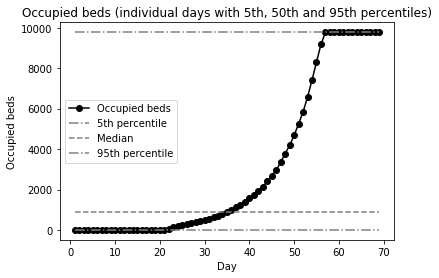

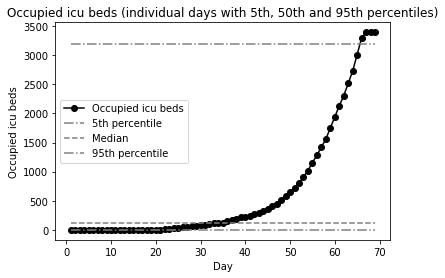

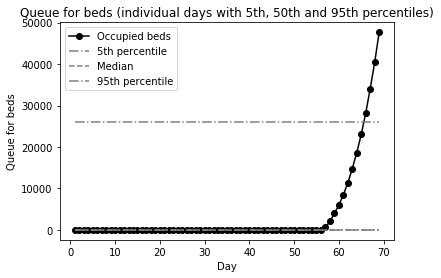

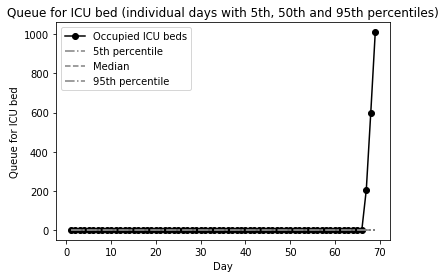

In [75]:
model.hospital.chart()